In [1]:
#Import module
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from scipy import stats
import scipy.optimize as optimization  
import pandas as pd
#Latex font
import matplotlib as mpl
from matplotlib import rc
plt.rc('text', usetex=True)
plt.rc('font', family='serif',size=16)

In [2]:
ls

2022_Feb_week4_Linear_fit_period.dat
2022_Feb_week4_Linear_fit_period.ipynb
2022_Feb_week4_Linear_fit_period_Sine_fit.py
2022_Feb_week4_Linear_fit_period_weighted_data.ipynb
2022_Feb_week4_Mean_calculation_T0_combined.txt
2022_Feb_week4_OC_diagram.jpg
2022_Feb_week4_OC_diagram.out
2022_Feb_week4_new_ephemeris_sin_fit.ipynb
2022_Feb_week4_new_ephemeris_sin_fit.out
2022_Feb_week4_new_ephemeris_sin_fit_mean_data.ipynb
2022_Feb_week4_new_ephemeris_sin_fit_weight_data.txt
interporate.out


In [3]:
DP_Leo = open("2022_Feb_week4_Linear_fit_period.dat",'r').readlines()
N_dpleo = len(DP_Leo)

#Read datat
Cycle = []
T_obs = []
T_obs_err = []
#Please change the input file
for line in open("2022_Feb_week4_Linear_fit_period.dat"):
    li=line.strip()
    if not li.startswith("#"):
        Cycle.append(float(li.split("\t")[0]))
        T_obs.append(float(li.split("\t")[1]))
        T_obs_err.append(float(li.split("\t")[2]))

In [4]:
T0_bjd = 2448773.2148535196
T0_bjd_err = 2.9382757275464414e-09
P0_day = 0.062362845501702645
P0_day_err = 2.587983620097543e-19

In [5]:
#Arrays
BJD_time_a = [i for i in range(N_dpleo)]
Delta_aT = [i for i in range(N_dpleo)]
Delta_aT_err = [i for i in range(N_dpleo)]
E_af = [i for i in range(N_dpleo)] #float number
E_ak = [i for i in range(N_dpleo)] #integer number
E_aj = [i for i in range(N_dpleo)] #integer number
P_aE = [i for i in range(N_dpleo)]
P_err_aE = [i for i in range(N_dpleo)]
T_aC_linear = [i for i in range(N_dpleo)]
T_aO_linear = [i for i in range(N_dpleo)]
P_aver_a = [i for i in range(N_dpleo)]
P_aver_std_a = [i for i in range(N_dpleo)]

In [6]:
delta_tdb_tt = 0.0013/(24*60*60)
OC_cal = []
#print ('-----------------------------------------------------------------------------')
#print ('Cycle \t\t T_O \t   T_C \t\t BJD - 2450000 \t OC_lin OC_err_Lin OC_occ')
print('No. \t BJD_time \t Cycle \t T_O_linear \t T_C_linear \t OC_s \t\t OC_s_err')
#print ('-----------------------------------------------------------------------------')
for i in range (0,N_dpleo):
    BJD_time = np.array(T_obs)+delta_tdb_tt
    BJD_time_a[i] = BJD_time
    Delta_T = np.array(T_obs) - np.array(T0_bjd)
    Delta_aT[i] = Delta_T #arrays
    Delta_T_err = np.sqrt((np.array(T_obs_err)/np.array(T_obs))**2 + (np.array(T0_bjd_err)/np.array(T0_bjd))**2)
    E_k = Cycle
    E_ak[i] = E_k #arrays
    #    print (Delta_T_err[i])
    E_f = Delta_T / P0_day                      #Calculate cycle with float number
    ##    print (E_f)                                 #print cycle with float number
    E_af[i] = E_f #arrays
    E_j = np.round(Delta_T / P0_day)           #Calculate cycle with integer number
##print (Delta_T)
    if  E_j[i] != 0:
        P_E_day = Delta_T[i] / E_j[i]
        P_aE[i] = P_E_day
        P_E_err_day = np.abs((np.array(T_obs_err[i]) - np.array(T0_bjd_err)) / E_j[i])
        P_err_aE[i] = P_E_err_day
        T_O_linear = T0_bjd + P_aE[i]*E_j[i]               #Linear
        T_aO_linear[i] = T_O_linear #arrays
    else:
        E_k[i] = 1
        P_E_day = Delta_T[i] / E_k[i]
#        print (P_E_day)
        P_aE[i] = P_E_day
        P_E_err_day = np.abs((np.array(T_obs_err[i]) - np.array(T0_bjd_err)) / E_k[i])
        P_err_aE[i] = P_E_err_day
        T_O_linear = T0_bjd + P_aE[i]*E_k[i]               #Linear
        T_aO_linear[i] = T_O_linear #arrays
#    print ('%0.6f' %(T_O))
#print (E_j)                                #print cycle with integer number
    if  E_j[i] != 0:
        P_E_day = Delta_T[i] / E_j[i]
        P_aE[i] = P_E_day
        P_E_err_day = np.abs((np.array(T_obs_err[i]) - np.array(T0_bjd_err)) / E_j[i])
#        print (P_E_err_day)
        P_err_aE[i] = P_E_err_day
        T_C_linear = T0_bjd + P0_day*E_j[i]              #Linear
        T_aC_linear[i] = T_C_linear #arrays
#    print (T_O, T_C)
        OC = np.array(T_O_linear) - np.array(T_C_linear)
        OC_s = (np.array(T_O_linear) - np.array(T_C_linear))*24*60*60
        OC_err = np.abs(np.sqrt((np.array(P_err_aE[i])**2 + (np.array(P0_day_err)**2))) * np.array(E_j[i]))
#        print (OC_err)
        OC_s_err = OC_err*24*60*60
    else:
        P_E_day = Delta_T[i] / E_k[i]
        P_aE[i] = P_E_day
        P_E_err_day = np.abs((np.array(T_obs_err[i]) - np.array(T0_bjd_err)) / E_k[i])
        P_err_aE[i] = P_E_err_day
        T_C_linear = T0_bjd + P0_day*E_j[i]              #Linear
        T_aC_linear[i] = T_C_linear #arrays
#    print (T_O, T_C)
        OC = np.array(T_O_linear) - np.array(T_C_linear)
        OC_s = (np.array(T_O_linear) - np.array(T_C_linear))*24*60*60
        OC_err = np.abs(np.sqrt((np.array(P_err_aE[i])**2)) *np.array(E_k[i]))
#        print (OC_err)
        OC_s_err = OC_err*24*60*60
    print ('%0.0f\t%0.6f\t%0.0f\t%0.6f\t%0.6f\t%0.6f\t%0.6f' %(i, BJD_time[i], Cycle[i], T_O_linear, T_C_linear, OC_s, OC_s_err))
    OC_cal.append('%0.6f\t%0.0f\t%0.6f\t%0.6f\t%0.6f\t%0.6f' %(BJD_time[i], Cycle[i], T_O_linear, T_C_linear, OC_s, OC_s_err))

#P_aver = mean(P_aE[i])
#P_aver_a[i] = P_aver
#P_aver_std = np.std(P_aE[i])
#P_aver_std = mean(P_err_aE[i])
#P_aver_std_a[i] = P_aver_std
#print('%0.11f %0.11f' %(P_aver, P_aver_std))

rerults = OC_cal
f = open("2022_Feb_week4_OC_diagram.out", 'w')
for i in range(len(rerults)):
    f.write(str(rerults[i])+ '\n')
f.close()

No. 	 BJD_time 	 Cycle 	 T_O_linear 	 T_C_linear 	 OC_s 		 OC_s_err
0	2444214.553250	-73099	2444214.553250	2444214.553210	3.439531	14.687746
1	2444214.615620	-73098	2444214.615620	2444214.615573	4.057673	14.687746
2	2444214.677980	-73097	2444214.677980	2444214.677936	3.811848	14.687746
3	2444968.023090	-61017	2444968.023090	2444968.021110	171.111524	100.223746
4	2444968.957120	-61002	2444968.957120	2444968.956552	49.055779	100.223746
5	2444969.019620	-61001	2444969.019620	2444969.018915	60.905926	100.223746
6	2444978.997550	-60841	2444978.997550	2444978.996970	50.081724	100.223746
7	2444993.900780	-60602	2444993.900780	2444993.901690	-78.660768	59.615746
8	2444993.963280	-60601	2444993.963280	2444993.964053	-66.810621	59.615746
9	2444994.026420	-60600	2444994.026420	2444994.026416	0.335544	59.615746
10	2445020.905130	-60169	2445020.905130	2445020.904803	28.293590	19.871746
11	2445021.902920	-60153	2445021.902920	2445021.902608	26.951976	19.871746
12	2445024.833860	-60106	2445024.833860

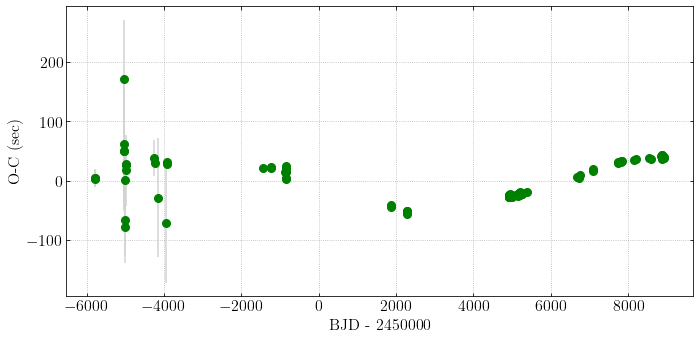

In [7]:
#Plot O-C vs BJD
Input  = '2022_Feb_week4_OC_diagram.out'
Data   = np.genfromtxt(Input)

N = 2450000
BJD_time = Data[:,0] - N
Cycle = Data[:,1]
T_O_linear = Data[:,2]
T_C_linear = Data[:,3]
OC_s = Data[:,4]
OC_s_err = Data[:,5]

 ##Plotgraph
fig=plt.figure(figsize=(10, 5), tight_layout=True)
plt.tick_params(direction='in', which='both', bottom='on',top='on', right = 'on')

x1 = min(BJD_time)
x2 = max(BJD_time)
#plt.errorbar(BJD_time, OC_s, yerr=OC_s_err, fmt='o', color='limegreen')
plt.errorbar(BJD_time, OC_s, yerr= OC_s_err, fmt='o', markersize=8, color='green',
                    ecolor='lightgray')

#Schwope_2002
#plt.text(BJD_time_Schwope_2002[0], 300, '1979')
#plt.text(BJD_time_Schwope_2002[3], 300, '1981')
#plt.text(BJD_time_Schwope_2002[13], 300, '1984')
#plt.text(BJD_time_Schwope_2002[17], 300, '1985')
#plt.text(BJD_time_Schwope_2002[19]-100, 300, '1991')
#plt.text(BJD_time_Schwope_2002[20], 300, '1992')
#plt.text(BJD_time_Schwope_2002[22], 300, '1993')
#plt.text(BJD_time_Schwope_2002[30], 300, '2000')
#plt.text(BJD_time_Schwope_2002[32], 300, '2002')

#plt.hlines(y= 0, xmin= x1, xmax= x2, colors='k', linestyles='dotted')
#plt.xlim(x1,x2)
#plt.ylim(-20,20)
plt.xlabel('BJD - 2450000')
plt.ylabel('O-C (sec)')
#plt.legend()
plt.grid(linestyle='dotted')
######plt.title('O-C diagram: DP Leo')
#output_filename = os.path.splitext(__file__)[0] + '.png'
#plt.savefig(output_filename, dpi=1000)
plt.savefig("2022_Feb_week4_OC_diagram.jpg", dpi=1000)
plt.show()

In [8]:
#Read data ---#1
Input = "2022_Feb_week4_OC_diagram.out"
Data   = np.genfromtxt(Input)

Epoch = Data[:,1]
OC = Data[:,4]
OC_err = Data[:,5]

In [9]:
x = Epoch
y = OC
dy = OC_err

len_x = len(x)
print(len_x)

114


In [10]:
def sin_fit(x, a, b, c, d):
    return a*np.sin(b*x - c) + d

In [11]:
guess = [41.9455, 0.0000324289, -145.235, -5.46613]
params, params_covariance = optimization.curve_fit(sin_fit, x, y, guess)

a = params[0]
b = params[1]
c = params[2]
d = params[3]


da = params_covariance[0,0]
db = params_covariance[1,1]
dc = params_covariance[2,2]
dd = params_covariance[3,3]

output_fit = sin_fit(x, a, b, c, d)


print("The parameters of egress part")
print("a =", a, "+/-", da**0.5)
print("b =", b, "+/-", db**0.5)
print("c =", c, "+/-", dc**0.5)
print("d =", d, "+/-", dd**0.5)

The parameters of egress part
a = 41.94539224675282 +/- 4.123434009600132
b = 3.242887257639048e-05 +/- 1.155402545288002e-06
c = -147.04808571101455 +/- 0.10428830264532697
d = -5.465967328637454 +/- 3.425991876096347


In [12]:
x_min, x_max = np.amin(x), np.amax(x)
x_line = np.linspace(x_min, x_max, len_x)
y_line = sin_fit(x_line, *params)
Res = y - y_line
#print(Res)

len_y_line = len(y_line)
print(len_y_line)

np.savetxt('2022_Feb_week4_new_ephemeris_sin_fit.out', np.c_[x_line, y_line, y, dy], fmt="%.5f")

#Reduced_chisqrt
m = 4
dof = len_x - m
Chi_sqr = ((y - y_line)**2/(dy)**2)/dof
Reduced_chisq = sum(Chi_sqr)
print(Reduced_chisq)

114
238.50681270406787


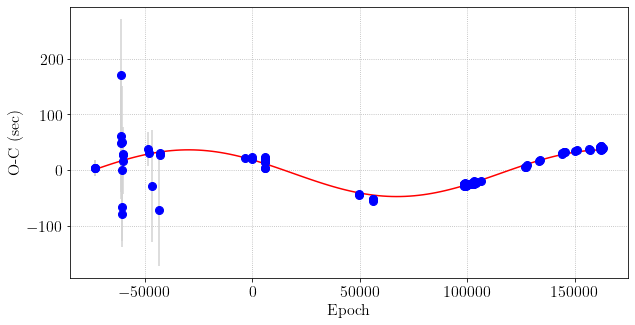

In [13]:
#Plotgraph
fig=plt.figure(figsize=(10, 5))
plt.errorbar(x, y, yerr= dy, fmt='o', markersize=8, color='blue', ecolor='lightgray')
# create a line plot for the mapping function
plt.plot(x_line, y_line, '-', color='red')
#plt.plot(BJD_time, OC_s_ecc, lw=2, color='black')
#plt.xlim(-6000,6000)
#plt.ylim(-200,200)
#plt.ylim(-40,60)
plt.xlabel('Epoch')
plt.ylabel('O-C (sec)')
plt.grid(linestyle='dotted')
#####plt.title('O-C diagram: DP Leo')
#output_filename = os.path.splitext(__file__)[0] + '.png'
#plt.savefig(output_filename, dpi=1000)
plt.show()

#### Interporate output

In [14]:
N = 300000
x_range = [i for i in range(N)]
y_range = [i for i in range(len(x_range))]
step=1
#step

interporate = []
for i in range(-200000, N):
    x_range[i] = i*step
    y_range[i] = sin_fit(x_range[i], a, b, c, d)
    print(x_range[i], y_range[i])
    interporate.append('%0.0f %0.2f %0.2f' %(i, x_range[i], y_range[i]))
    
data_out = interporate
f = open("interporate.out", 'w')
for i in range(len(data_out)):
    f.write(str(data_out[i])+ '\n')
f.close()

-200000 24.895974822365183
-199999 24.89503628972764
-199998 24.894097725162325
-199997 24.893159128669403
-199996 24.892220500249856
-199995 24.89128183990467
-199994 24.890343147634844
-199993 24.889404423440524
-199992 24.88846566732436
-199991 24.88752687928651
-199990 24.886588059327963
-199989 24.885649207449703
-199988 24.884710323652715
-199987 24.883771407937992
-199986 24.8828324603057
-199985 24.881893480758468
-199984 24.880954469296455
-199983 24.880015425920657
-199982 24.87907635063206
-199981 24.878137243431652
-199980 24.87719810432042
-199979 24.876258933298526
-199978 24.87531973036861
-199977 24.874380495530826
-199976 24.873441228786174
-199975 24.87250193013563
-199974 24.871562599580194
-199973 24.870623237120842
-199972 24.86968384275775
-199971 24.868744416493538
-199970 24.867804958328385
-199969 24.86686546826327
-199968 24.865925946299193
-199967 24.86498639243712
-199966 24.86404680667724
-199965 24.863107189022166
-199964 24.862167539472082
-199963 24.8612

-199367 24.295538798265788
-199366 24.29458025366592
-199365 24.29362167776891
-199364 24.292663070575777
-199363 24.291704432087524
-199362 24.29074576230431
-199361 24.289787061228843
-199360 24.288828328861268
-199359 24.287869565202605
-199358 24.286910770253865
-199357 24.285951944016052
-199356 24.284993086490175
-199355 24.284034197676405
-199354 24.283075277577424
-199353 24.282116326193407
-199352 24.28115734352536
-199351 24.280198329574294
-199350 24.279239284341205
-199349 24.278280207826285
-199348 24.277321100032204
-199347 24.276361960959136
-199346 24.27540279060808
-199345 24.274443588980063
-199344 24.27348435607609
-199343 24.272525091897155
-199342 24.27156579644344
-199341 24.27060646971763
-199340 24.26964711171989
-199339 24.268687722451244
-199338 24.26772830191268
-199337 24.26676885010522
-199336 24.265809367029874
-199335 24.264849852686794
-199334 24.263890307078693
-199333 24.262930730205728
-199332 24.26197112206891
-199331 24.261011482669243
-199330 24.26

-198867 23.81238314037008
-198866 23.811409073636867
-198865 23.810434976113783
-198864 23.80946084780355
-198863 23.808486688706353
-198862 23.807512498823208
-198861 23.80653827815514
-198860 23.805564026703177
-198859 23.804589744467485
-198858 23.803615431450805
-198857 23.802641087653296
-198856 23.80166671307599
-198855 23.80069230771991
-198854 23.799717871586083
-198853 23.798743404675527
-198852 23.797768906988416
-198851 23.796794378527487
-198850 23.795819819292912
-198849 23.794845229285706
-198848 23.7938706085069
-198847 23.792895956957523
-198846 23.791921274638593
-198845 23.790946561550285
-198844 23.78997181769533
-198843 23.7889970430739
-198842 23.788022237687017
-198841 23.787047401535713
-198840 23.786072534621006
-198839 23.78509763694307
-198838 23.784122708504643
-198837 23.78314774930589
-198836 23.782172759347837
-198835 23.78119773863151
-198834 23.780222687157934
-198833 23.779247604928138
-198832 23.778272491942285
-198831 23.777297348203124
-198830 23.776

-198118 23.074254224096272
-198117 23.073257385590676
-198116 23.07226051707232
-198115 23.07126361854226
-198114 23.070266690000672
-198113 23.06926973145034
-198112 23.068272742891452
-198111 23.067275724325043
-198110 23.066278675752173
-198109 23.065281597173886
-198108 23.06428448859123
-198107 23.063287350004384
-198106 23.062290181416138
-198105 23.06129298282667
-198104 23.06029575423703
-198103 23.059298495648267
-198102 23.058301207061426
-198101 23.05730388847668
-198100 23.056306539896838
-198099 23.05530916132206
-198098 23.054311752753403
-198097 23.053314314191915
-198096 23.052316845638643
-198095 23.051319347094633
-198094 23.05032181856007
-198093 23.049324260037746
-198092 23.048326671527832
-198091 23.047329053031383
-198090 23.046331404549445
-198089 23.045333726083065
-198088 23.044336017633295
-198087 23.04333827920031
-198086 23.042340510786914
-198085 23.041342712393266
-198084 23.04034488402043
-198083 23.03934702566945
-198082 23.038349137341378
-198081 23.03

-197618 22.572112670419752
-197617 22.57110095696646
-197616 22.570089214029384
-197615 22.569077441608698
-197614 22.568065639705466
-197613 22.56705380832076
-197612 22.566041947455638
-197611 22.56503005711027
-197610 22.564018137287512
-197609 22.56300618798752
-197608 22.56199420921137
-197607 22.560982200960133
-197606 22.559970163234862
-197605 22.55895809603662
-197604 22.557945999365593
-197603 22.55693387322461
-197602 22.555921717613863
-197601 22.5549095325344
-197600 22.553897317987293
-197599 22.552885073973606
-197598 22.551872800494408
-197597 22.55086049754987
-197596 22.549848165142834
-197595 22.54883580327347
-197594 22.54782341194285
-197593 22.546810991152043
-197592 22.5457985409021
-197591 22.544786061193218
-197590 22.54377355202822
-197589 22.542761013407286
-197588 22.541748445331482
-197587 22.54073584780188
-197586 22.539723220819532
-197585 22.538710564385514
-197584 22.537697878499998
-197583 22.536685163165828
-197582 22.53567241838318
-197581 22.5346596

-196692 21.622779751300456
-196691 21.62174119477312
-196690 21.620702609760393
-196689 21.619663996262467
-196688 21.618625354280432
-196687 21.61758668381538
-196686 21.616547984868397
-196685 21.61550925743967
-196684 21.614470501532114
-196683 21.613431717145907
-196682 21.61239290428215
-196681 21.611354062941924
-196680 21.61031519312633
-196679 21.60927629483645
-196678 21.60823736807248
-196677 21.607198412837324
-196676 21.606159429131164
-196675 21.6051204169551
-196674 21.604081376310212
-196673 21.60304230719761
-196672 21.60200320961746
-196671 21.600964083572688
-196670 21.599924929063466
-196669 21.598885746090893
-196668 21.597846534656064
-196667 21.596807294760062
-196666 21.59576802640399
-196665 21.594728729588027
-196664 21.593689404315086
-196663 21.592650050585352
-196662 21.591610668399912
-196661 21.590571257759866
-196660 21.58953181866631
-196659 21.58849235112032
-196658 21.587452855122095
-196657 21.586413330674546
-196656 21.585373777777853
-196655 21.5843

-196214 21.123122029016912
-196213 21.122069981095944
-196212 21.121017905214156
-196211 21.119965801372647
-196210 21.11891366957252
-196209 21.117861509813977
-196208 21.116809322099947
-196207 21.115757106430625
-196206 21.11470486280712
-196205 21.113652591230537
-196204 21.112600291701977
-196203 21.111547964222556
-196202 21.110495608792448
-196201 21.109443225414612
-196200 21.10839081408923
-196199 21.107338374817406
-196198 21.106285907600252
-196197 21.105233412438867
-196196 21.10418088933437
-196195 21.103128338286936
-196194 21.10207575929952
-196193 21.101023152372303
-196192 21.099970517506396
-196191 21.098917854702904
-196190 21.097865163962933
-196189 21.096812445287593
-196188 21.09575969867707
-196187 21.09470692413431
-196186 21.093654121659505
-196185 21.092601291253754
-196184 21.09154843291817
-196183 21.09049554665386
-196182 21.089442632461004
-196181 21.088389690342556
-196180 21.087336720298705
-196179 21.086283722330556
-196178 21.085230696439215
-196177 21

-195369 20.22428246407797
-195368 20.223207186711473
-195367 20.22213188232943
-195366 20.221056550932964
-195365 20.219981192523203
-195364 20.218905807101283
-195363 20.217830394667395
-195362 20.216754955224552
-195361 20.215679488772942
-195360 20.21460399531369
-195359 20.213528474847937
-195358 20.212452927376816
-195357 20.211377352901444
-195356 20.21030175142202
-195355 20.20922612294156
-195354 20.20815046746025
-195353 20.20707478497922
-195352 20.205999075499605
-195351 20.204923339022535
-195350 20.203847575548195
-195349 20.202771785079605
-195348 20.20169596761696
-195347 20.200620123161375
-195346 20.199544251714
-195345 20.198468353275953
-195344 20.197392427848367
-195343 20.196316475431438
-195342 20.195240496028177
-195341 20.194164489638773
-195340 20.193088456264363
-195339 20.192012395906072
-195338 20.190936308565036
-195337 20.18986019424238
-195336 20.188784052938303
-195335 20.187707884655815
-195334 20.186631689395107
-195333 20.18555546715731
-195332 20.184

-194869 19.683297081087858
-194868 19.68220843760082
-194867 19.681119767666207
-194866 19.680031071287075
-194865 19.678942348463607
-194864 19.677853599196958
-194863 19.676764823488266
-194862 19.675676021338678
-194861 19.674587192749335
-194860 19.673498337720435
-194859 19.67240945625503
-194858 19.671320548353307
-194857 19.670231614016416
-194856 19.669142653245498
-194855 19.6680536660417
-194854 19.666964652406165
-194853 19.665875612339086
-194852 19.66478654584352
-194851 19.66369745291965
-194850 19.662608333568627
-194849 19.661519187791598
-194848 19.660430015589704
-194847 19.65934081696409
-194846 19.65825159191495
-194845 19.65716234044534
-194844 19.656073062555446
-194843 19.65498375824642
-194842 19.6538944275194
-194841 19.65280507037554
-194840 19.65171568681502
-194839 19.650626276840903
-194838 19.64953684045338
-194837 19.64844737765359
-194836 19.64735788844269
-194835 19.646268372821815
-194834 19.645178830792112
-194833 19.64408926235378
-194832 19.64299966

-193926 18.64512032988287
-193925 18.64400725956921
-193924 18.642894163900735
-193923 18.641781042878616
-193922 18.64066789650402
-193921 18.63955472477812
-193920 18.63844152770111
-193919 18.637328305276117
-193918 18.636215057503332
-193917 18.635101784383924
-193916 18.633988485919065
-193915 18.632875162109933
-193914 18.63176181295671
-193913 18.63064843846253
-193912 18.62953503862758
-193911 18.628421613453035
-193910 18.627308162940064
-193909 18.62619468708984
-193908 18.625081185903532
-193907 18.623967659381336
-193906 18.622854107526376
-193905 18.621740530338847
-193904 18.620626927819917
-193903 18.619513299970755
-193902 18.618399646792543
-193901 18.617285968285465
-193900 18.61617226445265
-193899 18.615058535294292
-193898 18.61394478081156
-193897 18.61283100100563
-193896 18.61171719587767
-193895 18.61060336542885
-193894 18.609489509659372
-193893 18.608375628572354
-193892 18.607261722167983
-193891 18.606147790447448
-193890 18.605033833411913
-193889 18.6039

-193416 18.07418934294717
-193415 18.073063494193946
-193414 18.07193762068632
-193413 18.070811722425486
-193412 18.069685799412632
-193411 18.068559851647947
-193410 18.067433879134594
-193409 18.06630788187277
-193408 18.065181859863653
-193407 18.064055813108432
-193406 18.062929741608293
-193405 18.06180364536442
-193404 18.060677524377006
-193403 18.05955137864921
-193402 18.058425208181234
-193401 18.05729901297426
-193400 18.056172793029468
-193399 18.055046548348052
-193398 18.053920278931184
-193397 18.052793984779072
-193396 18.051667665894865
-193395 18.05054132227877
-193394 18.04941495393197
-193393 18.048288560855642
-193392 18.047162143050976
-193391 18.046035700518168
-193390 18.04490923326038
-193389 18.043782741277806
-193388 18.04265622457163
-193387 18.041529683143043
-193386 18.04040311699322
-193385 18.039276526123356
-193384 18.03814991053364
-193383 18.037023270227234
-193382 18.03589660520434
-193381 18.034769915466132
-193380 18.033643201013806
-193379 18.032

-192620 17.170280779012582
-192619 17.169135602551695
-192618 17.16799040228802
-192617 17.166845178221756
-192616 17.165699930354105
-192615 17.164554658686278
-192614 17.163409363219472
-192613 17.162264043954895
-192612 17.161118700892747
-192611 17.159973334036238
-192610 17.158827943385575
-192609 17.15768252894195
-192608 17.156537090706582
-192607 17.155391628680672
-192606 17.154246142864416
-192605 17.153100633261026
-192604 17.151955099870708
-192603 17.150809542694663
-192602 17.149663961734095
-192601 17.148518356990216
-192600 17.147372728464223
-192599 17.14622707615632
-192598 17.145081400069714
-192597 17.143935700204615
-192596 17.14278997656222
-192595 17.14164422914374
-192594 17.140498457950375
-192593 17.139352662983335
-192592 17.138206844242816
-192591 17.137061001732036
-192590 17.135915135451192
-192589 17.134769245401486
-192588 17.133623331584133
-192587 17.13247739400033
-192586 17.131331432651283
-192585 17.130185447537198
-192584 17.129039438661284
-192583

-192120 16.594748029686404
-192119 16.59359110208491
-192118 16.592434151284888
-192117 16.591277177287548
-192116 16.590120180093095
-192115 16.58896315970477
-192114 16.587806116122785
-192113 16.586649049348345
-192112 16.58549195938268
-192111 16.58433484622699
-192110 16.58317770988251
-192109 16.58202055034943
-192108 16.580863367631004
-192107 16.579706161727426
-192106 16.57854893263992
-192105 16.577391680369697
-192104 16.57623440491798
-192103 16.57507710628598
-192102 16.573919784473908
-192101 16.572762439485
-192100 16.571605071319468
-192099 16.57044767997852
-192098 16.56929026546338
-192097 16.568132827775262
-192096 16.56697536691437
-192095 16.56581788288395
-192094 16.564660375684205
-192093 16.563502845316354
-192092 16.562345291781607
-192091 16.56118771508119
-192090 16.560030115216318
-192089 16.55887249218719
-192088 16.55771484599705
-192087 16.556557176646116
-192086 16.555399484135588
-192085 16.5542417684667
-192084 16.553084029640655
-192083 16.55192626765

-191180 15.497166546052764
-191179 15.495988352115479
-191178 15.494810136133935
-191177 15.493631898109374
-191176 15.492453638042
-191175 15.491275355935116
-191174 15.49009705178893
-191173 15.48891872560468
-191172 15.487740377383606
-191171 15.486562007126949
-191170 15.485383614834912
-191169 15.4842052005108
-191168 15.483026764154822
-191167 15.481848305768217
-191166 15.480669825352223
-191165 15.479491322908078
-191164 15.478312798437024
-191163 15.477134251939269
-191162 15.475955683418114
-191161 15.474777092873769
-191160 15.47359848030747
-191159 15.472419845720456
-191158 15.471241189113972
-191157 15.470062510489253
-191156 15.468883809846506
-191155 15.467705087189039
-191154 15.466526342517056
-191153 15.4653475758318
-191152 15.464168787134508
-191151 15.462989976426414
-191150 15.461811143708768
-191149 15.46063228898177
-191148 15.459453412248727
-191147 15.458274513509853
-191146 15.457095592766375
-191145 15.455916650019542
-191144 15.45473768527059
-191143 15.45

-190625 14.839915139538835
-190624 14.838724902175048
-190623 14.837534643458199
-190622 14.836344363389543
-190621 14.835154061970329
-190620 14.833963739200769
-190619 14.8327733950842
-190618 14.831583029620827
-190617 14.830392642811908
-190616 14.829202234658691
-190615 14.828011805162433
-190614 14.826821354324377
-190613 14.825630882144736
-190612 14.82444038862685
-190611 14.823249873770926
-190610 14.822059337578217
-190609 14.820868780049977
-190608 14.81967820118745
-190607 14.818487600991897
-190606 14.817296979463524
-190605 14.816106336605667
-190604 14.814915672418536
-190603 14.813724986903388
-190602 14.812534280061467
-190601 14.811343551894034
-190600 14.810152802402332
-190599 14.808962031586578
-190598 14.807771239450105
-190597 14.806580425993126
-190596 14.805389591216887
-190595 14.80419873512265
-190594 14.803007857711659
-190593 14.801816958984126
-190592 14.800626038943395
-190591 14.799435097589669
-190590 14.7982441349242
-190589 14.79705315094824
-190588 1

-189871 13.93650380791211
-189870 13.935297827259404
-189869 13.934091826203709
-189868 13.93288580474524
-189867 13.931679762887377
-189866 13.93047370063033
-189865 13.929267617975373
-189864 13.928061514923765
-189863 13.926855391476785
-189862 13.925649247635693
-189861 13.924443083400707
-189860 13.923236898775205
-189859 13.9220306937594
-189858 13.92082446835456
-189857 13.919618222561951
-189856 13.918411956382847
-189855 13.91720566981746
-189854 13.915999362869165
-189853 13.914793035538178
-189852 13.913586687825767
-189851 13.912380319733202
-189850 13.911173931261754
-189849 13.909967522412682
-189848 13.908761093186211
-189847 13.907554643585712
-189846 13.906348173611406
-189845 13.905141683264553
-189844 13.90393517254643
-189843 13.9027286414583
-189842 13.901522090001432
-189841 13.900315518176043
-189840 13.899108925985512
-189839 13.897902313430048
-189838 13.896695680510927
-189837 13.895489027229416
-189836 13.894282353586778
-189835 13.893075659583229
-189834 13.

-189371 13.330994527671063
-189370 13.329778504182315
-189369 13.328562460927362
-189368 13.327346397907483
-189367 13.326130315123958
-189366 13.324914212578069
-189365 13.323698090270021
-189364 13.322481948203233
-189363 13.321265786377914
-189362 13.320049604795344
-189361 13.318833403456804
-189360 13.317617182363566
-189359 13.316400941516918
-189358 13.315184680917064
-189357 13.313968400567422
-189356 13.312752100468202
-189355 13.311535780620687
-189354 13.310319441026149
-189353 13.309103081685873
-189352 13.307886702601138
-189351 13.306670303772155
-189350 13.305453885202333
-189349 13.30423744689189
-189348 13.303020988842103
-189347 13.30180451105425
-189346 13.300588013529612
-189345 13.299371496268407
-189344 13.298154959274036
-189343 13.296938402546719
-189342 13.295721826087735
-189341 13.294505229898363
-189340 13.293288613979879
-189339 13.292071978333567
-189338 13.29085532295964
-189337 13.289638647861505
-189336 13.288421953039386
-189335 13.287205238494547
-189

-188371 12.105311169120466
-188370 12.10407602160156
-188369 12.102840855605436
-188368 12.101605671133399
-188367 12.100370468186739
-188366 12.099135246766764
-188365 12.097900006873683
-188364 12.096664748510968
-188363 12.095429471678827
-188362 12.094194176378561
-188361 12.092958862611475
-188360 12.091723530378868
-188359 12.09048817968203
-188358 12.089252810521185
-188357 12.088017422899796
-188356 12.086782016818074
-188355 12.085546592277328
-188354 12.08431114927885
-188353 12.083075687823943
-188352 12.081840207912819
-188351 12.08060470954895
-188350 12.079369192732546
-188349 12.07813365746491
-188348 12.076898103747336
-188347 12.07566253158113
-188346 12.074426940967587
-188345 12.07319133190693
-188344 12.071955704402615
-188343 12.070720058454864
-188342 12.069484394064975
-188341 12.068248711234247
-188340 12.06701300996398
-188339 12.065777290255475
-188338 12.064541552108949
-188337 12.063305795527864
-188336 12.062070020512436
-188335 12.060834227063971
-188334 1

-187871 11.485459325642964
-187870 11.484215101957691
-187869 11.482970860447072
-187868 11.481726601111315
-187867 11.480482323953918
-187866 11.479238028975097
-187865 11.477993716176158
-187864 11.47674938555841
-187863 11.475505037123163
-187862 11.474260670870638
-187861 11.47301628680432
-187860 11.471771884924426
-187859 11.47052746523227
-187858 11.469283027729155
-187857 11.468038572416397
-187856 11.466794099295296
-187855 11.465549608366079
-187854 11.464305099632227
-187853 11.463060573093966
-187852 11.461816028752601
-187851 11.460571466609437
-187850 11.459326886665792
-187849 11.458082288921876
-187848 11.45683767338118
-187847 11.45559304004393
-187846 11.454348388911427
-187845 11.453103719984984
-187844 11.451859033265904
-187843 11.450614328755503
-187842 11.449369606453995
-187841 11.448124866364875
-187840 11.446880108488354
-187839 11.445635332825752
-187838 11.444390539378364
-187837 11.44314572814751
-187836 11.441900899134495
-187835 11.440656052339538
-187834

-186622 9.917957046341
-186621 9.916691584525925
-186620 9.915426106535065
-186619 9.914160612368645
-186618 9.912895102027994
-186617 9.911629575514441
-186616 9.91036403282932
-186615 9.90909847397396
-186614 9.907832898948582
-186613 9.906567307756738
-186612 9.905301700398645
-186611 9.90403607687564
-186610 9.902770437189051
-186609 9.901504781340208
-186608 9.900239109330444
-186607 9.898973421159978
-186606 9.897707716832363
-186605 9.896441996347818
-186604 9.895176259707677
-186603 9.893910506913267
-186602 9.892644737965922
-186601 9.891378952865864
-186600 9.89011315161664
-186599 9.888847334218475
-186598 9.8875815006727
-186597 9.886315650980645
-186596 9.88504978514364
-186595 9.88378390316302
-186594 9.882518005039001
-186593 9.88125209077514
-186592 9.879986160371653
-186591 9.878720213829874
-186590 9.877454251151134
-186589 9.876188272336766
-186588 9.874922277388098
-186587 9.873656266305353
-186586 9.872390239092082
-186585 9.871124195748507
-186584 9.86985813627596

-185122 8.002328026879141
-185121 8.001039805150933
-185120 7.999751569260393
-185119 7.998463319208874
-185118 7.997175054996603
-185117 7.995886776627195
-185116 7.994598484100873
-185115 7.993310177418989
-185114 7.9920218565829035
-185113 7.99073352159397
-185112 7.989445172453541
-185111 7.988156809161843
-185110 7.98686843172249
-185109 7.985580040135707
-185108 7.984291634402849
-185107 7.983003214525274
-185106 7.98171478050433
-185105 7.980426332341381
-185104 7.979137870036645
-185103 7.977849393593738
-185102 7.976560903012887
-185101 7.975272398295445
-185100 7.97398387944277
-185099 7.972695346456215
-185098 7.971406799337133
-185097 7.970118238085757
-185096 7.968829662705691
-185095 7.967541073197168
-185094 7.966252469561539
-185093 7.964963851800162
-185092 7.963675219914391
-185091 7.9623865739044515
-185090 7.961097913773957
-185089 7.9598092395231355
-185088 7.95852055115334
-185087 7.957231848665925
-185086 7.9559431320622505
-185085 7.954654401343667
-185084 7.953

-183622 6.0548369941566875
-183621 6.053529060065635
-183620 6.052221113861464
-183619 6.050913155544398
-183618 6.049605185115812
-183617 6.048297202577087
-183616 6.046989207929595
-183615 6.045681201173565
-183614 6.044373182312668
-183613 6.043065151347129
-183612 6.041757108278327
-183611 6.040449053107636
-183610 6.039140985836431
-183609 6.03783290646609
-183608 6.03652481499684
-183607 6.03521671143235
-183606 6.03390859577285
-183605 6.032600468019712
-183604 6.0312923281743185
-183603 6.02998417623804
-183602 6.028676012212253
-183601 6.02736783609719
-183600 6.026059647896513
-183599 6.024751447610459
-183598 6.023443235240396
-183597 6.022135010787707
-183596 6.020826774253765
-183595 6.019518525638796
-183594 6.018210264946472
-183593 6.016901992177024
-183592 6.015593707331824
-183591 6.014285410412251
-183590 6.012977101419679
-183589 6.011668780355484
-183588 6.010360447219895
-183587 6.009052102016582
-183586 6.007743744745776
-183585 6.006435375408847
-183584 6.005126

-182122 4.080091137386763
-182121 4.078766585121336
-182120 4.077442022818367
-182119 4.076117450478083
-182118 4.0747928681042005
-182117 4.073468275696952
-182116 4.072143673257729
-182115 4.070819060787926
-182114 4.069494438288935
-182113 4.06816980576215
-182112 4.066845163207802
-182111 4.0655205106296055
-182110 4.064195848027795
-182109 4.062871175403762
-182108 4.0615464927588985
-182107 4.060221800094601
-182106 4.058897097412258
-182105 4.057572384712104
-182104 4.056247661997855
-182103 4.054922929269743
-182102 4.0535981865291575
-182101 4.052273433777497
-182100 4.050948671016151
-182099 4.049623898246514
-182098 4.048299115468817
-182097 4.046974322686776
-182096 4.045649519900625
-182095 4.044324707111754
-182094 4.042999884321558
-182093 4.041675051531431
-182092 4.040350208741602
-182091 4.03902535595579
-182090 4.037700493174224
-182089 4.036375620398301
-182088 4.035050737629412
-182087 4.03372584486895
-182086 4.03240094211831
-182085 4.03107602937772
-182084 4.029

-180623 2.084100151662355
-180622 2.0827621226585986
-180621 2.081424085717531
-180620 2.0800860408393866
-180619 2.078747988025574
-180618 2.0774099272774977
-180617 2.076071858596567
-180616 2.0747337819830145
-180615 2.0733956974405956
-180614 2.072057604969541
-180613 2.0707195045712616
-180612 2.0693813962471603
-180611 2.0680432799986495
-180610 2.0667051558271323
-180609 2.0653670237328443
-180608 2.0640288837195406
-180607 2.0626907357874513
-180606 2.0613525799379877
-180605 2.060014416172555
-180604 2.0586762444925597
-180603 2.05733806489941
-180602 2.055999877393341
-180601 2.0546616819781054
-180600 2.0533234786539367
-180599 2.0519852674222436
-180598 2.050647048284433
-180597 2.04930882124191
-180596 2.0479705862949125
-180595 2.0466323434471922
-180594 2.045294092698983
-180593 2.043955834051692
-180592 2.042617567506727
-180591 2.0412792930654966
-180590 2.0399410107294065
-180589 2.038602720498692
-180588 2.037264422377106
-180587 2.035926116364883
-180586 2.034587802

-179123 0.06892339154732952
-179122 0.06757504115050939
-179121 0.06622668493444195
-179120 0.0648783228993608
-179119 0.06352995504904779
-179118 0.06218158138374097
-179117 0.06083320190485697
-179116 0.05948481661381244
-179115 0.05813642551202847
-179114 0.05678802860092169
-179113 0.05543962588072748
-179112 0.054091217355227705
-179111 0.05274280302465861
-179110 0.051394382890439516
-179109 0.05004595695398706
-179108 0.04869752521672055
-179107 0.047349087680055746
-179106 0.046000644344232455
-179105 0.0446521952130281
-179104 0.04330374028668249
-179103 0.04195527956661227
-179102 0.04060681305423497
-179101 0.0392583407509699
-179100 0.037909862658233706
-179099 0.03656137877626531
-179098 0.035212889108843015
-179097 0.03386439365620486
-179096 0.032515892419770154
-179095 0.03116738540095465
-179094 0.029818872601178548
-179093 0.02847035402185849
-179092 0.027121829663230734
-179091 0.02577329952907803
-179090 0.024424763619637524
-179089 0.02307622193632497
-179088 0.021

-177703 -1.8509207973685822
-177702 -1.8522759798424113
-177701 -1.8536311661165135
-177700 -1.8549863561894626
-177699 -1.8563415500598341
-177698 -1.8576967477262025
-177697 -1.8590519491883315
-177696 -1.8604071544424188
-177695 -1.8617623634882285
-177694 -1.863117576324334
-177693 -1.8644727929493112
-177692 -1.8658280133617344
-177691 -1.867183237560178
-177690 -1.8685384655444062
-177689 -1.8698936973106162
-177688 -1.8712489328585713
-177687 -1.8726041721868474
-177686 -1.873959415294018
-177685 -1.875314662178658
-177684 -1.8766699128405304
-177683 -1.8780251672758341
-177682 -1.879380425484332
-177681 -1.8807356874645982
-177680 -1.8820909532152088
-177679 -1.883446222734737
-177678 -1.8848014960217583
-177677 -1.8861567730760354
-177676 -1.8875120538937673
-177675 -1.8888673384747166
-177674 -1.8902226268174576
-177673 -1.8915779189205648
-177672 -1.8929332147826146
-177671 -1.89428851440218
-177670 -1.8956438177790242
-177669 -1.896999124909346
-177668 -1.8983544357929087
-

-176373 -3.6561140918976984
-176372 -3.6574730678335445
-176371 -3.6588320456712604
-176370 -3.6601910254094174
-176369 -3.6615500070465865
-176368 -3.6629089905825287
-176367 -3.6642679760134333
-176366 -3.6656269633390623
-176365 -3.6669859525579866
-176364 -3.668344943668777
-176363 -3.669703936670004
-176362 -3.67106293156143
-176361 -3.6724219283392427
-176360 -3.6737809270032047
-176359 -3.6751399275518875
-176358 -3.6764989299838615
-176357 -3.677857934297697
-176356 -3.679216940491965
-176355 -3.680575948566428
-176354 -3.6819349585172736
-176353 -3.6832939703442644
-176352 -3.6846529840459716
-176351 -3.6860119996209653
-176350 -3.6873710170678167
-176349 -3.6887300363862874
-176348 -3.6900890575725667
-176347 -3.691448080626415
-176346 -3.6928071055464056
-176345 -3.694166132331107
-176344 -3.6955251609790905
-176343 -3.6968841914889277
-176342 -3.69824322386038
-176341 -3.6996022580896364
-176340 -3.700961294176458
-176339 -3.702320332119416
-176338 -3.7036793719170813
-1763

-174946 -5.596616851897511
-174945 -5.597977087010399
-174944 -5.599337321984462
-174943 -5.600697556818269
-174942 -5.60205779151039
-174941 -5.603418026059393
-174940 -5.604778260463849
-174939 -5.606138494723519
-174938 -5.607498728834589
-174937 -5.608858962796819
-174936 -5.61021919660878
-174935 -5.611579430269042
-174934 -5.612939663776173
-174933 -5.614299897129935
-174932 -5.615660130326513
-174931 -5.617020363365671
-174930 -5.618380596245976
-174929 -5.619740828965998
-174928 -5.621101061524308
-174927 -5.622461293919473
-174926 -5.623821526151257
-174925 -5.625181758215844
-174924 -5.6265419901129965
-174923 -5.627902221841284
-174922 -5.629262453399274
-174921 -5.630622684785539
-174920 -5.631982915998647
-174919 -5.63334314703836
-174918 -5.634703377900863
-174917 -5.636063608585918
-174916 -5.637423839092094
-174915 -5.6387840694179605
-174914 -5.640144299562087
-174913 -5.641504529524237
-174912 -5.642864759300594
-174911 -5.64422498889092
-174910 -5.6455852182937845
-1

-173624 -7.394176935720207
-173623 -7.395535738496799
-173622 -7.396894539244194
-173621 -7.398253337960966
-173620 -7.399612134645684
-173619 -7.4009709292969195
-173618 -7.402329721914435
-173617 -7.403688512494419
-173616 -7.4050473010366336
-173615 -7.406406087539651
-173614 -7.407764872002041
-173613 -7.409123654422375
-173612 -7.410482434799223
-173611 -7.41184121313235
-173610 -7.413199989417942
-173609 -7.414558763655762
-173608 -7.4159175358443825
-173607 -7.417276305982372
-173606 -7.418635074068304
-173605 -7.419993840100748
-173604 -7.421352604079467
-173603 -7.42271136600065
-173602 -7.424070125864057
-173601 -7.425428883668263
-173600 -7.426787639411836
-173599 -7.428146393093348
-173598 -7.429505144711371
-173597 -7.4308638942656655
-173596 -7.432222641752421
-173595 -7.433581387171401
-173594 -7.434940130521175
-173593 -7.4362988718003145
-173592 -7.43765761100739
-173591 -7.439016348142165
-173590 -7.440375083200829
-173589 -7.441733816183142
-173588 -7.443092547087676

-172124 -9.429298138919169
-172123 -9.43065229291085
-172122 -9.43200644273314
-172121 -9.433360588385804
-172120 -9.434714729865046
-172119 -9.436068867170627
-172118 -9.437423000301122
-172117 -9.43877712925511
-172116 -9.440131254031163
-172115 -9.441485374629046
-172114 -9.442839491044962
-172113 -9.444193603278672
-172112 -9.445547711328754
-172111 -9.446901815193781
-172110 -9.448255914872332
-172109 -9.449610010362981
-172108 -9.450964101665493
-172107 -9.452318188776069
-172106 -9.453672271694469
-172105 -9.455026350419274
-172104 -9.456380424949057
-172103 -9.457734495282395
-172102 -9.459088561417865
-172101 -9.460442623355227
-172100 -9.461796681090686
-172099 -9.463150734624003
-172098 -9.464504783953755
-172097 -9.465858829078519
-172096 -9.46721286999687
-172095 -9.468566906708569
-172094 -9.469920939209821
-172093 -9.471274967500388
-172092 -9.472628991578848
-172091 -9.473983011443774
-172090 -9.475337027093744
-172089 -9.476691038527333
-172088 -9.478045045744302
-1720

-170624 -11.455043270723163
-170623 -11.456389572401104
-170622 -11.457735867779324
-170621 -11.459082156856411
-170620 -11.460428439630949
-170619 -11.461774716102699
-170618 -11.463120986267889
-170617 -11.464467250126283
-170616 -11.465813507676462
-170615 -11.467159758917013
-170614 -11.468506003846517
-170613 -11.469852242463563
-170612 -11.471198474767913
-170611 -11.47254470075579
-170610 -11.473890920426959
-170609 -11.475237133780006
-170608 -11.476583340813512
-170607 -11.477929541526064
-170606 -11.479275735916247
-170605 -11.480621923983822
-170604 -11.481968105725016
-170603 -11.483314281139592
-170602 -11.484660450226137
-170601 -11.48600661298323
-170600 -11.487352769409458
-170599 -11.488698919503408
-170598 -11.49004506326484
-170597 -11.491391200689982
-170596 -11.492737331778596
-170595 -11.494083456529268
-170594 -11.495429574940582
-170593 -11.496775687011121
-170592 -11.498121792740651
-170591 -11.499467892125395
-170590 -11.500813985165117
-170589 -11.50216007185

-169125 -13.465284742977932
-169124 -13.466620015803302
-169123 -13.46795528021493
-169122 -13.469290536212586
-169121 -13.47062578379252
-169120 -13.471961022954503
-169119 -13.473296253697129
-169118 -13.47463147601899
-169117 -13.475966689918687
-169116 -13.477301895394815
-169115 -13.478637092447139
-169114 -13.479972281071914
-169113 -13.481307461268907
-169112 -13.482642633036715
-169111 -13.48397779637393
-169110 -13.485312951279152
-169109 -13.486648097752145
-169108 -13.487983235789164
-169107 -13.489318365389979
-169106 -13.49065348655318
-169105 -13.491988599277368
-169104 -13.493323703561137
-169103 -13.494658799403082
-169102 -13.495993886802971
-169101 -13.497328965757058
-169100 -13.49866403626511
-169099 -13.499999098325723
-169098 -13.501334151937494
-169097 -13.502669197099015
-169096 -13.504004233810058
-169095 -13.505339262066874
-169094 -13.506674281869232
-169093 -13.508009293215727
-169092 -13.509344296104954
-169091 -13.510679290535512
-169090 -13.51201427650599

-167625 -15.457948498245361
-167624 -15.459269577058299
-167623 -15.460590645361963
-167622 -15.46191170315496
-167621 -15.463232750435909
-167620 -15.464553787203414
-167619 -15.465874813457244
-167618 -15.467195829193699
-167617 -15.468516834412542
-167616 -15.469837829112386
-167615 -15.471158813291844
-167614 -15.472479786949522
-167613 -15.473800750085193
-167612 -15.47512170269515
-167611 -15.476442644779162
-167610 -15.47776357633584
-167609 -15.479084497363795
-167608 -15.480405407861639
-167607 -15.48172630782798
-167606 -15.48304719726259
-167605 -15.484368076161761
-167604 -15.485688944525265
-167603 -15.48700980235171
-167602 -15.488330649639709
-167601 -15.489651486387872
-167600 -15.49097231259481
-167599 -15.492293128260293
-167598 -15.493613933380615
-167597 -15.494934727955545
-167596 -15.496255511983694
-167595 -15.497576285463673
-167594 -15.498897048394094
-167593 -15.500217800773568
-167592 -15.50153854260186
-167591 -15.502859273875272
-167590 -15.504179994593569


-166375 -17.100643214329324
-166374 -17.101950075781915
-166373 -17.103256924997737
-166372 -17.10456376197541
-166371 -17.105870586714715
-166370 -17.107177399211977
-166369 -17.10848419946698
-166368 -17.109790987478334
-166367 -17.11109776324468
-166366 -17.112404526764635
-166365 -17.113711278037968
-166364 -17.115018017061026
-166363 -17.116324743833566
-166362 -17.117631458354218
-166361 -17.118938160621617
-166360 -17.12024485063438
-166359 -17.12155152839113
-166358 -17.12285819389164
-166357 -17.124164847132256
-166356 -17.125471488112737
-166355 -17.126778116831712
-166354 -17.12808473328781
-166353 -17.129391337479653
-166352 -17.13069792940587
-166351 -17.13200450906623
-166350 -17.13331107645707
-166349 -17.134617631578163
-166348 -17.135924174428126
-166347 -17.1372307050056
-166346 -17.138537223309196
-166345 -17.13984372933755
-166344 -17.141150223090428
-166343 -17.142456704564168
-166342 -17.143763173758543
-166341 -17.14506963067217
-166340 -17.14637607530369
-166339

-164875 -19.046409488330106
-164874 -19.047696457072625
-164873 -19.04898341153217
-164872 -19.050270351707386
-164871 -19.051557277596913
-164870 -19.052844189199405
-164869 -19.054131086513507
-164868 -19.05541796953899
-164867 -19.056704838272246
-164866 -19.057991692713053
-164865 -19.059278532860052
-164864 -19.060565358711894
-164863 -19.061852170267226
-164862 -19.063138967525816
-164861 -19.06442575048407
-164860 -19.065712519141748
-164859 -19.0669992734975
-164858 -19.068286013549972
-164857 -19.069572739297822
-164856 -19.070859450739682
-164855 -19.072146147875337
-164854 -19.073432830701172
-164853 -19.074719499216965
-164852 -19.07600615342136
-164851 -19.077292793313006
-164850 -19.07857941889055
-164849 -19.07986603015264
-164848 -19.081152627099048
-164847 -19.082439209726168
-164846 -19.083725778033767
-164845 -19.085012332020504
-164844 -19.086298871685024
-164843 -19.087585397025965
-164842 -19.08887190804311
-164841 -19.090158404732847
-164840 -19.09144488709495
-1

-163376 -20.958784395077835
-163375 -20.96004844281601
-163374 -20.96131247426012
-163373 -20.96257648940883
-163372 -20.96384048826192
-163371 -20.965104470815845
-163370 -20.966368437070386
-163369 -20.967632387024217
-163368 -20.968896320676
-163367 -20.970160238024413
-163366 -20.971424139069228
-163365 -20.97268802380691
-163364 -20.973951892237224
-163363 -20.975215744358856
-163362 -20.976479580170466
-163361 -20.97774339967073
-163360 -20.979007202858313
-163359 -20.980270989733
-163358 -20.981534760291247
-163357 -20.98279851453283
-163356 -20.984062252456418
-163355 -20.985325974060686
-163354 -20.986589679344306
-163353 -20.98785336830594
-163352 -20.989117040945377
-163351 -20.99038069725907
-163350 -20.991644337246797
-163349 -20.992907960907225
-163348 -20.99417156823903
-163347 -20.99543515924088
-163346 -20.99669873391145
-163345 -20.99796229225052
-163344 -20.99922583425454
-163343 -21.000489359923293
-163342 -21.001752869255448
-163341 -21.003016362249674
-163340 -21.

-161884 -22.825889216317293
-161883 -22.827127484503407
-161882 -22.828365734430886
-161881 -22.829603966099516
-161880 -22.830842179507993
-161879 -22.832080374655018
-161878 -22.833318551539286
-161877 -22.834556710159493
-161876 -22.835794850515427
-161875 -22.837032972603616
-161874 -22.838271076423837
-161873 -22.839509161974792
-161872 -22.84074722925518
-161871 -22.841985278263692
-161870 -22.843223308999036
-161869 -22.84446132146099
-161868 -22.845699315646083
-161867 -22.846937291554095
-161866 -22.84817524918373
-161865 -22.849413188533678
-161864 -22.850651109602648
-161863 -22.851889012390412
-161862 -22.853126896893507
-161861 -22.854364763111708
-161860 -22.85560261104372
-161859 -22.85684044068824
-161858 -22.858078252043967
-161857 -22.859316045109594
-161856 -22.86055381988491
-161855 -22.86179157636644
-161854 -22.863029314553966
-161853 -22.864267034446193
-161852 -22.86550473604181
-161851 -22.866742419339527
-161850 -22.867980084338033
-161849 -22.869217731037114


-160626 -24.368766189534995
-160625 -24.36998046664795
-160624 -24.371194723880844
-160623 -24.372408961232402
-160622 -24.37362317870134
-160621 -24.374837376287452
-160620 -24.376051553987335
-160619 -24.37726571180077
-160618 -24.37847984972648
-160617 -24.3796939677632
-160616 -24.380908065909637
-160615 -24.382122144165585
-160614 -24.38333620252764
-160613 -24.38455024099559
-160612 -24.385764259568155
-160611 -24.386978258244064
-160610 -24.388192237022032
-160609 -24.389406195900794
-160608 -24.390620134880123
-160607 -24.391834053956625
-160606 -24.393047953130083
-160605 -24.394261832399224
-160604 -24.395475691762766
-160603 -24.396689531219437
-160602 -24.397903350767958
-160601 -24.39911715040812
-160600 -24.400330930136512
-160599 -24.401544689952928
-160598 -24.40275842985609
-160597 -24.40397214984472
-160596 -24.405185849917544
-160595 -24.406399530074346
-160594 -24.40761319031172
-160593 -24.408826830629465
-160592 -24.41004045102629
-160591 -24.41125405150093
-16059

-159165 -26.1209640561818
-159164 -26.12214793771601
-159163 -26.123331797527523
-159162 -26.124515635615094
-159161 -26.12569945197748
-159160 -26.126883246613435
-159159 -26.12806701952275
-159158 -26.129250770702107
-159157 -26.1304345001513
-159156 -26.13161820786908
-159155 -26.132801893854214
-159154 -26.13398555810544
-159153 -26.135169200621522
-159152 -26.13635282140225
-159151 -26.137536420444313
-159150 -26.138719997747494
-159149 -26.139903553310546
-159148 -26.141087087132235
-159147 -26.14227059921131
-159146 -26.143454089546527
-159145 -26.14463755813768
-159144 -26.14582100498145
-159143 -26.14700443007763
-159142 -26.14818783342497
-159141 -26.14937121502223
-159140 -26.15055457486817
-159139 -26.151737912961536
-159138 -26.152921229302127
-159137 -26.154104523886623
-159136 -26.155287796714816
-159135 -26.156471047785463
-159134 -26.15765427709732
-159133 -26.158837484649137
-159132 -26.160020670440716
-159131 -26.161203834468733
-159130 -26.16238697673298
-159129 -26

-157877 -27.62735940784703
-157876 -27.62851428693637
-157875 -27.629669142718868
-157874 -27.630823975193312
-157873 -27.63197878435849
-157872 -27.63313357021319
-157871 -27.6342883327572
-157870 -27.63544307198729
-157869 -27.636597787903252
-157868 -27.637752480503877
-157867 -27.638907149787943
-157866 -27.64006179575425
-157865 -27.64121641840157
-157864 -27.642371017729705
-157863 -27.64352559373542
-157862 -27.644680146418505
-157861 -27.645834675777753
-157860 -27.646989181811946
-157859 -27.648143664519875
-157858 -27.649298123900323
-157857 -27.650452559953084
-157856 -27.651606972674927
-157855 -27.652761362065643
-157854 -27.653915728124023
-157853 -27.65507007084885
-157852 -27.656224390238915
-157851 -27.657378686293
-157850 -27.6585329590109
-157849 -27.65968720838938
-157848 -27.660841434428246
-157847 -27.661995637126267
-157846 -27.66314981648225
-157845 -27.664303972494963
-157844 -27.665458105164213
-157843 -27.666612214486765
-157842 -27.66776630046241
-157841 -27

-156481 -29.21633093931076
-156480 -29.21745211078943
-156479 -29.21857325729028
-156478 -29.219694378812136
-156477 -29.22081547535382
-156476 -29.221936546914147
-156475 -29.223057593492925
-156474 -29.22417861508701
-156473 -29.225299611696208
-156472 -29.22642058331933
-156471 -29.227541529955207
-156470 -29.228662451602663
-156469 -29.22978334826051
-156468 -29.230904219928558
-156467 -29.232025066603654
-156466 -29.233145888285613
-156465 -29.23426668497325
-156464 -29.235387456665393
-156463 -29.236508203360852
-156462 -29.237628925058456
-156461 -29.238749621758014
-156460 -29.23987029345637
-156459 -29.24099094015334
-156458 -29.24211156184773
-156457 -29.24323215853838
-156456 -29.244352730224097
-156455 -29.245473276904693
-156454 -29.24659379857702
-156453 -29.24771429524089
-156452 -29.24883476689512
-156451 -29.249955213538527
-156450 -29.251075635169936
-156449 -29.25219603178817
-156448 -29.25331640339303
-156447 -29.25443674998138
-156446 -29.25555707155302
-156445 -29

-155127 -30.711034918124422
-155126 -30.7121212006845
-155125 -30.713207456693972
-155124 -30.714293686152647
-155123 -30.715379889059374
-155122 -30.71646606541302
-155121 -30.71755221521244
-155120 -30.718638338456486
-155119 -30.71972443514498
-155118 -30.720810505274866
-155117 -30.721896548845955
-155116 -30.722982565857105
-155115 -30.724068556307177
-155114 -30.725154520195026
-155113 -30.726240457520465
-155112 -30.72732636828044
-155111 -30.728412252474776
-155110 -30.729498110102316
-155109 -30.730583941161925
-155108 -30.731669745652464
-155107 -30.732755523572784
-155106 -30.7338412749227
-155105 -30.734926999699166
-155104 -30.73601269790199
-155103 -30.73709836953003
-155102 -30.73818401458215
-155101 -30.739269633057198
-155100 -30.740355224954993
-155099 -30.741440790272488
-155098 -30.74252632900949
-155097 -30.74361184116486
-155096 -30.744697326737455
-155095 -30.74578278572613
-155094 -30.746868218129755
-155093 -30.74795362394813
-155092 -30.749039003178215
-155091

-153702 -32.23150535596275
-153701 -32.23255265988185
-153700 -32.23359993565235
-153699 -32.23464718327316
-153698 -32.23569440274318
-153697 -32.23674159406221
-153696 -32.237788757227335
-153695 -32.238835892238356
-153694 -32.239882999094185
-153693 -32.240930077793706
-153692 -32.24197712833583
-153691 -32.24302415071945
-153690 -32.244071144944385
-153689 -32.2451181110077
-153688 -32.246165048909205
-153687 -32.24721195864781
-153686 -32.2482588402224
-153685 -32.24930569363188
-153684 -32.25035251887607
-153683 -32.25139931595203
-153682 -32.252446084859585
-153681 -32.25349282559762
-153680 -32.25453953816505
-153679 -32.25558622256075
-153678 -32.25663287878365
-153677 -32.25767950683355
-153676 -32.25872610670751
-153675 -32.25977267840537
-153674 -32.260819221926
-153673 -32.26186573726831
-153672 -32.262912224431204
-153671 -32.263958683413584
-153670 -32.265005114215256
-153669 -32.2660515168333
-153668 -32.26709789126752
-153667 -32.26814423751682
-153666 -32.26919055558

-152378 -33.593061225993296
-152377 -33.59407030815918
-152376 -33.59507936074466
-152375 -33.59608838374956
-152374 -33.59709737717103
-152373 -33.59810634100893
-152372 -33.599115275262164
-152371 -33.60012417992969
-152370 -33.60113305501044
-152369 -33.60214190050425
-152368 -33.603150716408265
-152367 -33.60415950272234
-152366 -33.60516825944539
-152365 -33.60617698657636
-152364 -33.6071856841142
-152363 -33.608194352057836
-152362 -33.609202990407084
-152361 -33.61021159915914
-152360 -33.611220178313815
-152359 -33.61222872787005
-152358 -33.613237247826774
-152357 -33.61424573818293
-152356 -33.61525419893748
-152355 -33.61626263009021
-152354 -33.617271031638325
-152353 -33.618279403581624
-152352 -33.61928774591907
-152351 -33.62029605864958
-152350 -33.6213043417721
-152349 -33.62231259528558
-152348 -33.623320819189836
-152347 -33.62432901348204
-152346 -33.62533717816201
-152345 -33.6263453132287
-152344 -33.62735341868104
-152343 -33.62836149451797
-152342 -33.629369540

-150878 -35.07283960338253
-150877 -35.07380313963429
-150876 -35.07476664474951
-150875 -35.07573011872717
-150874 -35.07669356156627
-150873 -35.07765697326579
-150872 -35.078620353825556
-150871 -35.07958370324287
-150870 -35.08054702151756
-150869 -35.08151030864863
-150868 -35.08247356463504
-150867 -35.0834367894758
-150866 -35.08439998317073
-150865 -35.085363145717125
-150864 -35.086326277114836
-150863 -35.08728937736282
-150862 -35.08825244646009
-150861 -35.08921548440563
-150860 -35.0901784911984
-150859 -35.091141466838266
-150858 -35.09210441132252
-150857 -35.093067324650974
-150856 -35.09403020682264
-150855 -35.09499305783648
-150854 -35.09595587769151
-150853 -35.096918666386685
-150852 -35.09788142392186
-150851 -35.09884415029434
-150850 -35.099806845503934
-150849 -35.10076950954965
-150848 -35.10173214243046
-150847 -35.10269474414535
-150846 -35.103657314694175
-150845 -35.104619854074215
-150844 -35.105582362285304
-150843 -35.106544839326425
-150842 -35.1075072

-149378 -36.48257685588056
-149377 -36.483492566775695
-149376 -36.48440824505262
-149375 -36.485323890708756
-149374 -36.48623950374395
-149373 -36.48715508415725
-149372 -36.48807063194768
-149371 -36.488986147114275
-149370 -36.489901629656885
-149369 -36.49081707957294
-149368 -36.49173249686227
-149367 -36.492647881523936
-149366 -36.49356323355694
-149365 -36.494478552960345
-149364 -36.495393839733175
-149363 -36.49630909387528
-149362 -36.4972243153841
-149361 -36.498139504259456
-149360 -36.49905466050039
-149359 -36.49996978410595
-149358 -36.50088487507516
-149357 -36.50179993340707
-149356 -36.50271495910151
-149355 -36.50362995215592
-149354 -36.50454491257014
-149353 -36.50545984034321
-149352 -36.506374735474154
-149351 -36.507289597962014
-149350 -36.50820442780585
-149349 -36.50911922500548
-149348 -36.51003398955833
-149347 -36.51094872146427
-149346 -36.51186342072231
-149345 -36.5127780873315
-149344 -36.51369272129088
-149343 -36.514607322600284
-149342 -36.5155218

-147883 -37.81460885454702
-147882 -37.81547474389166
-147881 -37.816340599216545
-147880 -37.8172064205215
-147879 -37.81807220780411
-147878 -37.81893796106421
-147877 -37.81980368030091
-147876 -37.820669365513275
-147875 -37.821535016700416
-147874 -37.82240063386141
-147873 -37.82326621699611
-147872 -37.824131766102084
-147871 -37.824997281179186
-147870 -37.82586276222651
-147869 -37.826728209243136
-147868 -37.82759362222816
-147867 -37.82845900118142
-147866 -37.8293243461005
-147865 -37.83018965698525
-147864 -37.83105493383475
-147863 -37.8319201766481
-147862 -37.83278538542438
-147861 -37.83365056016269
-147860 -37.83451570086287
-147859 -37.835380807522505
-147858 -37.836245880141426
-147857 -37.83711091871874
-147856 -37.83797592325353
-147855 -37.83884089374489
-147854 -37.8397058301919
-147853 -37.84057073259442
-147852 -37.84143560095003
-147851 -37.84230043525856
-147850 -37.8431652355191
-147849 -37.84403000173076
-147848 -37.84489473389262
-147847 -37.8457594320045

-146629 -38.87341225435081
-146628 -38.87423477936652
-146627 -38.87505726924903
-146626 -38.87587972399747
-146625 -38.876702143611716
-146624 -38.87752452808944
-146623 -38.878346877430516
-146622 -38.87916919163408
-146621 -38.879991470699245
-146620 -38.88081371462517
-146619 -38.88163592341169
-146618 -38.88245809705653
-146617 -38.88328023555951
-146616 -38.88410233891979
-146615 -38.88492440713649
-146614 -38.88574644020876
-146613 -38.88656843813572
-146612 -38.88739040091724
-146611 -38.888212328551006
-146610 -38.88903422103689
-146609 -38.889856078373995
-146608 -38.89067790056149
-146607 -38.89149968759849
-146606 -38.89232143948415
-146605 -38.8931431562183
-146604 -38.893964837798656
-146603 -38.894786484225065
-146602 -38.89560809549667
-146601 -38.8964296716126
-146600 -38.89725121257199
-146599 -38.8980727183747
-146598 -38.898894189018435
-146597 -38.89971562450303
-146596 -38.90053702482764
-146595 -38.901358389991394
-146594 -38.90217971999343
-146593 -38.9030010148

-145318 -39.92125397178477
-145317 -39.92202970839317
-145316 -39.92280540876578
-145315 -39.9235810729025
-145314 -39.92435670080249
-145313 -39.925132292464944
-145312 -39.92590784788905
-145311 -39.92668336707398
-145310 -39.927458850019605
-145309 -39.92823429672376
-145308 -39.929009707186296
-145307 -39.92978508140639
-145306 -39.930560419383255
-145305 -39.93133572111605
-145304 -39.93211098660465
-145303 -39.93288621584688
-145302 -39.9336614088426
-145301 -39.934436565591
-145300 -39.935211686091264
-145299 -39.935986770342566
-145298 -39.93676181834411
-145297 -39.93753683009575
-145296 -39.93831180559531
-145295 -39.939086744842655
-145294 -39.93986164783698
-145293 -39.940636514577456
-145292 -39.94141134506327
-145291 -39.94218613929362
-145290 -39.94296089726836
-145289 -39.943735618985315
-145288 -39.94451030444436
-145287 -39.945284953644666
-145286 -39.94605956658543
-145285 -39.94683414326583
-145284 -39.94760868368506
-145283 -39.94838318784298
-145282 -39.9491576557

-143879 -40.999651183179424
-143878 -41.00037395251895
-143877 -41.001096684489355
-143876 -41.0018193790899
-143875 -41.00254203632044
-143874 -41.003264656178956
-143873 -41.003987238665324
-143872 -41.004709783778786
-143871 -41.005432291518574
-143870 -41.00615476188393
-143869 -41.00687719487409
-143868 -41.007599590488944
-143867 -41.00832194872645
-143866 -41.00904426958648
-143865 -41.00976655306829
-143864 -41.01048879917111
-143863 -41.011211007894175
-143862 -41.011933179236735
-143861 -41.012655313198664
-143860 -41.01337740977793
-143859 -41.014099468974415
-143858 -41.01482149078735
-143857 -41.01554347521598
-143856 -41.01626542225954
-143855 -41.01698733191729
-143854 -41.01770920418909
-143853 -41.01843103907291
-143852 -41.01915283656863
-143851 -41.01987459667549
-143850 -41.02059631939273
-143849 -41.021318004719596
-143848 -41.022039652655955
-143847 -41.02276126319979
-143846 -41.023482836350965
-143845 -41.024204372108734
-143844 -41.02492587047232
-143843 -41.02

-142535 -41.93702620602607
-142534 -41.93769808131246
-142533 -41.93836991824461
-142532 -41.93904171682064
-142531 -41.93971347704043
-142530 -41.94038519890326
-142529 -41.94105688240844
-142528 -41.94172852755525
-142527 -41.94240013434299
-142526 -41.94307170277155
-142525 -41.94374323283903
-142524 -41.944414724545325
-142523 -41.94508617788973
-142522 -41.94575759287153
-142521 -41.94642896949003
-142520 -41.94710030774451
-142519 -41.94777160763486
-142518 -41.9484428691592
-142517 -41.94911409231741
-142516 -41.94978527710878
-142515 -41.950456423532614
-142514 -41.95112753158819
-142513 -41.951798601274824
-142512 -41.952469632592376
-142511 -41.953140625538985
-142510 -41.95381158011452
-142509 -41.95448249631827
-142508 -41.955153374149546
-142507 -41.95582421360763
-142506 -41.956495014692415
-142505 -41.957165777402004
-142504 -41.957836501736296
-142503 -41.95850718769458
-142502 -41.959177835276144
-142501 -41.95984844448029
-142500 -41.96051901530632
-142499 -41.9611895

-141130 -42.84286188981064
-141129 -42.84347919843045
-141128 -42.84409646774288
-141127 -42.844713697747274
-141126 -42.845330888442994
-141125 -42.84594803982939
-141124 -42.84656515190581
-141123 -42.84718222467214
-141122 -42.847799258126656
-141121 -42.84841625226926
-141120 -42.84903320709929
-141119 -42.84965012261609
-141118 -42.85026699881903
-141117 -42.85088383570799
-141116 -42.85150063328124
-141115 -42.852117391538684
-141114 -42.85273411047966
-141113 -42.853350790103526
-141112 -42.853967430409625
-141111 -42.85458403139732
-141110 -42.855200593066506
-141109 -42.855817115415434
-141108 -42.856433598444006
-141107 -42.857050042151585
-141106 -42.85766644653751
-141105 -42.858282811601136
-141104 -42.85889913734235
-141103 -42.85951542375943
-141102 -42.860131670852276
-141101 -42.860747878620224
-141100 -42.86136404706263
-141099 -42.861980176178854
-141098 -42.862596265968236
-141097 -42.863212316430676
-141096 -42.86382832756445
-141095 -42.864444299369445
-141094 -42

-139674 -43.699701782816234
-139673 -43.700261193643584
-139672 -43.70082056426254
-139671 -43.701379894672506
-139670 -43.7019391848729
-139669 -43.70249843486313
-139668 -43.7030576446431
-139667 -43.703616814211244
-139666 -43.704175943567456
-139665 -43.704735032711156
-139664 -43.705294081641746
-139663 -43.70585309035865
-139662 -43.706412058861275
-139661 -43.70697098714952
-139660 -43.70752987522182
-139659 -43.708088723078085
-139658 -43.70864753071771
-139657 -43.70920629814013
-139656 -43.70976502534474
-139655 -43.71032371233095
-139654 -43.710882359098676
-139653 -43.71144096564634
-139652 -43.71199953197385
-139651 -43.71255805808062
-139650 -43.71311654396606
-139649 -43.713674989629574
-139648 -43.71423339507059
-139647 -43.714791760289
-139646 -43.71535008528325
-139645 -43.71590837005322
-139644 -43.716466614598346
-139643 -43.717024818918034
-139642 -43.717582983011695
-139641 -43.71814110687922
-139640 -43.71869919051906
-139639 -43.71925723393112
-139638 -43.719815

-138380 -44.38973521139087
-138379 -44.39024211574186
-138378 -44.3907489791584
-138377 -44.39125580164041
-138376 -44.39176258318735
-138375 -44.39226932379868
-138374 -44.39277602347387
-138373 -44.39328268221284
-138372 -44.39378930001417
-138371 -44.39429587687776
-138370 -44.39480241280309
-138369 -44.395308907789605
-138368 -44.395815361836796
-138367 -44.39632177494412
-138366 -44.39682814711149
-138365 -44.39733447833749
-138364 -44.397840768622025
-138363 -44.39834701796456
-138362 -44.39885322636458
-138361 -44.39935939382153
-138360 -44.399865520334885
-138359 -44.40037160590457
-138358 -44.40087765052914
-138357 -44.40138365420853
-138356 -44.4018896169422
-138355 -44.402395538729614
-138354 -44.40290141957024
-138353 -44.403407259463556
-138352 -44.403913058409465
-138351 -44.40441881640655
-138350 -44.40492453345472
-138349 -44.40543020955344
-138348 -44.405935844702185
-138347 -44.40644143890043
-138346 -44.40694699214807
-138345 -44.407452504443704
-138344 -44.407957975

-137031 -45.036119246444166
-137030 -45.03657046382429
-137029 -45.03702163959071
-137028 -45.03747277374295
-137027 -45.037923866280536
-137026 -45.038374917203
-137025 -45.03882592650986
-137024 -45.03927689420104
-137023 -45.039727820275274
-137022 -45.04017870473248
-137021 -45.040629547572195
-137020 -45.04108034879393
-137019 -45.04153110839722
-137018 -45.0419818263816
-137017 -45.042432502746976
-137016 -45.04288313749208
-137015 -45.04333373061685
-137014 -45.043784282120804
-137013 -45.044234792003465
-137012 -45.04468526026436
-137011 -45.04513568690342
-137010 -45.045586071919374
-137009 -45.04603641531213
-137008 -45.046486717081244
-137007 -45.04693697722622
-137006 -45.04738719574659
-137005 -45.04783737264187
-137004 -45.04828750791201
-137003 -45.048737601555715
-137002 -45.04918765357293
-137001 -45.049637663963175
-137000 -45.05008763272597
-136999 -45.05053755986084
-136998 -45.050987445367326
-136997 -45.05143728924534
-136996 -45.051887091493626
-136995 -45.052336

-135631 -45.626861748858786
-135630 -45.627254262453334
-135629 -45.62764673381299
-135628 -45.6280391629377
-135627 -45.628431549826345
-135626 -45.62882389447887
-135625 -45.62921619689486
-135624 -45.6296084570739
-135623 -45.63000067501558
-135622 -45.63039285071983
-135621 -45.63078498418555
-135620 -45.63117707541267
-135619 -45.631569124400784
-135618 -45.63196113114947
-135617 -45.632353095658324
-135616 -45.63274501792693
-135615 -45.63313689795522
-135614 -45.63352873574208
-135613 -45.63392053128747
-135612 -45.63431228459097
-135611 -45.63470399565215
-135610 -45.63509566447062
-135609 -45.63548729104595
-135608 -45.63587887537808
-135607 -45.636270417465916
-135606 -45.63666191730938
-135605 -45.63705337490807
-135604 -45.63744479026157
-135603 -45.637836163369464
-135602 -45.638227494231685
-135601 -45.638618782847146
-135600 -45.63901002921576
-135599 -45.63940123333713
-135598 -45.63979239521085
-135597 -45.64018351483649
-135596 -45.640574592213646
-135595 -45.64096562

-134204 -46.14381491380673
-134203 -46.14414675981978
-134202 -46.14447856305438
-134201 -46.14481032351014
-134200 -46.14514204118675
-134199 -46.14547371608414
-134198 -46.14580534820138
-134197 -46.1461369375384
-134196 -46.14646848409487
-134195 -46.14679998787042
-134194 -46.14713144886473
-134193 -46.147462867077714
-134192 -46.14779424250846
-134191 -46.148125575156904
-134190 -46.14845686502269
-134189 -46.148788112105485
-134188 -46.14911931640493
-134187 -46.14945047792068
-134186 -46.14978159665267
-134185 -46.15011267259999
-134184 -46.15044370576256
-134183 -46.15077469614005
-134182 -46.151105643732095
-134181 -46.15143654853836
-134180 -46.1517674105585
-134179 -46.15209822979244
-134178 -46.15242900623927
-134177 -46.15275973989891
-134176 -46.15309043077104
-134175 -46.153421078855295
-134174 -46.15375168415133
-134173 -46.15408224665909
-134172 -46.15441276637764
-134171 -46.154743243306925
-134170 -46.155073677446616
-134169 -46.15540406879634
-134168 -46.15573441735

-132881 -46.5453086555795
-132880 -46.545583617905876
-132879 -46.54585853703163
-132878 -46.546133412956706
-132877 -46.54640824568033
-132876 -46.54668303520246
-132875 -46.546957781522806
-132874 -46.54723248464108
-132873 -46.54750714455698
-132872 -46.54778176127023
-132871 -46.54805633478078
-132870 -46.54833086508786
-132869 -46.54860535219142
-132868 -46.54887979609118
-132867 -46.54915419678684
-132866 -46.54942855427811
-132865 -46.54970286856471
-132864 -46.549977139646586
-132863 -46.55025136752297
-132862 -46.550525552193825
-132861 -46.55079969365884
-132860 -46.55107379191775
-132859 -46.55134784697025
-132858 -46.55162185881606
-132857 -46.551895827455134
-132856 -46.5521697528867
-132855 -46.552443635110706
-132854 -46.552717474126865
-132853 -46.5529912699349
-132852 -46.55326502253451
-132851 -46.553538731925656
-132850 -46.55381239810757
-132849 -46.55408602108019
-132848 -46.55435960084324
-132847 -46.554633137396436
-132846 -46.55490663073948
-132845 -46.555180080

-131671 -46.846333077600484
-131670 -46.84655556910103
-131669 -46.84677801708424
-131668 -46.847000421550085
-131667 -46.847222782498314
-131666 -46.8474450999287
-131665 -46.847667373841006
-131664 -46.84788960423501
-131663 -46.848111791110654
-131662 -46.84833393446733
-131661 -46.84855603430499
-131660 -46.848778090623405
-131659 -46.84900010342235
-131658 -46.84922207270157
-131657 -46.849443998460856
-131656 -46.84966588070016
-131655 -46.849887719418845
-131654 -46.85010951461689
-131653 -46.850331266294056
-131652 -46.85055297445011
-131651 -46.85077463908481
-131650 -46.85099626019814
-131649 -46.851217837789456
-131648 -46.85143937185873
-131647 -46.85166086240573
-131646 -46.85188230943021
-131645 -46.85210371293195
-131644 -46.852325072910716
-131643 -46.85254638936647
-131642 -46.85276766229859
-131641 -46.85298889170703
-131640 -46.85321007759156
-131639 -46.85343121995196
-131638 -46.85365231878798
-131637 -46.8538733740994
-131636 -46.85409438588617
-131635 -46.8543153

-130382 -47.09692228444545
-130381 -47.097088504482855
-130380 -47.09725468073965
-130379 -47.097420813215656
-130378 -47.09758690191072
-130377 -47.097752946824635
-130376 -47.09791894795724
-130375 -47.09808490530851
-130374 -47.09825081887798
-130373 -47.098416688665615
-130372 -47.09858251467125
-130371 -47.0987482968947
-130370 -47.09891403533579
-130369 -47.09907972999436
-130368 -47.09924538087036
-130367 -47.099410987963346
-130366 -47.099576551273266
-130365 -47.09974207079997
-130364 -47.09990754654327
-130363 -47.100072978503
-130362 -47.10023836667898
-130361 -47.10040371107118
-130360 -47.10056901167915
-130359 -47.10073426850283
-130358 -47.10089948154208
-130357 -47.10106465079671
-130356 -47.10122977626655
-130355 -47.10139485795156
-130354 -47.101559895851295
-130353 -47.101724889965716
-130352 -47.10188984029465
-130351 -47.10205474683793
-130350 -47.10221960959537
-130349 -47.102384428566815
-130348 -47.10254920375222
-130347 -47.10271393515112
-130346 -47.1028786227

-128882 -47.29694356983831
-128881 -47.297043948373144
-128880 -47.297144282917095
-128879 -47.29724457347013
-128878 -47.297344820031974
-128877 -47.29744502260262
-128876 -47.29754518118195
-128875 -47.29764529576987
-128874 -47.297745366366264
-128873 -47.297845392971034
-128872 -47.297945375584156
-128871 -47.29804531420535
-128870 -47.29814520883461
-128869 -47.29824505947182
-128868 -47.29834486611687
-128867 -47.29844462876967
-128866 -47.2985443474301
-128865 -47.29864402209816
-128864 -47.29874365277355
-128863 -47.298843239456275
-128862 -47.298942782146206
-128861 -47.29904228084326
-128860 -47.29914173554732
-128859 -47.299241146258375
-128858 -47.29934051297614
-128857 -47.299439835700596
-128856 -47.299539114431646
-128855 -47.299638349169186
-128854 -47.2997375399131
-128853 -47.299836686663305
-128852 -47.29993578941976
-128851 -47.3000348481822
-128850 -47.30013386295061
-128849 -47.30023283372488
-128848 -47.300331760504896
-128847 -47.300430643290575
-128846 -47.3005

-127382 -47.39800510683207
-127381 -47.39803940639833
-127380 -47.39807366186749
-127379 -47.398107873239525
-127378 -47.39814204051439
-127377 -47.39817616369203
-127376 -47.39821024277247
-127375 -47.398244277755595
-127374 -47.39827826864141
-127373 -47.398312215429875
-127372 -47.39834611812095
-127371 -47.3983799767146
-127370 -47.39841379121079
-127369 -47.39844756160953
-127368 -47.3984812879107
-127367 -47.39851497011431
-127366 -47.398548608220324
-127365 -47.398582202228695
-127364 -47.398615752139406
-127363 -47.39864925795241
-127362 -47.3986827196677
-127361 -47.39871613728518
-127360 -47.39874951080485
-127359 -47.39878284022667
-127358 -47.398816125550624
-127357 -47.398849366776645
-127356 -47.39888256390475
-127355 -47.398915716934845
-127354 -47.39894882586691
-127353 -47.39898189070093
-127352 -47.39901491143685
-127351 -47.39904788807465
-127350 -47.39908082061429
-127349 -47.39911370905576
-127348 -47.39914655339898
-127347 -47.39917935364392
-127346 -47.3992121097

-125882 -47.399867813646246
-125881 -47.39983595310129
-125880 -47.399804048457305
-125879 -47.399772099714404
-125878 -47.39974010687258
-125877 -47.39970806993186
-125876 -47.39967598889229
-125875 -47.3996438637539
-125874 -47.39961169451673
-125873 -47.39957948118077
-125872 -47.39954722374612
-125871 -47.39951492221279
-125870 -47.3994825765808
-125869 -47.399450186850196
-125868 -47.39941775302102
-125867 -47.39938527509328
-125866 -47.39935275306701
-125865 -47.399320186942276
-125864 -47.399287576719104
-125863 -47.39925492239751
-125862 -47.399222223977546
-125861 -47.39918948145924
-125860 -47.39915669484259
-125859 -47.3991238641277
-125858 -47.399090989314566
-125857 -47.39905807040323
-125856 -47.399025107393726
-125855 -47.39899210028608
-125854 -47.39895904908033
-125853 -47.39892595377649
-125852 -47.39889281437465
-125851 -47.39885963087481
-125850 -47.398826403277006
-125849 -47.39879313158127
-125848 -47.39875981578765
-125847 -47.398726455896174
-125846 -47.39869305

-124383 -47.302625184952966
-124382 -47.30252728366608
-124381 -47.302429338382545
-124380 -47.30233134910245
-124379 -47.302233315825916
-124378 -47.30213523855303
-124377 -47.30203711728382
-124376 -47.301938952018546
-124375 -47.301840742757236
-124374 -47.30174248949999
-124373 -47.30164419224692
-124372 -47.301545850998124
-124371 -47.301447465753704
-124370 -47.30134903651367
-124369 -47.30125056327831
-124368 -47.30115204604764
-124367 -47.30105348482176
-124366 -47.300954879600766
-124365 -47.300856230384774
-124364 -47.30075753717389
-124363 -47.30065879996812
-124362 -47.30056001876774
-124361 -47.30046119357278
-124360 -47.300362324383336
-124359 -47.30026341119951
-124358 -47.300164454021406
-124357 -47.30006545284914
-124356 -47.29996640768272
-124355 -47.299867318522416
-124354 -47.29976818536826
-124353 -47.29966900822034
-124352 -47.29956978707878
-124351 -47.299470521943675
-124350 -47.29937121281504
-124349 -47.29927185969315
-124348 -47.29917246257803
-124347 -47.299

-122883 -47.10637755038952
-122882 -47.106213795867255
-122881 -47.10604999755479
-122880 -47.10588615545214
-122879 -47.10572226955978
-122878 -47.10555833987772
-122877 -47.10539436640615
-122876 -47.10523034914524
-122875 -47.10506628809515
-122874 -47.104902183255916
-122873 -47.10473803462801
-122872 -47.10457384221144
-122871 -47.104409606006385
-122870 -47.10424532601302
-122869 -47.10408100223153
-122868 -47.10391663466207
-122867 -47.103752223304674
-122866 -47.10358776815981
-122865 -47.1034232692275
-122864 -47.10325872650791
-122863 -47.10309414000123
-122862 -47.10292950970762
-122861 -47.10276483562726
-122860 -47.102600117760176
-122859 -47.10243535610683
-122858 -47.10227055066725
-122857 -47.102105701441616
-122856 -47.10194080843009
-122855 -47.10177587163285
-122854 -47.10161089104993
-122853 -47.101445866681786
-122852 -47.10128079852846
-122851 -47.1011156865901
-122850 -47.1009505308669
-122849 -47.100785331359035
-122848 -47.10062008806667
-122847 -47.10045480098

-121383 -46.811620990406084
-121382 -46.81139177004332
-121381 -46.811162506200404
-121380 -46.810933198877564
-121379 -46.81070384807505
-121378 -46.81047445379289
-121377 -46.810245016031736
-121376 -46.810015534791624
-121375 -46.8097860100728
-121374 -46.8095564418755
-121373 -46.809326830199964
-121372 -46.809097175046446
-121371 -46.808867476414974
-121370 -46.80863773430619
-121369 -46.80840794872015
-121368 -46.80817811965708
-121367 -46.807948247117224
-121366 -46.80771833110083
-121365 -46.807488371608144
-121364 -46.80725836863919
-121363 -46.80702832219463
-121362 -46.806798232274495
-121361 -46.806568098879026
-121360 -46.80633792200847
-121359 -46.80610770166306
-121358 -46.805877437843044
-121357 -46.80564713054847
-121356 -46.80541677977998
-121355 -46.8051863855376
-121354 -46.80495594782159
-121353 -46.80472546663219
-121352 -46.80449494196964
-121351 -46.804264373833966
-121350 -46.804033762225835
-121349 -46.80380310714528
-121348 -46.803572408592544
-121347 -46.803

-119883 -46.41905281206193
-119882 -46.41875866812643
-119881 -46.418464481123415
-119880 -46.418170251053716
-119879 -46.417875977917376
-119878 -46.417581661714706
-119877 -46.41728730244602
-119876 -46.41699290011162
-119875 -46.416698454711565
-119874 -46.41640396624668
-119873 -46.416109434717015
-119872 -46.41581486012288
-119871 -46.41552024246458
-119870 -46.415225581742426
-119869 -46.41493087795674
-119868 -46.41463613110756
-119867 -46.414341341195716
-119866 -46.41404650822126
-119865 -46.41375163218451
-119864 -46.41345671308576
-119863 -46.41316175092533
-119862 -46.41286674570353
-119861 -46.41257169742041
-119860 -46.4122766060768
-119859 -46.41198147167275
-119858 -46.41168629420857
-119857 -46.41139107368457
-119856 -46.41109581010107
-119855 -46.410800503458105
-119854 -46.41050515375651
-119853 -46.41020976099634
-119852 -46.4099143251779
-119851 -46.40961884630151
-119850 -46.40932332436747
-119849 -46.4090277593761
-119848 -46.40873215132745
-119847 -46.4084365002

-118384 -45.929960044944856
-118383 -45.92960171584723
-118382 -45.929243344196756
-118381 -45.92888492999382
-118380 -45.9285264732388
-118379 -45.928167973932055
-118378 -45.927809432073666
-118377 -45.92745084766463
-118376 -45.92709222070501
-118375 -45.9267335511952
-118374 -45.92637483913555
-118373 -45.926016084526445
-118372 -45.92565728736796
-118371 -45.92529844766109
-118370 -45.92493956540591
-118369 -45.92458064060278
-118368 -45.92422167325209
-118367 -45.923862663354214
-118366 -45.92350361090953
-118365 -45.9231445159181
-118364 -45.92278537838093
-118363 -45.92242619829809
-118362 -45.92206697566995
-118361 -45.92170771049689
-118360 -45.92134840277929
-118359 -45.92098905251751
-118358 -45.92062965971165
-118357 -45.92027022436269
-118356 -45.91991074647069
-118355 -45.91955122603605
-118354 -45.91919166305913
-118353 -45.918832057540314
-118352 -45.91847240947966
-118351 -45.91811271887819
-118350 -45.91775298573596
-118349 -45.91739321005334
-118348 -45.917033391830

-116884 -45.344847308279896
-116883 -45.3444255986535
-116882 -45.34400384708928
-116881 -45.34358205358843
-116880 -45.343160218151006
-116879 -45.34273834077745
-116878 -45.342316421468226
-116877 -45.34189446022376
-116876 -45.34147245704451
-116875 -45.34105041193053
-116874 -45.34062832488303
-116873 -45.340206195902056
-116872 -45.33978402498807
-116871 -45.33936181214151
-116870 -45.33893955736283
-116869 -45.33851726065208
-116868 -45.33809492201048
-116867 -45.33767254143807
-116866 -45.3372501189353
-116865 -45.336827654502635
-116864 -45.33640514814051
-116863 -45.33598259984935
-116862 -45.335560009629255
-116861 -45.3351373774814
-116860 -45.33471470340586
-116859 -45.33429198740307
-116858 -45.333869229473486
-116857 -45.33344642961755
-116856 -45.33302358783571
-116855 -45.33260070412803
-116854 -45.33217777849571
-116853 -45.33175481093882
-116852 -45.33133180145779
-116851 -45.33090875005308
-116850 -45.33048565672512
-116849 -45.33006252147401
-116848 -45.329639344300

-115384 -44.66539290704352
-115383 -44.664908814528914
-115382 -44.66442468079146
-115381 -44.66394050583166
-115380 -44.663456289650036
-115379 -44.66297203224665
-115378 -44.662487733622875
-115377 -44.6620033937788
-115376 -44.66151901271492
-115375 -44.66103459043176
-115374 -44.66055012692982
-115373 -44.66006562220918
-115372 -44.65958107627121
-115371 -44.659096489115996
-115370 -44.65861186074403
-115369 -44.65812719115584
-115368 -44.65764248035193
-115367 -44.65715772833281
-115366 -44.65667293509856
-115365 -44.65618810065055
-115364 -44.655703224988855
-115363 -44.65521830811399
-115362 -44.65473335002646
-115361 -44.654248350726775
-115360 -44.65376331021546
-115359 -44.653278228492574
-115358 -44.6527931055595
-115357 -44.65230794141631
-115356 -44.65182273606353
-115355 -44.65133748950165
-115354 -44.65085220173119
-115353 -44.65036687275266
-115352 -44.64988150256615
-115351 -44.64939609117302
-115350 -44.648910638573334
-115349 -44.64842514476763
-115348 -44.6479396097

-113884 -43.893204229890486
-113883 -43.892658899707264
-113882 -43.89211352911379
-113881 -43.891568118110165
-113880 -43.891022666696955
-113879 -43.89047717487473
-113878 -43.88993164264408
-113877 -43.889386070005564
-113876 -43.88884045695928
-113875 -43.88829480350675
-113874 -43.8877491096481
-113873 -43.88720337538387
-113872 -43.88665760071465
-113871 -43.886111785641006
-113870 -43.88556593016305
-113869 -43.88502003428229
-113868 -43.88447409799884
-113867 -43.88392812131326
-113866 -43.88338210422614
-113865 -43.88283604673805
-113864 -43.88228994884955
-113863 -43.88174381056075
-113862 -43.88119763187318
-113861 -43.880651412786925
-113860 -43.88010515330257
-113859 -43.87955885342069
-113858 -43.87901251314186
-113857 -43.87846613246665
-113856 -43.87791971139515
-113855 -43.8773732499289
-113854 -43.876826748068005
-113853 -43.87628020581302
-113852 -43.875733623164535
-113851 -43.87518700012311
-113850 -43.87464033668886
-113849 -43.87409363286331
-113848 -43.873546888

-112385 -43.03071328566824
-112384 -43.03010804741133
-112383 -43.029502769650776
-112382 -43.028897452387206
-112381 -43.02829209562127
-112380 -43.02768669935306
-112379 -43.0270812635843
-112378 -43.02647578831507
-112377 -43.02587027354601
-112376 -43.02526471927777
-112375 -43.02465912551098
-112374 -43.02405349224627
-112373 -43.023447819483756
-112372 -43.02284210722513
-112371 -43.022236355470504
-112370 -43.021630564220516
-112369 -43.02102473347579
-112368 -43.020418863236976
-112367 -43.01981295350418
-112366 -43.019207004279096
-112365 -43.01860101556183
-112364 -43.01799498735302
-112363 -43.01738891965331
-112362 -43.016782812463326
-112361 -43.01617666578372
-112360 -43.015570479614574
-112359 -43.014964253957615
-112358 -43.01435798881294
-112357 -43.01375168418117
-112356 -43.01314534006297
-112355 -43.01253895645896
-112354 -43.01193253336979
-112353 -43.01132607079555
-112352 -43.01071956873795
-112351 -43.01011302719709
-112350 -43.009506446173624
-112349 -43.008899

-110885 -42.07880994546288
-110884 -42.07814619053506
-110883 -42.077482397105285
-110882 -42.07681856517369
-110881 -42.07615469474095
-110880 -42.07549078580778
-110879 -42.07482683837487
-110878 -42.07416285244291
-110877 -42.07349882801204
-110876 -42.0728347650841
-110875 -42.07217066365922
-110874 -42.071506523738094
-110873 -42.070842345321424
-110872 -42.07017812840989
-110871 -42.06951387300422
-110870 -42.0688495791045
-110869 -42.06818524671262
-110868 -42.067520875828684
-110867 -42.06685646645339
-110866 -42.06619201858743
-110865 -42.06552753223152
-110864 -42.06486300738576
-110863 -42.064198444052025
-110862 -42.06353384223043
-110861 -42.062869201921664
-110860 -42.06220452312644
-110859 -42.06153980584545
-110858 -42.06087505007938
-110857 -42.06021025582837
-110856 -42.05954542309428
-110855 -42.058880551877216
-110854 -42.05821564217788
-110853 -42.05755069399697
-110852 -42.05688570733519
-110851 -42.056220682193235
-110850 -42.05555561857123
-110849 -42.0548905164

-109385 -41.040291421507725
-109384 -41.039570720158494
-109383 -41.038849981398926
-109382 -41.03812920522979
-109381 -41.037408391651205
-109380 -41.0366875406652
-109379 -41.03596665227189
-109378 -41.035245726472034
-109377 -41.0345247632664
-109376 -41.03380376265574
-109375 -41.033082724640806
-109374 -41.03236164922174
-109373 -41.03164053640056
-109372 -41.030919386177374
-109371 -41.03019819855296
-109370 -41.02947697352808
-109369 -41.02875571110347
-109368 -41.02803441127927
-109367 -41.02731307405751
-109366 -41.026591699438306
-109365 -41.02587028742242
-109364 -41.02514883801061
-109363 -41.02442735120363
-109362 -41.023705827002246
-109361 -41.022984265406585
-109360 -41.02226266641866
-109359 -41.02154103003861
-109358 -41.0208193562672
-109357 -41.02009764510517
-109356 -41.01937589655328
-109355 -41.018654110612296
-109354 -41.01793228728235
-109353 -41.017210426565455
-109352 -41.01648852846175
-109351 -41.015766592971985
-109350 -41.01504462009692
-109349 -41.014322

-107885 -39.917614542237004
-107884 -39.916838599432545
-107883 -39.916062620398456
-107882 -39.91528660513555
-107881 -39.91451055364464
-107880 -39.91373446592655
-107879 -39.9129583419821
-107878 -39.91218218181141
-107877 -39.91140598541667
-107876 -39.91062975279801
-107875 -39.909853483956255
-107874 -39.909077178892204
-107873 -39.908300837606696
-107872 -39.907524460100525
-107871 -39.90674804637385
-107870 -39.90597159642883
-107869 -39.9051951102656
-107868 -39.90441858788499
-107867 -39.903642029287816
-107866 -39.90286543447488
-107865 -39.90208880344633
-107864 -39.90131213620434
-107863 -39.90053543274905
-107862 -39.899758693081274
-107861 -39.89898191720183
-107860 -39.89820510511153
-107859 -39.897428256811196
-107858 -39.89665137230096
-107857 -39.895874451583005
-107856 -39.89509749465747
-107855 -39.89432050152516
-107854 -39.893543472186906
-107853 -39.89276640664352
-107852 -39.89198930489581
-107851 -39.89121216694392
-107850 -39.89043499279004
-107849 -39.889657

-106470 -38.783801978670574
-106469 -38.78297560511975
-106468 -38.78214919653243
-106467 -38.78132275290876
-106466 -38.78049627424959
-106465 -38.77966976055581
-106464 -38.77884321182829
-106463 -38.77801662806788
-106462 -38.77719000927474
-106461 -38.77636335545119
-106460 -38.77553666659736
-106459 -38.77470994271413
-106458 -38.77388318380237
-106457 -38.77305638986295
-106456 -38.772229560896
-106455 -38.77140269690387
-106454 -38.77057579788667
-106453 -38.769748863845294
-106452 -38.768921894780604
-106451 -38.768094890693455
-106450 -38.76726785158475
-106449 -38.766440777454605
-106448 -38.76561366830534
-106447 -38.76478652413712
-106446 -38.7639593449508
-106445 -38.76313213074726
-106444 -38.762304881527356
-106443 -38.761477597291965
-106442 -38.76065027804124
-106441 -38.759822923777485
-106440 -38.758995534500855
-106439 -38.75816811021222
-106438 -38.75734065091245
-106437 -38.75651315660241
-106436 -38.75568562728298
-106435 -38.7548580629543
-106434 -38.75403046361

-105136 -37.65061557023742
-105135 -37.649743244159964
-105134 -37.64887088423626
-105133 -37.64799849046875
-105132 -37.64712606285761
-105131 -37.64625360140373
-105130 -37.64538110610803
-105129 -37.644508576971454
-105128 -37.64363601399489
-105127 -37.64276341717851
-105126 -37.64189078652475
-105125 -37.64101812203376
-105124 -37.64014542370647
-105123 -37.63927269154379
-105122 -37.63839992554664
-105121 -37.63752712571594
-105120 -37.636654292051844
-105119 -37.63578142455679
-105118 -37.63490852323094
-105117 -37.63403558807521
-105116 -37.63316261909051
-105115 -37.632289616277774
-105114 -37.63141657963715
-105113 -37.63054350917107
-105112 -37.629670404879704
-105111 -37.62879726676397
-105110 -37.62792409482478
-105109 -37.62705088906305
-105108 -37.6261776494797
-105107 -37.6253043760749
-105106 -37.624431068851074
-105105 -37.62355772780839
-105104 -37.62268435294776
-105103 -37.621810944270095
-105102 -37.62093750177634
-105101 -37.620064025467386
-105100 -37.6191905153

-103693 -36.35710091509823
-103692 -36.35618072206951
-103691 -36.355260496554855
-103690 -36.354340238556844
-103689 -36.35341994807564
-103688 -36.3524996251122
-103687 -36.35157926966751
-103686 -36.350658881742525
-103685 -36.34973846133741
-103684 -36.34881800845476
-103683 -36.34789752309471
-103682 -36.34697700525823
-103681 -36.34605645494632
-103680 -36.345135872159915
-103679 -36.3442152569
-103678 -36.343294609166726
-103677 -36.34237392896269
-103676 -36.34145321628803
-103675 -36.340532471143746
-103674 -36.33961169353077
-103673 -36.3386908834501
-103672 -36.33777004090269
-103671 -36.33684916588871
-103670 -36.335928258410725
-103669 -36.33500731846891
-103668 -36.33408634606424
-103667 -36.33316534119767
-103666 -36.33224430387017
-103665 -36.33132323408272
-103664 -36.33040213183547
-103663 -36.32948099713101
-103662 -36.32855982996949
-103661 -36.327638630351885
-103660 -36.326717398279186
-103659 -36.32579613375233
-103658 -36.324874836771485
-103657 -36.323953507339

-102386 -35.127046894704435
-102385 -35.12608508210593
-102384 -35.12512323831591
-102383 -35.12416136333452
-102382 -35.123199457164475
-102381 -35.12223751980595
-102380 -35.12127555125994
-102379 -35.120313551527474
-102378 -35.119351520609555
-102377 -35.11838945850719
-102376 -35.11742736522055
-102375 -35.11646524075234
-102374 -35.11550308510272
-102373 -35.114540898272715
-102372 -35.113578680263316
-102371 -35.112616431075566
-102370 -35.1116541507096
-102369 -35.110691839168126
-102368 -35.10972949645132
-102367 -35.1087671225602
-102366 -35.10780471749577
-102365 -35.106842281259034
-102364 -35.10587981385102
-102363 -35.10491731527189
-102362 -35.10395478552434
-102361 -35.10299222460853
-102360 -35.102029632525486
-102359 -35.10106700927622
-102358 -35.10010435486175
-102357 -35.09914166928307
-102356 -35.098178952540366
-102355 -35.097216204636325
-102354 -35.09625342557112
-102353 -35.09529061534576
-102352 -35.09432777396127
-102351 -35.09336490141865
-102350 -35.092401

-100887 -33.65084300095144
-100886 -33.649835586081544
-100885 -33.64882814157261
-100884 -33.64782066742568
-100883 -33.64681316364181
-100882 -33.64580563022207
-100881 -33.64479806716753
-100880 -33.64379047447834
-100879 -33.64278285215734
-100878 -33.641775200204705
-100877 -33.6407675186215
-100876 -33.63975980740877
-100875 -33.63875206656759
-100874 -33.637744296099015
-100873 -33.63673649600322
-100872 -33.63572866628304
-100871 -33.63472080693864
-100870 -33.63371291797108
-100869 -33.632704999381424
-100868 -33.63169705117073
-100867 -33.630689073339184
-100866 -33.6296810658896
-100865 -33.628673028822156
-100864 -33.627664962137914
-100863 -33.626656865837944
-100862 -33.62564873992329
-100861 -33.62464058439504
-100860 -33.62363239925333
-100859 -33.62262418450102
-100858 -33.62161594013827
-100857 -33.62060766616614
-100856 -33.6195993625857
-100855 -33.618591029398004
-100854 -33.61758266660412
-100853 -33.61657427420421
-100852 -33.61556585220112
-100851 -33.6145574005

-99387 -32.107000225332854
-99386 -32.105949560245406
-99385 -32.10489886714252
-99384 -32.10384814602436
-99383 -32.10279739689389
-99382 -32.101746619751275
-99381 -32.10069581459763
-99380 -32.099644981434054
-99379 -32.09859412026166
-99378 -32.097543231081545
-99377 -32.096492313893904
-99376 -32.09544136870168
-99375 -32.094390395505044
-99374 -32.09333939430512
-99373 -32.092288365103
-99372 -32.0912373078998
-99371 -32.090186222696616
-99370 -32.08913510949364
-99369 -32.088083968293816
-99368 -32.08703279909732
-99367 -32.085981601905274
-99366 -32.08493037671877
-99365 -32.08387912353892
-99364 -32.082827842365916
-99363 -32.081776533202685
-99362 -32.08072519604943
-99361 -32.079673830907254
-99360 -32.07862243777724
-99359 -32.07757101666053
-99358 -32.07651956755821
-99357 -32.075468090470466
-99356 -32.074416585400236
-99355 -32.073365052347725
-99354 -32.07231349131402
-99353 -32.07126190230025
-99352 -32.070210285307496
-99351 -32.06915864033688
-99350 -32.0681069673885

-97887 -30.500132625780235
-97886 -30.49904119603887
-97885 -30.49794973997193
-97884 -30.49685825758056
-97883 -30.495766748865904
-97882 -30.494675213829122
-97881 -30.4935836524704
-97880 -30.492492064792796
-97879 -30.4914004507965
-97878 -30.49030881048267
-97877 -30.489217143852443
-97876 -30.48812545090697
-97875 -30.487033731647404
-97874 -30.485941986073932
-97873 -30.484850214189617
-97872 -30.483758415994643
-97871 -30.482666591490172
-97870 -30.481574740677345
-97869 -30.48048286355731
-97868 -30.479390960130257
-97867 -30.47829903039925
-97866 -30.477207074364483
-97865 -30.476115092027097
-97864 -30.475023083388248
-97863 -30.473931048449078
-97862 -30.47283898721074
-97861 -30.471746899673427
-97860 -30.470654785840196
-97859 -30.469562645711243
-97858 -30.46847047928771
-97857 -30.467378286570757
-97856 -30.466286067561523
-97855 -30.465193822261156
-97854 -30.464101550669852
-97853 -30.463009252790677
-97852 -30.461916928623815
-97851 -30.460824578170417
-97850 -30.459

-96630 -29.107806012908767
-96629 -29.106682407011235
-96628 -29.105558776252376
-96627 -29.104435120633372
-96626 -29.103311440154414
-96625 -29.102187734818667
-96624 -29.101064004626313
-96623 -29.099940249578545
-96622 -29.09881646967654
-96621 -29.097692664921475
-96620 -29.096568835313555
-96619 -29.095444980855927
-96618 -29.094321101548793
-96617 -29.093197197393327
-96616 -29.092073268390717
-96615 -29.090949314542144
-96614 -29.08982533584879
-96613 -29.088701332310848
-96612 -29.08757730393148
-96611 -29.086453250710868
-96610 -29.085329172650205
-96609 -29.08420506975067
-96608 -29.083080942013446
-96607 -29.08195678943972
-96606 -29.080832612029678
-96605 -29.07970840978648
-96604 -29.078584182710326
-96603 -29.07745993080239
-96602 -29.076335654063858
-96601 -29.075211352495913
-96600 -29.07408702609973
-96599 -29.072962674875523
-96598 -29.071838298826428
-96597 -29.07071389795265
-96596 -29.069589472255377
-96595 -29.068465021735776
-96594 -29.067340546395044
-96593 -29

-95138 -27.404391190180533
-95137 -27.403231819695414
-95136 -27.40207242614138
-95135 -27.400913009518643
-95134 -27.39975356982842
-95133 -27.39859410707193
-95132 -27.39743462125039
-95131 -27.396275112365025
-95130 -27.395115580416036
-95129 -27.393956025406673
-95128 -27.392796447337144
-95127 -27.391636846208662
-95126 -27.390477222022444
-95125 -27.38931757477972
-95124 -27.38815790448171
-95123 -27.3869982111286
-95122 -27.38583849472366
-95121 -27.384678755267085
-95120 -27.3835189927601
-95119 -27.382359207203915
-95118 -27.381199398599758
-95117 -27.380039566947836
-95116 -27.37887971225139
-95115 -27.37771983451063
-95114 -27.376559933726774
-95113 -27.37540000990104
-95112 -27.37424006303466
-95111 -27.373080093128834
-95110 -27.371920100183782
-95109 -27.370760084202747
-95108 -27.369600045185937
-95107 -27.36843998313457
-95106 -27.36727989804987
-95105 -27.36611978993305
-95104 -27.364959658785335
-95103 -27.363799504606927
-95102 -27.36263932740108
-95101 -27.361479127

-93740 -25.761621219135144
-93739 -25.760430798322275
-93738 -25.759240356167105
-93737 -25.758049892670883
-93736 -25.756859407834863
-93735 -25.755668901660293
-93734 -25.75447837414739
-93733 -25.753287825299484
-93732 -25.752097255116787
-93731 -25.750906663600553
-93730 -25.74971605075203
-93729 -25.748525416572477
-93728 -25.747334761062092
-93727 -25.746144084224223
-93726 -25.744953386059077
-93725 -25.743762666567903
-93724 -25.742571925751953
-93723 -25.741381163612484
-93722 -25.740190380150747
-93721 -25.738999575366947
-93720 -25.737808749264424
-93719 -25.736617901843392
-93718 -25.735427033105097
-93717 -25.734236143050797
-93716 -25.73304523168174
-93715 -25.731854298999178
-93714 -25.730663345003325
-93713 -25.729472369697515
-93712 -25.72828137308196
-93711 -25.72709035515791
-93710 -25.725899315926622
-93709 -25.724708255389345
-93708 -25.723517173546284
-93707 -25.72232607040079
-93706 -25.72113494595306
-93705 -25.71994380020436
-93704 -25.718752633155926
-93703 -2

-92388 -24.13319842972977
-92387 -24.131980306500246
-92386 -24.13076216363988
-92385 -24.129544001152087
-92384 -24.128325819037087
-92383 -24.127107617296158
-92382 -24.125889395930578
-92381 -24.124671154941634
-92380 -24.1234528943306
-92379 -24.1222346140977
-92378 -24.12101631424634
-92377 -24.11979799477674
-92376 -24.118579655690176
-92375 -24.117361296987934
-92374 -24.116142918671294
-92373 -24.114924520741535
-92372 -24.113706103198872
-92371 -24.112487666046725
-92370 -24.1112692092853
-92369 -24.110050732915887
-92368 -24.10883223693976
-92367 -24.107613721358206
-92366 -24.10639518617144
-92365 -24.10517663138287
-92364 -24.10395805699272
-92363 -24.102739463002262
-92362 -24.101520849412786
-92361 -24.10030221622557
-92360 -24.09908356344189
-92359 -24.09786489106197
-92358 -24.09664619908922
-92357 -24.095427487523857
-92356 -24.09420875636716
-92355 -24.092990005620415
-92354 -24.0917712352849
-92353 -24.090552445361897
-92352 -24.089333635851624
-92351 -24.08811480675

-90984 -22.40421283664318
-90983 -22.40296842419789
-90982 -22.401723993941115
-90981 -22.400479545874155
-90980 -22.399235079998327
-90979 -22.397990596314937
-90978 -22.396746094825293
-90977 -22.39550157552961
-90976 -22.394257038431384
-90975 -22.393012483530832
-90974 -22.39176791082926
-90973 -22.39052332032798
-90972 -22.389278712028297
-90971 -22.388034085931523
-90970 -22.386789442037873
-90969 -22.38554478035084
-90968 -22.384300100870647
-90967 -22.38305540359859
-90966 -22.381810688535992
-90965 -22.38056595568415
-90964 -22.379321205044384
-90963 -22.3780764366169
-90962 -22.3768316504052
-90961 -22.3755868464095
-90960 -22.374342024631105
-90959 -22.373097185071323
-90958 -22.37185232773147
-90957 -22.370607452611758
-90956 -22.36936255971568
-90955 -22.368117649043455
-90954 -22.36687272059639
-90953 -22.3656277743758
-90952 -22.364382810382985
-90951 -22.363137828619262
-90950 -22.361892829084848
-90949 -22.36064781178323
-90948 -22.35940277671463
-90947 -22.35815772388

-89639 -20.714911371809634
-89638 -20.71364419314263
-89637 -20.712376998440682
-89636 -20.71110978770513
-89635 -20.70984256093619
-89634 -20.708575318137413
-89633 -20.707308059309028
-89632 -20.706040784452366
-89631 -20.70477349356876
-89630 -20.703506186659535
-89629 -20.70223886372603
-89628 -20.700971524768477
-89627 -20.699704169790408
-89626 -20.698436798792066
-89625 -20.69716941177477
-89624 -20.695902008739857
-89623 -20.69463458968867
-89622 -20.69336715462252
-89621 -20.69209970354165
-89620 -20.6908322364496
-89619 -20.689564753346605
-89618 -20.688297254233987
-89617 -20.687029739113086
-89616 -20.68576220798523
-89615 -20.684494660850646
-89614 -20.68322709771288
-89613 -20.681959518572164
-89612 -20.680691923429826
-89611 -20.679424312287203
-89610 -20.678156685145623
-89609 -20.676889042006422
-89608 -20.67562138286982
-89607 -20.674353707739378
-89606 -20.673086016615308
-89605 -20.67181830949895
-89604 -20.670550586391634
-89603 -20.669282847294703
-89602 -20.66801

-88252 -18.942515799060025
-88251 -18.941227668099984
-88250 -18.939939522968935
-88249 -18.938651363668228
-88248 -18.937363190199214
-88247 -18.936075002563257
-88246 -18.934786800760577
-88245 -18.933498584794783
-88244 -18.932210354666108
-88243 -18.930922110375906
-88242 -18.92963385192553
-88241 -18.92834557931633
-88240 -18.927057292549666
-88239 -18.925768991625766
-88238 -18.92448067654824
-88237 -18.92319234731731
-88236 -18.921904003934337
-88235 -18.920615646400673
-88234 -18.919327274717674
-88233 -18.918038888885565
-88232 -18.916750488907958
-88231 -18.915462074785083
-88230 -18.914173646518286
-88229 -18.91288520410893
-88228 -18.911596747558374
-88227 -18.910308276867966
-88226 -18.909019792037924
-88225 -18.907731293071876
-88224 -18.906442779970043
-88223 -18.905154252733773
-88222 -18.903865711364432
-88221 -18.90257715586337
-88220 -18.901288586231942
-88219 -18.90000000247037
-88218 -18.898711404582276
-88217 -18.89742279256788
-88216 -18.896134166428542
-88215 -1

-87128 -17.486033624397557
-87127 -17.484730423600496
-87126 -17.483427210162972
-87125 -17.482123984088652
-87124 -17.480820745377763
-87123 -17.47951749403167
-87122 -17.47821423005174
-87121 -17.476910953439358
-87120 -17.475607664195884
-87119 -17.474304362321547
-87118 -17.473001047820002
-87117 -17.47169772069148
-87116 -17.47039438093735
-87115 -17.469091028558985
-87114 -17.467787663557754
-87113 -17.466484285935024
-87112 -17.465180895691027
-87111 -17.463877492829422
-87110 -17.462574077350432
-87109 -17.461270649255425
-87108 -17.45996720854578
-87107 -17.458663755222865
-87106 -17.457360289286903
-87105 -17.456056810741554
-87104 -17.45475331958705
-87103 -17.45344981582475
-87102 -17.45214629945604
-87101 -17.450842770482282
-87100 -17.449539228904847
-87099 -17.44823567472396
-87098 -17.44693210794329
-87097 -17.44562852856305
-87096 -17.444324936584618
-87095 -17.44302133200937
-87094 -17.441717714838667
-87093 -17.440414085073883
-87092 -17.43911044271525
-87091 -17.437

-85639 -15.5323207797243
-85638 -15.531000284255525
-85637 -15.52967977820204
-85636 -15.528359261564077
-85635 -15.527038734345343
-85634 -15.525718196546064
-85633 -15.524397648167634
-85632 -15.523077089211437
-85631 -15.521756519678865
-85630 -15.520435939571305
-85629 -15.51911534888899
-85628 -15.517794747635621
-85627 -15.51647413581143
-85626 -15.51515351341781
-85625 -15.513832880456144
-85624 -15.512512236927824
-85623 -15.51119158283308
-85622 -15.509870918175617
-85621 -15.508550242955666
-85620 -15.507229557174615
-85619 -15.505908860833854
-85618 -15.504588153934773
-85617 -15.503267436478756
-85616 -15.50194670846604
-85615 -15.500625969900327
-85614 -15.499305220781846
-85613 -15.49798446111199
-85612 -15.496663690892145
-85611 -15.495342910123702
-85610 -15.494022118808047
-85609 -15.492701316945416
-85608 -15.491380504539508
-85607 -15.490059681590559
-85606 -15.488738848099954
-85605 -15.487418004069086
-85604 -15.486097149499342
-85603 -15.484776284392108
-85602 -15

-84231 -13.663225123371266
-84230 -13.661891105093519
-84229 -13.66055707819668
-84228 -13.659223042682148
-84227 -13.65788899855016
-84226 -13.656554945804455
-84225 -13.65522088444527
-84224 -13.653886814474005
-84223 -13.652552735892062
-84222 -13.651218648700848
-84221 -13.649884552901762
-84220 -13.648550448495039
-84219 -13.647216335484421
-84218 -13.645882213870141
-84217 -13.644548083653605
-84216 -13.643213944836212
-84215 -13.641879797419367
-84214 -13.640545641403303
-84213 -13.639211476791763
-84212 -13.637877303584979
-84211 -13.636543121784355
-84210 -13.635208931391292
-84209 -13.633874732407198
-84208 -13.632540524833471
-84207 -13.631206308670349
-84206 -13.629872083921567
-84205 -13.628537850587367
-84204 -13.627203608669149
-84203 -13.625869358168314
-84202 -13.624535099086266
-84201 -13.62320083142441
-84200 -13.62186655518298
-84199 -13.620532270365713
-84198 -13.619197976972849
-84197 -13.61786367500579
-84196 -13.616529364465935
-84195 -13.61519504535469
-84194 -

-82912 -11.89669953812658
-82911 -11.895355373971228
-82910 -11.89401120305453
-82909 -11.892667025377897
-82908 -11.891322840942742
-82907 -11.889978649750478
-82906 -11.88863445180252
-82905 -11.887290247099106
-82904 -11.885946035643999
-82903 -11.88460181743744
-82902 -11.88325759248084
-82901 -11.881913360775615
-82900 -11.880569122323177
-82899 -11.879224877123761
-82898 -11.877880625181138
-82897 -11.876536366495543
-82896 -11.875192101068393
-82895 -11.873847828901095
-82894 -11.872503549995066
-82893 -11.871159264351721
-82892 -11.869814971971294
-82891 -11.868470672857558
-82890 -11.867126367010744
-82889 -11.865782054432266
-82888 -11.864437735123541
-82887 -11.863093409085984
-82886 -11.861749076321004
-82885 -11.860404736828837
-82884 -11.859060390613255
-82883 -11.857716037674495
-82882 -11.856371678013968
-82881 -11.855027311633087
-82880 -11.853682938533268
-82879 -11.852338558715926
-82878 -11.850994172181293
-82877 -11.849649778933143
-82876 -11.848305378971709
-82875

-81640 -10.181941616600756
-81639 -10.180589996950996
-81638 -10.179238372343189
-81637 -10.17788674277757
-81636 -10.176535108257932
-81635 -10.17518346878451
-81634 -10.173831824358729
-81633 -10.172480174982008
-81632 -10.171128520655767
-81631 -10.16977686138143
-81630 -10.168425197159234
-81629 -10.167073527992965
-81628 -10.165721853882868
-81627 -10.164370174830356
-81626 -10.163018490836855
-81625 -10.161666801903786
-81624 -10.160315108031387
-81623 -10.158963409223446
-81622 -10.157611705480202
-81621 -10.156259996803074
-81620 -10.154908283193485
-81619 -10.15355656465286
-81618 -10.152204841182614
-81617 -10.150853112782988
-81616 -10.149501379457773
-81615 -10.148149641207205
-81614 -10.146797898032702
-81613 -10.145446149935692
-81612 -10.144094396917591
-81611 -10.142742638979826
-81610 -10.141390876122628
-81609 -10.140039108349793
-81608 -10.138687335661555
-81607 -10.137335558059334
-81606 -10.135983775544556
-81605 -10.134631988118638
-81604 -10.133280195781822
-8160

-80304 -8.372320566637363
-80303 -8.370963592492334
-80302 -8.369606615291126
-80301 -8.36824963503755
-80300 -8.366892651731842
-80299 -8.365535665375427
-80298 -8.364178675969736
-80297 -8.362821683516191
-80296 -8.361464688016225
-80295 -8.360107689470071
-80294 -8.358750687881537
-80293 -8.35739368325086
-80292 -8.356036675579467
-80291 -8.354679664868785
-80290 -8.35332265112024
-80289 -8.351965634334075
-80288 -8.350608614514089
-80287 -8.349251591660522
-80286 -8.347894565774803
-80285 -8.346537536858357
-80284 -8.345180504912612
-80283 -8.343823469938997
-80282 -8.342466431937744
-80281 -8.341109390912665
-80280 -8.339752346863994
-80279 -8.33839529979316
-80278 -8.337038249701589
-80277 -8.33568119659071
-80276 -8.334324140461948
-80275 -8.332967081315541
-80274 -8.331610019155296
-80273 -8.330252953981448
-80272 -8.32889588579543
-80271 -8.327538814598661
-80270 -8.326181740392574
-80269 -8.324824663177406
-80268 -8.323467582956962
-80267 -8.32211049973148
-80266 -8.320753413

-78891 -6.452538532414804
-78890 -6.451178666416408
-78889 -6.449818799381933
-78888 -6.448458931312807
-78887 -6.447099062210463
-78886 -6.445739192075138
-78885 -6.444379320910644
-78884 -6.443019448717222
-78883 -6.441659575496301
-78882 -6.4402997012493115
-78881 -6.438939825977682
-78880 -6.437579949681653
-78879 -6.436220072365036
-78878 -6.4348601940280705
-78877 -6.433500314672187
-78876 -6.432140434298815
-78875 -6.430780552909384
-78874 -6.429420670505326
-78873 -6.428060787086878
-78872 -6.426700902657853
-78871 -6.42534101721849
-78870 -6.423981130770219
-78869 -6.422621243314471
-78868 -6.421261354852675
-78867 -6.419901465386261
-78866 -6.418541574915468
-78865 -6.4171816834441096
-78864 -6.415821790972425
-78863 -6.414461897501841
-78862 -6.413102003033791
-78861 -6.4117421075697045
-78860 -6.410382211111012
-78859 -6.40902231365795
-78858 -6.407662415214332
-78857 -6.406302515780399
-78856 -6.404942615357579
-78855 -6.403582713947303
-78854 -6.402222811551001
-78853 -6.

-77841 -5.024383806061097
-77840 -5.02302363989204
-77839 -5.021663474189989
-77838 -5.020303308955181
-77837 -5.0189431441890475
-77836 -5.017582979893019
-77835 -5.0162228160685265
-77834 -5.014862652716999
-77833 -5.013502489838675
-77832 -5.01214232743737
-77831 -5.010782165513322
-77830 -5.009422004067961
-77829 -5.008061843102717
-77828 -5.006701682619021
-77827 -5.005341522618305
-77826 -5.003981363100804
-77825 -5.002621204070334
-77824 -5.0012610455271345
-77823 -4.999900887472635
-77822 -4.998540729908265
-77821 -4.997180572835456
-77820 -4.995820416254446
-77819 -4.994460260169049
-77818 -4.993100104579505
-77817 -4.9917399494872425
-77816 -4.990379794893692
-77815 -4.989019640800286
-77814 -4.987659487208452
-77813 -4.98629933411843
-77812 -4.984939181534034
-77811 -4.983579029455503
-77810 -4.982218877884266
-77809 -4.980858726821755
-77808 -4.9794985762694
-77807 -4.97813842622863
-77806 -4.976778276699685
-77805 -4.975418127686378
-77804 -4.974057979188949
-77803 -4.9726

-76461 -3.1484227524515185
-76460 -3.1470645896991485
-76459 -3.14570642938541
-76458 -3.1443482715117317
-76457 -3.1429901160783515
-76456 -3.1416319630890785
-76455 -3.1402738125441503
-76454 -3.1389156644449954
-76453 -3.1375575187930416
-76452 -3.1361993755897175
-76451 -3.1348412348352612
-76450 -3.1334830965334817
-76449 -3.132124960684617
-76448 -3.1307668272900946
-76447 -3.1294086963513434
-76446 -3.128050567869791
-76445 -3.126692441846867
-76444 -3.125334318282808
-76443 -3.1239761971814235
-76442 -3.1226180785429514
-76441 -3.12125996236882
-76440 -3.119901848660457
-76439 -3.118543737419291
-76438 -3.1171856286467503
-76437 -3.1158275223430727
-76436 -3.1144694185120674
-76435 -3.1131113171539715
-76434 -3.1117532182702146
-76433 -3.1103951218622234
-76432 -3.1090370279314268
-76431 -3.1076789364780626
-76430 -3.1063208475059403
-76429 -3.1049627610152966
-76428 -3.103604677007561
-76427 -3.1022465954841603
-76426 -3.100888516446524
-76425 -3.0995304398960792
-76424 -3.098

-75141 -1.3583167304990926
-75140 -1.3569630289490906
-75139 -1.355609331720249
-75138 -1.3542556388139895
-75137 -1.352901950231737
-75136 -1.3515482659737277
-75135 -1.3501945860437594
-75134 -1.3488409104420684
-75133 -1.3474872391700785
-75132 -1.3461335722292134
-75131 -1.3447799096208959
-75130 -1.3434262513465498
-75129 -1.3420725974064123
-75128 -1.3407189478042811
-75127 -1.3393653025403909
-75126 -1.338011661616167
-75125 -1.3366580250330333
-75124 -1.3353043927924118
-75123 -1.333950764895726
-75122 -1.3325971413432143
-75121 -1.3312435221386725
-75120 -1.3298899072823378
-75119 -1.328536296775634
-75118 -1.327182690619983
-75117 -1.3258290888168105
-75116 -1.3244754913663517
-75115 -1.3231218982724045
-75114 -1.3217683095352042
-75113 -1.3204147251561755
-75112 -1.3190611451367422
-75111 -1.3177075694783271
-75110 -1.316353998182354
-75109 -1.315000431249059
-75108 -1.3136468686822402
-75107 -1.312293310482132
-75106 -1.3109397566501606
-75105 -1.3095862071877473
-75104 -1.

-73892 0.3286280065603506
-73891 0.3299752030930705
-73890 0.33132239353059223
-73889 0.332669577871501
-73888 0.3340167561155578
-73887 0.3353639282589871
-73886 0.33671109430155255
-73885 0.33805825424183666
-73884 0.3394054080784237
-73883 0.34075255580989516
-73882 0.34209969743483626
-73881 0.3434468329530098
-73880 0.3447939623606393
-73879 0.3461410856574867
-73878 0.3474882028421362
-73877 0.34883531391317035
-73876 0.35018241886917423
-73875 0.3515295177087303
-73874 0.35287661043160146
-73873 0.3542236970340129
-73872 0.35557077751572397
-73871 0.35691785187532155
-73870 0.358264920111389
-73869 0.3596119822225079
-73868 0.3609590382084429
-73867 0.36230608806541653
-73866 0.3636531317931935
-73865 0.3650001693903553
-73864 0.3663472008554862
-73863 0.3676942261871705
-73862 0.36904124538399063
-73861 0.3703882584457112
-73860 0.37173526536855306
-73859 0.37308226615228257
-73858 0.3744292607954831
-73857 0.37577624929673537
-73856 0.3771232316546236
-73855 0.3784702078677338

-72642 2.007406221046132
-72641 2.0087446948657464
-72640 2.0100831608258876
-72639 2.011421618922806
-72638 2.012760069156263
-72637 2.0140985115248533
-72636 2.015436946027168
-72635 2.0167753726618
-72634 2.018113791427343
-72633 2.01945220232356
-72632 2.0207906053467006
-72631 2.0221290004965278
-72630 2.0234673877716354
-72629 2.024805767170615
-72628 2.026144138692059
-72627 2.0274825023345615
-72626 2.0288208580978866
-72625 2.0301592059782827
-72624 2.031497545975512
-72623 2.0328358780881697
-72622 2.0341742023148486
-72621 2.035512518654139
-72620 2.036850827105808
-72619 2.0381891276661026
-72618 2.039527420334787
-72617 2.0408657051104555
-72616 2.0422039819916993
-72615 2.0435422509771115
-72614 2.0448805120652844
-72613 2.0462187652559862
-72612 2.047557010545459
-72611 2.048895247933471
-72610 2.050233477418616
-72609 2.051571698999484
-72608 2.0529099126746715
-72607 2.054248118442766
-72606 2.055586316303537
-72605 2.056924506253231
-72604 2.0582626882916113
-72603 2.

-71392 3.673906058990772
-71391 3.675233611052171
-71390 3.6765611535003924
-71389 3.677888686334043
-71388 3.679216209551722
-71387 3.680543723152036
-71386 3.6818712271335894
-71385 3.6831987214961472
-71384 3.6845262062359883
-71383 3.685853681352878
-71382 3.6871811468454236
-71381 3.6885086027122274
-71380 3.689836048951893
-71379 3.691163485563024
-71378 3.6924909125453915
-71377 3.693818329895267
-71376 3.695145737612421
-71375 3.6964731356954594
-71374 3.6978005241429823
-71373 3.699127902953597
-71372 3.700455272127069
-71371 3.701782631659677
-71370 3.7031099815511883
-71369 3.7044373218002047
-71368 3.7057646524053336
-71367 3.707091973365177
-71366 3.708419284678339
-71365 3.7097465863445898
-71364 3.711073878360203
-71363 3.7124011607249496
-71362 3.7137284334374314
-71361 3.715055696496254
-71360 3.716382949900021
-71359 3.7177101936473367
-71358 3.719037427737968
-71357 3.7203646521681932
-71356 3.72169186693778
-71355 3.7230190720453322
-71354 3.7243462674894534
-71353 

-70064 5.427882393873185
-70063 5.429195953632707
-70062 5.430509501933374
-70061 5.431823038774963
-70060 5.4331365641560865
-70059 5.434450078075368
-70058 5.4357635805314235
-70057 5.437077071524024
-70056 5.438390551049485
-70055 5.4397040191075785
-70054 5.441017475696919
-70053 5.4423309208161275
-70052 5.443644354463824
-70051 5.444957776638626
-70050 5.4462711873403045
-70049 5.447584586565174
-70048 5.448897974313006
-70047 5.450211350582418
-70046 5.451524715372031
-70045 5.452838068680462
-70044 5.454151410506329
-70043 5.455464740849404
-70042 5.456778059706005
-70041 5.458091367075898
-70040 5.459404662957704
-70039 5.460717947350039
-70038 5.462031220251527
-70037 5.463344481660787
-70036 5.464657731577583
-70035 5.465970969998235
-70034 5.467284196922515
-70033 5.468597412349039
-70032 5.469910616276428
-70031 5.4712238087033
-70030 5.472536989629425
-70029 5.473850159051121
-70028 5.475163316968159
-70027 5.476476463379154
-70026 5.477789598282728
-70025 5.4791027216774

-68643 7.282233921604606
-68642 7.283529812290174
-68641 7.284825689569102
-68640 7.286121553437756
-68639 7.2874174038959065
-68638 7.288713240942194
-68637 7.290009064575253
-68636 7.29130487479372
-68635 7.292600671596237
-68634 7.293896454982574
-68633 7.295192224949098
-68632 7.296487981495579
-68631 7.297783724620658
-68630 7.299079454322971
-68629 7.300375170601152
-68628 7.301670873454979
-68627 7.302966562880817
-68626 7.304262238878438
-68625 7.305557901446482
-68624 7.3068535505835825
-68623 7.308149186288379
-68622 7.309444808559505
-68621 7.310740417396742
-68620 7.312036012796449
-68619 7.313331594758404
-68618 7.314627163281241
-68617 7.315922718363597
-68616 7.317218260004113
-68615 7.3185137882014235
-68614 7.319809302955305
-68613 7.32110480426212
-68612 7.322400292121644
-68611 7.323695766532516
-68610 7.324991227493369
-68609 7.326286675002844
-68608 7.327582109059582
-68607 7.328877529663348
-68606 7.330172936810516
-68605 7.331468330500854
-68604 7.332763710733003

-67401 8.880964627674025
-67400 8.882242820289626
-67399 8.883520997815072
-67398 8.884799160250141
-67397 8.886077307593489
-67396 8.887355439843768
-67395 8.88863355699964
-67394 8.889911659059754
-67393 8.89118974602389
-67392 8.892467817888466
-67391 8.893745874653254
-67390 8.89502391631691
-67389 8.896301942878093
-67388 8.897579954335459
-67387 8.898857950687658
-67386 8.900135931934472
-67385 8.901413898072317
-67384 8.902691849100965
-67383 8.903969785019076
-67382 8.905247705825301
-67381 8.906525611518305
-67380 8.907803502097856
-67379 8.909081377560373
-67378 8.910359237905633
-67377 8.91163708313229
-67376 8.912914913239
-67375 8.914192728224423
-67374 8.915470528087212
-67373 8.916748312827144
-67372 8.918026082440633
-67371 8.919303836927462
-67370 8.92058157628628
-67369 8.921859300515745
-67368 8.923137009614514
-67367 8.924414703581245
-67366 8.925692382415715
-67365 8.926970046114336
-67364 8.928247694676887
-67363 8.929525328102024
-67362 8.930802946388404
-67361 8

-66089 10.544473732459714
-66088 10.54573097838525
-66087 10.546988207472374
-66086 10.548245419719766
-66085 10.549502615127203
-66084 10.550759793691164
-66083 10.552016955411425
-66082 10.55327410028666
-66081 10.554531228315557
-66080 10.55578833949679
-66079 10.557045433829032
-66078 10.558302511312068
-66077 10.55955957194237
-66076 10.56081661571972
-66075 10.56207364264279
-66074 10.56333065271027
-66073 10.564587645920824
-66072 10.565844622273143
-66071 10.567101581766995
-66070 10.568358524398867
-66069 10.569615450168527
-66068 10.570872359074663
-66067 10.572129251115943
-66066 10.573386126291055
-66065 10.574642984598672
-66064 10.575899826038576
-66063 10.57715665060724
-66062 10.578413458304446
-66061 10.579670249128874
-66060 10.580927023079195
-66059 10.582183780154093
-66058 10.58344052035335
-66057 10.584697243673435
-66056 10.585953950114131
-66055 10.587210639674119
-66054 10.588467312352073
-66053 10.589723968146671
-66052 10.5909806070566
-66051 10.5922372290816

-64643 12.344198089093307
-64642 12.345429614546507
-64641 12.34666112126759
-64640 12.347892609256352
-64639 12.34912407851149
-64638 12.350355529031717
-64637 12.351586960815727
-64636 12.352818373862231
-64635 12.354049768171016
-64634 12.355281143738623
-64633 12.35651250056484
-64632 12.357743838648371
-64631 12.35897515798792
-64630 12.360206458582194
-64629 12.361437740430976
-64628 12.362669003530812
-64627 12.363900247881492
-64626 12.36513147348171
-64625 12.366362680330184
-64624 12.367593868425612
-64623 12.368825037766698
-64622 12.370056188353228
-64621 12.37128732018175
-64620 12.37251843325205
-64619 12.373749527562833
-64618 12.3749806031128
-64617 12.376211659900662
-64616 12.377442697925119
-64615 12.378673717185958
-64614 12.379904717679729
-64613 12.381135699406212
-64612 12.382366662364113
-64611 12.383597606552144
-64610 12.384828531969
-64609 12.38605943861447
-64608 12.387290326485108
-64607 12.388521195580687
-64606 12.389752045899922
-64605 12.390982877441516

-63312 13.966274147808953
-63311 13.96747960385466
-63310 13.96868503946354
-63309 13.96989045463432
-63308 13.971095849365739
-63307 13.972301223657578
-63306 13.973506577506459
-63305 13.97471191091217
-63304 13.975917223873449
-63303 13.977122516389024
-63302 13.978327788457623
-63301 13.979533040077989
-63300 13.980738271249901
-63299 13.981943481969985
-63298 13.983148672238027
-63297 13.984353842052762
-63296 13.985558991412923
-63295 13.98676412031724
-63294 13.987969228764442
-63293 13.989174316754326
-63292 13.99037938428351
-63291 13.991584431351779
-63290 13.992789457957869
-63289 13.99399446410051
-63288 13.99519944977844
-63287 13.996404414991442
-63286 13.997609359736142
-63285 13.998814284012326
-63284 14.000019187818726
-63283 14.001224071154077
-63282 14.002428934017107
-63281 14.003633776406556
-63280 14.004838598322213
-63279 14.006043399760689
-63278 14.007248180721785
-63277 14.00845294120423
-63276 14.00965768120675
-63275 14.010862400728087
-63274 14.012067099766

-61894 15.654481439985396
-61893 15.655656653447437
-61892 15.656831844697308
-61891 15.6580070137348
-61890 15.659182160556625
-61889 15.660357285162565
-61888 15.661532387551393
-61887 15.662707467721873
-61886 15.663882525672769
-61885 15.665057561403867
-61884 15.66623257491188
-61883 15.667407566196598
-61882 15.668582535256792
-61881 15.669757482091224
-61880 15.67093240669865
-61879 15.672107309077841
-61878 15.673282189228598
-61877 15.674457047147612
-61876 15.675631882834683
-61875 15.67680669628858
-61874 15.677981487508063
-61873 15.679156256491893
-61872 15.680331003238848
-61871 15.681505727748707
-61870 15.682680430018188
-61869 15.683855110047073
-61868 15.685029767834134
-61867 15.686204403378131
-61866 15.687379016677838
-61865 15.688553607732011
-61864 15.689728176540445
-61863 15.690902723099853
-61862 15.692077247410019
-61861 15.693251749469717
-61860 15.694426229277706
-61859 15.695600686832755
-61858 15.696775122134653
-61857 15.697949535180115
-61856 15.6991239

-60394 17.391640803001458
-60393 17.39278132216736
-60392 17.39392181729427
-60391 17.395062288381
-60390 17.396202735426343
-60389 17.397343158429106
-60388 17.398483557389074
-60387 17.39962393230307
-60386 17.40076428317088
-60385 17.40190460999131
-60384 17.403044912763153
-60383 17.40418519148522
-60382 17.40532544615731
-60381 17.406465676776214
-60380 17.40760588334175
-60379 17.408746065852707
-60378 17.40988622430789
-60377 17.411026358706092
-60376 17.412166469046127
-60375 17.413306555327786
-60374 17.414446617547874
-60373 17.41558665570619
-60372 17.41672666980154
-60371 17.417866659832722
-60370 17.419006625798534
-60369 17.420146567697785
-60368 17.421286485530263
-60367 17.422426379292787
-60366 17.423566248985143
-60365 17.42470609460614
-60364 17.42584591615458
-60363 17.42698571362926
-60362 17.428125487028982
-60361 17.429265236353547
-60360 17.43040496159976
-60359 17.431544662767422
-60358 17.432684339855328
-60357 17.43382399286229
-60356 17.4349636217871
-60355 

-58894 19.074725808854218
-58893 19.07582893559212
-58892 19.076932036522056
-58891 19.07803511164093
-58890 19.079138160948553
-58889 19.080241184443757
-58888 19.0813441821254
-58887 19.082447153992298
-58886 19.08355010004331
-58885 19.084653020278235
-58884 19.085755914693983
-58883 19.086858783290353
-58882 19.087961626066196
-58881 19.089064443020344
-58880 19.090167234151647
-58879 19.091269999459897
-58878 19.09237273894201
-58877 19.093475452597794
-58876 19.094578140426087
-58875 19.095680802425733
-58874 19.09678343859557
-58873 19.097886048934434
-58872 19.098988633442133
-58871 19.100091192115585
-58870 19.101193724954584
-58869 19.102296231957975
-58868 19.103398713124605
-58867 19.1045011684533
-58866 19.10560359794292
-58865 19.106706001593253
-58864 19.10780837940122
-58863 19.108910731366624
-58862 19.110013057488302
-58861 19.111115357765097
-58860 19.112217632195858
-58859 19.113319880779414
-58858 19.114422103515576
-58857 19.115524300401255
-58856 19.1166264714362

-57395 20.69869162282795
-57394 20.699754774982154
-57393 20.700817899619647
-57392 20.701880996739316
-57391 20.70294406634005
-57390 20.70400710842072
-57389 20.705070122981148
-57388 20.706133110018346
-57387 20.707196069532134
-57386 20.708259001521387
-57385 20.709321905984996
-57384 20.710384782921842
-57383 20.711447632330803
-57382 20.712510454211692
-57381 20.71357324856153
-57380 20.714636015380137
-57379 20.715698754666384
-57378 20.716761466419158
-57377 20.717824150637345
-57376 20.718886807320757
-57375 20.71994943646641
-57374 20.721012038074125
-57373 20.722074612142777
-57372 20.72313715867125
-57371 20.724199677658433
-57370 20.7252621691032
-57369 20.726324633005373
-57368 20.727387069361967
-57367 20.728449478172795
-57366 20.729511859436744
-57365 20.730574213152696
-57364 20.73163653931953
-57363 20.732698837936134
-57362 20.733761109002316
-57361 20.734823352515104
-57360 20.735885568474302
-57359 20.736947756878802
-57358 20.73800991772749
-57357 20.739072051019

-55895 22.261862725623192
-55894 22.26288336228159
-55893 22.26390396978033
-55892 22.26492454811656
-55891 22.26594509729011
-55890 22.2669656172999
-55889 22.26798610814485
-55888 22.269006569823897
-55887 22.270027002335965
-55886 22.271047405680875
-55885 22.27206777985576
-55884 22.27308812486045
-55883 22.274108440693865
-55882 22.27512872735494
-55881 22.276148984842592
-55880 22.277169213156647
-55879 22.278189412294246
-55878 22.279209582255206
-55877 22.280229723038463
-55876 22.281249834642928
-55875 22.28226991706754
-55874 22.28328997031123
-55873 22.284309994373807
-55872 22.28532998925242
-55871 22.286349954946886
-55870 22.28736989145613
-55869 22.288389798779086
-55868 22.28940967691468
-55867 22.290429525861835
-55866 22.291449345620375
-55865 22.292469136187442
-55864 22.293488897562852
-55863 22.294508629745536
-55862 22.295528332734424
-55861 22.296548006528436
-55860 22.29756765112651
-55859 22.29858726652846
-55858 22.299606852731433
-55857 22.300626409735237
-55

-54395 23.759437963049052
-54394 23.760413669686415
-54393 23.761389345588384
-54392 23.762364990753944
-54391 23.763340605182055
-54390 23.764316188872552
-54389 23.765291741822704
-54388 23.76626726403233
-54387 23.767242755500412
-54386 23.76821821622592
-54385 23.769193646207828
-54384 23.770169045445112
-54383 23.771144413937606
-54382 23.772119751682563
-54381 23.77309505867982
-54380 23.774070334928354
-54379 23.775045580427133
-54378 23.776020795175132
-54377 23.776995979172185
-54376 23.777971132415548
-54375 23.77894625490506
-54374 23.779921346639693
-54373 23.780896407618417
-54372 23.781871437840213
-54371 23.78284643730405
-54370 23.78382140600976
-54369 23.78479634395461
-54368 23.78577125113842
-54367 23.786746127560182
-54366 23.787720973218857
-54365 23.788695788113422
-54364 23.789670572242855
-54363 23.790645325606985
-54362 23.79162004820308
-54361 23.792594740030957
-54360 23.79356940108961
-54359 23.794544031378003
-54358 23.795518630895106
-54357 23.796493199639

-52895 25.187874513921447
-52894 25.18880298230456
-52893 25.189731418449327
-52892 25.190659822355588
-52891 25.191588194022366
-52890 25.19251653344868
-52889 25.19344484063356
-52888 25.194373115576028
-52887 25.195301358275923
-52886 25.196229568730637
-52885 25.19715774694001
-52884 25.198085892903073
-52883 25.19901400661884
-52882 25.199942088086335
-52881 25.20087013730459
-52880 25.20179815427343
-52879 25.20272613899027
-52878 25.203654091454926
-52877 25.204582011666442
-52876 25.20550989962383
-52875 25.206437755326125
-52874 25.20736557877315
-52873 25.208293369962313
-52872 25.209221128893446
-52871 25.210148855565578
-52870 25.211076549977733
-52869 25.21200421212893
-52868 25.2129318420182
-52867 25.21385943964538
-52866 25.214787005007864
-52865 25.215714538105484
-52864 25.21664203893728
-52863 25.217569507502272
-52862 25.218496943799476
-52861 25.21942434782793
-52860 25.22035171958746
-52859 25.221279059075464
-52858 25.222206366291786
-52857 25.223133641235453
-52

-51459 26.487464987951935
-51458 26.488346174131294
-51457 26.489227326705713
-51456 26.490108445675027
-51455 26.49098953103832
-51454 26.49187058279466
-51453 26.492751600943127
-51452 26.49363258548279
-51451 26.494513536413486
-51450 26.495394453732757
-51449 26.496275337440448
-51448 26.49715618753562
-51447 26.498037004017363
-51446 26.498917786884743
-51445 26.499798536137604
-51444 26.500679251773477
-51443 26.50155993379221
-51442 26.502440582192875
-51441 26.503321196974547
-51440 26.504201778136302
-51439 26.505082325677208
-51438 26.505962839597114
-51437 26.506843319893548
-51436 26.507723766566365
-51435 26.508604179614633
-51434 26.509484559037418
-51433 26.510364904833807
-51432 26.511245217002866
-51431 26.512125495544442
-51430 26.513005740456073
-51429 26.5138859517376
-51428 26.514766129388097
-51427 26.51564627340663
-51426 26.516526383792293
-51425 26.51740646054414
-51424 26.518286503662033
-51423 26.519166513143496
-51422 26.520046488988374
-51421 26.52092643119

-50146 27.61517382375306
-50145 27.616010102927568
-50144 27.61684634731202
-50143 27.617682556906274
-50142 27.618518731707972
-50141 27.619354871716972
-50140 27.620190976932392
-50139 27.621027047353365
-50138 27.621863082978997
-50137 27.62269908380842
-50136 27.62353504984148
-50135 27.624370981075828
-50134 27.62520687751133
-50133 27.62604273914711
-50132 27.626878565982274
-50131 27.627714358015943
-50130 27.628550115247258
-50129 27.629385837676054
-50128 27.630221525299987
-50127 27.631057178118922
-50126 27.63189279613197
-50125 27.63272837933826
-50124 27.633563927736915
-50123 27.634399441327773
-50122 27.63523492010851
-50121 27.63607036407896
-50120 27.63690577323826
-50119 27.637741147585537
-50118 27.63857648711989
-50117 27.63941179184046
-50116 27.64024706174709
-50115 27.641082296837446
-50114 27.641917497111365
-50113 27.642752662567986
-50112 27.64358779320643
-50111 27.64442288902581
-50110 27.645257950025247
-50109 27.646092976204606
-50108 27.64692796756154
-50

-48646 28.829993921015962
-48645 28.83077704714423
-48644 28.831560137204967
-48643 28.832343191197324
-48642 28.833126209120493
-48641 28.833909190973642
-48640 28.834692136756637
-48639 28.83547504646728
-48638 28.836257920105446
-48637 28.837040757670295
-48636 28.83782355916101
-48635 28.838606324576766
-48634 28.839389053916747
-48633 28.840171747180804
-48632 28.840954404366755
-48631 28.841737025474465
-48630 28.84251961050309
-48629 28.843302159451824
-48628 28.844084672319845
-48627 28.844867149107003
-48626 28.845649589811117
-48625 28.846431994432038
-48624 28.847214362968955
-48623 28.84799669542104
-48622 28.84877899178747
-48621 28.849561252067417
-48620 28.850343476260754
-48619 28.851125664365284
-48618 28.851907816380866
-48617 28.852689932306674
-48616 28.853472012141907
-48615 28.85425405588571
-48614 28.85503606353729
-48613 28.85581803509649
-48612 28.856599970561128
-48611 28.857381869931068
-48610 28.858163733205473
-48609 28.85894556038354
-48608 28.859727351464

-47146 29.963679892294486
-47145 29.964408012731155
-47144 29.965136095908754
-47143 29.965864141825236
-47142 29.96659215048048
-47141 29.967320121873712
-47140 29.96804805600418
-47139 29.968775952871113
-47138 29.96950381247374
-47137 29.970231634811938
-47136 29.970959419883663
-47135 29.971687167688792
-47134 29.97241487822655
-47133 29.97314255149619
-47132 29.973870187496935
-47131 29.974597786228017
-47130 29.975325347689314
-47129 29.976052871878785
-47128 29.976780358796297
-47127 29.97750780844109
-47126 29.978235220812408
-47125 29.978962595909465
-47124 29.979689933732146
-47123 29.980417234278413
-47122 29.981144497548136
-47121 29.98187172354055
-47120 29.982598912254886
-47119 29.983326063690384
-47118 29.984053177846285
-47117 29.984780254722452
-47116 29.985507294316847
-47115 29.98623429662935
-47114 29.986961261659182
-47113 29.987688189405596
-47112 29.988415079867814
-47111 29.989141933045083
-47110 29.989868748937262
-47109 29.990595527542325
-47108 29.9913222688

-45758 30.938111246024135
-45757 30.93878693051093
-45756 30.939462576713325
-45755 30.94013818463121
-45754 30.940813754262685
-45753 30.94148928560763
-45752 30.942164778665337
-45751 30.942840233435092
-45750 30.943515649916193
-45749 30.944191028107923
-45748 30.944866368010167
-45747 30.94554166962103
-45746 30.946216932940395
-45745 30.946892157967547
-45744 30.94756734470178
-45743 30.94824249314238
-45742 30.948917603288642
-45741 30.949592675140444
-45740 30.950267708695897
-45739 30.95094270395488
-45738 30.951617660916675
-45737 30.952292579580593
-45736 30.952967459945903
-45735 30.953642302012497
-45734 30.95431710577848
-45733 30.95499187124374
-45732 30.955666598407554
-45731 30.956341287269233
-45730 30.95701593782804
-45729 30.957690550083292
-45728 30.95836512403485
-45727 30.959039659680833
-45726 30.959714157021125
-45725 30.960388616055013
-45724 30.961063036781788
-45723 30.961737419200738
-45722 30.96241176331116
-45721 30.963086069112926
-45720 30.96376033660415

-44397 31.82199426381206
-44396 31.822617202637304
-44395 31.823240102248683
-44394 31.82386296264555
-44393 31.824485783827782
-44392 31.825108565793656
-44391 31.82573130854304
-44390 31.826354012075292
-44389 31.826976676389755
-44388 31.82759930148577
-44387 31.828221887362687
-44386 31.828844434020397
-44385 31.82946694145715
-44384 31.830089409672837
-44383 31.830711838666815
-44382 31.831334228438408
-44381 31.831956578986983
-44380 31.832578890311865
-44379 31.83320116241297
-44378 31.833823395288526
-44377 31.83444558893845
-44376 31.835067743362067
-44375 31.835689858558723
-44374 31.836311934527778
-44373 31.83693397126912
-44372 31.837555968780997
-44371 31.8381779270633
-44370 31.838799846115386
-44369 31.83942172593659
-44368 31.840043566526255
-44367 31.840665367883744
-44366 31.84128713000893
-44365 31.841908852900083
-44364 31.842530536557085
-44363 31.84315218097928
-44362 31.843773786166025
-44361 31.844395352116663
-44360 31.845016878830535
-44359 31.845638366307533

-42897 32.71195729080226
-42896 32.71252069567724
-42895 32.71308406040251
-42894 32.71364738497747
-42893 32.71421066940154
-42892 32.714773913674115
-42891 32.71533711779462
-42890 32.715900281762934
-42889 32.71646340557749
-42888 32.7170264892382
-42887 32.71758953274445
-42886 32.71815253609566
-42885 32.718715499291235
-42884 32.71927842233059
-42883 32.71984130521361
-42882 32.72040414793874
-42881 32.72096695050586
-42880 32.72152971291439
-42879 32.72209243516373
-42878 32.722655117253304
-42877 32.723217759182496
-42876 32.723780360951224
-42875 32.72434292255791
-42874 32.72490544400245
-42873 32.725467925284256
-42872 32.72603036640274
-42871 32.726592767357296
-42870 32.72715512814784
-42869 32.727717448772786
-42868 32.72827972923204
-42867 32.728841969525014
-42866 32.72940416965111
-42865 32.729966329609745
-42864 32.73052844940032
-42863 32.73109052902274
-42862 32.73165256847542
-42861 32.73221456775827
-42860 32.73277652687071
-42859 32.73333844581212
-42858 32.73390

-41397 33.51160261177052
-41396 33.51210514984552
-41395 33.51260764692994
-41394 33.513110103023706
-41393 33.513612518125385
-41392 33.5141148922349
-41391 33.51461722535172
-41390 33.51511951747532
-41389 33.51562176860517
-41388 33.516123978740744
-41387 33.51662614788195
-41386 33.51712827602738
-41385 33.517630363176956
-41384 33.518132409330136
-41383 33.5186344144864
-41382 33.519136378645214
-41381 33.519638301806054
-41380 33.52014018396884
-41379 33.520642025132155
-41378 33.5211438252959
-41377 33.52164558445957
-41376 33.522147302622635
-41375 33.52264897978455
-41374 33.523150615945234
-41373 33.52365221110329
-41372 33.52415376525862
-41371 33.524655278410705
-41370 33.525156750559
-41369 33.525658181703
-41368 33.526159571842165
-41367 33.526660920976404
-41366 33.52716222910433
-41365 33.527663496225834
-41364 33.5281647223404
-41363 33.52866590744749
-41362 33.529167051546594
-41361 33.529668154637164
-41360 33.53016921671913
-41359 33.530670237791085
-41358 33.531171

-40146 34.10806060746028
-40145 34.10851146723238
-40144 34.108962285386696
-40143 34.10941306192276
-40142 34.109863796840095
-40141 34.11031449013823
-40140 34.110765141816685
-40139 34.11121575187539
-40138 34.11166632031307
-40137 34.11211684712966
-40136 34.11256733232468
-40135 34.11301777589765
-40134 34.113468177848105
-40133 34.11391853817556
-40132 34.114368856879956
-40131 34.11481913396001
-40130 34.11526936941566
-40129 34.115719563246415
-40128 34.11616971545182
-40127 34.116619826031375
-40126 34.11706989498503
-40125 34.117519922311516
-40124 34.117969908010735
-40123 34.11841985208223
-40122 34.11886975452554
-40121 34.11931961534016
-40120 34.119769434525644
-40119 34.1202192120819
-40118 34.120668948007676
-40117 34.12111864230288
-40116 34.12156829496705
-40115 34.12201790599971
-40114 34.122467475400384
-40113 34.12291700316861
-40112 34.12336648930429
-40111 34.12381593380618
-40110 34.1242653366742
-40109 34.12471469790787
-40108 34.12516401750672
-40107 34.12561

-38648 34.73652858147534
-38647 34.736916590806594
-38646 34.73730455785922
-38645 34.7376924826328
-38644 34.73808036512693
-38643 34.73846820534156
-38642 34.738856003275586
-38641 34.739243758928936
-38640 34.73963147230121
-38639 34.740019143392
-38638 34.74040677220089
-38637 34.740794358727484
-38636 34.74118190297172
-38635 34.741569404932484
-38634 34.74195686460973
-38633 34.74234428200305
-38632 34.74273165711203
-38631 34.743118989936264
-38630 34.743506280475344
-38629 34.7438935287292
-38628 34.74428073469676
-38627 34.744667898377934
-38626 34.74505501977234
-38625 34.74544209887954
-38624 34.745829135699154
-38623 34.746216130231105
-38622 34.7466030824743
-38621 34.74698999242869
-38620 34.747376860093844
-38619 34.747763685469366
-38618 34.74815046855486
-38617 34.748537209349905
-38616 34.74892390785444
-38615 34.74931056406738
-38614 34.74969717798866
-38613 34.75008374961786
-38612 34.75047027895458
-38611 34.75085676599843
-38610 34.75124321074898
-38609 34.7516296

-37366 35.199102725610395
-37365 35.199436214345326
-37364 35.19976966031521
-37363 35.20010306351973
-37362 35.20043642395851
-37361 35.2007697416315
-37360 35.201103016537765
-37359 35.201436248677254
-37358 35.201769438049595
-37357 35.20210258465446
-37356 35.20243568849149
-37355 35.202768749560626
-37354 35.203101767860936
-37353 35.203434743392364
-37352 35.20376767615455
-37351 35.204100566147154
-37350 35.20443341336983
-37349 35.204766217822204
-37348 35.20509897950424
-37347 35.205431698415005
-37346 35.20576437455443
-37345 35.20609700792217
-37344 35.20642959851787
-37343 35.20676214634119
-37342 35.20709465139177
-37341 35.20742711366957
-37340 35.207759533173636
-37339 35.208091909903914
-37338 35.20842424386006
-37337 35.20875653504173
-37336 35.209088783448564
-37335 35.209420989080215
-37334 35.20975315193663
-37333 35.21008527201687
-37332 35.210417349320885
-37331 35.21074938384832
-37330 35.21108137559882
-37329 35.21141332457205
-37328 35.211745230767946
-37327 35

-35898 35.64243991822324
-35897 35.64271027404052
-35896 35.6429805866266
-35895 35.643250855981215
-35894 35.64352108210406
-35893 35.64379126499487
-35892 35.64406140465358
-35891 35.64433150107944
-35890 35.64460155427241
-35889 35.6448715642322
-35888 35.645141530958526
-35887 35.64541145445109
-35886 35.645681334709636
-35885 35.6459511717341
-35884 35.646220965523725
-35883 35.64649071607847
-35882 35.64676042339804
-35881 35.64703008748217
-35880 35.64729970833056
-35879 35.64756928594317
-35878 35.64783882031924
-35877 35.64810831145872
-35876 35.64837775936134
-35875 35.648647164026805
-35874 35.64891652545483
-35873 35.64918584364514
-35872 35.64945511859769
-35871 35.649724350311715
-35870 35.64999353878717
-35869 35.65026268402378
-35868 35.65053178602125
-35867 35.65080084477931
-35866 35.65106986029766
-35865 35.65133883257627
-35864 35.65160776161438
-35863 35.65187664741193
-35862 35.65214548996866
-35861 35.65241428928428
-35860 35.65268304535849
-35859 35.652951758191

-34399 35.999015706224235
-34398 35.999220964852306
-34397 35.99942617987428
-34396 35.999631351290105
-34395 35.99983647909921
-34394 36.00004156330155
-34393 36.000246603896926
-34392 36.000451600885114
-34391 36.000656554265895
-34390 36.000861464039055
-34389 36.001066330204566
-34388 36.001271152761845
-34387 36.00147593171085
-34386 36.00168066705138
-34385 36.00188535878321
-34384 36.00209000690614
-34383 36.00229461141994
-34382 36.00249917232457
-34381 36.002703689619466
-34380 36.002908163304596
-34379 36.003112593379726
-34378 36.00331697984466
-34377 36.003521322699186
-34376 36.003725621943246
-34375 36.00392987757629
-34374 36.00413408959827
-34373 36.00433825800897
-34372 36.00454238280818
-34371 36.00474646399568
-34370 36.004950501571265
-34369 36.005154495534896
-34368 36.005358445885996
-34367 36.00556235262453
-34366 36.005766215750285
-34365 36.00597003526305
-34364 36.00617381116261
-34363 36.00637754344874
-34362 36.00658123212143
-34361 36.006784877180074
-34360

-33024 36.239968407469746
-33023 36.24011352369405
-33022 36.24025859605892
-33021 36.240403624564195
-33020 36.240548609209846
-33019 36.240693549995484
-33018 36.24083844692107
-33017 36.240983299986446
-33016 36.24112810919147
-33015 36.241272874535994
-33014 36.24141759601998
-33013 36.24156227364303
-33012 36.24170690740512
-33011 36.24185149730609
-33010 36.241996043345786
-33009 36.24214054552407
-33008 36.24228500384078
-33007 36.24242941829589
-33006 36.242573788889004
-33005 36.24271811562009
-33004 36.242862398489
-33003 36.243006637495576
-33002 36.24315083263967
-33001 36.243294983921125
-33000 36.24343909133993
-32999 36.24358315489567
-32998 36.243727174588315
-32997 36.243871150417725
-32996 36.24401508238373
-32995 36.24415897048621
-32994 36.24430281472499
-32993 36.244446615100046
-32992 36.24459037161098
-32991 36.24473408425777
-32990 36.244877753040264
-32989 36.2450213779583
-32988 36.24516495901174
-32987 36.24530849620055
-32986 36.245451989524334
-32985 36.245

-31698 36.39380987051626
-31697 36.39389671300201
-31696 36.393983511466594
-31695 36.39407026590993
-31694 36.39415697633192
-31693 36.39424364273247
-31692 36.39433026511157
-31691 36.394416843468974
-31690 36.39450337780467
-31689 36.39458986811856
-31688 36.39467631441056
-31687 36.39476271668058
-31686 36.39484907492852
-31685 36.39493538915438
-31684 36.395021659357894
-31683 36.395107885539076
-31682 36.395194067697815
-31681 36.39528020583403
-31680 36.395366299947625
-31679 36.39545235003851
-31678 36.39553835610668
-31677 36.395624318151874
-31676 36.39571023617409
-31675 36.39579611017323
-31674 36.39588194014922
-31673 36.39596772610196
-31672 36.396053468031425
-31671 36.396139165937385
-31670 36.39622481981983
-31669 36.39631042967866
-31668 36.396395995513785
-31667 36.39648151732513
-31666 36.39656699511258
-31665 36.39665242887614
-31664 36.39673781861556
-31663 36.39682316433083
-31662 36.39690846602187
-31661 36.39699372368857
-31660 36.397078937330846
-31659 36.3971

-30399 36.46947837376657
-30398 36.46950797269073
-30397 36.46953752751423
-30396 36.469567038236995
-30395 36.46959650485902
-30394 36.46962592738027
-30393 36.46965530580073
-30392 36.46968464012035
-30391 36.4697139303391
-30390 36.46974317645699
-30389 36.46977237847392
-30388 36.469801536389895
-30387 36.469830650204884
-30386 36.46985971991886
-30385 36.46988874553178
-30384 36.46991772704362
-30383 36.46994666445438
-30382 36.46997555776399
-30381 36.47000440697241
-30380 36.470033212079635
-30379 36.47006197308563
-30378 36.470090689990364
-30377 36.47011936279383
-30376 36.470147991495956
-30375 36.470176576096726
-30374 36.47020511659611
-30373 36.470233612994086
-30372 36.470262065290626
-30371 36.47029047348569
-30370 36.47031883757928
-30369 36.47034715757131
-30368 36.470375433461776
-30367 36.47040366525066
-30366 36.47043185293792
-30365 36.47045999652353
-30364 36.47048809600746
-30363 36.4705161513897
-30362 36.47054416267019
-30361 36.470572129848904
-30360 36.470600

-28900 36.46432538623346
-28899 36.46428886933175
-28898 36.46425230833485
-28897 36.46421570324279
-28896 36.464179054055634
-28895 36.464142360773394
-28894 36.46410562339609
-28893 36.46406884192381
-28892 36.46403201635658
-28891 36.46399514669443
-28890 36.4639582329374
-28889 36.463921275085525
-28888 36.46388427313885
-28887 36.463847227097375
-28886 36.46381013696121
-28885 36.463773002730356
-28884 36.46373582440486
-28883 36.463698601984746
-28882 36.46366133547007
-28881 36.46362402486086
-28880 36.463586670157135
-28879 36.463549271358985
-28878 36.46351182846642
-28877 36.46347434147948
-28876 36.46343681039822
-28875 36.46339923522266
-28874 36.463361615952806
-28873 36.46332395258878
-28872 36.463286245130575
-28871 36.463248493578234
-28870 36.4632106979318
-28869 36.46317285819131
-28868 36.4631349743568
-28867 36.46309704642828
-28866 36.463059074405855
-28865 36.46302105828954
-28864 36.46298299807937
-28863 36.46294489377538
-28862 36.46290674537761
-28861 36.462868

-27650 36.38427463067664
-27649 36.38418303985516
-27648 36.38409140502273
-27647 36.383999726179454
-27646 36.38390800332534
-27645 36.383816236460646
-27644 36.383724425585385
-27643 36.38363257069967
-27642 36.38354067180358
-27641 36.383448728897214
-27640 36.38335674198068
-27639 36.383264711053975
-27638 36.38317263611738
-27637 36.38308051717089
-27636 36.38298835421462
-27635 36.38289614724865
-27634 36.38280389627309
-27633 36.38271160128795
-27632 36.382619262293495
-27631 36.382526879289735
-27630 36.38243445227676
-27629 36.38234198125469
-27628 36.3822494662236
-27627 36.3821569071836
-27626 36.382064304134694
-27625 36.38197165707715
-27624 36.38187896601099
-27623 36.3817862309363
-27622 36.38169345185318
-27621 36.38160062876174
-27620 36.381507761662064
-27619 36.38141485055417
-27618 36.38132189543832
-27617 36.38122889631453
-27616 36.381135853182904
-27615 36.381042766043535
-27614 36.38094963489651
-27613 36.38085645974194
-27612 36.380763240579846
-27611 36.380669

-26317 36.22315612823596
-26316 36.22300597458749
-26315 36.22285577709756
-26314 36.22270553576634
-26313 36.22255525059399
-26312 36.22240492158066
-26311 36.22225454872638
-26310 36.22210413203158
-26309 36.22195367149628
-26308 36.22180316712063
-26307 36.2216526189048
-26306 36.221502026848945
-26305 36.221351390953224
-26304 36.221200711217655
-26303 36.22104998764267
-26302 36.220899220228304
-26301 36.22074840897469
-26300 36.22059755388201
-26299 36.22044665495041
-26298 36.22029571218005
-26297 36.22014472557096
-26296 36.21999369512356
-26295 36.21984262083789
-26294 36.21969150271409
-26293 36.219540340752324
-26292 36.219389134952756
-26291 36.21923788531541
-26290 36.219086591840714
-26289 36.21893525452868
-26288 36.218783873379486
-26287 36.218632448393286
-26286 36.21848097957023
-26285 36.21832946691048
-26284 36.21817791041408
-26283 36.21802631008143
-26282 36.217874665912575
-26281 36.21772297790766
-26280 36.21757124606685
-26279 36.21741947039031
-26278 36.217267

-24900 35.96648753406564
-24899 35.966275437333884
-24898 35.96606329703065
-24897 35.965851113156184
-24896 35.965638885710696
-24895 35.96542661469424
-24894 35.96521430010739
-24893 35.96500194195019
-24892 35.964789540222874
-24891 35.96457709492565
-24890 35.96436460605876
-24889 35.9641520736224
-24888 35.963939497616636
-24887 35.96372687804205
-24886 35.96351421489868
-24885 35.963301508186746
-24884 35.96308875790648
-24883 35.96287596405811
-24882 35.96266312664166
-24881 35.96245024565773
-24880 35.96223732110636
-24879 35.96202435298777
-24878 35.961811341302194
-24877 35.96159828604984
-24876 35.96138518723095
-24875 35.961172044845554
-24874 35.960958858894244
-24873 35.960745629377065
-24872 35.96053235629424
-24871 35.960319039645995
-24870 35.96010567943254
-24869 35.95989227565411
-24868 35.95967882831076
-24867 35.95946533740305
-24866 35.95925180293105
-24865 35.95903822489497
-24864 35.95882460329504
-24863 35.958610938131486
-24862 35.95839722940433
-24861 35.9581

-23476 35.620431172410456
-23475 35.620157277911176
-23474 35.61988334020442
-23473 35.61960935929023
-23472 35.61933533516939
-23471 35.619061267841936
-23470 35.61878715730816
-23469 35.61851300356836
-23468 35.618238806622806
-23467 35.61796456647179
-23466 35.61769028311538
-23465 35.61741595655432
-23464 35.61714158678867
-23463 35.61686717381872
-23462 35.61659271764475
-23461 35.61631821826706
-23460 35.61604367568593
-23459 35.61576908990141
-23458 35.61549446091428
-23457 35.61521978872457
-23456 35.614945073332585
-23455 35.6146703147386
-23454 35.61439551294292
-23453 35.61412066794558
-23452 35.61384577974735
-23451 35.61357084834829
-23450 35.61329587374868
-23449 35.61302085594881
-23448 35.61274579494897
-23447 35.612470690749454
-23446 35.6121955433503
-23445 35.61192035275229
-23444 35.611645118955465
-23443 35.61136984196012
-23442 35.611094521766546
-23441 35.61081915837502
-23440 35.61054375178585
-23439 35.61026830199907
-23438 35.60999280901545
-23437 35.609717272

-22151 35.2197387598804
-22150 35.21940788570471
-22149 35.21907696874299
-22148 35.21874600899558
-22147 35.21841500646283
-22146 35.2180839611451
-22145 35.21775287304272
-22144 35.217421742155764
-22143 35.21709056848515
-22142 35.216759352030934
-22141 35.21642809279348
-22140 35.216096790773115
-22139 35.215765445970206
-22138 35.2154340583851
-22137 35.21510262801784
-22136 35.21477115486936
-22135 35.21443963893973
-22134 35.214108080229295
-22133 35.213776478738396
-22132 35.21344483446739
-22131 35.21311314741632
-22130 35.212781417586136
-22129 35.212449644976886
-22128 35.21211782958892
-22127 35.211785971422586
-22126 35.211454070478226
-22125 35.21112212675621
-22124 35.21079014025658
-22123 35.21045811098026
-22122 35.210126038927335
-22121 35.20979392409813
-22120 35.209461766493
-22119 35.209129566112296
-22118 35.20879732295637
-22117 35.20846503702528
-22116 35.20813270831995
-22115 35.20780033684044
-22114 35.207467922587114
-22113 35.20713546556031
-22112 35.2068029

-20651 34.6755300878789
-20650 34.67513545107434
-20649 34.67474077205612
-20648 34.67434605082431
-20647 34.67395128738002
-20646 34.67355648172332
-20645 34.67316163385461
-20644 34.672766743774325
-20643 34.67237181148287
-20642 34.67197683698066
-20641 34.67158182026777
-20640 34.671186761345304
-20639 34.670791660213325
-20638 34.67039651687226
-20637 34.67000133132252
-20636 34.66960610356452
-20635 34.66921083359833
-20634 34.66881552142505
-20633 34.66842016704476
-20632 34.668024770457876
-20631 34.66762933166481
-20630 34.66723385066598
-20629 34.6668383274618
-20628 34.666442762052334
-20627 34.6660471544387
-20626 34.66565150462097
-20625 34.66525581259955
-20624 34.66486007837486
-20623 34.66446430194731
-20622 34.66406848331734
-20621 34.66367262248499
-20620 34.66327671945138
-20619 34.66288077421659
-20618 34.66248478678102
-20617 34.6620887571451
-20616 34.66169268530924
-20615 34.661296571273866
-20614 34.66090041503902
-20613 34.66050421660585
-20612 34.6601079759744

-19294 34.10134814184607
-19293 34.100896621361514
-19292 34.10044505926758
-19291 34.099993455564345
-19290 34.09954181025229
-19289 34.09909012333189
-19288 34.09863839480362
-19287 34.09818662466795
-19286 34.09773481292497
-19285 34.09728295957593
-19284 34.09683106462092
-19283 34.09637912806042
-19282 34.0959271498949
-19281 34.095475130124825
-19280 34.09502306875069
-19279 34.094570965772554
-19278 34.09411882119171
-19277 34.09366663500821
-19276 34.09321440722255
-19275 34.09276213783519
-19274 34.09230982684661
-19273 34.091857474257296
-19272 34.09140508006732
-19271 34.09095264427795
-19270 34.090500166889264
-19269 34.09004764790174
-19268 34.08959508731586
-19267 34.089142485132086
-19266 34.08868984135051
-19265 34.088237155972394
-19264 34.087784428997814
-19263 34.08733166042726
-19262 34.08687885026119
-19261 34.086425998500104
-19260 34.085973105144454
-19259 34.085520170194336
-19258 34.085067193651014
-19257 34.08461417551456
-19256 34.08416111578546
-19255 34.083

-17902 33.43276751947678
-17901 33.43225855748495
-17900 33.4317495545865
-17899 33.431240510781976
-17898 33.430731426071915
-17897 33.43022230045641
-17896 33.429713133936865
-17895 33.4292039265134
-17894 33.42869467818653
-17893 33.4281853889568
-17892 33.427676058824744
-17891 33.427166687790894
-17890 33.42665727585535
-17889 33.42614782301952
-17888 33.425638329283515
-17887 33.42512879464786
-17886 33.42461921911309
-17885 33.42410960267975
-17884 33.42359994534791
-17883 33.42309024711902
-17882 33.42258050799316
-17881 33.42207072797087
-17880 33.42156090705268
-17879 33.42105104523913
-17878 33.42054114253076
-17877 33.42003119892765
-17876 33.41952121443124
-17875 33.41901118904161
-17874 33.4185011227593
-17873 33.41799101558485
-17872 33.4174808675188
-17871 33.416970678561675
-17870 33.416460448713565
-17869 33.41595017797591
-17868 33.41543986634879
-17867 33.41492951383275
-17866 33.41441912042833
-17865 33.413908686136054
-17864 33.41339821095602
-17863 33.41288769488

-16402 32.62364477179045
-16401 32.62307507570336
-16400 32.62250533956112
-16399 32.62193556336384
-16398 32.62136574711211
-16397 32.62079589080652
-16396 32.62022599444768
-16395 32.6196560580362
-16394 32.61908608157216
-16393 32.61851606505717
-16392 32.61794600849133
-16391 32.61737591187523
-16390 32.616805775209485
-16389 32.616235598494676
-16388 32.61566538173142
-16387 32.615095124919804
-16386 32.614524828061434
-16385 32.613954491156406
-16384 32.61338411420533
-16383 32.61281369720879
-16382 32.612243240167395
-16381 32.61167274308125
-16380 32.611102205951944
-16379 32.61053162877958
-16378 32.609961011564764
-16377 32.60939035430809
-16376 32.60881965701016
-16375 32.608248919671574
-16374 32.60767814229243
-16373 32.60710732487433
-16372 32.60653646741738
-16371 32.60596556992217
-16370 32.60539463238931
-16369 32.6048236548194
-16368 32.60425263721302
-16367 32.6036815795703
-16366 32.60311048189283
-16365 32.6025393441807
-16364 32.60196816643452
-16363 32.6013969486

-15024 31.800867651628202
-15023 31.80024334554176
-15022 31.799619000264975
-15021 31.798994615798527
-15020 31.79837019214306
-15019 31.797745729298683
-15018 31.79712122726714
-15017 31.796496686048556
-15016 31.795872105643582
-15015 31.795247486052872
-15014 31.794622827277088
-15013 31.793998129316876
-15012 31.793373392172356
-15011 31.792748615845277
-15010 31.79212380033575
-15009 31.791498945644435
-15008 31.79087405177198
-15007 31.79024911871904
-15006 31.78962414648629
-15005 31.788999135073823
-15004 31.788374084483394
-15003 31.787748994715123
-15002 31.78712386576965
-15001 31.78649869764765
-15000 31.785873490349772
-14999 31.785248243876126
-14998 31.784622958228468
-14997 31.783997633406898
-14996 31.78337226941209
-14995 31.782746866244693
-14994 31.78212142390536
-14993 31.781495942394756
-14992 31.780870421712983
-14991 31.780244861861803
-14990 31.77961926284133
-14989 31.778993624652202
-14988 31.778367947295095
-14987 31.777742230770663
-14986 31.77711647507956

-13652 30.90774898932795
-13651 30.907071549223303
-13650 30.906394070867016
-13649 30.905716554260984
-13648 30.905038999405342
-13647 30.9043614063008
-13646 30.903683774948057
-13645 30.903006105347835
-13644 30.90232839750084
-13643 30.901650651407202
-13642 30.90097286706881
-13641 30.900295044485787
-13640 30.899617183658847
-13639 30.898939284588714
-13638 30.898261347276076
-13637 30.897583371721076
-13636 30.896905357925597
-13635 30.896227305889767
-13634 30.895549215614295
-13633 30.894871087099908
-13632 30.894192920347294
-13631 30.893514715357192
-13630 30.8928364721297
-13629 30.892158190666734
-13628 30.891479870968404
-13627 30.890801513035427
-13626 30.890123116868523
-13625 30.889444682468394
-13624 30.888766209835758
-13623 30.888087698970743
-13622 30.887409149875232
-13621 30.88673056254936
-13620 30.886051936993837
-13619 30.885373273209375
-13618 30.884694571196682
-13617 30.884015830956486
-13616 30.88333705248889
-13615 30.88265823579581
-13614 30.881979380877

-12153 29.849727412396582
-12152 29.848993456267088
-12151 29.848259462999266
-12150 29.847525432593876
-12149 29.8467913650517
-12148 29.8460572603735
-12147 29.845323118559413
-12146 29.84458893961149
-12145 29.843854723529866
-12144 29.843120470315306
-12143 29.842386179968592
-12142 29.841651852490493
-12141 29.840917487881775
-12140 29.84018308614258
-12139 29.83944864727495
-12138 29.83871417127903
-12137 29.837979658155582
-12136 29.83724510790538
-12135 29.836510520529195
-12134 29.835775896027172
-12133 29.835041234401345
-12132 29.834306535651855
-12131 29.833571799779484
-12130 29.832837026784993
-12129 29.832102216669156
-12128 29.831367369432748
-12127 29.83063248507589
-12126 29.82989756360066
-12125 29.829162605007177
-12124 29.828427609296213
-12123 29.827692576468536
-12122 29.826957506524927
-12121 29.826222399466154
-12120 29.82548725529236
-12119 29.82475207400558
-12118 29.82401685560597
-12117 29.82328160009429
-12116 29.822546307471306
-12115 29.821810977737805
-

-10662 28.71457926847865
-10661 28.713790817867057
-10660 28.713002331310932
-10659 28.71221380881112
-10658 28.71142525036776
-10657 28.71063665598306
-10656 28.709848025657152
-10655 28.70905935939087
-10654 28.708270657185047
-10653 28.70748191904051
-10652 28.706693144958088
-10651 28.70590433493792
-10650 28.70511548898221
-10649 28.704326607091105
-10648 28.70353768926544
-10647 28.702748735506034
-10646 28.701959745813717
-10645 28.70117072018933
-10644 28.700381658633
-10643 28.699592561146936
-10642 28.698803427731292
-10641 28.698014258386884
-10640 28.697225053114558
-10639 28.696435811915123
-10638 28.695646534789418
-10637 28.694857221737593
-10636 28.694067872761842
-10635 28.693278487862315
-10634 28.692489067039844
-10633 28.691699610295245
-10632 28.690910117629365
-10631 28.690120589042337
-10630 28.689331024536372
-10629 28.688541424111605
-10628 28.687751787768875
-10627 28.68696211550901
-10626 28.68617240733284
-10625 28.685382663241192
-10624 28.68459288323421
-1

-9403 27.693734139614634
-9402 27.692901103953673
-9401 27.69206803342179
-9400 27.69123492801986
-9399 27.690401787748762
-9398 27.68956861260937
-9397 27.688735402602575
-9396 27.68790215772851
-9395 27.687068877989496
-9394 27.686235563385708
-9393 27.68540221391801
-9392 27.68456882958727
-9391 27.683735410394384
-9390 27.682901956340217
-9389 27.682068467424905
-9388 27.6812349436508
-9387 27.680401385018044
-9386 27.679567791527518
-9385 27.67873416318009
-9384 27.677900499976644
-9383 27.677066801917313
-9382 27.676233069004454
-9381 27.6753993012382
-9380 27.674565498619437
-9379 27.673731661149034
-9378 27.672897788827868
-9377 27.67206388165682
-9376 27.671229939636035
-9375 27.67039596276785
-9374 27.66956195105241
-9373 27.668727904490602
-9372 27.667893823083283
-9371 27.66705970683136
-9370 27.66622555573568
-9369 27.665391369796403
-9368 27.66455714901587
-9367 27.66372289339423
-9366 27.66288860293234
-9365 27.662054277631107
-9364 27.661219917491387
-9363 27.6603855225

-8372 26.816520395792473
-8371 26.815651880017896
-8370 26.814783330294176
-8369 26.813914746623766
-8368 26.8130461290068
-8367 26.812177477444195
-8366 26.811308791936874
-8365 26.81044007248574
-8364 26.809571319091702
-8363 26.808702531754932
-8362 26.80783371047785
-8361 26.80696485526061
-8360 26.806095966104138
-8359 26.80522704300934
-8358 26.80435808597712
-8357 26.803489095008402
-8356 26.802620070103337
-8355 26.801751011264358
-8354 26.800881918491626
-8353 26.80001279178606
-8352 26.799143631148546
-8351 26.798274436580023
-8350 26.7974052080814
-8349 26.796535945652828
-8348 26.79566664929674
-8347 26.7947973190133
-8346 26.793927954803408
-8345 26.79305855666798
-8344 26.792189124607944
-8343 26.791319658623443
-8342 26.790450158716915
-8341 26.789580624888515
-8340 26.788711057139153
-8339 26.787841455469746
-8338 26.78697181988121
-8337 26.78610215037446
-8336 26.785232446949642
-8335 26.784362709609205
-8334 26.78349293835329
-8333 26.782623133182824
-8332 26.78175329

-6904 25.505471813754337
-6903 25.504554463883792
-6902 25.503637081443664
-6901 25.50271966643491
-6900 25.5018022188577
-6899 25.500884738714607
-6898 25.499967226005783
-6897 25.4990496807322
-6896 25.498132102894818
-6895 25.49721449249461
-6894 25.496296849532538
-6893 25.495379174008754
-6892 25.494461465925845
-6891 25.493543725283963
-6890 25.492625952084072
-6889 25.491708146327145
-6888 25.49079030801414
-6887 25.48987243714522
-6886 25.488954533722964
-6885 25.488036597747524
-6884 25.48711862921987
-6883 25.486200628140967
-6882 25.48528259451178
-6881 25.48436452833328
-6880 25.483446429605625
-6879 25.48252829833138
-6878 25.481610134510717
-6877 25.480691938144595
-6876 25.479773709233985
-6875 25.478855447779857
-6874 25.47793715378316
-6873 25.477018827244066
-6872 25.476100468165154
-6871 25.475182076546577
-6870 25.47426365238931
-6869 25.473345195694304
-6868 25.47242670646254
-6867 25.47150818469417
-6866 25.470589630391775
-6865 25.46967104355551
-6864 25.46875242

-5471 24.157970247285657
-5470 24.157007231642293
-5469 24.156044184846458
-5468 24.155081106899186
-5467 24.15411799780147
-5466 24.153154857554334
-5465 24.152191686158787
-5464 24.151228483614997
-5463 24.15026524992567
-5462 24.149301985090972
-5461 24.148338689111917
-5460 24.14737536198951
-5459 24.146412003724773
-5458 24.145448614317875
-5457 24.14448519377152
-5456 24.143521742085866
-5455 24.14255825926193
-5454 24.141594745300733
-5453 24.14063120020328
-5452 24.13966762397059
-5451 24.138704016602823
-5450 24.13774037810269
-5449 24.13677670847036
-5448 24.135813007706844
-5447 24.134849275813156
-5446 24.133885512790307
-5445 24.132921718639313
-5444 24.13195789336034
-5443 24.130994036956093
-5442 24.13003014942674
-5441 24.129066230773297
-5440 24.128102280996778
-5439 24.127138300098192
-5438 24.126174288077713
-5437 24.12521024493804
-5436 24.124246170679346
-5435 24.123282065302647
-5434 24.122317928808947
-5433 24.12135376119927
-5432 24.120389562474625
-5431 24.1194

-4154 22.863071115105605
-4153 22.862067961633386
-4152 22.861064778370498
-4151 22.86006156531801
-4150 22.85905832247697
-4149 22.858055049847547
-4148 22.857051747432568
-4147 22.8560484152322
-4146 22.855045053247498
-4145 22.85404166147952
-4144 22.853038239929322
-4143 22.85203478859708
-4142 22.851031307485606
-4141 22.850027796595075
-4140 22.849024255926548
-4139 22.84802068548107
-4138 22.847017085259704
-4137 22.846013455263503
-4136 22.845009795492643
-4135 22.844006105949944
-4134 22.843002386635575
-4133 22.841998637550592
-4132 22.84099485869606
-4131 22.83999105007302
-4130 22.838987211682536
-4129 22.837983343524783
-4128 22.836979445602577
-4127 22.835975517916093
-4126 22.834971560466382
-4125 22.833967573254508
-4124 22.832963556281523
-4123 22.831959509548486
-4122 22.83095543305556
-4121 22.82995132680558
-4120 22.828947190798715
-4119 22.827943025036014
-4118 22.826938829518532
-4117 22.825934604247344
-4116 22.8249303492226
-4115 22.823926064447136
-4114 22.8229

-2654 21.325447505855806
-2653 21.324400869801597
-2652 21.323354205574702
-2651 21.322307513175307
-2650 21.321260792604512
-2649 21.320214043863416
-2648 21.319167266953123
-2647 21.318120461874727
-2646 21.317073628628414
-2645 21.316026767217128
-2644 21.31497987764104
-2643 21.31393295990126
-2642 21.312886013998888
-2641 21.31183903993502
-2640 21.31079203770984
-2639 21.309745007326292
-2638 21.308697948784552
-2637 21.307650862085723
-2636 21.30660374723091
-2635 21.305556604221202
-2634 21.30450943305771
-2633 21.303462233740625
-2632 21.302415006272867
-2631 21.30136775065463
-2630 21.300320466887012
-2629 21.299273154971118
-2628 21.298225814908044
-2627 21.297178446698897
-2626 21.296131050343853
-2625 21.295083625845855
-2624 21.29403617320509
-2623 21.292988692422654
-2622 21.29194118349964
-2621 21.29089364643717
-2620 21.289846081235414
-2619 21.288798487897314
-2618 21.287750866423046
-2617 21.28670321681372
-2616 21.28565553907044
-2615 21.284607833194297
-2614 21.283

-1182 19.75488654670162
-1181 19.753799646280644
-1180 19.752712719337758
-1179 19.751625765874106
-1178 19.750538785890836
-1177 19.74945177938813
-1176 19.748364746369045
-1175 19.74727768683377
-1174 19.74619060078344
-1173 19.7451034882192
-1172 19.7440163491422
-1171 19.742929183553585
-1170 19.741841991453533
-1169 19.740754772845108
-1168 19.739667527728486
-1167 19.738580256104818
-1166 19.737492957975252
-1165 19.736405633340922
-1164 19.735318282202027
-1163 19.73423090456161
-1162 19.733143500419864
-1161 19.73205606977793
-1160 19.730968612636957
-1159 19.72988112899808
-1158 19.728793618862454
-1157 19.727706082230263
-1156 19.726618519104555
-1155 19.725530929485522
-1154 19.724443313374316
-1153 19.72335567077207
-1152 19.722268001679925
-1151 19.72118030609904
-1150 19.720092584029597
-1149 19.719004835474642
-1148 19.71791706043437
-1147 19.716829258909925
-1146 19.715741430902455
-1145 19.714653576413095
-1144 19.713565695443
-1143 19.712477787992345
-1142 19.71138985

95 18.34570545228661
96 18.34458562418251
97 18.343465771038478
98 18.342345892854702
99 18.34122598963434
100 18.340106061377565
101 18.33898610808557
102 18.337866129759533
103 18.336746126400627
104 18.33562609800905
105 18.334506044587943
106 18.333385966137495
107 18.332265862658897
108 18.33114573415332
109 18.330025580621943
110 18.328905402065942
111 18.327785198485522
112 18.32666496988381
113 18.32554471626101
114 18.3244244376183
115 18.323304133956864
116 18.32218380527787
117 18.321063451582496
118 18.319943072870945
119 18.318822669146364
120 18.317702240408934
121 18.316581786659846
122 18.31546130790027
123 18.31434080413139
124 18.313220275354382
125 18.312099721569446
126 18.310979142779715
127 18.30985853898539
128 18.30873791018766
129 18.307617256387687
130 18.306496577586664
131 18.305375873784772
132 18.30425514498517
133 18.303134391188042
134 18.302013612394575
135 18.300892808605937
136 18.29977197982332
137 18.298651126047893
138 18.297530247279855
139 18.296

1593 16.640790749932425
1594 16.639634746937862
1595 16.638478720697357
1596 16.637322671211116
1597 16.63616659848035
1598 16.635010502506283
1599 16.63385438329012
1600 16.632698240833086
1601 16.63154207513538
1602 16.63038588620024
1603 16.629229674027876
1604 16.6280734386195
1605 16.626917179976328
1606 16.62576089809958
1607 16.62460459298945
1608 16.623448264649188
1609 16.622291913078993
1610 16.621135538280086
1611 16.61997914025368
1612 16.61882271900099
1613 16.617666274523227
1614 16.61650980682061
1615 16.615353315896368
1616 16.614196801750705
1617 16.61304026438484
1618 16.611883703799993
1619 16.61072711999737
1620 16.6095705129782
1621 16.608413882742674
1622 16.607257229294046
1623 16.606100552632512
1624 16.604943852759284
1625 16.603787129675595
1626 16.602630383382643
1627 16.60147361388165
1628 16.600316821172832
1629 16.599160005259414
1630 16.59800316614161
1631 16.59684630382063
1632 16.5956894182977
1633 16.594532509574027
1634 16.59337557764982
1635 16.59221

2845 15.175668856642123
2846 15.174484708365743
2847 15.17330053838321
2848 15.172116346695766
2849 15.17093213330362
2850 15.169747898210094
2851 15.168563641415393
2852 15.167379362920762
2853 15.16619506272745
2854 15.1650107408367
2855 15.16382639724872
2856 15.162642031966833
2857 15.161457644991241
2858 15.160273236323196
2859 15.15908880596394
2860 15.15790435391472
2861 15.156719880176784
2862 15.155535384750333
2863 15.154350867638694
2864 15.153166328842072
2865 15.151981768361715
2866 15.150797186198865
2867 15.149612582354774
2868 15.14842795683068
2869 15.147243309626798
2870 15.146058640746446
2871 15.144873950189833
2872 15.143689237958206
2873 15.142504504052805
2874 15.141319748474881
2875 15.140134971225681
2876 15.13895017230541
2877 15.137765351717395
2878 15.136580509461833
2879 15.135395645539983
2880 15.134210759953081
2881 15.133025852702382
2882 15.131840923788083
2883 15.130655973213514
2884 15.129471000978885
2885 15.128286007085435
2886 15.127100991534416
28

4344 13.376962371730091
4345 13.375747096612063
4346 13.374531801680554
4347 13.373316486935778
4348 13.372101152379013
4349 13.370885798011535
4350 13.369670423834627
4351 13.36845502984956
4352 13.367239616056555
4353 13.366024182459014
4354 13.364808729057152
4355 13.363593255852248
4356 13.362377762845579
4357 13.361162250038426
4358 13.359946717430997
4359 13.358731165026708
4360 13.357515592825763
4361 13.35630000082945
4362 13.355084389039039
4363 13.353868757455814
4364 13.35265310608105
4365 13.351437434914963
4366 13.350221743960958
4367 13.34900603321925
4368 13.347790302691124
4369 13.346574552377849
4370 13.345358782280705
4371 13.344142992400975
4372 13.342927182738869
4373 13.341711353297796
4374 13.340495504077975
4375 13.339279635080675
4376 13.338063746307181
4377 13.336847837758775
4378 13.335631909435662
4379 13.334415961341254
4380 13.333199993475766
4381 13.331984005840479
4382 13.330767998436666
4383 13.329551971265609
4384 13.328335924328591
4385 13.327119857625

5844 11.53249494780405
5845 11.531251399121487
5846 11.53000783256411
5847 11.528764248133225
5848 11.52752064582905
5849 11.52627702565507
5850 11.525033387611508
5851 11.523789731699672
5852 11.522546057920863
5853 11.521302366276398
5854 11.520058656767578
5855 11.518814929394622
5856 11.51757118416102
5857 11.516327421066993
5858 11.51508364011384
5859 11.513839841302879
5860 11.51259602463541
5861 11.511352190111658
5862 11.510108337735101
5863 11.508864467505969
5864 11.507620579425563
5865 11.50637667349519
5866 11.505132749716164
5867 11.50388880808979
5868 11.502644848616281
5869 11.501400871299133
5870 11.500156876138565
5871 11.498912863135878
5872 11.497668832292383
5873 11.496424783609395
5874 11.49518071708821
5875 11.493936632729056
5876 11.492692530535418
5877 11.491448410507513
5878 11.49020427264665
5879 11.488960116954143
5880 11.48771594343129
5881 11.486471752078316
5882 11.48522754289871
5883 11.483983315892687
5884 11.482739071061559
5885 11.481494808406634
5886 

7344 9.647814177186046
7345 9.646545296807181
7346 9.645276400535517
7347 9.64400748837239
7348 9.642738560319133
7349 9.64146961637708
7350 9.640200656547567
7351 9.638931680830815
7352 9.637662689230387
7353 9.636393681746496
7354 9.635124658380487
7355 9.633855619133687
7356 9.632586564007434
7357 9.63131749300195
7358 9.630048406120794
7359 9.628779303364189
7360 9.627510184733465
7361 9.626241050229964
7362 9.624971899855016
7363 9.623702733609957
7364 9.622433551495009
7365 9.621164353513734
7366 9.619895139666347
7367 9.618625909954192
7368 9.617356664378597
7369 9.6160874029409
7370 9.614818125642435
7371 9.613548832483424
7372 9.612279523467425
7373 9.611010198594666
7374 9.609740857866477
7375 9.608471501284194
7376 9.607202128849153
7377 9.605932740562686
7378 9.60466333642502
7379 9.603393916439712
7380 9.602124480606983
7381 9.600855028928173
7382 9.599585561404611
7383 9.598316078037636
7384 9.59704657882747
7385 9.59577706377767
7386 9.594507532888462
7387 9.593237986161

8460 8.222164998366095
8461 8.220879215625544
8462 8.21959341849147
8463 8.21830760696523
8464 8.217021781048166
8465 8.215735940740512
8466 8.214450086045868
8467 8.213164216964465
8468 8.211878333497653
8469 8.210592435646783
8470 8.20930652341321
8471 8.208020596797155
8472 8.206734655802226
8473 8.20544870042865
8474 8.20416273067778
8475 8.202876746550965
8476 8.201590748049561
8477 8.200304735174916
8478 8.199018707927259
8479 8.197732666310197
8480 8.196446610323953
8481 8.19516053996988
8482 8.19387445524933
8483 8.192588356163661
8484 8.191302242714215
8485 8.190016114901228
8486 8.188729972728298
8487 8.187443816195655
8488 8.186157645304654
8489 8.184871460056641
8490 8.183585260452976
8491 8.182299046493876
8492 8.181012818182955
8493 8.179726575520435
8494 8.178440318507672
8495 8.177154047146015
8496 8.175867761436816
8497 8.174581461381432
8498 8.173295146980088
8499 8.172008818236385
8500 8.170722475150557
8501 8.169436117723949
8502 8.16814974595792
8503 8.166863359853

9845 6.4281605508792765
9846 6.426856135540499
9847 6.425551707693707
9848 6.424247267342562
9849 6.422942814487287
9850 6.421638349129255
9851 6.4203338712698415
9852 6.419029380910416
9853 6.417724878051205
9854 6.41642036269587
9855 6.415115834844638
9856 6.413811294498883
9857 6.412506741659975
9858 6.411202176329285
9859 6.409897598508186
9860 6.40859300819691
9861 6.407288405399109
9862 6.405983790115014
9863 6.404679162346001
9864 6.403374522093438
9865 6.402069869358696
9866 6.400765204143152
9867 6.3994605264470295
9868 6.398155836273991
9869 6.396851133624262
9870 6.395546418499215
9871 6.394241690900227
9872 6.392936950828664
9873 6.391632198285899
9874 6.390327433272166
9875 6.389022655791118
9876 6.387717865842987
9877 6.38641306342914
9878 6.3851082485509565
9879 6.383803421209805
9880 6.382498581405915
9881 6.381193729142945
9882 6.3798888644211225
9883 6.378583987241823
9884 6.377279097606415
9885 6.3759741955162745
9886 6.374669280972771
9887 6.373364353976136
9888 6.3

11343 4.460892668572718
11344 4.459571063101954
11345 4.458249447193181
11346 4.456927820847785
11347 4.4556061840671575
11348 4.454284536852688
11349 4.452962879205765
11350 4.451641211126624
11351 4.450319532618968
11352 4.4489978436830295
11353 4.447676144320198
11354 4.446354434531864
11355 4.445032714319419
11356 4.443710983683092
11357 4.442389242626589
11358 4.441067491150147
11359 4.439745729255151
11360 4.438423956942991
11361 4.43710217421506
11362 4.435780381072744
11363 4.4344585775162795
11364 4.433136763549371
11365 4.431814939172249
11366 4.430493104386304
11367 4.429171259192929
11368 4.427849403593509
11369 4.42652753758944
11370 4.425205661180948
11371 4.423883774371744
11372 4.4225618771620585
11373 4.42123996955328
11374 4.4199180515468015
11375 4.418596123144011
11376 4.417274184345141
11377 4.415952235153901
11378 4.414630275570518
11379 4.413308305596384
11380 4.411986325232892
11381 4.410664334481428
11382 4.409342333343384
11383 4.408020321818993
11384 4.406698

12843 2.46753197108268
12844 2.466196276990705
12845 2.4648605745570142
12846 2.463524863781844
12847 2.462189144668937
12848 2.4608534172185292
12849 2.4595176814320237
12850 2.458181937310828
12851 2.456846184856344
12852 2.4555104240699777
12853 2.454174654951964
12854 2.4528388775060472
12855 2.4515030917324614
12856 2.450167297632614
12857 2.448831495207906
12858 2.4474956844597457
12859 2.4461598653883643
12860 2.444824037997509
12861 2.4434882022874147
12862 2.4421523582594853
12863 2.4408165059151266
12864 2.4394806452557427
12865 2.438144776282738
12866 2.4368088989963477
12867 2.4354730134003173
12868 2.4341371194948804
12869 2.432801217281443
12870 2.431465306761411
12871 2.4301293879361863
12872 2.428793460807176
12873 2.4274575253746136
12874 2.4261215816422457
12875 2.424785629610306
12876 2.4234496692802
12877 2.4221137006533313
12878 2.4207777237311063
12879 2.4194417385137603
12880 2.418105745005037
12881 2.4167697432051725
12882 2.415433733115571
12883 2.4140977147376

14343 0.45540295486760307
14344 0.4540563320125681
14345 0.4527097029318483
14346 0.4513630676268594
14347 0.45001642609901804
14348 0.4486697783497391
14349 0.4473231243792606
14350 0.4459764641913573
14351 0.4446297977862663
14352 0.44328312516540525
14353 0.44193644633018714
14354 0.44058976128202954
14355 0.4392430700211678
14356 0.43789637255138114
14357 0.43654966887290403
14358 0.43520295898715045
14359 0.4338562428955406
14360 0.43250952059948755
14361 0.43116279210040975
14362 0.4298160573985417
14363 0.42846931649766073
14364 0.4271225693980023
14365 0.4257758161009848
14366 0.4244290566080222
14367 0.42308229092053207
14368 0.42173551903992923
14369 0.42038874096645085
14370 0.41904195670387434
14371 0.4176951662524351
14372 0.4163483696135488
14373 0.4150015667886331
14374 0.41365475777910277
14375 0.4123079425863754
14376 0.4109611212106863
14377 0.4096142936558138
14378 0.40826745992199154
14379 0.4069206200106388
14380 0.4055737739231695
14381 0.40422692166100127
14382 0

15781 -1.4867716470215973
15782 -1.4881257562603905
15783 -1.489479869682408
15784 -1.4908339872862264
15785 -1.4921881090716078
15786 -1.4935422350347554
15787 -1.494896365175431
15788 -1.4962504994922114
15789 -1.4976046379836716
15790 -1.498958780648389
15791 -1.5003129274861244
15792 -1.5016670784930821
15793 -1.5030212336690232
15794 -1.5043753930125252
15795 -1.5057295565221627
15796 -1.5070837241965118
15797 -1.508437896034149
15798 -1.5097920720348368
15799 -1.5111462521947767
15800 -1.5125004365137324
15801 -1.5138546249902802
15802 -1.515208817622995
15803 -1.516563014410453
15804 -1.5179172153512295
15805 -1.5192714204450883
15806 -1.5206256296882312
15807 -1.5219798430804206
15808 -1.5233340606202326
15809 -1.5246882823062426
15810 -1.5260425081370275
15811 -1.5273967381123494
15812 -1.5287509722284098
15813 -1.5301052104849724
15814 -1.531459452880613
15815 -1.5328136994139068
15816 -1.5341679500834298
15817 -1.5355222048877586
15818 -1.5368764638266543
15819 -1.5382307268

17054 -3.2134506669781593
17055 -3.214808947183098
17056 -3.2161672297554253
17057 -3.217525514693714
17058 -3.218883801996536
17059 -3.220242091663653
17060 -3.221600383691255
17061 -3.222958678079105
17062 -3.224316974825774
17063 -3.2256752739298338
17064 -3.227033575389856
17065 -3.2283918792044117
17066 -3.2297501853732635
17067 -3.231108493892602
17068 -3.232466804762189
17069 -3.233825117980596
17070 -3.235183433546395
17071 -3.236541751458157
17072 -3.2379000717144537
17073 -3.2392583943150473
17074 -3.2406167192561286
17075 -3.241975046537459
17076 -3.24333337615761
17077 -3.244691708115154
17078 -3.246050042408662
17079 -3.247408379036705
17080 -3.2487667179990463
17081 -3.2501250592918756
17082 -3.251483402914955
17083 -3.2528417488668557
17084 -3.2542000971461498
17085 -3.255558447751409
17086 -3.2569168006823945
17087 -3.258275155935297
17088 -3.259633513509879
17089 -3.260991873404712
17090 -3.262350235618367
17091 -3.2637086001494158
17092 -3.26506696699643
17093 -3.2664

18592 -5.304418876651624
18593 -5.305779108428031
18594 -5.307139340372897
18595 -5.308499572484791
18596 -5.309859804763477
18597 -5.311220037205136
18598 -5.312580269809534
18599 -5.313940502575238
18600 -5.315300735500818
18601 -5.316660968584845
18602 -5.318021201825886
18603 -5.319381435223704
18604 -5.3207416687744855
18605 -5.32210190247799
18606 -5.323462136332788
18607 -5.324822370337449
18608 -5.326182604490542
18609 -5.32754283879183
18610 -5.328903073237497
18611 -5.330263307827305
18612 -5.331623542559825
18613 -5.332983777433624
18614 -5.334344012447273
18615 -5.335704247599341
18616 -5.33706448288959
18617 -5.338424718314205
18618 -5.3397849538729485
18619 -5.341145189564389
18620 -5.342505425387097
18621 -5.343865661339641
18622 -5.34522589742059
18623 -5.3465861336297085
18624 -5.347946369963179
18625 -5.349306606420764
18626 -5.350666843001033
18627 -5.352027079702556
18628 -5.353387316523902
18629 -5.354747553464833
18630 -5.356107790521534
18631 -5.357468027693767
1

20092 -7.344152962282598
20093 -7.345511838766787
20094 -7.346870713274387
20095 -7.34822958580397
20096 -7.349588456354105
20097 -7.350947324923366
20098 -7.352306191510321
20099 -7.353665056114733
20100 -7.355023918732791
20101 -7.3563827793642576
20102 -7.3577416380077025
20103 -7.359100494661698
20104 -7.360459349324815
20105 -7.361818201996814
20106 -7.363177052673886
20107 -7.364535901355791
20108 -7.365894748041101
20109 -7.367253592728387
20110 -7.368612435416221
20111 -7.369971276103172
20112 -7.371330114789003
20113 -7.372688951469903
20114 -7.374047786145634
20115 -7.3754066188147664
20116 -7.376765449475872
20117 -7.3781242781275225
20118 -7.379483104768288
20119 -7.3808419293979295
20120 -7.382200752012638
20121 -7.383559572612174
20122 -7.384918391195108
20123 -7.386277207760013
20124 -7.387636022305459
20125 -7.388994834830019
20126 -7.390353645333451
20127 -7.391712453811946
20128 -7.393071260265267
20129 -7.394430064691985
20130 -7.395788867090669
20131 -7.397147667459

21591 -9.378089504217387
21592 -9.379443814824041
21593 -9.380798121315161
21594 -9.382152423689318
21595 -9.38350672194628
21596 -9.384861016082244
21597 -9.386215306096975
21598 -9.38756959198905
21599 -9.388923873757044
21600 -9.39027815139953
21601 -9.391632424915088
21602 -9.392986694303476
21603 -9.3943409595609
21604 -9.395695220687122
21605 -9.397049477680717
21606 -9.398403730540261
21607 -9.399757979264331
21608 -9.401112223852689
21609 -9.402466464301535
21610 -9.403820700610634
21611 -9.40517493277856
21612 -9.406529160803892
21613 -9.407883384685203
21614 -9.40923760442107
21615 -9.410591820011255
21616 -9.411946031451963
21617 -9.413300238742952
21618 -9.414654441882801
21619 -9.416008640870086
21620 -9.417362835703381
21621 -9.418717026381263
21622 -9.420071212903496
21623 -9.42142539526628
21624 -9.422779573469377
21625 -9.424133747511366
21626 -9.425487917390821
21627 -9.426842083106319
21628 -9.428196244656434
21629 -9.429550402040931
21630 -9.43090455525601
21631 -9.

22968 -11.238458535270947
22969 -11.239805831604379
22970 -11.24115312186704
22971 -11.242500406055152
22972 -11.243847684168479
22973 -11.245194956205601
22974 -11.246542222165106
22975 -11.247889482045572
22976 -11.249236735845589
22977 -11.250583983564914
22978 -11.251931225199773
22979 -11.253278460749925
22980 -11.25462569021396
22981 -11.255972913590458
22982 -11.257320130878002
22983 -11.258667342075174
22984 -11.26001454718174
22985 -11.261361746193922
22986 -11.262708939111482
22987 -11.264056125933005
22988 -11.265403306657072
22989 -11.26675048128227
22990 -11.268097649807178
22991 -11.269444812231562
22992 -11.270791968551645
22993 -11.272139118767193
22994 -11.273486262876784
22995 -11.274833400879
22996 -11.276180532772432
22997 -11.277527658556838
22998 -11.278874778228442
22999 -11.28022189178701
23000 -11.28156899923112
23001 -11.28291610055936
23002 -11.284263195770311
23003 -11.28561028486256
23004 -11.286957367835864
23005 -11.288304444686453
23006 -11.2896515154140

24444 -13.21970185345167
24445 -13.221038648977336
24446 -13.222375436347523
24447 -13.223712215561996
24448 -13.225048986617004
24449 -13.226385749512318
24450 -13.227722504246529
24451 -13.229059250818231
24452 -13.230395989226018
24453 -13.231732719469658
24454 -13.233069441545402
24455 -13.234406155453012
24456 -13.235742861191087
24457 -13.237079558758218
24458 -13.238416248153001
24459 -13.23975292937403
24460 -13.241089602421068
24461 -13.242426267290373
24462 -13.243762923981704
24463 -13.245099572493658
24464 -13.246436212824829
24465 -13.247772844973813
24466 -13.249109468939203
24467 -13.250446084720764
24468 -13.251782692314748
24469 -13.253119291720923
24470 -13.25445588293788
24471 -13.255792465964216
24472 -13.257129040798523
24473 -13.25846560744057
24474 -13.259802165886605
24475 -13.261138716136397
24476 -13.262475258188537
24477 -13.263811792041622
24478 -13.265148317694248
24479 -13.266484835145008
24480 -13.267821344393663
24481 -13.269157845436473
24482 -13.270494

25841 -15.078616739073555
25842 -15.079940774706419
25843 -15.081264800227764
25844 -15.082588815637354
25845 -15.083912820933802
25846 -15.085236816115712
25847 -15.086560801181692
25848 -15.08788477613035
25849 -15.089208740961455
25850 -15.090532695671293
25851 -15.091856640259632
25852 -15.093180574725082
25853 -15.094504499066245
25854 -15.095828413281735
25855 -15.097152317370156
25856 -15.098476211331278
25857 -15.099800095161386
25858 -15.10112396886025
25859 -15.102447832426478
25860 -15.103771685858675
25861 -15.10509552915545
25862 -15.106419362316576
25863 -15.107743185338332
25864 -15.109066998220491
25865 -15.110390800961662
25866 -15.111714593560448
25867 -15.113038376015462
25868 -15.11436214832531
25869 -15.115685910489757
25870 -15.117009662505096
25871 -15.11833340437109
25872 -15.11965713608635
25873 -15.120980857649482
25874 -15.122304569059095
25875 -15.123628270313798
25876 -15.124951961413357
25877 -15.126275642354061
25878 -15.127599313135677
25879 -15.12892297

27090 -16.724007502545735
27091 -16.725317828737
27092 -16.726628143087574
27093 -16.72793844559608
27094 -16.729248736261145
27095 -16.73055901508138
27096 -16.731869282055413
27097 -16.733179537183013
27098 -16.734489780460507
27099 -16.73580001188766
27100 -16.737110231463106
27101 -16.738420439185457
27102 -16.73973063505334
27103 -16.741040819065375
27104 -16.74235099122133
27105 -16.743661151517536
27106 -16.744971299953757
27107 -16.746281436528623
27108 -16.74759156124075
27109 -16.748901674088764
27110 -16.750211775072437
27111 -16.751521864188085
27112 -16.75283194143549
27113 -16.754142006813264
27114 -16.75545206032004
27115 -16.756762101954436
27116 -16.758072131715068
27117 -16.75938214960172
27118 -16.760692155610702
27119 -16.762002149741797
27120 -16.763312131993622
27121 -16.764622102364797
27122 -16.76593206085395
27123 -16.7672420074597
27124 -16.768551942181823
27125 -16.769861865016637
27126 -16.771171775963914
27127 -16.772481675022284
27128 -16.77379156219036
27

28471 -18.521683470062225
28472 -18.52297613688143
28473 -18.52426878996834
28474 -18.525561429322718
28475 -18.526854054943215
28476 -18.52814666682847
28477 -18.52943926497712
28478 -18.530731849387813
28479 -18.532024420060313
28480 -18.533316976991
28481 -18.534609520179647
28482 -18.535902049624895
28483 -18.537194565325382
28484 -18.538487067279753
28485 -18.539779555486646
28486 -18.541072029945838
28487 -18.5423644906537
28488 -18.54365693761001
28489 -18.544949370813402
28490 -18.54624179026252
28491 -18.54753419595601
28492 -18.548826587893636
28493 -18.550118966071786
28494 -18.551411330490218
28495 -18.552703681147587
28496 -18.55399601804253
28497 -18.55528834117368
28498 -18.556580650539686
28499 -18.55787294614032
28500 -18.55916522797196
28501 -18.560457496034374
28502 -18.561749750326207
28503 -18.563041990846102
28504 -18.564334217592695
28505 -18.565626430564627
28506 -18.566918629761673
28507 -18.568210815180215
28508 -18.569502986820016
28509 -18.570795144679728
28

29840 -20.277908664228306
29841 -20.279181266519682
29842 -20.2804538532319
29843 -20.281726424364734
29844 -20.282998979916844
29845 -20.284271519886893
29846 -20.28554404427354
29847 -20.28681655307545
29848 -20.2880890462924
29849 -20.289361523920824
29850 -20.29063398596049
29851 -20.291906432410066
29852 -20.293178863268217
29853 -20.2944512785336
29854 -20.295723678205988
29855 -20.296996062281828
29856 -20.298268430760878
29857 -20.299540783641813
29858 -20.300813120923287
29859 -20.30208544260397
29860 -20.303357748682522
29861 -20.30463003915871
29862 -20.30590231402898
29863 -20.307174573293103
29864 -20.308446816949736
29865 -20.30971904499755
29866 -20.3109912574352
29867 -20.312263454261355
29868 -20.313535635475784
29869 -20.314807801074927
29870 -20.316079951058555
29871 -20.317352085425334
29872 -20.318624204173922
29873 -20.319896307302987
29874 -20.32116839481119
29875 -20.322440466698303
29876 -20.32371252296076
29877 -20.324984563598342
29878 -20.326256588609716
298

31340 -22.16855072675617
31341 -22.169798466893244
31342 -22.171046189464043
31343 -22.172293894467245
31344 -22.17354158190264
31345 -22.174789251766725
31346 -22.176036904059284
31347 -22.177284538779
31348 -22.17853215592456
31349 -22.17977975549466
31350 -22.181027337487986
31351 -22.182274901904314
31352 -22.183522448740153
31353 -22.184769977995273
31354 -22.186017489668373
31355 -22.187264983758137
31356 -22.18851246026325
31357 -22.189759919183498
31358 -22.191007360515382
31359 -22.192254784258683
31360 -22.19350219041209
31361 -22.194749578974285
31362 -22.195996949943964
31363 -22.197244303319813
31364 -22.19849163910161
31365 -22.19973895728586
31366 -22.200986257872344
31367 -22.20223354085975
31368 -22.20348080624677
31369 -22.20472805403209
31370 -22.205975284214393
31371 -22.207222496793463
31372 -22.208469691765806
31373 -22.209716869131203
31374 -22.21096402888834
31375 -22.212211171035907
31376 -22.213458295572593
31377 -22.214705402498176
31378 -22.215952491809162
3

32796 -23.96598335361985
32797 -23.96720413711839
32798 -23.96842490116044
32799 -23.969645645744716
32800 -23.970866370871008
32801 -23.97208707653589
32802 -23.973307762739147
32803 -23.974528429479495
32804 -23.97574907675566
32805 -23.97696970456634
32806 -23.978190312910268
32807 -23.979410901787222
32808 -23.980631471193778
32809 -23.98185202112973
32810 -23.983072551593786
32811 -23.98429306258467
32812 -23.98551355410109
32813 -23.986734026142837
32814 -23.987954478706488
32815 -23.989174911791828
32816 -23.990395325397575
32817 -23.991615719522446
32818 -23.992836094165153
32819 -23.99405644932442
32820 -23.995276785000026
32821 -23.996497101188556
32822 -23.99771739788979
32823 -23.998937675102447
32824 -24.00015793282524
32825 -24.001378171056892
32826 -24.002598389796116
32827 -24.0038185890427
32828 -24.005038768793224
32829 -24.006258929047466
32830 -24.007479069804152
32831 -24.008699191061996
32832 -24.00991929281971
32833 -24.011139375077086
32834 -24.0123594378307
328

34090 -25.528940357067164
34091 -25.530134897413095
34092 -25.53132941665891
34093 -25.53252391480335
34094 -25.533718391845163
34095 -25.53491284778414
34096 -25.53610728261693
34097 -25.537301696343317
34098 -25.538496088962056
34099 -25.539690460471885
34100 -25.540884810871546
34101 -25.542079140160837
34102 -25.543273448336404
34103 -25.544467735398033
34104 -25.545662001344475
34105 -25.546856246174475
34106 -25.54805046988677
34107 -25.549244672480114
34108 -25.55043885395429
34109 -25.551633014305946
34110 -25.55282715353488
34111 -25.55402127163984
34112 -25.555215368619557
34113 -25.556409444472784
34114 -25.557603499198265
34115 -25.55879753279579
34116 -25.559991545262008
34117 -25.561185536596714
34118 -25.562379506798646
34119 -25.563573455866553
34120 -25.564767383799182
34121 -25.565961290595272
34122 -25.567155176254616
34123 -25.568349040773867
34124 -25.569542884152813
34125 -25.5707367063902
34126 -25.571930507484776
34127 -25.573124287435277
34128 -25.5743180462415

35589 -27.295167105089735
35590 -27.29632861867581
35591 -27.297490109305404
35592 -27.298651576975253
35593 -27.29981302168516
35594 -27.3009744434339
35595 -27.302135842220252
35596 -27.303297218042996
35597 -27.304458570900913
35598 -27.305619900793793
35599 -27.306781207718384
35600 -27.307942491674478
35601 -27.309103752660864
35602 -27.310264990676306
35603 -27.31142620571959
35604 -27.31258739779052
35605 -27.313748566885828
35606 -27.314909713005314
35607 -27.316070836147762
35608 -27.317231936311945
35609 -27.318393013496642
35610 -27.319554067700636
35611 -27.320715098923724
35612 -27.321876107162637
35613 -27.323037092417195
35614 -27.324198054686157
35615 -27.325358993968308
35616 -27.32651991026243
35617 -27.3276808035673
35618 -27.32884167388271
35619 -27.33000252120542
35620 -27.33116334553521
35621 -27.33232414687086
35622 -27.333484925211163
35623 -27.334645680554882
35624 -27.33580641290081
35625 -27.336967122248733
35626 -27.338127808595402
35627 -27.339288471940613


37089 -29.010946968153004
37090 -29.012072686081897
37091 -29.013198379248966
37092 -29.014324047653012
37093 -29.015449691292858
37094 -29.01657531016831
37095 -29.017700904276207
37096 -29.01882647361635
37097 -29.01995201818756
37098 -29.021077537988653
37099 -29.022203033018442
37100 -29.023328503275746
37101 -29.024453948760364
37102 -29.025579369469146
37103 -29.026704765401888
37104 -29.027830136557412
37105 -29.02895548293453
37106 -29.030080804532066
37107 -29.031206101349813
37108 -29.03233137338462
37109 -29.033456620636294
37110 -29.034581843103638
37111 -29.03570704078549
37112 -29.036832213680647
37113 -29.03795736178794
37114 -29.039082485107155
37115 -29.04020758363515
37116 -29.04133265737173
37117 -29.042457706315705
37118 -29.043582730465893
37119 -29.04470772982111
37120 -29.045832704380178
37121 -29.046957654142894
37122 -29.0480825791061
37123 -29.04920747926961
37124 -29.050332354632236
37125 -29.051457205192794
37126 -29.052582030950102
37127 -29.05370683190396


38466 -30.53709169649671
38467 -30.538182207356634
38468 -30.539272691849824
38469 -30.540363149976088
38470 -30.54145358173236
38471 -30.54254398711845
38472 -30.543634366133222
38473 -30.54472471877552
38474 -30.5458150450442
38475 -30.546905344938118
38476 -30.547995618457076
38477 -30.54908586559802
38478 -30.550176086360764
38479 -30.551266280744155
38480 -30.552356448747044
38481 -30.553446590368296
38482 -30.554536705606754
38483 -30.55562679446223
38484 -30.55671685693167
38485 -30.557806893014877
38486 -30.55889690271071
38487 -30.559986886018024
38488 -30.56107684293567
38489 -30.56216677346345
38490 -30.56325667759832
38491 -30.564346555340077
38492 -30.565436406687585
38493 -30.566526231639692
38494 -30.567616030195257
38495 -30.56870580235313
38496 -30.56979554811312
38497 -30.570885267472168
38498 -30.57197496043009
38499 -30.573064626985733
38500 -30.574154267137956
38501 -30.575243880885612
38502 -30.57633346822756
38503 -30.577423029163597
38504 -30.57851256369068
3850

39838 -32.00798610274355
39839 -32.00903937196375
39840 -32.010092613270416
39841 -32.01114582666243
39842 -32.012199012138694
39843 -32.0132521696981
39844 -32.01430529933953
39845 -32.01535840106281
39846 -32.01641147486499
39847 -32.017464520745875
39848 -32.01851753870436
39849 -32.01957052873934
39850 -32.02062349084971
39851 -32.02167642503436
39852 -32.02272933129309
39853 -32.02378220962298
39854 -32.024835060023825
39855 -32.025887882494516
39856 -32.026940677033956
39857 -32.02799344364103
39858 -32.029046182315554
39859 -32.030098893054586
39860 -32.03115157585792
39861 -32.032204230724474
39862 -32.03325685765313
39863 -32.03430945664277
39864 -32.0353620276923
39865 -32.03641457080153
39866 -32.03746708596752
39867 -32.038519573190065
39868 -32.03957203246807
39869 -32.04062446380044
39870 -32.041676867186055
39871 -32.0427292426238
39872 -32.04378159011351
39873 -32.04483390965221
39874 -32.04588620123974
39875 -32.046938464874984
39876 -32.047990700556824
39877 -32.04904

41088 -33.3024259345319
41089 -33.30344345684233
41090 -33.304460949877985
41091 -33.3054784136378
41092 -33.30649584812069
41093 -33.307513253326505
41094 -33.30853062925236
41095 -33.30954797589809
41096 -33.310565293262634
41097 -33.31158258134491
41098 -33.31259984014385
41099 -33.31361706965839
41100 -33.314634269888344
41101 -33.31565144083087
41102 -33.31666858248578
41103 -33.317685694852
41104 -33.31870277792848
41105 -33.31971983171414
41106 -33.32073685620879
41107 -33.32175385140959
41108 -33.32277081731636
41109 -33.32378775392803
41110 -33.32480466124353
41111 -33.325821539261796
41112 -33.32683838798175
41113 -33.327855207403225
41114 -33.32887199752336
41115 -33.32988875834197
41116 -33.330905489858004
41117 -33.33192219207038
41118 -33.33293886497803
41119 -33.33395550857989
41120 -33.33497212287578
41121 -33.33598870786285
41122 -33.33700526354092
41123 -33.338021789908915
41124 -33.339038286965774
41125 -33.34005475471042
41126 -33.341071193142696
41127 -33.342087602

42338 -34.551131866081576
42339 -34.5521119697443
42340 -34.55309204281912
42341 -34.55407208530585
42342 -34.55505209720174
42343 -34.556032078506625
42344 -34.55701202921948
42345 -34.55799194933926
42346 -34.55897183886494
42347 -34.559951697796365
42348 -34.56093152613076
42349 -34.561911323867974
42350 -34.56289109100696
42351 -34.56387082754671
42352 -34.564850533486165
42353 -34.56583020882432
42354 -34.56680985356098
42355 -34.56778946769343
42356 -34.568769051221466
42357 -34.56974860414408
42358 -34.570728126460224
42359 -34.57170761816889
42360 -34.572687079269016
42361 -34.57366650976046
42362 -34.57464590964046
42363 -34.57562527890885
42364 -34.5766046175646
42365 -34.577583925606675
42366 -34.57856320303405
42367 -34.5795424498457
42368 -34.58052166604144
42369 -34.581500851618536
42370 -34.582480006576816
42371 -34.58345913091523
42372 -34.58443822463278
42373 -34.58541728772842
42374 -34.58639632020197
42375 -34.587375322050704
42376 -34.58835429327443
42377 -34.589333

43337 -35.51483790487333
43338 -35.51578694279071
43339 -35.516735949106746
43340 -35.517684923821264
43341 -35.518633866931616
43342 -35.51958277843763
43343 -35.5205316583383
43344 -35.52148050663264
43345 -35.522429323319656
43346 -35.523378108398326
43347 -35.5243268618685
43348 -35.525275583727534
43349 -35.52622427397523
43350 -35.52717293261061
43351 -35.528121559632666
43352 -35.5290701550404
43353 -35.530018718832835
43354 -35.53096725100978
43355 -35.531915751568576
43356 -35.53286422050908
43357 -35.533812657830275
43358 -35.53476106353117
43359 -35.53570943761077
43360 -35.53665778006807
43361 -35.5376060909029
43362 -35.53855437011262
43363 -35.53950261769704
43364 -35.540450833655186
43365 -35.54139901798604
43366 -35.542347170688615
43367 -35.543295291762746
43368 -35.544243381205774
43369 -35.54519143901753
43370 -35.546139465197015
43371 -35.547087459743246
43372 -35.548035422655204
43373 -35.54898335393191
43374 -35.54993125357319
43375 -35.550879121576386
43376 -35.5

44448 -36.54950811309126
44449 -36.55042143418023
44450 -36.5513347225798
44451 -36.55224797828902
44452 -36.55316120130691
44453 -36.55407439163252
44454 -36.55498754926568
44455 -36.555900674203855
44456 -36.55681376644685
44457 -36.55772682599374
44458 -36.55863985284354
44459 -36.5595528469953
44460 -36.56046580844806
44461 -36.56137873720165
44462 -36.56229163325352
44463 -36.56320449660351
44464 -36.564117327250656
44465 -36.565030125194
44466 -36.56594289043258
44467 -36.566855622965434
44468 -36.56776832279242
44469 -36.568680989910945
44470 -36.56959362432087
44471 -36.57050622602124
44472 -36.57141879501109
44473 -36.572331331289455
44474 -36.573243834856186
44475 -36.57415630570871
44476 -36.57506874384687
44477 -36.57598114926972
44478 -36.57689352197628
44479 -36.577805861965615
44480 -36.578718169236744
44481 -36.57963044378951
44482 -36.58054268562137
44483 -36.58145489473215
44484 -36.58236707112089
44485 -36.58327921478664
44486 -36.58419132572844
44487 -36.58510340394

45837 -37.78617694355938
45838 -37.787043948713574
45839 -37.787910919877895
45840 -37.78877785705142
45841 -37.789644760233266
45842 -37.790511629422504
45843 -37.79137846461898
45844 -37.79224526582026
45845 -37.793112033026205
45846 -37.793978766235895
45847 -37.794845465448425
45848 -37.795712130662885
45849 -37.796578761878344
45850 -37.797445359094674
45851 -37.79831192230943
45852 -37.799178451522465
45853 -37.800044946732875
45854 -37.800911407939736
45855 -37.80177783514214
45856 -37.80264422833918
45857 -37.80351058753071
45858 -37.80437691271428
45859 -37.80524320388976
45860 -37.806109461056224
45861 -37.80697568421277
45862 -37.807841873358484
45863 -37.808708028493214
45864 -37.80957414961453
45865 -37.81044023672228
45866 -37.811306289815555
45867 -37.812172308893444
45868 -37.81303829395504
45869 -37.81390424499943
45870 -37.81477016202645
45871 -37.815636045033685
45872 -37.81650189402099
45873 -37.81736770898743
45874 -37.818233489932126
45875 -37.819099236854136
4587

47337 -39.04796730659948
47338 -39.04878232219528
47339 -39.049597302475036
47340 -39.05041224743646
47341 -39.05122715707942
47342 -39.052042031403055
47343 -39.052856870406494
47344 -39.0536716740889
47345 -39.05448644244942
47346 -39.055301175487884
47347 -39.05611587320203
47348 -39.05693053559171
47349 -39.05774516265606
47350 -39.05855975439423
47351 -39.05937431080537
47352 -39.06018883188861
47353 -39.06100331764382
47354 -39.0618177680687
47355 -39.06263218316312
47356 -39.06344656292622
47357 -39.06426090735714
47358 -39.06507521645503
47359 -39.06588949021974
47360 -39.06670372864899
47361 -39.06751793174264
47362 -39.068332099499834
47363 -39.06914623191972
47364 -39.069960329001425
47365 -39.0707743907441
47366 -39.07158841714761
47367 -39.07240240820967
47368 -39.073216363930136
47369 -39.07403028430815
47370 -39.07484416934285
47371 -39.07565801903339
47372 -39.076471833378925
47373 -39.077285612379285
47374 -39.0780993560322
47375 -39.078913064337534
47376 -39.079726737

48786 -40.19144810996271
48787 -40.19221107141611
48788 -40.19297399635029
48789 -40.19373688476511
48790 -40.19449973665844
48791 -40.19526255203014
48792 -40.196025330879415
48793 -40.196788073205454
48794 -40.19755077900745
48795 -40.19831344828529
48796 -40.199076081036814
48797 -40.199838677261894
48798 -40.20060123695974
48799 -40.20136376012954
48800 -40.20212624677049
48801 -40.2028886968818
48802 -40.20365111046332
48803 -40.204413487512916
48804 -40.20517582803046
48805 -40.205938132015156
48806 -40.20670039946619
48807 -40.20746263038277
48808 -40.20822482476408
48809 -40.20898698261
48810 -40.20974910391839
48811 -40.21051118868912
48812 -40.21127323692138
48813 -40.21203524861436
48814 -40.21279722376729
48815 -40.21355916238001
48816 -40.21432106445039
48817 -40.215082929978294
48818 -40.21584475896292
48819 -40.21660655140349
48820 -40.21736830729916
48821 -40.21813002664916
48822 -40.21889170945335
48823 -40.2196533557096
48824 -40.22041496541777
48825 -40.2211765385770

50086 -41.15217446612078
50087 -41.152889289279884
50088 -41.15360407490948
50089 -41.154318823008836
50090 -41.1550335335778
50091 -41.15574820661439
50092 -41.15646284211847
50093 -41.15717744008929
50094 -41.157892000526104
50095 -41.158606523428155
50096 -41.159321008794684
50097 -41.16003545662558
50098 -41.160749866918835
50099 -41.16146423967432
50100 -41.16217857489129
50101 -41.16289287256898
50102 -41.16360713270666
50103 -41.164321355303564
50104 -41.165035540359575
50105 -41.165749687872676
50106 -41.16646379784276
50107 -41.16717787026906
50108 -41.16789190515083
50109 -41.16860590248733
50110 -41.16931986227843
50111 -41.17003378452212
50112 -41.17074766921827
50113 -41.17146151636615
50114 -41.17217532596499
50115 -41.17288909801405
50116 -41.17360283251258
50117 -41.17431652946045
50118 -41.17503018885566
50119 -41.17574381069808
50120 -41.17645739498697
50121 -41.17717094172157
50122 -41.17788445090113
50123 -41.17859792252491
50124 -41.17931135659278
50125 -41.1800247

51401 -42.05946380798355
51402 -42.06012864544171
51403 -42.06079344441629
51404 -42.061458204906586
51405 -42.06212292691249
51406 -42.062787610432125
51407 -42.063452255465386
51408 -42.064116862011566
51409 -42.06478143006997
51410 -42.065445959639895
51411 -42.06611045072065
51412 -42.066774903312115
51413 -42.06743931741242
51414 -42.068103693021456
51415 -42.06876803013852
51416 -42.06943232876293
51417 -42.07009658889395
51418 -42.07076081053092
51419 -42.0714249936737
51420 -42.07208913832044
51421 -42.07275324447102
51422 -42.07341731212474
51423 -42.0740813412809
51424 -42.07474533193881
51425 -42.07540928409834
51426 -42.076073197757644
51427 -42.076737072916586
51428 -42.07740090957449
51429 -42.07806470773064
51430 -42.078728467384344
51431 -42.07939218853492
51432 -42.08005587118222
51433 -42.080719515324404
51434 -42.081383120961355
51435 -42.08204668809236
51436 -42.08271021671675
51437 -42.0833737068338
51438 -42.08403715844282
51439 -42.08470057154369
51440 -42.085363

52386 -42.69556935719891
52387 -42.69619595597353
52388 -42.69682251559566
52389 -42.69744903606465
52390 -42.69807551737981
52391 -42.69870195954052
52392 -42.699328362546645
52393 -42.699954726396435
52394 -42.700581051089785
52395 -42.70120733662603
52396 -42.70183358300451
52397 -42.702459790224566
52398 -42.703085958286096
52399 -42.70371208718734
52400 -42.704338176928196
52401 -42.70496422750799
52402 -42.70559023892607
52403 -42.70621621118179
52404 -42.70684214427447
52405 -42.70746803820401
52406 -42.70809389296867
52407 -42.70871970856832
52408 -42.709345485002295
52409 -42.709971222269964
52410 -42.71059692037065
52411 -42.7112225793037
52412 -42.71184819906901
52413 -42.71247377966481
52414 -42.71309932109101
52415 -42.713724823346936
52416 -42.71435028643194
52417 -42.71497571034536
52418 -42.71560109508709
52419 -42.71622644065537
52420 -42.716851747050086
52421 -42.7174770142706
52422 -42.718102242316235
52423 -42.71872743118635
52424 -42.719352580880276
52425 -42.71997

53659 -43.4613091328194
53660 -43.46188537119859
53661 -43.462461569619556
53662 -43.463037728082206
53663 -43.46361384658593
53664 -43.46418992513012
53665 -43.46476596371417
53666 -43.46534196233798
53667 -43.46591792099994
53668 -43.46649383969995
53669 -43.467069718437386
53670 -43.46764555721166
53671 -43.46822135602216
53672 -43.46879711486829
53673 -43.46937283374993
53674 -43.46994851266549
53675 -43.470524151614846
53676 -43.4710997505974
53677 -43.47167530961256
53678 -43.472250828659696
53679 -43.472826307738224
53680 -43.47340174684804
53681 -43.47397714598752
53682 -43.47455250515657
53683 -43.47512782435458
53684 -43.475703103580955
53685 -43.47627834283509
53686 -43.476853542116864
53687 -43.477428701424685
53688 -43.478003820758445
53689 -43.47857890011754
53690 -43.479153939501366
53691 -43.47972893890931
53692 -43.480303898340786
53693 -43.48087881779567
53694 -43.48145369727237
53695 -43.48202853677077
53696 -43.482603336290275
53697 -43.48317809583028
53698 -43.4837

54836 -44.11172703373337
54837 -44.112255833959615
54838 -44.1127845935442
54839 -44.11331331248656
54840 -44.11384199078661
54841 -44.11437062844286
54842 -44.114899225455225
54843 -44.11542778182314
54844 -44.115956297546056
54845 -44.11648477262342
54846 -44.117013207054676
54847 -44.117541600839715
54848 -44.11806995397707
54849 -44.11859826646665
54850 -44.119126538307896
54851 -44.119654769500244
54852 -44.12018296004315
54853 -44.12071110993606
54854 -44.12123921917887
54855 -44.1217672877701
54856 -44.12229531570967
54857 -44.12282330299701
54858 -44.12335124963158
54859 -44.12387915561282
54860 -44.12440702094016
54861 -44.12493484561353
54862 -44.12546262963143
54863 -44.125990372993776
54864 -44.12651807570002
54865 -44.1270457377496
54866 -44.127573359141955
54867 -44.12810093987701
54868 -44.128628479953264
54869 -44.12915597937064
54870 -44.129683438128566
54871 -44.13021085622651
54872 -44.13073823366391
54873 -44.131265570440206
54874 -44.13179286655531
54875 -44.132320

55487 -44.44735208697179
55488 -44.447854313786195
55489 -44.448356499606
55490 -44.44885864443069
55491 -44.44936074826018
55492 -44.44986281109305
55493 -44.45036483292922
55494 -44.45086681376815
55495 -44.45136875360932
55496 -44.451870652452214
55497 -44.45237251029629
55498 -44.45287432714146
55499 -44.45337610298632
55500 -44.45387783783078
55501 -44.45437953167432
55502 -44.45488118451641
55503 -44.45538279635651
55504 -44.45588436719411
55505 -44.45638589702911
55506 -44.4568873858601
55507 -44.457388833687006
55508 -44.4578902405093
55509 -44.45839160632644
55510 -44.45889293113791
55511 -44.45939421494362
55512 -44.459895457742164
55513 -44.46039665953345
55514 -44.460897820316966
55515 -44.46139894009217
55516 -44.461900018858536
55517 -44.46240105661553
55518 -44.462902053363095
55519 -44.46340300909979
55520 -44.46390392382555
55521 -44.464404797539835
55522 -44.46490563024213
55523 -44.465406421931895
55524 -44.46590717260862
55525 -44.4664078822722
55526 -44.46690855092

56585 -44.97399442029381
56586 -44.974451326507086
56587 -44.974908191171984
56588 -44.97536501428803
56589 -44.97582179585473
56590 -44.976278535871614
56591 -44.9767352343382
56592 -44.97719189125441
56593 -44.977648506618955
56594 -44.97810508043177
56595 -44.97856161269235
56596 -44.97901810340024
56597 -44.979474552554954
56598 -44.9799309601564
56599 -44.980387326203314
56600 -44.980843650695604
56601 -44.98129993363279
56602 -44.981756175014404
56603 -44.98221237483995
56604 -44.98266853310897
56605 -44.98312464982136
56606 -44.98358072497586
56607 -44.98403675857238
56608 -44.984492750610436
56609 -44.984948701089564
56610 -44.98540461000927
56611 -44.98586047736908
56612 -44.98631630316891
56613 -44.986772087407495
56614 -44.98722783008474
56615 -44.987683531200176
56616 -44.98813919075331
56617 -44.98859480874368
56618 -44.9890503851708
56619 -44.98950592003458
56620 -44.989961413333766
56621 -44.990416865068255
56622 -44.99087227523758
56623 -44.99132764384125
56624 -44.9917

57705 -45.45958416152605
57706 -45.4599942427216
57707 -45.46040428185816
57708 -45.460814278935295
57709 -45.46122423395259
57710 -45.461634146909596
57711 -45.46204401780589
57712 -45.46245384664139
57713 -45.46286363341496
57714 -45.46327337812652
57715 -45.463683080775645
57716 -45.4640927413619
57717 -45.46450235988486
57718 -45.46491193634409
57719 -45.465321470739504
57720 -45.46573096306998
57721 -45.46614041333543
57722 -45.46654982153543
57723 -45.466959187669545
57724 -45.46736851173734
57725 -45.4677777937384
57726 -45.468187033672635
57727 -45.46859623153891
57728 -45.46900538733715
57729 -45.46941450106692
57730 -45.4698235727278
57731 -45.47023260231935
57732 -45.4706415898415
57733 -45.4710505352931
57734 -45.471459438674096
57735 -45.47186829998404
57736 -45.47227711922251
57737 -45.472685896389066
57738 -45.47309463148329
57739 -45.47350332450511
57740 -45.47391197545337
57741 -45.474320584328005
57742 -45.47472915112858
57743 -45.475137675854675
57744 -45.47554615850

58834 -45.89568435359548
58835 -45.89604668622638
58836 -45.89640897633972
58837 -45.89677122393512
58838 -45.897133429012214
58839 -45.897495591570916
58840 -45.89785771161022
58841 -45.89821978913007
58842 -45.898581824130076
58843 -45.89894381660986
58844 -45.89930576656904
58845 -45.89966767400723
58846 -45.900029538924386
58847 -45.90039136131947
58848 -45.90075314119243
58849 -45.90111487854289
58850 -45.901476573370466
58851 -45.90183822567477
58852 -45.90219983545543
58853 -45.90256140271237
58854 -45.9029229274446
58855 -45.90328440965203
58856 -45.9036458493343
58857 -45.90400724649103
58858 -45.90436860112182
58859 -45.90472991322662
58860 -45.90509118280442
58861 -45.905452409855144
58862 -45.90581359437843
58863 -45.906174736373885
58864 -45.90653583584113
58865 -45.9068968927798
58866 -45.9072579071898
58867 -45.90761887907016
58868 -45.90797980842078
58869 -45.90834069524129
58870 -45.90870153953132
58871 -45.90906234129049
58872 -45.90942310051841
58873 -45.909783817215

60084 -46.31529068693388
60085 -46.315599589764254
60086 -46.315908449635856
60087 -46.31621726654864
60088 -46.316526040501735
60089 -46.316834771495074
60090 -46.317143459528346
60091 -46.31745210460123
60092 -46.317760706713386
60093 -46.3180692658645
60094 -46.31837778205452
60095 -46.31868625528257
60096 -46.3189946855486
60097 -46.3193030728523
60098 -46.31961141719333
60099 -46.31991971857137
60100 -46.32022797698609
60101 -46.320536192437444
60102 -46.32084436492457
60103 -46.321152494447404
60104 -46.321460581005624
60105 -46.32176862459892
60106 -46.32207662522695
60107 -46.32238458288967
60108 -46.3226924975862
60109 -46.32300036931652
60110 -46.32330819808027
60111 -46.32361598387715
60112 -46.32392372670682
60113 -46.32423142656898
60114 -46.32453908346355
60115 -46.32484669738968
60116 -46.32515426834731
60117 -46.32546179633613
60118 -46.3257692813558
60119 -46.326076723406004
60120 -46.326384122486424
60121 -46.32669147859699
60122 -46.32699879173686
60123 -46.327306061

61334 -46.667783638295965
61335 -46.66803860381424
61336 -46.66829352600289
61337 -46.668548404861866
61338 -46.66880324039089
61339 -46.66905803258972
61340 -46.66931278145805
61341 -46.669567486995646
61342 -46.669822149202446
61343 -46.67007676807774
61344 -46.670331343621484
61345 -46.67058587583341
61346 -46.67084036471325
61347 -46.67109481026073
61348 -46.6713492124756
61349 -46.67160357135779
61350 -46.67185788690661
61351 -46.672112159122
61352 -46.6723663880037
61353 -46.67262057355145
61354 -46.67287471576497
61355 -46.673128814644215
61356 -46.67338287018848
61357 -46.673636882397716
61358 -46.67389085127166
61359 -46.67414477681004
61360 -46.674398659012596
61361 -46.67465249787905
61362 -46.674906293409364
61363 -46.67516004560282
61364 -46.67541375445939
61365 -46.675667419978794
61366 -46.675921042160766
61367 -46.676174621005046
61368 -46.676428156511356
61369 -46.67668164867966
61370 -46.67693509750925
61371 -46.677188503000075
61372 -46.67744186515186
61373 -46.67769

62333 -46.90085190677383
62334 -46.90106346013385
62335 -46.90127496991958
62336 -46.90148643613043
62337 -46.90169785876639
62338 -46.901909237827205
62339 -46.90212057331267
62340 -46.902331865222564
62341 -46.90254311355666
62342 -46.90275431831491
62343 -46.90296547949675
62344 -46.90317659710212
62345 -46.903387671130794
62346 -46.903598701582574
62347 -46.903809688457216
62348 -46.9040206317547
62349 -46.90423153147441
62350 -46.904442387616335
62351 -46.90465320018024
62352 -46.90486396916591
62353 -46.905074694573116
62354 -46.90528537640164
62355 -46.90549601465145
62356 -46.90570660932194
62357 -46.90591716041309
62358 -46.90612766792468
62359 -46.906338131856465
62360 -46.90654855220825
62361 -46.9067589289798
62362 -46.90696926217108
62363 -46.9071795517815
62364 -46.90738979781102
62365 -46.907600000259436
62366 -46.907810159126505
62367 -46.90802027441202
62368 -46.90823034611575
62369 -46.90844037423767
62370 -46.90865035877717
62371 -46.90886029973424
62372 -46.90907019

63583 -47.13121070381763
63584 -47.13136763036673
63585 -47.13152451309917
63586 -47.13168135201479
63587 -47.13183814711341
63588 -47.13199489839489
63589 -47.13215160585905
63590 -47.132308269505856
63591 -47.132464889334884
63592 -47.13262146534609
63593 -47.13277799753933
63594 -47.13293448591442
63595 -47.133090930471205
63596 -47.13324733120965
63597 -47.133403688129334
63598 -47.133560001230215
63599 -47.133716270512124
63600 -47.13387249597491
63601 -47.1340286776184
63602 -47.13418481544244
63603 -47.13434090944698
63604 -47.13449695963161
63605 -47.13465296599629
63606 -47.13480892854085
63607 -47.13496484726514
63608 -47.13512072216898
63609 -47.13527655325222
63610 -47.135432340514825
63611 -47.13558808395636
63612 -47.1357437835768
63613 -47.13589943937597
63614 -47.13605505135372
63615 -47.13621061950989
63616 -47.136366143844434
63617 -47.136521624356924
63618 -47.136677061047344
63619 -47.13683245391552
63620 -47.136987802961286
63621 -47.13714310818448
63622 -47.137298

64947 -47.30446503688324
64948 -47.30456206361657
64949 -47.304659046351105
64950 -47.30475598508674
64951 -47.304852879823386
64952 -47.304949730561006
64953 -47.30504653729934
64954 -47.30514330003837
64955 -47.30524001877799
64956 -47.3053366935181
64957 -47.3054333242586
64958 -47.30552991099948
64959 -47.30562645374046
64960 -47.305722952481524
64961 -47.30581940722257
64962 -47.305915817963495
64963 -47.3060121847042
64964 -47.30610850744459
64965 -47.306204786184644
64966 -47.30630102092409
64967 -47.3063972116629
64968 -47.30649335840099
64969 -47.30658946113826
64970 -47.3066855198746
64971 -47.30678153460991
64972 -47.30687750534417
64973 -47.306973432077115
64974 -47.307069314808736
64975 -47.30716515353892
64976 -47.307260948267576
64977 -47.30735669899459
64978 -47.30745240571987
64979 -47.3075480684434
64980 -47.30764368716492
64981 -47.30773926188439
64982 -47.30783479260173
64983 -47.30793027931683
64984 -47.30802572202959
64985 -47.308121120740005
64986 -47.30821647544

66333 -47.396675752823754
66334 -47.39671171983817
66335 -47.39674764275686
66336 -47.396783521579806
66337 -47.39681935630697
66338 -47.39685514693832
66339 -47.39689089347382
66340 -47.39692659591342
66341 -47.396962254257126
66342 -47.39699786850483
66343 -47.397033438656536
66344 -47.3970689647122
66345 -47.39710444667178
66346 -47.39713988453525
66347 -47.3971752783026
66348 -47.39721062797372
66349 -47.39724593354861
66350 -47.39728119502725
66351 -47.39731641240957
66352 -47.39735158569556
66353 -47.39738671488518
66354 -47.3974217999784
66355 -47.39745684097515
66356 -47.39749183787542
66357 -47.39752679067916
66358 -47.39756169938634
66359 -47.39759656399692
66360 -47.397631384510866
66361 -47.397666160928175
66362 -47.39770089324875
66363 -47.397735581472574
66364 -47.39777022559962
66365 -47.397804825629855
66366 -47.39783938156323
66367 -47.397873893399755
66368 -47.397908361139315
66369 -47.39794278478192
66370 -47.39797716432752
66371 -47.398011499776096
66372 -47.3980457

67832 -47.40107036583192
67833 -47.401040216957846
67834 -47.40101002398351
67835 -47.40097978690895
67836 -47.4009495057342
67837 -47.40091918045926
67838 -47.400888811084215
67839 -47.400858397609085
67840 -47.400827940033885
67841 -47.40079743835865
67842 -47.40076689258342
67843 -47.400736302708225
67844 -47.40070566873306
67845 -47.400674990658025
67846 -47.40064426848311
67847 -47.400613502208365
67848 -47.40058269183382
67849 -47.40055183735949
67850 -47.40052093878539
67851 -47.40048999611161
67852 -47.40045900933815
67853 -47.40042797846505
67854 -47.40039690349234
67855 -47.40036578442006
67856 -47.40033462124822
67857 -47.40030341397684
67858 -47.400272162606015
67859 -47.40024086713574
67860 -47.40020952756605
67861 -47.40017814389698
67862 -47.40014671612855
67863 -47.40011524426082
67864 -47.40008372829377
67865 -47.400052168227504
67866 -47.40002056406202
67867 -47.39998891579735
67868 -47.39995722343353
67869 -47.3999254869706
67870 -47.399893706408555
67871 -47.3998618

69332 -47.30629490827218
69333 -47.30619867073722
69334 -47.306102389201826
69335 -47.30600606366602
69336 -47.305909694129895
69337 -47.305813280593554
69338 -47.30571682305711
69339 -47.30562032152066
69340 -47.305523775984206
69341 -47.30542718644803
69342 -47.30533055291216
69343 -47.30523387537667
69344 -47.30513715384169
69345 -47.305040388307305
69346 -47.30494357877354
69347 -47.30484672524066
69348 -47.30474982770868
69349 -47.30465288617771
69350 -47.304555900647856
69351 -47.30445887111921
69352 -47.30436179759187
69353 -47.30426468006586
69354 -47.304167518541455
69355 -47.30407031301867
69356 -47.303973063497615
69357 -47.30387576997837
69358 -47.30377843246106
69359 -47.30368105094577
69360 -47.30358362543254
69361 -47.30348615592161
69362 -47.303388642413026
69363 -47.30329108490688
69364 -47.30319348340328
69365 -47.30309583790231
69366 -47.30299814840409
69367 -47.30290041490864
69368 -47.30280263741623
69369 -47.302704815926866
69370 -47.30260695044066
69371 -47.30250

70582 -47.15168764858464
70583 -47.1515365044586
70584 -47.15138531649468
70585 -47.15123408469305
70586 -47.151082809053875
70587 -47.15093148957731
70588 -47.15078012626337
70589 -47.1506287191125
70590 -47.15047726812471
70591 -47.15032577330016
70592 -47.15017423463902
70593 -47.150022652141445
70594 -47.14987102580746
70595 -47.14971935563748
70596 -47.14956764163155
70597 -47.14941588378982
70598 -47.14926408211245
70599 -47.149112236599606
70600 -47.14896034725144
70601 -47.14880841406797
70602 -47.148656437049645
70603 -47.148504416196474
70604 -47.14835235150863
70605 -47.148200242986256
70606 -47.14804809062953
70607 -47.1478958944386
70608 -47.14774365441349
70609 -47.147591370554636
70610 -47.14743904286207
70611 -47.147286671335934
70612 -47.147134255976404
70613 -47.14698179678363
70614 -47.146829293757776
70615 -47.146676746898876
70616 -47.14652415620735
70617 -47.14637152168322
70618 -47.14621884332666
70619 -47.146066121137814
70620 -47.14591335511686
70621 -47.145760

71832 -46.92859284881602
71833 -46.92838704642099
71834 -46.92818120042276
71835 -46.92797531082156
71836 -46.9277693776174
71837 -46.92756340081088
71838 -46.92735738040203
71839 -46.92715131639106
71840 -46.9269452087782
71841 -46.92673905756365
71842 -46.92653286274746
71843 -46.926326624330194
71844 -46.9261203423119
71845 -46.92591401669279
71846 -46.92570764747309
71847 -46.925501234653005
71848 -46.925294778232754
71849 -46.92508827821238
71850 -46.924881734592454
71851 -46.92467514737302
71852 -46.92446851655429
71853 -46.92426184213648
71854 -46.92405512411982
71855 -46.923848362504515
71856 -46.923641557290594
71857 -46.92343470847865
71858 -46.92322781606872
71859 -46.92302088006102
71860 -46.92281390045576
71861 -46.92260687725316
71862 -46.92239981045344
71863 -46.92219270005665
71864 -46.92198554606334
71865 -46.92177834847357
71866 -46.92157110728756
71867 -46.92136382250551
71868 -46.92115649412766
71869 -46.92094912215402
71870 -46.92074170658519
71871 -46.920534247421

73237 -46.59654146784257
73238 -46.59627463757659
73239 -46.59600776405691
73240 -46.595740847283565
73241 -46.595473887256844
73242 -46.59520688397703
73243 -46.59493983744439
73244 -46.59467274765923
73245 -46.59440561462158
73246 -46.59413843833219
73247 -46.59387121879111
73248 -46.59360395599861
73249 -46.59333664995499
73250 -46.59306930066052
73251 -46.59280190811524
73252 -46.59253447231992
73253 -46.592266993274585
73254 -46.59199947097953
73255 -46.59173190543504
73256 -46.591464296641384
73257 -46.591196644598845
73258 -46.590928949307475
73259 -46.590661210768026
73260 -46.59039342898054
73261 -46.5901256039453
73262 -46.58985773566259
73263 -46.58958982413269
73264 -46.58932186935588
73265 -46.58905387133221
73266 -46.58878583006243
73267 -46.58851774554659
73268 -46.58824961778497
73269 -46.587981446777846
73270 -46.58771323252551
73271 -46.587444975028
73272 -46.58717667428607
73273 -46.58690833029978
73274 -46.58663994306939
73275 -46.58637151259521
73276 -46.5861030388

74331 -46.27883265492178
74332 -46.27851868252249
74333 -46.27820466720369
74334 -46.27789060896544
74335 -46.277576507808085
74336 -46.27726236373194
74337 -46.27694817673734
74338 -46.27663394682435
74339 -46.276319673993825
74340 -46.27600535824585
74341 -46.27569099958074
74342 -46.27537659799882
74343 -46.275062153500436
74344 -46.27474766608591
74345 -46.274433135755295
74346 -46.27411856250948
74347 -46.273803946348515
74348 -46.27348928727273
74349 -46.27317458528246
74350 -46.27285984037804
74351 -46.27254505255979
74352 -46.27223022182777
74353 -46.271915348182866
74354 -46.271600431625124
74355 -46.27128547215489
74356 -46.27097046977248
74357 -46.27065542447823
74358 -46.2703403362722
74359 -46.27002520515527
74360 -46.2697100311275
74361 -46.26939481418922
74362 -46.26907955434075
74363 -46.26876425158244
74364 -46.2684489059146
74365 -46.26813351733731
74366 -46.26781808585144
74367 -46.26750261145705
74368 -46.26718709415445
74369 -46.26687153394401
74370 -46.26655593082

75581 -45.85297470484247
75582 -45.852607355129145
75583 -45.85223996294395
75584 -45.85187252828726
75585 -45.851505051159464
75586 -45.85113753156064
75587 -45.85076996949181
75588 -45.850402364953034
75589 -45.8500347179447
75590 -45.84966702846721
75591 -45.849299296520925
75592 -45.848931522106255
75593 -45.84856370522325
75594 -45.848195845872944
75595 -45.8478279440554
75596 -45.84745999977102
75597 -45.84709201302017
75598 -45.84672398380325
75599 -45.846355912120636
75600 -45.845987797972406
75601 -45.84561964135958
75602 -45.84525144228224
75603 -45.84488320074076
75604 -45.84451491673552
75605 -45.84414659026692
75606 -45.84377822133502
75607 -45.84340980994086
75608 -45.84304135608449
75609 -45.84267285976631
75610 -45.8423043209867
75611 -45.841935739746056
75612 -45.84156711604476
75613 -45.841198449882874
75614 -45.84082974126144
75615 -45.84046099018051
75616 -45.840092196640484
75617 -45.83972336064175
75618 -45.83935448218468
75619 -45.83898556126969
75620 -45.8386165

77039 -45.27247471528502
77040 -45.272045874899874
77041 -45.27161699265339
77042 -45.27118806854565
77043 -45.27075910257784
77044 -45.27033009475006
77045 -45.26990104506273
77046 -45.26947195351634
77047 -45.2690428201113
77048 -45.26861364484809
77049 -45.26818442772677
77050 -45.26775516874856
77051 -45.26732586791352
77052 -45.2668965252221
77053 -45.26646714067477
77054 -45.26603771427197
77055 -45.26560824601414
77056 -45.26517873590137
77057 -45.26474918393487
77058 -45.264319590114695
77059 -45.26388995444131
77060 -45.26346027691517
77061 -45.263030557536716
77062 -45.26260079630604
77063 -45.26217099322432
77064 -45.26174114829166
77065 -45.261311261508496
77066 -45.260881332875286
77067 -45.26045136239247
77068 -45.26002135006052
77069 -45.2595912958795
77070 -45.25916119985062
77071 -45.25873106197395
77072 -45.25830088224994
77073 -45.25787066067906
77074 -45.25744039726174
77075 -45.257010091998445
77076 -45.256579744889244
77077 -45.25614935593536
77078 -45.25571892513

78315 -44.6913829100687
78316 -44.69090103665851
78317 -44.69041912199771
78318 -44.68993716608766
78319 -44.689455168928426
78320 -44.68897313052054
78321 -44.68849105086448
78322 -44.68800892996077
78323 -44.68752676780993
78324 -44.68704456441201
78325 -44.6865623197684
78326 -44.68608003387915
78327 -44.68559770674479
78328 -44.68511533836582
78329 -44.684632928742744
78330 -44.68415047787608
78331 -44.6836679857659
78332 -44.68318545241356
78333 -44.68270287781916
78334 -44.68222026198318
78335 -44.681737604906154
78336 -44.68125490658857
78337 -44.680772167030526
78338 -44.68028938623336
78339 -44.67980656419718
78340 -44.679323700922474
78341 -44.67884079640976
78342 -44.67835785065954
78343 -44.67787486367232
78344 -44.67739183544819
78345 -44.67690876598851
78346 -44.67642565529335
78347 -44.675942503363224
78348 -44.675459310198654
78349 -44.67497607580013
78350 -44.67449280016817
78351 -44.67400948330285
78352 -44.67352612520553
78353 -44.67304272587629
78354 -44.67255928531

79330 -44.18114381211122
79331 -44.18062033807567
79332 -44.18009682332656
79333 -44.179573267864434
79334 -44.17904967168985
79335 -44.17852603480337
79336 -44.17800235720552
79337 -44.17747863889641
79338 -44.176954879877506
79339 -44.176431080148895
79340 -44.17590723971113
79341 -44.175383358564766
79342 -44.17485943671034
79343 -44.17433547414842
79344 -44.173811470879095
79345 -44.173287426903826
79346 -44.17276334222271
79347 -44.172239216836296
79348 -44.171715050745135
79349 -44.17119084394978
79350 -44.17066659645033
79351 -44.17014230824824
79352 -44.16961797934361
79353 -44.169093609737
79354 -44.16856919942894
79355 -44.16804474842
79356 -44.16752025671073
79357 -44.16699572430121
79358 -44.166471151192916
79359 -44.16594653738595
79360 -44.16542188288086
79361 -44.16489718767818
79362 -44.16437245177848
79363 -44.16384767518232
79364 -44.16332285788977
79365 -44.1627979999023
79366 -44.16227310122003
79367 -44.16174816184349
79368 -44.16122318177324
79369 -44.160698161009

80580 -43.495202348898644
80581 -43.494628426526965
80582 -43.494054464163135
80583 -43.493480461807756
80584 -43.49290641946144
80585 -43.49233233712428
80586 -43.49175821479789
80587 -43.491184052482375
80588 -43.49060985017833
80589 -43.49003560788636
80590 -43.489461325607074
80591 -43.48888700334108
80592 -43.48831264108846
80593 -43.487738238850845
80594 -43.48716379662833
80595 -43.48658931442151
80596 -43.486014792230996
80597 -43.48544023005739
80598 -43.4848656279008
80599 -43.48429098576283
80600 -43.48371630364359
80601 -43.48314158154367
80602 -43.48256681946368
80603 -43.481992017404224
80604 -43.48141717536591
80605 -43.48084229334884
80606 -43.48026737135463
80607 -43.47969240938336
80608 -43.47911740743566
80609 -43.47854236551212
80610 -43.477967283613346
80611 -43.47739216173994
80612 -43.476816999892016
80613 -43.47624179807118
80614 -43.475666556277524
80615 -43.47509127451167
80616 -43.474515952774205
80617 -43.47394059106575
80618 -43.47336518938639
80619 -43.472

82080 -42.58970525822542
82081 -42.589072049697826
82082 -42.58843880213095
82083 -42.587805515524906
82084 -42.587172189880356
82085 -42.58653882519796
82086 -42.5859054214784
82087 -42.58527197872233
82088 -42.58463849692987
82089 -42.58400497610278
82090 -42.58337141624119
82091 -42.58273781734576
82092 -42.58210417941715
82093 -42.581470502456035
82094 -42.58083678646252
82095 -42.58020303143839
82096 -42.57956923738374
82097 -42.57893540429925
82098 -42.578301532185584
82099 -42.57766762104342
82100 -42.57703367087339
82101 -42.576399681675646
82102 -42.57576565345194
82103 -42.575131586202396
82104 -42.574497479927665
82105 -42.573863334628435
82106 -42.57322915030536
82107 -42.572594926959106
82108 -42.57196066458979
82109 -42.57132636319919
82110 -42.57069202278741
82111 -42.57005764335513
82112 -42.569423224903005
82113 -42.568788767431705
82114 -42.5681542709419
82115 -42.567519735433706
82116 -42.56688516090889
82117 -42.566250547367574
82118 -42.56561589481041
82119 -42.564

83579 -41.59707531492376
83580 -41.59638435622181
83581 -41.59569335952398
83582 -41.59500232483097
83583 -41.59431125214353
83584 -41.593620141461756
83585 -41.59292899278761
83586 -41.592237806121204
83587 -41.59154658146326
83588 -41.59085531881451
83589 -41.590164018175685
83590 -41.5894726795475
83591 -41.58878130293008
83592 -41.58808988832537
83593 -41.58739843573349
83594 -41.586706945155164
83595 -41.586015416591124
83596 -41.585323850042094
83597 -41.58463224550819
83598 -41.58394060299136
83599 -41.58324892249172
83600 -41.58255720401
83601 -41.581865447546924
83602 -41.58117365310323
83603 -41.58048182067962
83604 -41.57978995027625
83605 -41.57909804189504
83606 -41.5784060955361
83607 -41.57771411120019
83608 -41.57702208888801
83609 -41.5763300286003
83610 -41.575637930337784
83611 -41.574945794100586
83612 -41.57425361989064
83613 -41.573561407708084
83614 -41.572869157553626
83615 -41.572176869428006
83616 -41.57148454333194
83617 -41.57079217926557
83618 -41.570099777

84999 -40.57798622498958
85000 -40.57724206313031
85001 -40.57649786434757
85002 -40.57575362864148
85003 -40.575009356012814
85004 -40.57426504646237
85005 -40.57352069999093
85006 -40.57277631659861
85007 -40.57203189628751
85008 -40.571287439057755
85009 -40.57054294491013
85010 -40.56979841384542
85011 -40.5690538458644
85012 -40.56830924096787
85013 -40.56756459915594
85014 -40.56681992043071
85015 -40.56607520479231
85016 -40.56533045224152
85017 -40.56458566277912
85018 -40.5638408364059
85019 -40.56309597312265
85020 -40.56235107292948
85021 -40.56160613582849
85022 -40.560861161819815
85023 -40.560116150904236
85024 -40.55937110308254
85025 -40.55862601835549
85026 -40.5578808967239
85027 -40.55713573818788
85028 -40.556390542749526
85029 -40.55564531040896
85030 -40.55490004116698
85031 -40.55415473502437
85032 -40.553409391981894
85033 -40.552664012039706
85034 -40.551918595199886
85035 -40.55117314146256
85036 -40.55042765082852
85037 -40.549682123298545
85038 -40.548936558

86079 -39.75294323870439
86080 -39.75215966286833
86081 -39.7513760509765
86082 -39.750592403029046
86083 -39.749808719026795
86084 -39.74902499897057
86085 -39.748241242861184
86086 -39.74745745069948
86087 -39.746673622485574
86088 -39.74588975822168
86089 -39.74510585790793
86090 -39.74432192154515
86091 -39.74353794913416
86092 -39.74275394067579
86093 -39.741969896170176
86094 -39.74118581561951
86095 -39.74040169902394
86096 -39.73961754638428
86097 -39.73883335770137
86098 -39.738049132976016
86099 -39.73726487220905
86100 -39.73648057540063
86101 -39.73569624255292
86102 -39.73491187366608
86103 -39.734127468740915
86104 -39.73334302777828
86105 -39.732558550778975
86106 -39.73177403774384
86107 -39.730989488673
86108 -39.73020490356867
86109 -39.72942028243098
86110 -39.72863562526074
86111 -39.7278509320588
86112 -39.727066202825974
86113 -39.7262814375624
86114 -39.72549663627027
86115 -39.72471179894974
86116 -39.723926925601624
86117 -39.723142016226745
86118 -39.722357070

87329 -38.74559830403181
87330 -38.74477031314981
87331 -38.74394228727076
87332 -38.743114226395534
87333 -38.742286130525
87334 -38.741457999660035
87335 -38.74062983380078
87336 -38.739801632949565
87337 -38.73897339710652
87338 -38.73814512627253
87339 -38.737316820448456
87340 -38.73648847963518
87341 -38.735660103832835
87342 -38.73483169304375
87343 -38.73400324726807
87344 -38.73317476650667
87345 -38.732346250760415
87346 -38.731517700030174
87347 -38.73068911431683
87348 -38.72986049362053
87349 -38.72903183794357
87350 -38.72820314728612
87351 -38.72737442164905
87352 -38.72654566103323
87353 -38.72571686543953
87354 -38.72488803486881
87355 -38.72405916932123
87356 -38.723230268799114
87357 -38.72240133330261
87358 -38.72157236283257
87359 -38.720743357389885
87360 -38.71991431697541
87361 -38.71908524158932
87362 -38.71825613123391
87363 -38.71742698590934
87364 -38.71659780561647
87365 -38.71576859035619
87366 -38.714939340129355
87367 -38.71411005493685
87368 -38.7132807

88578 -37.68444762262056
88579 -37.683576610920326
88580 -37.68270556533904
88581 -37.6818344858776
88582 -37.68096337253694
88583 -37.68009222531719
88584 -37.67922104422082
88585 -37.67834982924796
88586 -37.67747858039954
88587 -37.67660729767646
88588 -37.67573598107966
88589 -37.67486463060928
88590 -37.673993246267756
88591 -37.67312182805525
88592 -37.67225037597268
88593 -37.67137889002096
88594 -37.67050737020101
88595 -37.66963581651373
88596 -37.6687642289593
88597 -37.66789260754014
88598 -37.66702095225641
88599 -37.666149263109034
88600 -37.66527754009892
88601 -37.66440578322699
88602 -37.66353399249416
88603 -37.66266216790058
88604 -37.6617903094487
88605 -37.66091841713866
88606 -37.660046490971396
88607 -37.65917453094781
88608 -37.65830253706883
88609 -37.657430509334596
88610 -37.65655844774757
88611 -37.65568635230789
88612 -37.65481422301648
88613 -37.653942059874254
88614 -37.65306986288213
88615 -37.65219763204102
88616 -37.6513253673511
88617 -37.6504530688147

89828 -36.569535644038254
89829 -36.56862300755025
89830 -36.56771033835372
89831 -36.566797636448804
89832 -36.56588490183807
89833 -36.56497213452167
89834 -36.56405933450057
89835 -36.56314650177573
89836 -36.5622336363481
89837 -36.56132073821786
89838 -36.56040780738755
89839 -36.55949484385734
89840 -36.55858184762818
89841 -36.55766881870105
89842 -36.5567557570769
89843 -36.55584266275669
89844 -36.55492953574057
89845 -36.554016376031115
89846 -36.55310318362847
89847 -36.55218995853362
89848 -36.55127670074751
89849 -36.55036341027109
89850 -36.54945008710533
89851 -36.5485367312504
89852 -36.54762334270885
89853 -36.54670992148085
89854 -36.54579646756734
89855 -36.544882980969305
89856 -36.54396946168768
89857 -36.54305590972266
89858 -36.54214232507677
89859 -36.5412287077502
89860 -36.540315057743896
89861 -36.539401375058816
89862 -36.53848765969592
89863 -36.53757391165618
89864 -36.53666013093975
89865 -36.53574631754919
89866 -36.53483247148467
89867 -36.5339185927471

91224 -35.26408610659206
91225 -35.26312875894179
91226 -35.262171379955035
91227 -35.2612139696345
91228 -35.260256527980324
91229 -35.259299054993534
91230 -35.25834155067512
91231 -35.257384015026105
91232 -35.25642644804749
91233 -35.25546884973944
91234 -35.254511220104646
91235 -35.25355355914326
91236 -35.25259586685632
91237 -35.251638143244804
91238 -35.25068038830973
91239 -35.24972260205128
91240 -35.24876478447211
91241 -35.247806935572406
91242 -35.24684905535318
91243 -35.24589114381543
91244 -35.24493320096016
91245 -35.24397522678838
91246 -35.24301722130028
91247 -35.242059184498515
91248 -35.24110111638326
91249 -35.24014301695554
91250 -35.23918488621634
91251 -35.23822672416669
91252 -35.237268530807576
91253 -35.23631030613918
91254 -35.23535205016418
91255 -35.23439376288276
91256 -35.233435444295914
91257 -35.23247709440464
91258 -35.23151871320998
91259 -35.230560300712895
91260 -35.229601856913604
91261 -35.22864338181475
91262 -35.22768487541653
91263 -35.2267

92518 -33.99943029438688
92519 -33.998433252432385
92520 -33.997436180472235
92521 -33.99643907850661
92522 -33.99544194653832
92523 -33.99444478456752
92524 -33.99344759259527
92525 -33.992450370622606
92526 -33.9914531186506
92527 -33.99045583668027
92528 -33.989458524711814
92529 -33.988461182748026
92530 -33.98746381078908
92531 -33.986466408836016
92532 -33.98546897688989
92533 -33.98447151495175
92534 -33.98347402302177
92535 -33.98247650110275
92536 -33.98147894919486
92537 -33.98048136729915
92538 -33.97948375541668
92539 -33.978486113548485
92540 -33.97748844169561
92541 -33.97649073985825
92542 -33.975493008039194
92543 -33.97449524623861
92544 -33.97349745445756
92545 -33.97249963269707
92546 -33.971501780958214
92547 -33.97050389924203
92548 -33.9695059875487
92549 -33.96850804588101
92550 -33.96751007423915
92551 -33.966512072624155
92552 -33.96551404103708
92553 -33.96451597947899
92554 -33.96351788795091
92555 -33.96251976645303
92556 -33.96152161498814
92557 -33.9605234

93827 -32.6690098445997
93828 -32.66797443453659
93829 -32.666938995866076
93830 -32.66590352859107
93831 -32.664868032711745
93832 -32.66383250822919
93833 -32.66279695514449
93834 -32.66176137345875
93835 -32.66072576317305
93836 -32.659690124287565
93837 -32.6586544568052
93838 -32.65761876072615
93839 -32.65658303605149
93840 -32.655547282782315
93841 -32.65451150091971
93842 -32.653475690464774
93843 -32.65243985141768
93844 -32.65140398378134
93845 -32.65036808755593
93846 -32.64933216274253
93847 -32.64829620934225
93848 -32.64726022735617
93849 -32.64622421678537
93850 -32.64518817763005
93851 -32.6441521098931
93852 -32.64311601357471
93853 -32.642079888675966
93854 -32.641043735197954
93855 -32.64000755314177
93856 -32.6389713425076
93857 -32.63793510329833
93858 -32.636898835514174
93859 -32.63586253915619
93860 -32.634826214225484
93861 -32.63378986072314
93862 -32.63275347865026
93863 -32.631717068007006
93864 -32.6306806287963
93865 -32.62964416101832
93866 -32.6286076646

95327 -31.084351427235216
95328 -31.08327434827053
95329 -31.082197242365858
95330 -31.081120109522352
95331 -31.08004294974113
95332 -31.0789657630224
95333 -31.077888549369163
95334 -31.076811308781615
95335 -31.07573404126089
95336 -31.074656746808124
95337 -31.073579425424445
95338 -31.072502077110986
95339 -31.071424701867944
95340 -31.070347299698323
95341 -31.06926987060233
95342 -31.068192414581087
95343 -31.06711493163573
95344 -31.066037421767394
95345 -31.06495988497721
95346 -31.063882321265368
95347 -31.06280473063489
95348 -31.061727113085965
95349 -31.06064946861973
95350 -31.059571797237304
95351 -31.058494098939835
95352 -31.057416373727506
95353 -31.056338621603345
95354 -31.05526084256753
95355 -31.05418303662121
95356 -31.053105203765504
95357 -31.052027344001548
95358 -31.050949457330482
95359 -31.049871543752488
95360 -31.048793603270592
95361 -31.047715635884984
95362 -31.0466376415968
95363 -31.045559620407165
95364 -31.04448157231722
95365 -31.043403497328097
9

96827 -29.43908747128293
96828 -29.437971271466733
96829 -29.4368550464418
96830 -29.435738796208312
96831 -29.43462252076745
96832 -29.43350622012039
96833 -29.43238989426831
96834 -29.43127354321237
96835 -29.43015716695278
96836 -29.429040765492665
96837 -29.427924338832216
96838 -29.426807886972618
96839 -29.425691409915032
96840 -29.42457490766064
96841 -29.42345838021062
96842 -29.42234182756516
96843 -29.421225249727392
96844 -29.420108646697518
96845 -29.4189920184767
96846 -29.417875365066127
96847 -29.416758686466967
96848 -29.415641982680388
96849 -29.414525253706593
96850 -29.413408499548716
96851 -29.412291720206944
96852 -29.41117491568246
96853 -29.41005808597643
96854 -29.408941231090036
96855 -29.40782435102347
96856 -29.406707445779873
96857 -29.405590515359428
96858 -29.40447355976331
96859 -29.403356578992703
96860 -29.402239573048774
96861 -29.401122541932704
96862 -29.40000548564468
96863 -29.398888404187844
96864 -29.39777129756239
96865 -29.396654165769487
96866

98327 -27.737110185858693
98328 -27.7359575057924
98329 -27.73480480230628
98330 -27.73365207540154
98331 -27.732499325078386
98332 -27.73134655134005
98333 -27.730193754186736
98334 -27.729040933619647
98335 -27.72788808964001
98336 -27.726735222249026
98337 -27.72558233144791
98338 -27.724429417236866
98339 -27.72327647961913
98340 -27.722123518594902
98341 -27.720970534165385
98342 -27.719817526331806
98343 -27.718664495095364
98344 -27.717511440457287
98345 -27.71635836241776
98346 -27.71520526098003
98347 -27.714052136144296
98348 -27.712898987911768
98349 -27.711745816283656
98350 -27.71059262126118
98351 -27.70943940284555
98352 -27.70828616103697
98353 -27.707132895838665
98354 -27.705979607250843
98355 -27.70482629527472
98356 -27.703672959911504
98357 -27.702519601162415
98358 -27.701366219027648
98359 -27.700212813510444
98360 -27.699059384610994
98361 -27.69790593233052
98362 -27.696752456670236
98363 -27.695598957631347
98364 -27.694445435215073
98365 -27.693291889421616
9

99826 -25.983632358928283
99827 -25.98244594708766
99828 -25.981259513670214
99829 -25.980073058679274
99830 -25.978886582115052
99831 -25.977700083978792
99832 -25.97651356427174
99833 -25.97532702299515
99834 -25.974140460149222
99835 -25.972953875737286
99836 -25.971767269759553
99837 -25.97058064221727
99838 -25.969393993111684
99839 -25.96820732244404
99840 -25.967020630215593
99841 -25.965833916426547
99842 -25.964647181080228
99843 -25.963460424176844
99844 -25.962273645717648
99845 -25.961086845703885
99846 -25.959900024136804
99847 -25.95871318101765
99848 -25.95752631634663
99849 -25.95633943012708
99850 -25.955152522359203
99851 -25.95396559304425
99852 -25.952778642183464
99853 -25.951591669778093
99854 -25.950404675829393
99855 -25.949217660337567
99856 -25.948030623305943
99857 -25.946843564734735
99858 -25.945656484625182
99859 -25.94446938297854
99860 -25.94328225979605
99861 -25.942095115077926
99862 -25.940907948827498
99863 -25.93972076104497
99864 -25.93853355173159

101326 -24.180463133213966
101327 -24.179245772878357
101328 -24.17802839286327
101329 -24.176810993169983
101330 -24.17559357379978
101331 -24.174376134752873
101332 -24.173158676032674
101333 -24.1719411976394
101334 -24.170723699574328
101335 -24.16950618183874
101336 -24.168288644433918
101337 -24.167071087360075
101338 -24.16585351062062
101339 -24.164635914215772
101340 -24.16341829814681
101341 -24.162200662415014
101342 -24.160983007021667
101343 -24.159765331968046
101344 -24.158547637254365
101345 -24.15732992288404
101346 -24.156112188857286
101347 -24.15489443517538
101348 -24.153676661839604
101349 -24.15245886885124
101350 -24.151241056211568
101351 -24.150023223920797
101352 -24.148805371982352
101353 -24.147587500396437
101354 -24.14636960916434
101355 -24.145151698287336
101356 -24.14393376776671
101357 -24.14271581760267
101358 -24.14149784779864
101359 -24.140279858354827
101360 -24.13906184927251
101361 -24.137843820552977
101362 -24.136625772197505
101363 -24.13540

102546 -22.68103843093143
102547 -22.679798019726064
102548 -22.678557590418087
102549 -22.6773171430088
102550 -22.676076677499513
102551 -22.67483619389153
102552 -22.673595692185064
102553 -22.672355172383597
102554 -22.671114634487346
102555 -22.66987407849761
102556 -22.668633504415705
102557 -22.667392912242928
102558 -22.6661523019795
102559 -22.664911673628897
102560 -22.663671027191334
102561 -22.662430362668125
102562 -22.661189680060566
102563 -22.659948979369965
102564 -22.658708260597628
102565 -22.65746752374377
102566 -22.65622676881187
102567 -22.654985995802146
102568 -22.653745204715907
102569 -22.652504395554455
102570 -22.65126356831909
102571 -22.650022723011126
102572 -22.648781859630777
102573 -22.647540978181517
102574 -22.646300078663568
102575 -22.64505916107824
102576 -22.64381822542683
102577 -22.642577271710646
102578 -22.641336299930995
102579 -22.64009531008809
102580 -22.638854302185415
102581 -22.63761327622319
102582 -22.63637223220271
102583 -22.63513

103576 -21.394059437231054
103577 -21.392801075015495
103578 -21.39154269604967
103579 -21.390284300337104
103580 -21.38902588787802
103581 -21.387767458673743
103582 -21.386509012725597
103583 -21.3852505500349
103584 -21.38399207060298
103585 -21.382733574430056
103586 -21.38147506151966
103587 -21.38021653187201
103588 -21.378957985488427
103589 -21.37769942237024
103590 -21.376440842518768
103591 -21.375182245935335
103592 -21.37392363262017
103593 -21.372665002576788
103594 -21.37140635580542
103595 -21.37014769230739
103596 -21.36888901208402
103597 -21.367630315136623
103598 -21.366371601465435
103599 -21.36511287107398
103600 -21.363854123962476
103601 -21.362595360132254
103602 -21.361336579584624
103603 -21.360077782320925
103604 -21.358818968342472
103605 -21.35756013764949
103606 -21.356301290245504
103607 -21.355042426130744
103608 -21.35378354530652
103609 -21.352524647774167
103610 -21.35126573353501
103611 -21.35000680259036
103612 -21.34874785494045
103613 -21.34748889

104825 -19.809741588986455
104826 -19.808463344016484
104827 -19.80718508396461
104828 -19.805906808831054
104829 -19.804628518617164
104830 -19.80335021332428
104831 -19.802071892953748
104832 -19.80079355750692
104833 -19.799515206984005
104834 -19.7982368413886
104835 -19.796958460720923
104836 -19.79568006498232
104837 -19.794401654174138
104838 -19.793123228297716
104839 -19.791844787354403
104840 -19.790566331344422
104841 -19.789287860271358
104842 -19.788009374135434
104843 -19.786730872937998
104844 -19.785452356680388
104845 -19.784173825363958
104846 -19.78289527898892
104847 -19.781616717558872
104848 -19.78033814107403
104849 -19.779059549535738
104850 -19.77778094294535
104851 -19.7765023213042
104852 -19.775223684613636
104853 -19.773945032873883
104854 -19.772666366088526
104855 -19.77138768425779
104856 -19.77010898738302
104857 -19.76883027546556
104858 -19.767551548506756
104859 -19.76627280650795
104860 -19.76499404946937
104861 -19.763715277394596
104862 -19.762436

106198 -18.041085778957076
106199 -18.039788097741216
106200 -18.038490403302326
106201 -18.037192695641775
106202 -18.035894974759785
106203 -18.034597240659995
106204 -18.033299493342632
106205 -18.032001732809068
106206 -18.03070395906066
106207 -18.029406172098778
106208 -18.028108371923647
106209 -18.026810558538905
106210 -18.02551273194478
106211 -18.02421489214264
106212 -18.022917039133848
106213 -18.02161917291977
106214 -18.020321293501766
106215 -18.01902340088007
106216 -18.01772549505832
106217 -18.01642757603674
106218 -18.015129643816692
106219 -18.013831698399553
106220 -18.01253373978668
106221 -18.011235767979436
106222 -18.009937782978056
106223 -18.008639784786176
106224 -18.007341773404015
106225 -18.006043748832955
106226 -18.00474571107435
106227 -18.003447660129567
106228 -18.002149595999967
106229 -18.000851518685785
106230 -17.99955342819066
106231 -17.998255324514815
106232 -17.99695720765962
106233 -17.995659077626435
106234 -17.99436093441663
106235 -17.99

107575 -16.24224614908177
107576 -16.240931558458044
107577 -16.239616956501873
107578 -16.23830234321694
107579 -16.23698771860348
107580 -16.23567308266287
107581 -16.234358435396494
107582 -16.233043776805737
107583 -16.231729106891983
107584 -16.230414425655454
107585 -16.22909973309985
107586 -16.227785029225387
107587 -16.22647031403346
107588 -16.225155587525443
107589 -16.223840849702725
107590 -16.22252610056553
107591 -16.22121134011755
107592 -16.21989656835901
107593 -16.2185817852913
107594 -16.217266990915796
107595 -16.215952185233885
107596 -16.214637368246947
107597 -16.213322539955215
107598 -16.212007700362378
107599 -16.210692849468657
107600 -16.209377987275445
107601 -16.208063113784124
107602 -16.20674822899607
107603 -16.20543333291267
107604 -16.204118425534155
107605 -16.20280350686421
107606 -16.201488576903067
107607 -16.20017363565211
107608 -16.198858683112718
107609 -16.19754371928628
107610 -16.196228744174174
107611 -16.194913757776632
107612 -16.193598

108895 -14.497652370691853
108896 -14.496324030634177
108897 -14.49499568107989
108898 -14.493667322030392
108899 -14.49233895348591
108900 -14.491010575450177
108901 -14.48968218792342
108902 -14.488353790907038
108903 -14.487025384402427
108904 -14.485696968410984
108905 -14.484368542934108
108906 -14.48304010797203
108907 -14.481711663528475
108908 -14.480383209603678
108909 -14.479054746199036
108910 -14.477726273315943
108911 -14.476397790955799
108912 -14.475069299118834
108913 -14.473740797808777
108914 -14.47241228702586
108915 -14.471083766771477
108916 -14.469755237047028
108917 -14.46842669785391
108918 -14.46709814919352
108919 -14.46576959106609
108920 -14.464441023475347
108921 -14.463112446421523
108922 -14.461783859906014
108923 -14.46045526393022
108924 -14.459126658495535
108925 -14.45779804360336
108926 -14.456469419253924
108927 -14.455140785450954
108928 -14.453812142194685
108929 -14.452483489486513
108930 -14.451154827327834
108931 -14.449826155720048
108932 -14.

110324 -12.59044460297096
110325 -12.589104122149791
110326 -12.587763633837705
110327 -12.58642313803611
110328 -12.585082634745245
110329 -12.583742123968866
110330 -12.582401605707208
110331 -12.581061079961682
110332 -12.579720546733698
110333 -12.578380006024666
110334 -12.577039457835994
110335 -12.575698902167915
110336 -12.574358339024194
110337 -12.573017768405062
110338 -12.57167719031193
110339 -12.57033660474621
110340 -12.568996011709308
110341 -12.56765541120146
110342 -12.566314803226426
110343 -12.56497418778444
110344 -12.563633564876914
110345 -12.562292934505258
110346 -12.560952296670878
110347 -12.559611651375189
110348 -12.55827099861842
110349 -12.556930338404337
110350 -12.55558967073317
110351 -12.554248995606333
110352 -12.552908313025231
110353 -12.551567622991278
110354 -12.550226925505882
110355 -12.54888622056928
110356 -12.54754550818523
110357 -12.546204788353966
110358 -12.5448640610769
110359 -12.543523326355443
110360 -12.542182584191
110361 -12.54084

111614 -10.855500410600781
111615 -10.85415144116931
111616 -10.852802466070273
111617 -10.85145348530745
111618 -10.85010449888108
111619 -10.848755506792578
111620 -10.847406509043367
111621 -10.846057505634864
111622 -10.844708496568487
111623 -10.84335948184447
111624 -10.8420104614666
111625 -10.840661435435115
111626 -10.839312403751428
111627 -10.837963366416961
111628 -10.836614323433132
111629 -10.83526527480136
111630 -10.833916220521882
111631 -10.832567160598481
111632 -10.831218095031392
111633 -10.829869023822035
111634 -10.82851994697183
111635 -10.827170864482193
111636 -10.825821776353362
111637 -10.82447268258912
111638 -10.823123583189703
111639 -10.82177447815653
111640 -10.820425367491021
111641 -10.819076251194595
111642 -10.817727129268668
111643 -10.816378001713478
111644 -10.815028868532808
111645 -10.813679729726895
111646 -10.812330585297158
111647 -10.810981435245015
111648 -10.809632279571886
111649 -10.808283118279189
111650 -10.806933951367162
111651 -10.

113043 -8.922731097640586
113044 -8.921375481008624
113045 -8.92001986074166
113046 -8.91866423684349
113047 -8.917308609314354
113048 -8.91595297815568
113049 -8.91459734336889
113050 -8.91324170495541
113051 -8.91188606291667
113052 -8.910530417252902
113053 -8.909174767967912
113054 -8.907819115061933
113055 -8.906463458536395
113056 -8.905107798392722
113057 -8.903752134632338
113058 -8.902396467256672
113059 -8.901040796265958
113060 -8.899685121664001
113061 -8.898329443451038
113062 -8.896973761628493
113063 -8.895618076197792
113064 -8.894262387160362
113065 -8.89290669451763
113066 -8.891550998269828
113067 -8.890195298420762
113068 -8.88883959497067
113069 -8.887483887920977
113070 -8.88612817727311
113071 -8.88477246302849
113072 -8.88341674518736
113073 -8.882061023753518
113074 -8.880705298727204
113075 -8.879349570109843
113076 -8.877993837902862
113077 -8.876638102107684
113078 -8.875282362725736
113079 -8.873926619757256
113080 -8.872570873206048
113081 -8.8712151230723

114324 -7.183705714810673
114325 -7.182346613201601
114326 -7.180987509787531
114327 -7.1796284045687
114328 -7.17826929754892
114329 -7.176910188728429
114330 -7.175551078108655
114331 -7.17419196569103
114332 -7.172832851476981
114333 -7.171473735467937
114334 -7.170114617664138
114335 -7.168755498069395
114336 -7.1673963766839455
114337 -7.166037253509218
114338 -7.164678128546645
114339 -7.163319001797653
114340 -7.1619598732624805
114341 -7.16060074294494
114342 -7.159241610845268
114343 -7.157882476964897
114344 -7.1565233413052525
114345 -7.155164203867766
114346 -7.1538050646538665
114347 -7.152445923663793
114348 -7.1510867809013545
114349 -7.149727636366792
114350 -7.148368490061533
114351 -7.147009341987007
114352 -7.145650192144645
114353 -7.144291040535874
114354 -7.142931887160935
114355 -7.141572732023636
114356 -7.140213575124219
114357 -7.13885441646411
114358 -7.13749525604474
114359 -7.136136093867538
114360 -7.134776929932743
114361 -7.133417764244166
114362 -7.1320

115754 -5.2390415602523
115755 -5.237681338497902
115756 -5.236321116982385
115757 -5.2349608957095635
115758 -5.233600674679676
115759 -5.232240453894152
115760 -5.230880233354423
115761 -5.229520013061919
115762 -5.2281597930180705
115763 -5.226799573223115
115764 -5.225439353680869
115765 -5.22407913439157
115766 -5.222718915356648
115767 -5.221358696577534
115768 -5.219998478055658
115769 -5.218638259791258
115770 -5.21727804178815
115771 -5.215917824046572
115772 -5.214557606567952
115773 -5.2131973893537245
115774 -5.211837172405317
115775 -5.210476955724161
115776 -5.2091167393104945
115777 -5.207756523168133
115778 -5.206396307297314
115779 -5.205036091699467
115780 -5.203675876376025
115781 -5.2023156613284165
115782 -5.200955446558072
115783 -5.1995952320652306
115784 -5.198235017853707
115785 -5.196874803923739
115786 -5.195514590276757
115787 -5.1941543769141925
115788 -5.192794163837474
115789 -5.191433951048034
115790 -5.1900737385461095
115791 -5.1887135263355155
115792 

117022 -3.514958052077801
117023 -3.5135992835391283
117024 -3.5122405170524376
117025 -3.510881752621539
117026 -3.509522990246669
117027 -3.5081642299292595
117028 -3.506805471670737
117029 -3.5054467154725324
117030 -3.504087961336073
117031 -3.502729209261597
117032 -3.5013704592529162
117033 -3.5000117113102673
117034 -3.49865296543508
117035 -3.497294221628784
117036 -3.4959354798928057
117037 -3.4945767402285766
117038 -3.4932180026363326
117039 -3.491859267119886
117040 -3.490500533679474
117041 -3.4891418023165257
117042 -3.4877830730324697
117043 -3.486424345828736
117044 -3.4850656207055604
117045 -3.483706897666756
117046 -3.4823481767125593
117047 -3.480989457844399
117048 -3.479630741063705
117049 -3.4782720263719056
117050 -3.47691331377043
117051 -3.4755546032595155
117052 -3.474195894842973
117053 -3.472837188521041
117054 -3.4714784842951483
117055 -3.470119782166723
117056 -3.4687610821371946
117057 -3.4674023842079915
117058 -3.466043688379352
117059 -3.464684994655

118323 -1.7494593684355393
118324 -1.7481044784722561
118325 -1.7467495924187952
118326 -1.7453947102753946
118327 -1.7440398320458543
118328 -1.7426849577304102
118329 -1.741330087330489
118330 -1.7399752208475143
118331 -1.7386203582829114
118332 -1.7372654996369175
118333 -1.7359106449133321
118334 -1.7345557941123935
118335 -1.7332009472355252
118336 -1.7318461042841529
118337 -1.730491265259701
118338 -1.7291364301635945
118339 -1.7277815989960708
118340 -1.7264267717609294
118341 -1.7250719484584076
118342 -1.7237171290899305
118343 -1.7223623136569222
118344 -1.7210075021608082
118345 -1.7196526946030128
118346 -1.718297890983774
118347 -1.7169430913068902
118348 -1.7155882955726
118349 -1.7142335037823266
118350 -1.7128787159374963
118351 -1.7115239320395341
118352 -1.7101691520898625
118353 -1.7088143760887209
118354 -1.7074596040399084
118355 -1.7061048359436617
118356 -1.7047500718014055
118357 -1.7033953116145653
118358 -1.7020405553845652
118359 -1.700685803111643
118360 -

119823 0.2776810458905006
119824 0.2790284718655194
119825 0.28037589179891853
119826 0.2817233056892805
119827 0.28307071353518864
119828 0.28441811533522454
119829 0.2857655110891537
119830 0.28711290079319873
119831 0.2884602844471198
119832 0.28980766204950204
119833 0.2911550335989288
119834 0.29250239909398346
119835 0.29384975853442796
119836 0.2951971119164858
119837 0.2965444592399198
119838 0.2978918005033133
119839 0.29923913570524974
119840 0.3005864648443115
119841 0.301933787919082
119842 0.3032811049293249
119843 0.304628415871262
119844 0.30597572074465873
119845 0.30732301954809493
119846 0.3086703122801566
119847 0.3100175989394245
119848 0.31136487952448455
119849 0.3127121540350988
119850 0.31405942246748886
119851 0.3154066848214203
119852 0.31675394109547383
119853 0.31810119128823455
119854 0.31944843539828494
119855 0.32079567342420834
119856 0.3221429053657685
119857 0.323490131219188
119858 0.32483735098422883
119859 0.3261845646594761
119860 0.327531772243513

121199 2.1254108847126005
121200 2.126748659920896
121201 2.1280864271444493
121202 2.129424186381854
121203 2.1307619376317044
121204 2.1320996808937656
121205 2.133437416164284
121206 2.1347751434430293
121207 2.1361128627285906
121208 2.1374505740195637
121209 2.1387882773145392
121210 2.1401259726121147
121211 2.141463659912051
121212 2.1428013392105996
121213 2.1441390105075246
121214 2.1454766738014213
121215 2.1468143290908808
121216 2.148151976374498
121217 2.149489615652037
121218 2.1508272469197465
121219 2.152164870177394
121220 2.153502485423571
121221 2.1548400926568716
121222 2.1561776918758895
121223 2.157515283079216
121224 2.1588528662666198
121225 2.160190441434347
121226 2.161528008582165
121227 2.162865567708666
121228 2.164203118812445
121229 2.165540661892093
121230 2.1668781969462056
121231 2.168215723974547
121232 2.1695532429733664
121233 2.1708907539424303
121234 2.172228256880331
121235 2.173565751785663
121236 2.17490323865702
121237 2.176240717492994
121238

122509 3.870525493128209
122510 3.8718516054289296
122511 3.8731777079097025
122512 3.8745038005702988
122513 3.875829883406995
122514 3.8771559564195606
122515 3.8784820196066008
122516 3.8798080729667213
122517 3.8811341164985276
122518 3.8824601502006235
122519 3.88378617407278
122520 3.8851121881112753
122521 3.886438192315879
122522 3.887764186685196
122523 3.8890901712178305
122524 3.89041614591239
122525 3.8917421107674794
122526 3.8930680657828667
122527 3.894394010954832
122528 3.895719946283144
122529 3.897045871766407
122530 3.8983717874032298
122531 3.8996976931922163
122532 3.9010235891319702
122533 3.9023494752222625
122534 3.9036753514593716
122535 3.9050012178430684
122536 3.906327074371955
122537 3.9076529210446402
122538 3.908978757859728
122539 3.9103045848169877
122540 3.9116304019126993
122541 3.91295620914663
122542 3.9142820065173876
122543 3.915607794023577
122544 3.9169335716638045
122545 3.9182593394366734
122546 3.9195850973419546
122547 3.9209108453759285
12

123822 5.602729152059791
123823 5.6040411736545135
123824 5.605353183607667
123825 5.606665181917867
123826 5.607977168583734
123827 5.60928914360389
123828 5.610601106978102
123829 5.6119130587026955
123830 5.6132249987774365
123831 5.614536927200946
123832 5.615848843971849
123833 5.617160749088759
123834 5.618472642551447
123835 5.619784524356239
123836 5.621096394502901
123837 5.622408252990057
123838 5.623720099816323
123839 5.625031934980321
123840 5.626343758480671
123841 5.627655570317145
123842 5.6289673704860625
123843 5.630279158987193
123844 5.63159093581916
123845 5.632902700980582
123846 5.634214454470079
123847 5.635526196286271
123848 5.63683792642893
123849 5.638149644894378
123850 5.6394613516823835
123851 5.6407730467915655
123852 5.6420847302205495
123853 5.64339640196795
123854 5.644708062033541
123855 5.646019710413642
123856 5.647331347108025
123857 5.6486429721153115
123858 5.64995458543412
123859 5.651266187063072
123860 5.652577777000786
123861 5.6538893552470

125322 7.556901611102418
125323 7.5581946263301685
125324 7.559487627862428
125325 7.560780615695572
125326 7.562073589829373
125327 7.563366550262472
125328 7.564659496993512
125329 7.565952430021129
125330 7.567245349345098
125331 7.568538254961796
125332 7.569831146870991
125333 7.571124025071327
125334 7.572416889561442
125335 7.5737097403399805
125336 7.575002577405579
125337 7.576295400758012
125338 7.577588210393655
125339 7.578881006312278
125340 7.580173788512527
125341 7.581466556993037
125342 7.582759311752451
125343 7.584052052789412
125344 7.5853447801036875
125345 7.586637493691658
125346 7.587930193553094
125347 7.589222879686636
125348 7.590515552090926
125349 7.5918082107646025
125350 7.593100855706307
125351 7.594393486915816
125352 7.5956861043894985
125353 7.596978708127134
125354 7.598271298127358
125355 7.599563874388815
125356 7.600856436910144
125357 7.6021489856911195
125358 7.603441520728115
125359 7.604734042020903
125360 7.606026549568128
125361 7.6073190433

126821 9.478994838683928
126822 9.480265804370086
126823 9.481536754338308
126824 9.482807688587261
126825 9.484078607115606
126826 9.485349509922008
126827 9.486620397006243
126828 9.487891268364752
126829 9.489162123997303
126830 9.490432963902567
126831 9.491703788079205
126832 9.49297459652588
126833 9.494245389242371
126834 9.495516166225114
126835 9.496786927473885
126836 9.498057672987347
126837 9.499328402764164
126838 9.500599116803004
126839 9.501869815102523
126840 9.503140497662505
126841 9.504411164479384
126842 9.505681815552936
126843 9.506952450881826
126844 9.50822307046472
126845 9.509493674300277
126846 9.510764262387166
126847 9.512034834725158
126848 9.513305391310695
126849 9.514575932143554
126850 9.515846457222398
126851 9.517116966545888
126852 9.518387460112692
126853 9.519657937922588
126854 9.520928399972007
126855 9.522198846260732
126856 9.523469276787427
126857 9.52473969155075
126858 9.526010090549372
126859 9.527280473781953
126860 9.528550841248274
126

128321 11.367025723909705
128322 11.368271619629166
128323 11.369517497646296
128324 11.370763357957603
128325 11.372009200562871
128326 11.37325502546079
128327 11.374500832650046
128328 11.37574662212933
128329 11.376992393898423
128330 11.378238147953834
128331 11.379483884295343
128332 11.38072960292164
128333 11.381975303831418
128334 11.383220987023357
128335 11.384466652496162
128336 11.385712300249605
128337 11.38695793028019
128338 11.388203542587707
128339 11.389449137170843
128340 11.390694714028285
128341 11.391940273158728
128342 11.393185814560859
128343 11.394431338234458
128344 11.395676844176034
128345 11.396922332385373
128346 11.39816780286116
128347 11.399413255602088
128348 11.400658690606843
128349 11.40190410787412
128350 11.403149507403697
128351 11.404394889192083
128352 11.405640253239063
128353 11.406885599543322
128354 11.408130928103557
128355 11.409376238918448
128356 11.410621531986695
128357 11.411866807308076
128358 11.413112064879098
128359 11.41435730

129772 13.15553463464975
129773 13.156753474115781
129774 13.157972293997563
129775 13.15919109429382
129776 13.160409875003271
129777 13.161628636124629
129778 13.162847377656618
129779 13.164066099599019
129780 13.165284801948417
129781 13.166503484704599
129782 13.167722147866282
129783 13.168940791432185
129784 13.170159415401027
129785 13.171378019771524
129786 13.172596604543468
129787 13.173815169713436
129788 13.175033715281216
129789 13.176252241245528
129790 13.177470747605089
129791 13.178689234358618
129792 13.1799077015059
129793 13.181126149043521
129794 13.182344576971268
129795 13.183562985287857
129796 13.184781373992006
129797 13.185999743082434
129798 13.187218092557863
129799 13.188436422418075
129800 13.189654732659658
129801 13.190873023282393
129802 13.192091294285003
129803 13.193309545666207
129804 13.194527777424721
129805 13.195745989559267
129806 13.196964182069628
129807 13.19818235495239
129808 13.19940050820734
129809 13.200618641833195
129810 13.20183675

130821 14.42308740566109
130822 14.424285000725707
130823 14.4254825748731
130824 14.42668012810202
130825 14.427877660412246
130826 14.42907517180042
130827 14.43027266226634
130828 14.431470131808737
130829 14.432667580426362
130830 14.433865008117944
130831 14.435062414882236
130832 14.436259800719021
130833 14.437457165624938
130834 14.438654509599782
130835 14.439851832642297
130836 14.441049134751218
130837 14.442246415925286
130838 14.443443676163248
130839 14.444640915464888
130840 14.44583813382685
130841 14.447035331248927
130842 14.448232507729852
130843 14.449429663268376
130844 14.450626797863233
130845 14.45182391151317
130846 14.453021004217973
130847 14.454218075974286
130848 14.455415126781897
130849 14.456612156639551
130850 14.457809165545989
130851 14.459006153499946
130852 14.46020312050122
130853 14.46140006654645
130854 14.462596991635426
130855 14.463793895766894
130856 14.464990778939587
130857 14.466187641152253
130858 14.467384482403634
130859 14.468581302693

132244 16.10550237733217
132245 16.106668943748538
132246 16.107835487478443
132247 16.10900200852064
132248 16.11016850687495
132249 16.111334982538075
132250 16.11250143550983
132251 16.11366786578898
132252 16.1148342733743
132253 16.116000658264564
132254 16.11716702045854
132255 16.118333359956033
132256 16.119499676753765
132257 16.120665970851533
132258 16.121832242248114
132259 16.122998490942283
132260 16.124164716932803
132261 16.12533092021948
132262 16.126497100799035
132263 16.127663258671273
132264 16.128829393834963
132265 16.129995506288875
132266 16.131161596031784
132267 16.132327663062476
132268 16.13349370738073
132269 16.13465972898328
132270 16.13582572786993
132271 16.136991704039445
132272 16.138157657490602
132273 16.139323588222172
132274 16.140489496232938
132275 16.141655381522682
132276 16.142821244088147
132277 16.14398708392912
132278 16.14515290104438
132279 16.146318695432697
132280 16.14748446709285
132281 16.148650216023608
132282 16.14981594222477
13

133570 17.631967431301298
133571 17.633102847182766
133572 17.634238238772525
133573 17.635373606069365
133574 17.63650894907211
133575 17.637644267779553
133576 17.638779562190503
133577 17.63991483230476
133578 17.641050078119147
133579 17.64218529963346
133580 17.643320496846503
133581 17.644455669757082
133582 17.64559081836401
133583 17.646725942667082
133584 17.647861042663123
133585 17.648996118351917
133586 17.65013116973229
133587 17.651266196803032
133588 17.65240119956296
133589 17.65353617801088
133590 17.654671132146586
133591 17.6558060619669
133592 17.656940967471623
133593 17.65807584865956
133594 17.659210705529517
133595 17.660345538080303
133596 17.66148034631172
133597 17.662615130220583
133598 17.663749889806695
133599 17.664884625068858
133600 17.666019336005885
133601 17.66715402261658
133602 17.668288684899746
133603 17.66942332285519
133604 17.670557936479728
133605 17.671692525773157
133606 17.672827090734295
133607 17.673961631361934
133608 17.67509614765489


135070 19.307116447489683
135071 19.308214098030415
135072 19.309311722517833
135073 19.31040932095174
135074 19.311506893329067
135075 19.312604439649608
135076 19.313701959912223
135077 19.314799454115743
135078 19.315896922259025
135079 19.316994364341873
135080 19.318091780361208
135081 19.31918917031684
135082 19.320286534207607
135083 19.32138387203237
135084 19.322481183789968
135085 19.32357846947924
135086 19.3246757291
135087 19.32577296264917
135088 19.32687017012656
135089 19.32796735153102
135090 19.329064506861382
135091 19.330161636116504
135092 19.33125873929523
135093 19.332355816397364
135094 19.333452867419833
135095 19.334549892362446
135096 19.33564689122404
135097 19.336743864003477
135098 19.33784081069959
135099 19.33893773131123
135100 19.340034625838207
135101 19.34113149427744
135102 19.342228336628743
135103 19.34332515289096
135104 19.34442194306293
135105 19.34551870714351
135106 19.346615445132507
135107 19.347712157026837
135108 19.348808842826315
135109

136570 20.923659656264398
136571 20.924716944747058
136572 20.925774205476433
136573 20.92683143845142
136574 20.927888643670897
136575 20.928945821133755
136576 20.93000297083981
136577 20.931060092786097
136578 20.932117186972437
136579 20.933174253397702
136580 20.9342312920608
136581 20.935288302960604
136582 20.936345286096945
136583 20.937402241466838
136584 20.938459169070114
136585 20.93951606890565
136586 20.940572940972352
136587 20.941629785269086
136588 20.942686601794758
136589 20.943743390549177
136590 20.94480015152937
136591 20.94585688473517
136592 20.946913590165455
136593 20.947970267819112
136594 20.949026917695036
136595 20.950083539792114
136596 20.951140134110155
136597 20.9521967006462
136598 20.953253239400066
136599 20.95430975037064
136600 20.955366233556813
136601 20.95642268895747
136602 20.95747911657243
136603 20.958535516398722
136604 20.95959188843618
136605 20.960648232683667
136606 20.96170454914009
136607 20.962760837804336
136608 20.96381709867529
1

138069 22.476758338741647
138070 22.477772793320135
138071 22.478787218512103
138072 22.479801614317363
138073 22.480815980733073
138074 22.481830317759062
138075 22.48284462539426
138076 22.4838589036376
138077 22.484873152488007
138078 22.48588737194532
138079 22.48690156200668
138080 22.487915722671914
138081 22.48892985393996
138082 22.489943955809746
138083 22.490958028280208
138084 22.49197207135028
138085 22.49298608501978
138086 22.49400006928587
138087 22.49501402414837
138088 22.496027949606216
138089 22.497041845658334
138090 22.498055712303664
138091 22.49906954954114
138092 22.50008335737058
138093 22.501097135789145
138094 22.502110884796664
138095 22.503124604392053
138096 22.504138294574265
138097 22.505151955342217
138098 22.506165586694856
138099 22.507179188631998
138100 22.508192761150802
138101 22.50920630425109
138102 22.510219817931798
138103 22.511233302191854
138104 22.512246757030205
138105 22.513260182446658
138106 22.51427357843838
138107 22.51528694500519
1

139401 23.80154710026049
139402 23.802521478616143
139403 23.80349582619212
139404 23.804470142987405
139405 23.80544442900096
139406 23.806418684231776
139407 23.80739290867967
139408 23.808367102341915
139409 23.80934126521834
139410 23.810315397307924
139411 23.811289498609636
139412 23.812263569122454
139413 23.813237608845352
139414 23.814211617778167
139415 23.81518559591815
139416 23.81615954326515
139417 23.817133459818137
139418 23.818107345576085
139419 23.819081200537966
139420 23.820055024703617
139421 23.8210288180703
139422 23.822002580637843
139423 23.82297631240523
139424 23.823950013371434
139425 23.824923683535435
139426 23.825897322896193
139427 23.826870931453556
139428 23.827844509204784
139429 23.828818056149707
139430 23.82979157228731
139431 23.830765057616556
139432 23.831738512136425
139433 23.832711935845904
139434 23.83368532874481
139435 23.834658690830416
139436 23.83563202210255
139437 23.836605322560196
139438 23.83757859220232
139439 23.838551831027907


140819 25.151812311289376
140820 25.152742030175137
140821 25.15367171686129
140822 25.154601371346853
140823 25.15553099363168
140824 25.156460583713134
140825 25.15739014159108
140826 25.158319667264536
140827 25.15924916073251
140828 25.16017862199403
140829 25.16110805104894
140830 25.162037447894637
140831 25.162966812530943
140832 25.163896144956894
140833 25.1648254451715
140834 25.165754713173797
140835 25.1666839489628
140836 25.167613152538344
140837 25.168542323897828
140838 25.16947146304109
140839 25.170400569967153
140840 25.171329644675037
140841 25.17225868716377
140842 25.17318769743236
140843 25.17411667548067
140844 25.17504562130607
140845 25.175974534908406
140846 25.176903416286706
140847 25.177832265439985
140848 25.178761082367277
140849 25.179689867068408
140850 25.180618619540777
140851 25.181547339784228
140852 25.182476027797776
140853 25.18340468358045
140854 25.184333307131265
140855 25.18526189844925
140856 25.18619045753425
140857 25.18711898438365
14085

142319 26.509648559552367
142320 26.510528899084456
142321 26.511409204989043
142322 26.512289477265202
142323 26.51316971591201
142324 26.514049920928546
142325 26.51493009231465
142326 26.51581023006785
142327 26.516690334188
142328 26.51757040467417
142329 26.518450441525435
142330 26.519330444740874
142331 26.520210414319553
142332 26.52109035026132
142333 26.521970252563715
142334 26.522850121226575
142335 26.523729956248978
142336 26.524609757630003
142337 26.525489525368716
142338 26.526369259464204
142339 26.5272489599163
142340 26.528128626722538
142341 26.529008259882772
142342 26.529887859396073
142343 26.530767425261516
142344 26.531646957478173
142345 26.532526456045126
142346 26.53340592096222
142347 26.53428535222698
142348 26.53516474983926
142349 26.536044113798127
142350 26.53692344410267
142351 26.53780274075195
142352 26.538682003745052
142353 26.539561233081812
142354 26.54044042875978
142355 26.541319590778784
142356 26.542198719137915
142357 26.543077813836234
14

143818 27.791011021855162
143819 27.79183993438494
143820 27.79266881193974
143821 27.79349765451871
143822 27.79432646212169
143823 27.795155234746368
143824 27.795983972392584
143825 27.796812675059485
143826 27.797641342746182
143827 27.798469975451816
143828 27.799298573175506
143829 27.800127135917116
143830 27.800955663674316
143831 27.801784156446963
143832 27.802612614234185
143833 27.803441037035107
143834 27.804269424848876
143835 27.805097777675314
143836 27.805926095512127
143837 27.80675437835916
143838 27.80758262621554
143839 27.808410839080395
143840 27.809239016952866
143841 27.81006715983206
143842 27.810895267717854
143843 27.811723340607912
143844 27.812551378502093
143845 27.81337938139953
143846 27.814207349299338
143847 27.815035282200668
143848 27.81586318010263
143849 27.816691043005093
143850 27.81751887090573
143851 27.81834666380439
143852 27.81917442170021
143853 27.820002144592316
143854 27.820829832479845
143855 27.821657485362635
143856 27.82248510323838

145318 28.99457765834208
145319 28.995353149280476
145320 28.99612860397825
145321 28.99690402243459
145322 28.99767940464867
145323 28.998454750619693
145324 28.999230060346832
145325 29.00000533382996
145326 29.00078057106689
145327 29.0015557720575
145328 29.00233093680096
145329 29.003106065296464
145330 29.00388115754319
145331 29.00465621354102
145332 29.00543123328776
145333 29.006206216783276
145334 29.00698116402677
145335 29.007756075017404
145336 29.008530949754388
145337 29.009305788236887
145338 29.010080590464767
145339 29.01085535643587
145340 29.01163008615005
145341 29.01240477960649
145342 29.01317943680438
145343 29.0139540577429
145344 29.014728642421247
145345 29.01550319083927
145346 29.016277702994806
145347 29.017052178887717
145348 29.01782661851719
145349 29.018601021882404
145350 29.019375388982553
145351 29.02014971981683
145352 29.020924014385074
145353 29.021698272685136
145354 29.022472494716872
145355 29.023246680479467
145356 29.024020829972116
145357 2

146818 30.116620812279237
146819 30.11734104704349
146820 30.1180612443872
146821 30.11878140431024
146822 30.119501526810602
146823 30.120221611888155
146824 30.12094165954214
146825 30.121661669771797
146826 30.12238164257638
146827 30.12310157795512
146828 30.123821475907896
146829 30.124541336432685
146830 30.125261159529366
146831 30.125980945197185
146832 30.126700693435374
146833 30.127420404243182
146834 30.128140077620486
146835 30.12885971356527
146836 30.129579312077396
146837 30.130298873156114
146838 30.13101839680067
146839 30.131737883010302
146840 30.13245733178426
146841 30.133176743122412
146842 30.133896117022744
146843 30.134615453485125
146844 30.135334752508804
146845 30.13605401409302
146846 30.13677323823702
146847 30.13749242494005
146848 30.138211574201975
146849 30.138930686020785
146850 30.13964976039636
146851 30.140368797327923
146852 30.141087796814745
146853 30.14180675885605
146854 30.142525683451723
146855 30.143244570599734
146856 30.143963420299976
1

148172 31.057235048947753
148173 31.057903938910577
148174 31.058572790463742
148175 31.059241603606544
148176 31.05991037833885
148177 31.060579114658807
148178 31.061247812566286
148179 31.06191647206058
148180 31.062585093140996
148181 31.06325367580682
148182 31.063922220057357
148183 31.064590725892486
148184 31.065259193310332
148185 31.06592762231078
148186 31.06659601289313
148187 31.067264365056673
148188 31.06793267880071
148189 31.068600954124534
148190 31.069269191028035
148191 31.069937389509334
148192 31.070605549568313
148193 31.071273671204274
148194 31.071941754416507
148195 31.072609799204315
148196 31.073277805567578
148197 31.073945773504427
148198 31.07461370301474
148199 31.075281594097817
148200 31.075949446752958
148201 31.07661726097946
148202 31.077285036776615
148203 31.077952774144308
148204 31.07862047308067
148205 31.079288133585585
148206 31.079955755658347
148207 31.080623339298256
148208 31.081290884504604
148209 31.081958391276693
148210 31.08262585961

149567 31.95267907015026
149568 31.953293713071183
149569 31.95390831664082
149570 31.954522880858526
149571 31.955137405723654
149572 31.955751891236105
149573 31.956366337394144
149574 31.956980744197665
149575 31.95759511164603
149576 31.95820943973858
149577 31.958823728474684
149578 31.959437977854222
149579 31.960052187875483
149580 31.96066635853834
149581 31.961280489842174
149582 31.961894581786318
149583 31.96250863437013
149584 31.963122647592975
149585 31.963736621454736
149586 31.964350555953686
149587 31.964964451089728
149588 31.965578306862213
149589 31.966192123270503
149590 31.966805900313936
149591 31.967419637991874
149592 31.968033336304217
149593 31.96864699524923
149594 31.969260614826815
149595 31.969874195036326
149596 31.97048773587712
149597 31.97110123734855
149598 31.97171469944996
149599 31.972328122181253
149600 31.972941505540717
149601 31.973554849528227
149602 31.974168154143143
149603 31.974781419384826
149604 31.975394645252628
149605 31.976007831746

150964 32.77267706182159
150965 32.773236119621956
150966 32.77379513720875
150967 32.77435411458189
150968 32.7749130517398
150969 32.775471948682394
150970 32.776030805409064
150971 32.77658962191924
150972 32.777148398212326
150973 32.77770713428774
150974 32.77826583014538
150975 32.77882448578367
150976 32.779383101202534
150977 32.77994167640137
150978 32.78050021137959
150979 32.78105870613661
150980 32.78161716067184
150981 32.78217557498518
150982 32.78273394907507
150983 32.78329228294142
150984 32.783850576583625
150985 32.78440883000111
150986 32.784967043193284
150987 32.785525216159556
150988 32.78608334889984
150989 32.786641441412556
150990 32.787199493697614
150991 32.78775750575442
150992 32.7883154775824
150993 32.788873409180965
150994 32.78943130055001
150995 32.78998915168797
150996 32.790546962594746
150997 32.79110473326977
150998 32.79166246371243
150999 32.79222015392215
151000 32.79277780389835
151001 32.793335413640925
151002 32.79389298314831
151003 32.7944

152299 33.48298425633508
152300 33.483489122367814
152301 33.483993947440055
152302 33.48449873155173
152303 33.485003474701415
152304 33.48550817688901
152305 33.48601283811401
152306 33.48651745837586
152307 33.48702203767404
152308 33.48752657600802
152309 33.48803107337771
152310 33.4885355297817
152311 33.48903994521989
152312 33.48954431969177
152313 33.49004865319678
152314 33.49055294573441
152315 33.49105719730412
152316 33.49156140790584
152317 33.492065577538135
152318 33.49256970620093
152319 33.493073793893686
152320 33.49357784061588
152321 33.494081846366974
152322 33.494585811146436
152323 33.49508973495419
152324 33.49559361778882
152325 33.49609745965024
152326 33.4966012605379
152327 33.49710502045129
152328 33.49760873938988
152329 33.49811241735313
152330 33.49861605434096
152331 33.49911965035195
152332 33.49962320538602
152333 33.50012671944263
152334 33.50063019252127
152335 33.501133624621396
152336 33.501637015742915
152337 33.50214036588442
152338 33.50264367

153537 34.07648156700548
153538 34.076935331094745
153539 34.077389053599425
153540 34.077842734519066
153541 34.07829637385318
153542 34.07874997160129
153543 34.079203527762914
153544 34.07965704233798
153545 34.08011051532521
153546 34.08056394672453
153547 34.08101733653546
153548 34.08147068475753
153549 34.08192399139025
153550 34.08237725643355
153551 34.082830479886155
153552 34.08328366174799
153553 34.08373680201858
153554 34.08418990069744
153555 34.0846429577841
153556 34.08509597327808
153557 34.0855489471793
153558 34.086001879486496
153559 34.08645477019958
153560 34.08690761931808
153561 34.08736042684153
153562 34.08781319276943
153563 34.088265917101324
153564 34.08871859983712
153565 34.08917124097557
153566 34.089623840516566
153567 34.09007639845965
153568 34.09052891480434
153569 34.090981389550166
153570 34.091433822696644
153571 34.091886214243694
153572 34.09233856419006
153573 34.09279087253565
153574 34.09324313927999
153575 34.09369536442261
153576 34.094147

154816 34.62269842801296
154817 34.623098630736905
154818 34.62349879130193
154819 34.62389890970793
154820 34.624298985953814
154821 34.62469902003949
154822 34.62509901196456
154823 34.62549896172858
154824 34.625898869331145
154825 34.626298734772185
154826 34.62669855805056
154827 34.627098339166224
154828 34.62749807811875
154829 34.6278977749077
154830 34.62829742953268
154831 34.628697041993256
154832 34.62909661228935
154833 34.62949614041985
154834 34.629895626384695
154835 34.63029507018346
154836 34.63069447181571
154837 34.63109383128104
154838 34.63149314857903
154839 34.6318924237096
154840 34.63229165667165
154841 34.63269084746508
154842 34.633089996089495
154843 34.633489102544466
154844 34.63388816682958
154845 34.634287188944754
154846 34.63468616888888
154847 34.635085106661876
154848 34.63548400226334
154849 34.63588285569284
154850 34.63628166694996
154851 34.63668043603429
154852 34.63707916294574
154853 34.6374778476832
154854 34.63787649024661
154855 34.6382750

156240 35.149678172537364
156241 35.15001793593638
156242 35.150357656622056
156243 35.1506973345943
156244 35.15103696985277
156245 35.15137656239711
156246 35.15171611222696
156247 35.152055619341965
156248 35.15239508374206
156249 35.152734505426295
156250 35.153073884394615
156251 35.15341322064667
156252 35.15375251418208
156253 35.15409176500051
156254 35.15443097310159
156255 35.154770138485276
156256 35.1551092611506
156257 35.155448341097504
156258 35.15578737832564
156259 35.15612637283465
156260 35.15646532462417
156261 35.156804233694146
156262 35.15714310004363
156263 35.15748192367257
156264 35.15782070458059
156265 35.15815944276734
156266 35.158498138232474
156267 35.158836790975634
156268 35.159175400996745
156269 35.159513968294874
156270 35.15985249286995
156271 35.16019097472163
156272 35.16052941384955
156273 35.16086781025335
156274 35.16120616393269
156275 35.161544474887485
156276 35.16188274311681
156277 35.162220968620595
156278 35.16255915139849
156279 35.162

157400 35.51500181810201
157401 35.51529180587501
157402 35.51558175055107
157403 35.515871652129384
157404 35.51616151060989
157405 35.516451325992286
157406 35.51674109827627
157407 35.51703082746153
157408 35.51732051354777
157409 35.51761015653495
157410 35.517899756422224
157411 35.518189313209575
157412 35.518478826896676
157413 35.518768297483234
157414 35.51905772496894
157415 35.519347109353745
157416 35.51963645063684
157417 35.51992574881817
157418 35.52021500389743
157419 35.52050421587432
157420 35.520793384748536
157421 35.52108251051977
157422 35.52137159318797
157423 35.52166063275234
157424 35.521949629212806
157425 35.52223858256908
157426 35.52252749282086
157427 35.522816359967834
157428 35.523105184009694
157429 35.5233939649464
157430 35.52368270277714
157431 35.52397139750186
157432 35.52426004912026
157433 35.524548657632025
157434 35.524837223036876
157435 35.52512574533473
157436 35.52541422452481
157437 35.525702660607045
157438 35.52599105358114
157439 35.52

158816 35.88231246977454
158817 35.88254114790279
158818 35.88276978254743
158819 35.882998373708425
158820 35.88322692138553
158821 35.88345542557851
158822 35.88368388628713
158823 35.88391230351114
158824 35.8841406772505
158825 35.88436900750457
158826 35.88459729427331
158827 35.884825537556495
158828 35.88505373735386
158829 35.88528189366518
158830 35.885510006490215
158831 35.88573807582892
158832 35.88596610168066
158833 35.88619408404539
158834 35.88642202292288
158835 35.88664991831288
158836 35.88687777021514
158837 35.88710557862945
158838 35.88733334355575
158839 35.887561064993406
158840 35.88778874294238
158841 35.88801637740242
158842 35.88824396837331
158843 35.88847151585479
158844 35.888699019846825
158845 35.888926480348786
158846 35.88915389736062
158847 35.8893812708821
158848 35.88960860091298
158849 35.88983588745302
158850 35.89006313050198
158851 35.89029033005983
158852 35.89051748612592
158853 35.89074459870022
158854 35.89097166778249
158855 35.89119869337

160152 36.14895952408518
160153 36.14912991212986
160154 36.14930025641063
160155 36.149470556927476
160156 36.14964081368019
160157 36.149811026668615
160158 36.149981195892565
160159 36.150151321352006
160160 36.15032140304647
160161 36.15049144097592
160162 36.15066143514018
160163 36.15083138553907
160164 36.15100129217242
160165 36.15117115504003
160166 36.151340974141895
160167 36.151510749477524
160168 36.15168048104689
160169 36.151850168849805
160170 36.15201981288612
160171 36.15218941315562
160172 36.15235896965815
160173 36.15252848239368
160174 36.15269795136172
160175 36.152867376562256
160176 36.1530367579951
160177 36.153206095660074
160178 36.153375389557006
160179 36.15354463968571
160180 36.15371384604617
160181 36.1538830086379
160182 36.15405212746087
160183 36.154221202514904
160184 36.15439023379982
160185 36.15455922131546
160186 36.15472816506177
160187 36.15489706503829
160188 36.15506592124498
160189 36.155234733681674
160190 36.155403502348186
160191 36.1555

161487 36.33739353615614
161488 36.3375053583017
161489 36.33761713648529
161490 36.33772887070691
161491 36.337840560966434
161492 36.33795220726374
161493 36.33806380959872
161494 36.33817536797135
161495 36.33828688238132
161496 36.338398352828605
161497 36.338509779313085
161498 36.33862116183466
161499 36.33873250039319
161500 36.33884379498858
161501 36.33895504562079
161502 36.33906625228953
161503 36.33917741499476
161504 36.33928853373637
161505 36.33939960851425
161506 36.33951063932827
161507 36.33962162617832
161508 36.33973256906439
161509 36.33984346798616
161510 36.339954322943605
161511 36.34006513393662
161512 36.34017590096508
161513 36.34028662402887
161514 36.34039730312787
161515 36.34050793826208
161516 36.34061852943116
161517 36.340729076635114
161518 36.340839579873816
161519 36.34095003914715
161520 36.341060454455004
161521 36.34117082579726
161522 36.341281153173895
161523 36.3413914365846
161524 36.34150167602936
161525 36.341611871508064
161526 36.34172202

162815 36.44711750682573
162816 36.44717086206435
162817 36.44722417322572
162818 36.44727744030986
162819 36.44733066331669
162820 36.44738384224617
162821 36.447436977098235
162822 36.447490067872835
162823 36.44754311456996
162824 36.447596117189455
162825 36.44764907573131
162826 36.44770199019548
162827 36.44775486058191
162828 36.447807686890535
162829 36.447860469121295
162830 36.44791320727419
162831 36.44796590134907
162832 36.44801855134593
162833 36.448071157264714
162834 36.448123719105354
162835 36.44817623686781
162836 36.44822871055206
162837 36.44828114015797
162838 36.44833352568552
162839 36.44838586713466
162840 36.44843816450533
162841 36.448490417797494
162842 36.44854262701107
162843 36.44859479214607
162844 36.44864691320233
162845 36.44869899017986
162846 36.448751023078586
162847 36.44880301189846
162848 36.44885495663944
162849 36.44890685730145
162850 36.4489587138845
162851 36.449010526388435
162852 36.449062294813245
162853 36.44911401915888
162854 36.44916

164216 36.47862346912749
164217 36.478615038450044
164218 36.478606563662346
164219 36.4785980447644
164220 36.47858948175621
164221 36.4785808746378
164222 36.47857222340917
164223 36.47856352807032
164224 36.478554788621274
164225 36.47854600506203
164226 36.47853717739261
164227 36.47852830561302
164228 36.47851938972326
164229 36.47851042972334
164230 36.47850142561329
164231 36.47849237739309
164232 36.47848328506276
164233 36.47847414862232
164234 36.478464968071776
164235 36.47845574341113
164236 36.4784464746404
164237 36.47843716175959
164238 36.47842780476871
164239 36.47841840366776
164240 36.478408958456775
164241 36.47839946913575
164242 36.47838993570469
164243 36.47838035816362
164244 36.47837073651254
164245 36.478361070751454
164246 36.47835136088038
164247 36.47834160689933
164248 36.478331808808306
164249 36.47832196660734
164250 36.47831208029642
164251 36.47830214987556
164252 36.47829217534476
164253 36.47828215670406
164254 36.47827209395345
164255 36.47826198709

165564 36.427222168352664
165565 36.42715430403416
165566 36.42708639565952
165567 36.427018443228754
165568 36.426950446742055
165569 36.42688240619943
165570 36.42681432160095
165571 36.426746192946695
165572 36.42667802023673
165573 36.42660980347113
165574 36.4265415426499
165575 36.42647323777324
165576 36.426404888841155
165577 36.42633649585372
165578 36.42626805881101
165579 36.4261995777131
165580 36.426131052560045
165581 36.42606248335188
165582 36.425993870088774
165583 36.42592521277075
165584 36.42585651139788
165585 36.42578776597025
165586 36.42571897648791
165587 36.42565014295088
165588 36.425581265359355
165589 36.42551234371335
165590 36.42544337801293
165591 36.42537436825817
165592 36.425305314449155
165593 36.42523621658593
165594 36.425167074668536
165595 36.42509788869715
165596 36.42502865867179
165597 36.424959384592526
165598 36.42489006645943
165599 36.424820704272584
165600 36.42475129803205
165601 36.424681847737844
165602 36.42461235339016
165603 36.4245

166564 36.33736559389961
166565 36.33725371680992
166566 36.337141795758626
166567 36.337029830745756
166568 36.33691782177163
166569 36.33680576883626
166570 36.336693671939756
166571 36.33658153108225
166572 36.33646934626386
166573 36.336357117484695
166574 36.33624484474478
166575 36.33613252804443
166576 36.336020167383666
166577 36.3359077627626
166578 36.335795314181354
166579 36.33568282164004
166580 36.335570285138694
166581 36.335457704677616
166582 36.335345080256836
166583 36.33523241187647
166584 36.33511969953662
166585 36.33500694323743
166586 36.334894142979
166587 36.334781298761364
166588 36.334668410584825
166589 36.33455547844942
166590 36.334442502355245
166591 36.33432948230244
166592 36.334216418291106
166593 36.33410331032137
166594 36.333990158393256
166595 36.333876962507084
166596 36.33376372266286
166597 36.333650438860715
166598 36.33353711110076
166599 36.333423739383115
166600 36.333310323707906
166601 36.33319686407515
166602 36.33308336048516
166603 36.

167564 36.203551158671296
167565 36.20339538645359
167566 36.203239570415064
167567 36.203083710555745
167568 36.202927806876055
167569 36.202771859376035
167570 36.202615868055844
167571 36.20245983291565
167572 36.20230375395561
167573 36.202147631175755
167574 36.20199146457653
167575 36.20183525415795
167576 36.20167899992018
167577 36.2015227018634
167578 36.20136635998776
167579 36.20120997429342
167580 36.20105354478042
167581 36.2008970714492
167582 36.20074055429977
167583 36.200583993332316
167584 36.200427388546984
167585 36.20027073994395
167586 36.20011404752338
167587 36.199957311285296
167588 36.19980053123014
167589 36.199643707357936
167590 36.19948683966885
167591 36.19932992816305
167592 36.1991729728407
167593 36.19901597370183
167594 36.19885893074687
167595 36.19870184397586
167596 36.19854471338896
167597 36.19838753898634
167598 36.19823032076815
167599 36.19807305873457
167600 36.19791575288563
167601 36.19775840322175
167602 36.19760100974298
167603 36.1974435

168971 35.941118940503095
168972 35.940901695779026
168973 35.94068440751018
168974 35.940467075696795
168975 35.94024970033908
168976 35.94003228143708
168977 35.9398148189914
168978 35.939597313002096
168979 35.939379763469375
168980 35.93916217039348
168981 35.93894453377463
168982 35.93872685361288
168983 35.938509129908816
168984 35.9382913626625
168985 35.93807355187414
168986 35.937855697543974
168987 35.93763779967224
168988 35.937419858259155
168989 35.937201873304765
168990 35.936983844809674
168991 35.936765772773924
168992 35.93654765719774
168993 35.93632949808136
168994 35.936111295425015
168995 35.935893049228916
168996 35.93567475949313
168997 35.93545642621824
168998 35.9352380494043
168999 35.93501962905154
169000 35.93480116516019
169001 35.934582657730466
169002 35.93436410676261
169003 35.93414551225666
169004 35.93392687421323
169005 35.93370819263235
169006 35.93348946751426
169007 35.93327069885919
169008 35.93305188666736
169009 35.932833030938816
169010 35.932

170230 35.63320482889925
170231 35.6329329574238
170232 35.632661042727435
170233 35.63238908481045
170234 35.63211708367313
170235 35.63184503931575
170236 35.63157295173861
170237 35.63130082094176
170238 35.63102864692595
170239 35.630756429691225
170240 35.63048416923789
170241 35.63021186556622
170242 35.629939518676494
170243 35.62966712856901
170244 35.62939469524381
170245 35.62912221870167
170246 35.628849698942616
170247 35.62857713596696
170248 35.628304529774965
170249 35.628031880366926
170250 35.62775918774314
170251 35.627486451903636
170252 35.627213672849194
170253 35.626940850579864
170254 35.62666798509592
170255 35.62639507639765
170256 35.626122124485356
170257 35.62584912935907
170258 35.62557609101957
170259 35.62530300946688
170260 35.62502988470132
170261 35.624756716723155
170262 35.62448350553268
170263 35.62421025113019
170264 35.62393695351572
170265 35.62366361269003
170266 35.623390228653186
170267 35.623116801405466
170268 35.62284333094716
170269 35.622

171563 35.2325481521394
171564 35.232218938916894
171565 35.2318896828946
171566 35.23156038407343
171567 35.23123104245345
171568 35.230901658035
171569 35.23057223081843
171570 35.23024276080409
171571 35.229913247992314
171572 35.22958369238318
171573 35.22925409397759
171574 35.228924452775615
171575 35.2285947687776
171576 35.22826504198389
171577 35.22793527239483
171578 35.22760546001077
171579 35.22727560483177
171580 35.22694570685874
171581 35.22661576609177
171582 35.226285782531164
171583 35.22595575617731
171584 35.22562568703053
171585 35.225295575091174
171586 35.224965420359304
171587 35.22463522283585
171588 35.22430498252086
171589 35.2239746994147
171590 35.223644373517686
171591 35.22331400483019
171592 35.22298359335227
171593 35.222653139084834
171594 35.22232264202796
171595 35.221992102181986
171596 35.22166151954726
171597 35.22133089412413
171598 35.221000225912945
171599 35.220669514913766
171600 35.22033876112751
171601 35.22000796455425
171602 35.2196771251

172973 34.726011624849406
172974 34.725622429197045
172975 34.72523319127758
172976 34.72484391109212
172977 34.724454588640725
172978 34.7240652239238
172979 34.723675816941764
172980 34.723286367695025
172981 34.72289687618365
172982 34.72250734240872
172983 34.72211776637032
172984 34.72172814806885
172985 34.721338487504724
172986 34.72094878467835
172987 34.720559039590135
172988 34.720169252240154
172989 34.7197794226295
172990 34.71938955075823
172991 34.71899963662676
172992 34.71860968023551
172993 34.71821968158488
172994 34.71782964067528
172995 34.71743955750678
172996 34.71704943208048
172997 34.716659264396434
172998 34.71626905445507
172999 34.715878802256775
173000 34.715488507801986
173001 34.71509817109076
173002 34.71470779212419
173003 34.714317370902336
173004 34.71392690742562
173005 34.713536401694455
173006 34.71314585370925
173007 34.712755263470406
173008 34.71236463097801
173009 34.71197395623314
173010 34.71158323923586
173011 34.7111924799866
173012 34.7108

174286 34.178751734281676
174287 34.17830741163028
174288 34.17786304728771
174289 34.177418641254036
174290 34.176974193530505
174291 34.17652970411719
174292 34.17608517301458
174293 34.175640600223126
174294 34.17519598574329
174295 34.17475132957555
174296 34.17430663171998
174297 34.17386189217783
174298 34.17341711094918
174299 34.17297228803449
174300 34.172527423434225
174301 34.172082517148866
174302 34.17163756917887
174303 34.17119257952432
174304 34.17074754818647
174305 34.17030247516539
174306 34.16985736046155
174307 34.16941220407541
174308 34.16896700600745
174309 34.16852176625813
174310 34.16807648482753
174311 34.167631161716905
174312 34.16718579692633
174313 34.16674039045627
174314 34.166294942307196
174315 34.16584945247957
174316 34.16540392097387
174317 34.164958347790176
174318 34.16451273292972
174319 34.1640670763926
174320 34.16362137817927
174321 34.16317563829021
174322 34.16272985672589
174323 34.16228403348637
174324 34.16183816857292
174325 34.1613922

175562 33.57804857657446
175563 33.57755145120012
175564 33.57705428476594
175565 33.576557077273314
175566 33.57605982872233
175567 33.575562539113506
175568 33.57506520844737
175569 33.57456783672445
175570 33.57407042394526
175571 33.573572970109886
175572 33.573075475219724
175573 33.572577939274865
175574 33.57208036227584
175575 33.57158274422316
175576 33.571085085117346
175577 33.57058738495893
175578 33.570089643748
175579 33.56959186148595
175580 33.56909403817286
175581 33.568596173809254
175582 33.56809826839567
175583 33.567600321932616
175584 33.56710233442019
175585 33.566604305859784
175586 33.566106236251485
175587 33.565608125595816
175588 33.5651099738933
175589 33.564611781144464
175590 33.564113547349834
175591 33.563615272509495
175592 33.56311695662484
175593 33.56261859969596
175594 33.562120201723374
175595 33.56162176270762
175596 33.56112328264921
175597 33.56062476154867
175598 33.560126199406085
175599 33.55962759622287
175600 33.559128951999085
175601 33.5

177011 32.81491189862568
177012 32.814355848413896
177013 32.81379975794532
177014 32.813243627220025
177015 32.81268745623959
177016 32.812131245004096
177017 32.81157499351414
177018 32.81101870177031
177019 32.81046236977318
177020 32.809905997522854
177021 32.80934958502089
177022 32.80879313226739
177023 32.80823663926293
177024 32.80768010600811
177025 32.807123532503496
177026 32.80656691874969
177027 32.80601026474678
177028 32.80545357049633
177029 32.804896835998434
177030 32.80434006125369
177031 32.803783246262675
177032 32.803226391025966
177033 32.80266949554416
177034 32.80211255981735
177035 32.801555583847104
177036 32.80099856763351
177037 32.80044151117716
177038 32.79988441447864
177039 32.79932727753853
177040 32.79877010035743
177041 32.79821288293542
177042 32.79765562527407
177043 32.79709832737348
177044 32.79654098923424
177045 32.79598361085692
177046 32.795426192242125
177047 32.79486873338994
177048 32.79431123430193
177049 32.7937536949782
177050 32.793196

178244 32.09891211915614
178245 32.098306889612545
178246 32.09770162056516
178247 32.09709631201463
178248 32.09649096396106
178249 32.09588557640615
178250 32.09528014934999
178251 32.09467468279323
178252 32.09406917673652
178253 32.09346363118047
178254 32.092858046125734
178255 32.092252421572404
178256 32.0916467575222
178257 32.091041053975204
178258 32.09043531093207
178259 32.08982952839343
178260 32.089223706359924
178261 32.08861784483218
178262 32.088011943810315
178263 32.08740600329602
178264 32.0868000232894
178265 32.0861940037911
178266 32.08558794480176
178267 32.084981846322
178268 32.08437570835195
178269 32.083769530893285
178270 32.08316331394613
178271 32.08255705751112
178272 32.08195076158888
178273 32.08134442618006
178274 32.080738051285294
178275 32.08013163690469
178276 32.07952518303994
178277 32.07891868969116
178278 32.078312156858985
178279 32.077705584544056
178280 32.077098972747
178281 32.07649232146848
178282 32.07588563070857
178283 32.075278900468

179562 31.267181640837173
179563 31.266524913473837
179564 31.265868147482024
179565 31.26521134286184
179566 31.264554499613986
179567 31.263897617739147
179568 31.26324069723801
179569 31.26258373811128
179570 31.26192674035906
179571 31.261269703983196
179572 31.260612628983793
179573 31.25995551536156
179574 31.259298363117175
179575 31.258641172251338
179576 31.25798394276473
179577 31.257326674657484
179578 31.256669367931423
179579 31.256012022586667
179580 31.255354638623913
179581 31.25469721604385
179582 31.25403975484717
179583 31.25338225503399
179584 31.252724716606146
179585 31.252067139563763
179586 31.251409523907526
179587 31.25075186963813
179588 31.250094176756264
179589 31.249436445262624
179590 31.248778675157318
179591 31.2481208664422
179592 31.247463019117376
179593 31.246805133183543
179594 31.24614720864139
179595 31.24548924549162
179596 31.244831243734907
179597 31.244173203371375
179598 31.243515124402876
179599 31.24285700682951
179600 31.24219885065198
17

180811 30.417050438188127
180812 30.41634601451645
180813 30.415641553109793
180814 30.4149370539689
180815 30.414232517094497
180816 30.41352794248734
180817 30.41282333014817
180818 30.412118680077107
180819 30.411413992276124
180820 30.410709266745343
180821 30.41000450348551
180822 30.40929970249737
180823 30.40859486378166
180824 30.40788998733911
180825 30.407185073169856
180826 30.406480121275877
180827 30.4057751316573
180828 30.405070104314852
180829 30.404365039249278
180830 30.403659936461324
180831 30.40295479595111
180832 30.40224961772062
180833 30.401544401769975
180834 30.400839148099912
180835 30.40013385671118
180836 30.399428527604506
180837 30.398723160780648
180838 30.398017756239724
180839 30.39731231398371
180840 30.396606834012736
180841 30.39590131632753
180842 30.39519576092885
180843 30.394490167817438
180844 30.39378453699402
180845 30.39307886845873
180846 30.392373162213545
180847 30.391667418258592
180848 30.390961636594618
180849 30.390255817222346
18085

181880 29.642633220403027
181881 29.641888888953012
181882 29.641144520582465
181883 29.640400115292167
181884 29.639655673082885
181885 29.638911193954776
181886 29.638166677909908
181887 29.637422124948408
181888 29.63667753507108
181889 29.63593290827869
181890 29.635188244572028
181891 29.634443543951875
181892 29.63369880641836
181893 29.632954031973576
181894 29.632209220617654
181895 29.631464372351367
181896 29.63071948717551
181897 29.629974565090862
181898 29.629229606097553
181899 29.628484610197667
181900 29.627739577391345
181901 29.62699450767937
181902 29.626249401062516
181903 29.62550425754157
181904 29.624759077117325
181905 29.624013859789898
181906 29.62326860556138
181907 29.622523314431916
181908 29.62177798640228
181909 29.621032621473248
181910 29.62028721964562
181911 29.619541780919512
181912 29.618796305297025
181913 29.618050792778284
181914 29.61730524336408
181915 29.616559657055184
181916 29.615814033852395
181917 29.61506837375648
181918 29.6143226767675

183061 28.738069393211504
183062 28.737282014620156
183063 28.736494600059586
183064 28.73570714953062
183065 28.734919663033388
183066 28.734132140570118
183067 28.73334458214093
183068 28.732556987746655
183069 28.73176935738814
183070 28.73098169106619
183071 28.730193988781636
183072 28.729406250534623
183073 28.72861847632737
183074 28.727830666159996
183075 28.727042820033333
183076 28.726254937948227
183077 28.72546701990548
183078 28.72467906590594
183079 28.723891075949737
183080 28.723103050039086
183081 28.722314988174126
183082 28.721526890355676
183083 28.720738756584566
183084 28.719950586861643
183085 28.719162381187715
183086 28.718374139562926
183087 28.71758586198949
183088 28.71679754846754
183089 28.71600919899791
183090 28.715220813581432
183091 28.714432392218924
183092 28.713643934911225
183093 28.71285544165847
183094 28.712066912462866
183095 28.71127834732456
183096 28.710489746244377
183097 28.70970110922314
183098 28.70891243626169
183099 28.708123727360153


184352 27.691912838423505
184353 27.691079726525807
184354 27.690246579758366
184355 27.689413398123527
184356 27.688580181621433
184357 27.68774693025297
184358 27.686913644019
184359 27.68608032292041
184360 27.685246966957344
184361 27.684413576132137
184362 27.68358015044494
184363 27.682746689896618
184364 27.68191319448806
184365 27.681079664220142
184366 27.68024609909373
184367 27.679412499108977
184368 27.678578864268218
184369 27.677745194571607
184370 27.67691149002001
184371 27.67607775061431
184372 27.675243976355375
184373 27.674410167244105
184374 27.673576323280614
184375 27.672742444467268
184376 27.671908530804195
184377 27.671074582292277
184378 27.670240598932402
184379 27.669406580725436
184380 27.668572527672247
184381 27.667738439773004
184382 27.666904317030024
184383 27.66607015944347
184384 27.665235967014212
184385 27.664401739743127
184386 27.66356747763109
184387 27.66273318067826
184388 27.661898848886956
184389 27.661064482257345
184390 27.660230080790285

185810 26.440657959739497
185811 26.439774958180983
185812 26.438891923069377
185813 26.438008854405613
185814 26.437125752190603
185815 26.436242616425293
185816 26.435359447110606
185817 26.434476244246692
185818 26.433593007836038
185819 26.43270973787879
185820 26.43182643437588
185821 26.43094309732823
185822 26.430059726736783
185823 26.429176322601684
185824 26.428292884925412
185825 26.427409413708123
185826 26.426525908950747
185827 26.42564237065421
185828 26.42475879881944
185829 26.423875193447376
185830 26.42299155453816
185831 26.422107882094277
185832 26.42122417611588
185833 26.4203404366039
185834 26.419456663559266
185835 26.418572856982912
185836 26.417689016875755
185837 26.416805143237962
185838 26.415921236072002
185839 26.415037295378042
185840 26.414153321157
185841 26.413269313409806
185842 26.4123852721374
185843 26.41150119733993
185844 26.410617089019876
185845 26.40973294717739
185846 26.408848771813403
185847 26.40796456292885
185848 26.407080320524656
185

187060 25.31101873854588
187061 25.31009453189038
187062 25.309170292869794
187063 25.308246021485093
187064 25.307321717737256
187065 25.306397381626443
187066 25.30547301315524
187067 25.30454861232381
187068 25.303624179133127
187069 25.30269971358417
187070 25.3017752156779
187071 25.300850685414485
187072 25.299926122796517
187073 25.29900152782416
187074 25.298076900498376
187075 25.29715224082015
187076 25.296227548790455
187077 25.295302824410253
187078 25.294378067679716
187079 25.29345327860143
187080 25.29252845717556
187081 25.291603603403082
187082 25.29067871728496
187083 25.28975379882217
187084 25.28882884801488
187085 25.28790386486568
187086 25.286978849374727
187087 25.286053801543005
187088 25.285128721371475
187089 25.28420360886112
187090 25.283278464012906
187091 25.282353286826993
187092 25.281428077305982
187093 25.280502835450033
187094 25.279577561260123
187095 25.27865225473722
187096 25.277726915882297
187097 25.27680154469633
187098 25.275876141179474
1870

188392 24.051671953003257
188393 24.050705510884296
188394 24.049739037725512
188395 24.048772533527067
188396 24.04780599828999
188397 24.046839432015293
188398 24.04587283470399
188399 24.044906206357094
188400 24.043939546974777
188401 24.042972856559757
188402 24.042006135112196
188403 24.041039382633112
188404 24.04007259912352
188405 24.03910578458444
188406 24.03813893901604
188407 24.037172062421035
188408 24.03620515479959
188409 24.035238216152717
188410 24.034271246481442
188411 24.03330424578678
188412 24.03233721406975
188413 24.031370151330517
188414 24.03040305757179
188415 24.029435932793746
188416 24.028468776997396
188417 24.02750159018376
188418 24.026534372353858
188419 24.0255671235087
188420 24.024599843648463
188421 24.023632532775856
188422 24.022665190891043
188423 24.021697817995054
188424 24.020730414088895
188425 24.01976297917359
188426 24.018795513249305
188427 24.01782801631876
188428 24.01686048838211
188429 24.015892929440387
188430 24.0149253394946
188

189810 22.650559311206795
189811 22.649549889818076
189812 22.64854043886219
189813 22.647530958340194
189814 22.646521448253147
189815 22.64551190860123
189816 22.644502339387273
189817 22.643492740611453
189818 22.64248311227483
189819 22.641473454378474
189820 22.640463766923432
189821 22.639454049910775
189822 22.63844430334068
189823 22.637434527215984
189824 22.63642472153685
189825 22.63541488630435
189826 22.63440502151954
189827 22.63339512718349
189828 22.632385203297257
189829 22.63137524986102
189830 22.630365266877607
189831 22.629355254347196
189832 22.628345212270855
189833 22.627335140649638
189834 22.626325039484616
189835 22.625314908776847
189836 22.624304748526505
189837 22.623294558736426
189838 22.622284339406786
189839 22.62127409053865
189840 22.620263812133075
189841 22.619253504191132
189842 22.618243166712986
189843 22.61723279970148
189844 22.61622240315679
189845 22.61521197707998
189846 22.614201521472104
189847 22.613191036334232
189848 22.612180521667426

191157 21.26450079996354
191158 21.263452526425098
191159 21.262404224777143
191160 21.261355895020785
191161 21.26030753715712
191162 21.259259151187266
191163 21.25821073711231
191164 21.25716229493244
191165 21.256113824650594
191166 21.255065326266962
191167 21.25401679978264
191168 21.252968245198737
191169 21.25191966251635
191170 21.250871051736585
191171 21.249822412859622
191172 21.248773745888407
191173 21.247725050823124
191174 21.24667632766487
191175 21.245627576414748
191176 21.244578797073867
191177 21.24352998964241
191178 21.242481154123315
191179 21.241432290516766
191180 21.240383398823866
191181 21.23933447904572
191182 21.238285531183433
191183 21.2372365552381
191184 21.236187551209913
191185 21.23513851910181
191186 21.234089458913974
191187 21.23304037064751
191188 21.231991254303523
191189 21.230942109883117
191190 21.229892937387387
191191 21.228843736816525
191192 21.22779450817347
191193 21.226745251458407
191194 21.225695966672443
191195 21.224646653816674


192559 19.767724867308086
192560 19.76663828029485
192561 19.765551666747154
192562 19.76446502666519
192563 19.763378360050105
192564 19.76229166690303
192565 19.761204947225124
192566 19.760118201016567
192567 19.759031428280412
192568 19.75794462901684
192569 19.756857803227007
192570 19.755770950912048
192571 19.754684072073104
192572 19.753597166711327
192573 19.7525102348269
192574 19.751423276422873
192575 19.750336291499437
192576 19.749249280057732
192577 19.748162242098907
192578 19.747075177624104
192579 19.74598808663446
192580 19.74490096913017
192581 19.743813825114287
192582 19.742726654586995
192583 19.74163945754944
192584 19.74055223400276
192585 19.739464983948107
192586 19.738377707385666
192587 19.73729040431849
192588 19.736203074746765
192589 19.735115718671636
192590 19.73402833609425
192591 19.732940927015747
192592 19.731853491437274
192593 19.730766029359017
192594 19.729678540784025
192595 19.728591025712493
192596 19.72750348414556
192597 19.726415916084374

193931 18.25246562178913
193932 18.251343714734034
193933 18.25022178273706
193934 18.249099825799387
193935 18.247977843921216
193936 18.246855837105684
193937 18.245733805352994
193938 18.24461174866433
193939 18.243489667040865
193940 18.242367560483782
193941 18.241245428994258
193942 18.240123272572493
193943 18.239001091221635
193944 18.237878884941882
193945 18.236756653734407
193946 18.235634397600396
193947 18.234512116541023
193948 18.233389810557476
193949 18.23226747964995
193950 18.23114512382159
193951 18.230022743072595
193952 18.228900337404138
193953 18.227777906817415
193954 18.22665545131359
193955 18.225532970892864
193956 18.224410465558393
193957 18.223287935310367
193958 18.222165380149967
193959 18.22104280007837
193960 18.21992019509676
193961 18.218797565206323
193962 18.217674910407247
193963 18.216552230702685
193964 18.215429526092837
193965 18.214306796578875
193966 18.213184042161988
193967 18.212061262843346
193968 18.210938458623158
193969 18.2098156295

195309 16.68333131951302
195310 16.68217617317106
195311 16.681021003538426
195312 16.679865810615315
195313 16.67871059440294
195314 16.67755535490252
195315 16.676400092115266
195316 16.675244806042393
195317 16.674089496684108
195318 16.672934164043646
195319 16.671778808121218
195320 16.670623428918027
195321 16.669468026435297
195322 16.668312600674234
195323 16.667157151636065
195324 16.66600167932098
195325 16.664846183732234
195326 16.663690664870014
195327 16.662535122735548
195328 16.661379557330044
195329 16.66022396865472
195330 16.659068356710787
195331 16.657912721498448
195332 16.65675706302095
195333 16.655601381278494
195334 16.654445676272292
195335 16.653289948003557
195336 16.652134196473515
195337 16.65097842168236
195338 16.649822623633334
195339 16.648666802326638
195340 16.647510957763494
195341 16.64635508994511
195342 16.645199198872703
195343 16.644043284547497
195344 16.642887346969687
195345 16.641731386142514
195346 16.640575402066183
195347 16.63941939474

196626 15.142283799802158
196627 15.14109904018704
196628 15.139914258900873
196629 15.138729455944908
196630 15.137544631320392
196631 15.136359785028564
196632 15.135174917069637
196633 15.133990027446934
196634 15.132805116160661
196635 15.131620183212064
196636 15.13043522860239
196637 15.129250252332884
196638 15.128065254404792
196639 15.126880234818323
196640 15.1256951935768
196641 15.124510130680427
196642 15.123325046130457
196643 15.122139939928132
196644 15.1209548120747
196645 15.119769662571407
196646 15.11858449141846
196647 15.117399298619183
196648 15.11621408417378
196649 15.115028848083504
196650 15.1138435903496
196651 15.112658310973309
196652 15.111473009954846
196653 15.110287687297532
196654 15.10910234300157
196655 15.107916977068218
196656 15.106731589498708
196657 15.105546180294297
196658 15.10436074945623
196659 15.103175296984713
196660 15.10198982288307
196661 15.100804327151511
196662 15.099618809791277
196663 15.098433270803625
196664 15.09724771018979


197953 13.55152861999516
197954 13.550316207778302
197955 13.54910377556438
197956 13.547891323353607
197957 13.546678851147252
197958 13.545466358946594
197959 13.544253846752909
197960 13.543041314567475
197961 13.541828762390498
197962 13.540616190225382
197963 13.539403598072337
197964 13.538190985932644
197965 13.53697835380757
197966 13.535765701698395
197967 13.53455302960533
197968 13.53334033753178
197969 13.532127625477955
197970 13.530914893445129
197971 13.529702141434573
197972 13.528489369447573
197973 13.527276577485399
197974 13.526063765548258
197975 13.524850933639563
197976 13.523638081759515
197977 13.522425209909397
197978 13.521212318090484
197979 13.519999406304045
197980 13.518786474551362
197981 13.517573522832645
197982 13.516360551151298
197983 13.515147559507529
197984 13.513934547902618
197985 13.512721516337841
197986 13.511508464814469
197987 13.510295393332719
197988 13.50908230189599
197989 13.507869190504497
197990 13.50665605915951
197991 13.505442907

199308 11.89089547831622
199309 11.889657146779442
199310 11.88841879699202
199311 11.887180428954174
199312 11.88594204266721
199313 11.884703638132422
199314 11.88346521535112
199315 11.882226774324604
199316 11.880988315053084
199317 11.879749837540047
199318 11.8785113417857
199319 11.877272827791348
199320 11.876034295558291
199321 11.874795745087837
199322 11.873557176381286
199323 11.872318589438855
199324 11.871079984264014
199325 11.869841360856988
199326 11.868602719219073
199327 11.867364059351573
199328 11.866125381255788
199329 11.864886684931939
199330 11.8636479703835
199331 11.862409237610688
199332 11.861170486614803
199333 11.85993171739715
199334 11.858692929959027
199335 11.857454124301746
199336 11.856215300425518
199337 11.854976458333816
199338 11.85373759802686
199339 11.852498719505952
199340 11.851259822772398
199341 11.850020907827492
199342 11.848781974672544
199343 11.847543023307772
199344 11.846304053736649
199345 11.845065065959389
199346 11.843826059977

200556 10.331678315273196
200557 10.330418224993341
200558 10.32915811810261
200559 10.327897994601223
200560 10.326637854490507
200561 10.325377697771783
200562 10.324117524446379
200563 10.322857334515621
200564 10.321597127979729
200565 10.320336904842236
200566 10.319076665103365
200567 10.31781640876444
200568 10.316556135826787
200569 10.315295846291729
200570 10.314035540160592
200571 10.3127752174336
200572 10.311514878114288
200573 10.310254522202872
200574 10.308994149700679
200575 10.307733760609036
200576 10.306473354929267
200577 10.305212932661595
200578 10.303952493809554
200579 10.302692038373362
200580 10.301431566354346
200581 10.300171077753834
200582 10.29891057257315
200583 10.297650050813619
200584 10.296389512475463
200585 10.295128957562216
200586 10.293868386074099
200587 10.292607798012437
200588 10.291347193378558
200589 10.290086572173784
200590 10.288825934399446
200591 10.28756528005576
200592 10.286304609146265
200593 10.28504392167118
200594 10.283783217

201766 8.795210149768508
201767 8.793930933301253
201768 8.792651701837833
201769 8.791372455379596
201770 8.79009319392789
201771 8.788813917484058
201772 8.787534626048322
201773 8.78625531962427
201774 8.784975998212131
201775 8.783696661813249
201776 8.782417310428963
201777 8.781137944060625
201778 8.779858562708457
201779 8.778579166376048
201780 8.777299755063618
201781 8.776020328772518
201782 8.774740887504093
201783 8.773461431259683
201784 8.772181960040639
201785 8.770902473847185
201786 8.769622972682905
201787 8.768343456548026
201788 8.767063925443894
201789 8.765784379371855
201790 8.764504818333254
201791 8.763225242329435
201792 8.761945651360625
201793 8.76066604543041
201794 8.759386424539017
201795 8.758106788687787
201796 8.75682713787807
201797 8.75554747211121
201798 8.754267791388555
201799 8.752988095710325
201800 8.751708385080113
201801 8.750428659498137
201802 8.749148918965753
201803 8.747869163484298
201804 8.746589393055123
201805 8.745309607678447
20180

203000 7.205670307686738
203001 7.204373614182444
203002 7.203076907353616
203003 7.201780187201617
203004 7.200483453727815
203005 7.199186706933569
203006 7.197889946819108
203007 7.196593173388068
203008 7.195296386640679
203009 7.193999586578302
203010 7.192702773202303
203011 7.191405946514042
203012 7.190109106514887
203013 7.188812253205063
203014 7.187515386588204
203015 7.186218506664545
203016 7.184921613435442
203017 7.183624706902265
203018 7.182327787066372
203019 7.181030853929132
203020 7.179733907490771
203021 7.178436947754925
203022 7.177139974721818
203023 7.175842988392821
203024 7.174545988769294
203025 7.1732489758526015
203026 7.171951949642972
203027 7.170654910144041
203028 7.169357857356035
203029 7.16806079128032
203030 7.166763711918261
203031 7.1654666192712195
203032 7.164169513340559
203033 7.162872394126511
203034 7.161575261632711
203035 7.1602781158593825
203036 7.158980956807897
203037 7.157683784479612
203038 7.156386598875896
203039 7.15508939999811

204235 5.594528989775361
204236 5.593216883822592
204237 5.591904766239635
204238 5.59059263702787
204239 5.589280496188673
204240 5.587968343723427
204241 5.586656179632358
204242 5.585344003919154
204243 5.584031816584037
204244 5.58271961762839
204245 5.581407407053595
204246 5.580095184861026
204247 5.5787829510520694
204248 5.577470705626951
204249 5.57615844858935
204250 5.574846179939502
204251 5.573533899678782
204252 5.572221607808574
204253 5.570909304330254
204254 5.569596989244056
204255 5.568284662553655
204256 5.566972324259284
204257 5.565659974362324
204258 5.564347612864156
204259 5.563035239766156
204260 5.561722855069705
204261 5.5604104587750385
204262 5.559098050885831
204263 5.557785631402314
204264 5.556473200325868
204265 5.555160757657873
204266 5.553848303399713
204267 5.552535837551609
204268 5.55122336011725
204269 5.5499108710968645
204270 5.548598370491829
204271 5.547285858303528
204272 5.54597333453334
204273 5.544660799182642
204274 5.54334825225167
204

205428 4.021307701029281
205429 4.0199827047126515
205430 4.018657698420297
205431 4.017332682153606
205432 4.016007655913979
205433 4.014682619702805
205434 4.013357573521478
205435 4.01203251737023
205436 4.010707451252777
205437 4.009382375169354
205438 4.00805728912135
205439 4.006732193110162
205440 4.005407087137181
205441 4.004081971203803
205442 4.002756845310257
205443 4.001431709460261
205444 4.0001065636540485
205445 3.998781407893013
205446 3.9974562421785453
205447 3.9961310665120404
205448 3.9948058808948943
205449 3.993480685327336
205450 3.992155479813082
205451 3.9908302643523665
205452 3.9895050389465823
205453 3.9881798035971237
205454 3.9868545583053816
205455 3.9855293030715906
205456 3.9842040378994668
205457 3.982878762789243
205458 3.981553477742313
205459 3.9802281827600687
205460 3.9789028778439057
205461 3.977577562995217
205462 3.9762522382142347
205463 3.9749269035046755
205464 3.973601558866772
205465 3.9722762043019184
205466 3.9709508398115076
205467 3.9

206746 2.26683635966329
206747 2.2654994285011796
206748 2.264162489208413
206749 2.2628255417863983
206750 2.261488586235366
206751 2.260151622559068
206752 2.2588146507577367
206753 2.257477670832781
206754 2.2561406827856034
206755 2.2548036866176124
206756 2.253466682330213
206757 2.252129669923641
206758 2.2507926494016424
206759 2.249455620764456
206760 2.2481185840134845
206761 2.2467815391501347
206762 2.2454444861758143
206763 2.244107425090755
206764 2.2427703558987098
206765 2.24143327859991
206766 2.240096193195762
206767 2.238759099687674
206768 2.2374219980770507
206769 2.2360848883652977
206770 2.2347477705526506
206771 2.2334106446428583
206772 2.232073510636156
206773 2.2307363685339485
206774 2.229399218337643
206775 2.2280620600486465
206776 2.2267248936683623
206777 2.2253877191970286
206778 2.2240505366383925
206779 2.2227133459926893
206780 2.221376147261325
206781 2.220038940445707
206782 2.2187017255472403
206783 2.21736450256733
206784 2.2160272715062135
206785

208056 0.5090119349977602
208057 0.50766556116087
208058 0.5063191810407357
208059 0.5049727946411355
208060 0.5036264019623067
208061 0.5022800030056631
208062 0.5009335977726188
208063 0.499587186264594
208064 0.4982407684830008
208065 0.4968943444280782
208066 0.4955479141036001
208067 0.4942014775098045
208068 0.49285503464810354
208069 0.4915085855199184
208070 0.4901621301266612
208071 0.48881566846974867
208072 0.487469200549417
208073 0.486122726369441
208074 0.4847762459300595
208075 0.4834297592326875
208076 0.48208326627873976
208077 0.480736767069633
208078 0.4793902616067838
208079 0.47804374989042664
208080 0.4766972319243399
208081 0.4753507077087571
208082 0.4740041772450958
208083 0.4726576405347709
208084 0.47131109757920076
208085 0.469964548378619
208086 0.46861799293680306
208087 0.4672714312539883
208088 0.46592486333159133
208089 0.46457828917102795
208090 0.46323170877371567
208091 0.4618851221410676
208092 0.46053852927332173
208093 0.45919193017425464
208094 0

209376 -1.2731280142894663
209377 -1.274481445515832
209378 -1.2758348811500966
209379 -1.2771883211908373
209380 -1.2785417656378186
209381 -1.2798952144872429
209382 -1.2812486677388728
209383 -1.2826021253912865
209384 -1.2839555874430602
209385 -1.28530905389277
209386 -1.2866625247389933
209387 -1.2880159999814929
209388 -1.2893694796164716
209389 -1.2907229636436934
209390 -1.2920764520617354
209391 -1.2934299448691737
209392 -1.2947834420645847
209393 -1.2961369436465455
209394 -1.297490449614819
209395 -1.298843959965608
209396 -1.3001974746986766
209397 -1.3015509938126009
209398 -1.3029045173059588
209399 -1.304258045177325
209400 -1.3056115774264638
209401 -1.3069651140495777
209402 -1.3083186550464312
209403 -1.3096722004155996
209404 -1.311025750155661
209405 -1.31237930426519
209406 -1.3137328627427642
209407 -1.3150864255881478
209408 -1.3164399927975419
209409 -1.317793564370711
209410 -1.3191471403062316
209411 -1.3205007206026806
209412 -1.3218543052586327
209413 -1.3

210806 -3.212345419990306
210807 -3.213703698267817
210808 -3.2150619789138797
210809 -3.2164202619282567
210810 -3.2177785473071383
210811 -3.2191368350502865
210812 -3.2204951251562735
210813 -3.22185341762367
210814 -3.223211712451048
210815 -3.224570009636979
210816 -3.2259283091812256
210817 -3.2272866110799776
210818 -3.2286449153329975
210819 -3.2300032219388566
210820 -3.2313615308961268
210821 -3.2327198422033794
210822 -3.234078155859186
210823 -3.2354364718633084
210824 -3.2367947902119374
210825 -3.2381531109048356
210826 -3.239511433940574
210827 -3.240869759317724
210828 -3.242228087034857
210829 -3.2435864170917355
210830 -3.2449447494845503
210831 -3.2463030842130625
210832 -3.2476614212758443
210833 -3.2490197606714672
210834 -3.2503781023985026
210835 -3.251736446455522
210836 -3.2530947928422873
210837 -3.2544531415549893
210838 -3.2558114925933896
210839 -3.2571698459560605
210840 -3.258528201641573
210841 -3.2598865596484985
210842 -3.2612449199754083
210843 -3.262

212121 -4.999987300671314
212122 -5.0013474587569045
212123 -5.002707617331104
212124 -5.004067776393674
212125 -5.0054279359408005
212126 -5.006788095972245
212127 -5.008148256486576
212128 -5.0095084174823645
212129 -5.01086857895818
212130 -5.012228740912592
212131 -5.013588903345362
212132 -5.014949066252675
212133 -5.0163092296342935
212134 -5.017669393488786
212135 -5.019029557814724
212136 -5.020389722610675
212137 -5.0217498878752105
212138 -5.023110053608091
212139 -5.024470219805502
212140 -5.025830386467205
212141 -5.027190553591771
212142 -5.028550721177767
212143 -5.029910889223766
212144 -5.031271057728334
212145 -5.032631226691236
212146 -5.0339913961086555
212147 -5.0353515659803545
212148 -5.036711736304903
212149 -5.0380719070808695
212150 -5.039432078306825
212151 -5.04079224998253
212152 -5.042152422104172
212153 -5.04351259467151
212154 -5.044872767683115
212155 -5.046232941137557
212156 -5.047593115033404
212157 -5.048953289369227
212158 -5.0503134641447875
212159

213555 -6.950254487490117
213556 -6.951613876587899
213557 -6.952973264123329
213558 -6.954332650094976
213559 -6.955692034501411
213560 -6.957051417342395
213561 -6.958410798614116
213562 -6.959770178316337
213563 -6.961129556447627
213564 -6.962488933006556
213565 -6.963848307991697
213566 -6.965207681401617
213567 -6.966567053236082
213568 -6.967926423491275
213569 -6.969285792166961
213570 -6.970645159261709
213571 -6.972004524774091
213572 -6.973363888702676
213573 -6.974723251046035
213574 -6.976082611803928
213575 -6.977441970972547
213576 -6.97880132855165
213577 -6.9801606845398085
213578 -6.981520038935593
213579 -6.982879391737574
213580 -6.984238742945514
213581 -6.985598092555601
213582 -6.986957440567595
213583 -6.988316786980068
213584 -6.989676131791589
213585 -6.99103547500073
213586 -6.992394816606061
213587 -6.993754156607343
213588 -6.995113495000766
213589 -6.996472831786089
213590 -6.997832166961883
213591 -6.999191500526721
213592 -7.000550832479171
213593 -7.001

214847 -8.704769790587905
214848 -8.706125969644429
214849 -8.707482145292309
214850 -8.70883831753131
214851 -8.710194486360004
214852 -8.711550651776966
214853 -8.71290681378077
214854 -8.714262972369989
214855 -8.715619127544384
214856 -8.716975279300156
214857 -8.718331427637063
214858 -8.719687572553681
214859 -8.721043714048584
214860 -8.722399852120345
214861 -8.723755986767538
214862 -8.725112117989925
214863 -8.726468245783703
214864 -8.727824370148635
214865 -8.729180491083294
214866 -8.730536608586256
214867 -8.731892722656092
214868 -8.733248833291377
214869 -8.734604940491874
214870 -8.735961044253779
214871 -8.737317144576854
214872 -8.738673241459676
214873 -8.740029334900814
214874 -8.741385424898844
214875 -8.74274151145353
214876 -8.744097594561069
214877 -8.74545367422122
214878 -8.74680975043256
214879 -8.748165823193661
214880 -8.749521892503097
214881 -8.750877958359444
214882 -8.752234020762463
214883 -8.753590079708351
214884 -8.754946135196871
214885 -8.7563021

216305 -10.677725167926656
216306 -10.679074866203528
216307 -10.680424558998132
216308 -10.681774246309045
216309 -10.683123928134851
216310 -10.684473604474128
216311 -10.685823275326644
216312 -10.687172940688608
216313 -10.688522600559788
216314 -10.689872254938763
216315 -10.691221903824111
216316 -10.692571547214417
216317 -10.693921185108259
216318 -10.695270817505403
216319 -10.696620444402061
216320 -10.697970065798
216321 -10.699319681691797
216322 -10.700669292082035
216323 -10.702018896967292
216324 -10.703368496347336
216325 -10.704718090218378
216326 -10.706067678580187
216327 -10.707417261431335
216328 -10.70876683877041
216329 -10.71011641059599
216330 -10.711465976906657
216331 -10.712815537702173
216332 -10.714165092978755
216333 -10.715514642736164
216334 -10.716864186972984
216335 -10.718213725687793
216336 -10.719563258879171
216337 -10.720912786545703
216338 -10.72226230868715
216339 -10.723611825299727
216340 -10.724961336383197
216341 -10.726310841936142
216342 

217619 -12.445964757257013
217620 -12.447306029776428
217621 -12.448647294954048
217622 -12.449988552788458
217623 -12.451329803278252
217624 -12.452671046422013
217625 -12.454012282218336
217626 -12.455353510666985
217627 -12.456694731764198
217628 -12.45803594550974
217629 -12.459377151902201
217630 -12.46071835094017
217631 -12.462059542622235
217632 -12.463400726946986
217633 -12.464741903914192
217634 -12.466083073520087
217635 -12.467424235764438
217636 -12.468765390645835
217637 -12.470106538162868
217638 -12.471447678314124
217639 -12.472788811098196
217640 -12.474129936514846
217641 -12.475471054560314
217642 -12.476812165234366
217643 -12.47815326853559
217644 -12.479494364462578
217645 -12.480835453013917
217646 -12.482176534189371
217647 -12.483517607985183
217648 -12.484858674401117
217649 -12.486199733435761
217650 -12.487540785087706
217651 -12.48888182935554
217652 -12.490222866237854
217653 -12.491563895734414
217654 -12.492904917841457
217655 -12.494245932558751
21765

218934 -14.20286279290484
218935 -14.204193195441974
218936 -14.205523588788543
218937 -14.206853972944318
218938 -14.208184347907897
218939 -14.209514713677883
218940 -14.21084507025288
218941 -14.21217541763265
218942 -14.213505755813463
218943 -14.214836084795087
218944 -14.216166404576121
218945 -14.21749671515517
218946 -14.218827016530833
218947 -14.220157308701708
218948 -14.221487591667566
218949 -14.222817865424675
218950 -14.224148129972802
218951 -14.225478385310547
218952 -14.22680863143651
218953 -14.228138868349296
218954 -14.229469096047504
218955 -14.230799314530902
218956 -14.232129523795757
218957 -14.233459723841838
218958 -14.234789914667745
218959 -14.236120096272078
218960 -14.237450268653442
218961 -14.2387804318116
218962 -14.240110585742823
218963 -14.24144073044688
218964 -14.242770865922369
218965 -14.244100992167894
218966 -14.245431109182054
218967 -14.24676121696345
218968 -14.248091315511848
218969 -14.249421404823522
218970 -14.250751484898236
218971 -14

220304 -16.016299967177726
220305 -16.017616472576947
220306 -16.01893296687972
220307 -16.02024945008466
220308 -16.021565922190376
220309 -16.022882383195494
220310 -16.02419883309978
220311 -16.025515271899536
220312 -16.02683169959454
220313 -16.028148116183402
220314 -16.029464521664735
220315 -16.030780916037166
220316 -16.032097299299295
220317 -16.03341367145091
220318 -16.034730032488298
220319 -16.036046382411243
220320 -16.03736272121836
220321 -16.03867904890826
220322 -16.039995365479562
220323 -16.04131167093088
220324 -16.042627965261982
220325 -16.043944248469174
220326 -16.045260520552237
220327 -16.046576781509774
220328 -16.047893031340408
220329 -16.049209270042752
220330 -16.050525497616576
220331 -16.051841714058188
220332 -16.053157919367358
220333 -16.054474113542703
220334 -16.05579029658284
220335 -16.057106468486378
220336 -16.05842262925194
220337 -16.059738778879293
220338 -16.061054917364743
220339 -16.06237104470807
220340 -16.063687160907875
220341 -16.0

221734 -17.88689382436651
221735 -17.888193053212312
221736 -17.889492268994502
221737 -17.890791471711722
221738 -17.8920906613626
221739 -17.893389837946913
221740 -17.89468900146101
221741 -17.895988151904675
221742 -17.897287289276534
221743 -17.89858641357522
221744 -17.899885524799366
221745 -17.901184622947614
221746 -17.90248370801973
221747 -17.90378278001207
221748 -17.905081838924406
221749 -17.906380884755375
221750 -17.907679917503614
221751 -17.908978937167745
221752 -17.910277943746415
221753 -17.911576937239392
221754 -17.912875917643028
221755 -17.914174884957102
221756 -17.915473839180244
221757 -17.916772780311092
221758 -17.918071708348275
221759 -17.91937062329157
221760 -17.920669525137328
221761 -17.921968413885327
221762 -17.923267289534202
221763 -17.924566152082583
221764 -17.925865001529104
221765 -17.927163837872403
221766 -17.92846266111225
221767 -17.929761471245
221768 -17.93106026827043
221769 -17.932359052187174
221770 -17.933657822993858
221771 -17.934

222929 -19.42976609214145
222930 -19.431048739259133
222931 -19.432331371690694
222932 -19.433613989434782
222933 -19.434896592491175
222934 -19.43617918085627
222935 -19.43746175452985
222936 -19.43874431351056
222937 -19.440026857797058
222938 -19.44130938738799
222939 -19.442591902282004
222940 -19.443874402478883
222941 -19.445156887975024
222942 -19.446439358770206
222943 -19.44772181486308
222944 -19.4490042562523
222945 -19.450286682936508
222946 -19.45156909491437
222947 -19.452851492185644
222948 -19.454133874746745
222949 -19.455416242597444
222950 -19.4566985957364
222951 -19.45798093416225
222952 -19.45926325787366
222953 -19.46054556686927
222954 -19.46182786114887
222955 -19.463110140708846
222956 -19.464392405548985
222957 -19.465674655667932
222958 -19.466956891064346
222959 -19.46823911173687
222960 -19.46952131768529
222961 -19.470803508906002
222962 -19.47208568539878
222963 -19.473367847162283
222964 -19.474649994195154
222965 -19.475932126496055
222966 -19.47721424

224333 -21.215519897391793
224334 -21.21678060403221
224335 -21.21804129410857
224336 -21.219301967620652
224337 -21.220562624564923
224338 -21.22182326494116
224339 -21.223083888748043
224340 -21.224344495984234
224341 -21.22560508664842
224342 -21.226865660740373
224343 -21.228126218256563
224344 -21.22938675919676
224345 -21.230647283559648
224346 -21.2319077913439
224347 -21.233168282548185
224348 -21.23442875717118
224349 -21.235689215212666
224350 -21.236949656669104
224351 -21.238210081540277
224352 -21.23947048982486
224353 -21.240730881521525
224354 -21.241991256628946
224355 -21.2432516151458
224356 -21.244511957071865
224357 -21.245772282403607
224358 -21.247032591140805
224359 -21.248292883282133
224360 -21.249553158826266
224361 -21.250813417771877
224362 -21.252073660118747
224363 -21.253333885863345
224364 -21.254594095005444
224365 -21.25585428754372
224366 -21.257114463476853
224367 -21.258374622803508
224368 -21.25963476552237
224369 -21.260894891633214
224370 -21.262

225519 -22.698712099489995
225520 -22.699952234472185
225521 -22.70119235133057
225522 -22.70243245006384
225523 -22.703672530671785
225524 -22.704912593150926
225525 -22.70615263750104
225526 -22.70739266372083
225527 -22.708632671808992
225528 -22.70987266176422
225529 -22.711112633585206
225530 -22.712352587271734
225531 -22.71359252282033
225532 -22.71483244023078
225533 -22.716072339501768
225534 -22.717312220632003
225535 -22.718552083620175
225536 -22.719791928464975
225537 -22.721031755166194
225538 -22.722271563720355
225539 -22.72351135412724
225540 -22.724751126385538
225541 -22.725990880493953
225542 -22.72723061645118
225543 -22.728470334256997
225544 -22.72971003390793
225545 -22.730949715403767
225546 -22.7321893787432
225547 -22.733429023924923
225548 -22.734668650947636
225549 -22.73590825981003
225550 -22.737147850511896
225551 -22.738387423049755
225552 -22.739626977423384
225553 -22.74086651363148
225554 -22.74210603167275
225555 -22.743345531545884
225556 -22.74458

226774 -24.240393532073806
226775 -24.24160990187115
226776 -24.242826251923432
226777 -24.244042582229373
226778 -24.24525889278876
226779 -24.24647518359818
226780 -24.24769145465742
226781 -24.248907705965205
226782 -24.250123937520254
226783 -24.251340149321283
226784 -24.25255634136702
226785 -24.25377251365725
226786 -24.254988666188556
226787 -24.256204798960734
226788 -24.2574209119725
226789 -24.258637005222578
226790 -24.259853078709682
226791 -24.26106913243361
226792 -24.262285166390946
226793 -24.263501180581475
226794 -24.26471717500392
226795 -24.265933149657002
226796 -24.267149104539442
226797 -24.268365039649964
226798 -24.269580954988353
226799 -24.270796850551196
226800 -24.272012726338282
226801 -24.273228582348334
226802 -24.274444418580075
226803 -24.275660235032223
226804 -24.276876031703498
226805 -24.278091808593693
226806 -24.279307565699394
226807 -24.280523303020384
226808 -24.281739020555392
226809 -24.282954718303138
226810 -24.28417039626234
226811 -24.2

228290 -26.060998823621425
228291 -26.062183803292196
228292 -26.063368761303327
228293 -26.06455369765358
228294 -26.065738612342738
228295 -26.066923505367484
228296 -26.068108376727615
228297 -26.069293226421877
228298 -26.070478054449026
228299 -26.07166286080782
228300 -26.072847645497003
228301 -26.07403240851638
228302 -26.07521714986262
228303 -26.07640186953552
228304 -26.07758656753383
228305 -26.07877124385631
228306 -26.07995589850171
228307 -26.08114053146878
228308 -26.08232514275732
228309 -26.083509732364003
228310 -26.084694300288625
228311 -26.085878846529937
228312 -26.087063371086696
228313 -26.088247873957656
228314 -26.089432355141568
228315 -26.090616814638228
228316 -26.091801252444313
228317 -26.092985668559617
228318 -26.094170062982894
228319 -26.095354435712895
228320 -26.096538786748376
228321 -26.09772311608913
228322 -26.09890742373184
228323 -26.100091709676292
228324 -26.101275973921247
228325 -26.102460216465452
228326 -26.103644437307665
228327 -26.10

229552 -27.53879477410261
229553 -27.53995143552093
229554 -27.54110807372555
229555 -27.542264688715246
229556 -27.543421280489817
229557 -27.54457784904603
229558 -27.54573439438367
229559 -27.54689091650152
229560 -27.548047415398376
229561 -27.549203891073013
229562 -27.550360343525234
229563 -27.551516772751793
229564 -27.552673178752478
229565 -27.553829561526086
229566 -27.554985921071395
229567 -27.55614225738719
229568 -27.557298570472256
229569 -27.558454860326393
229570 -27.559611126946347
229571 -27.56076737033193
229572 -27.56192359048192
229573 -27.563079787395093
229574 -27.564235961070246
229575 -27.565392111506156
229576 -27.566548238702623
229577 -27.567704342656402
229578 -27.56886042336729
229579 -27.570016480834077
229580 -27.57117251505554
229581 -27.57232852603047
229582 -27.57348451375866
229583 -27.57464047823687
229584 -27.575796419464897
229585 -27.576952337441526
229586 -27.578108232165537
229587 -27.57926410363572
229588 -27.580419951850857
229589 -27.58157

230802 -28.96610785396689
230803 -28.967234556794143
230804 -28.968361234907707
230805 -28.969487888304414
230806 -28.970614516984075
230807 -28.971741120945502
230808 -28.972867700187514
230809 -28.97399425470892
230810 -28.975120784509524
230811 -28.97624728958617
230812 -28.977373769938655
230813 -28.978500225565803
230814 -28.97962665646642
230815 -28.980753062639327
230816 -28.981879444083336
230817 -28.983005800798257
230818 -28.98413213278092
230819 -28.98525844003114
230820 -28.98638472254772
230821 -28.987510980329485
230822 -28.988637213375245
230823 -28.989763421683822
230824 -28.99088960525501
230825 -28.992015764085657
230826 -28.993141898175566
230827 -28.994268007523548
230828 -28.995394092128418
230829 -28.996520151989003
230830 -28.997646187105094
230831 -28.99877219747353
230832 -28.999898183094132
230833 -29.0010241439657
230834 -29.002150080087056
230835 -29.003275991457013
230836 -29.004401878074386
230837 -29.00552773993898
230838 -29.00665357704764
230839 -29.007

232052 -30.354811385915266
232053 -30.355906279035427
232054 -30.357001145980536
232055 -30.358095986749447
232056 -30.359190801340997
232057 -30.36028558975405
232058 -30.3613803519884
232059 -30.362475088040984
232060 -30.363569797911612
232061 -30.364664481599135
232062 -30.365759139102387
232063 -30.36685377042023
232064 -30.367948375551514
232065 -30.36904295449604
232066 -30.37013750725074
232067 -30.37123203381542
232068 -30.37232653418894
232069 -30.373421008370133
232070 -30.374515456357866
232071 -30.375609878150968
232072 -30.37670427374926
232073 -30.377798643149678
232074 -30.378892986352014
232075 -30.379987303355133
232076 -30.381081594157873
232077 -30.382175858759084
232078 -30.383270097158583
232079 -30.38436430935329
232080 -30.385458495343023
232081 -30.386552655126625
232082 -30.387646788702945
232083 -30.38874089607084
232084 -30.389834977229153
232085 -30.390929032177695
232086 -30.392023060913395
232087 -30.393117063436062
232088 -30.394211039744548
232089 -30.3

233330 -31.73232933400856
233331 -31.733389845557877
233332 -31.734450329483536
233333 -31.735510785785358
233334 -31.736571214460362
233335 -31.737631615508363
233336 -31.73869198892825
233337 -31.7397523347189
233338 -31.740812652879203
233339 -31.741872943408044
233340 -31.74293320630524
233341 -31.743993441567813
233342 -31.74505364919558
233343 -31.746113829187422
233344 -31.74717398154223
233345 -31.748234106258884
233346 -31.749294203336273
233347 -31.750354272774207
233348 -31.751414314569715
233349 -31.752474328722617
233350 -31.753534315231786
233351 -31.754594274096117
233352 -31.755654205314496
233353 -31.756714108886726
233354 -31.757773984809848
233355 -31.75883383308367
233356 -31.759893653707078
233357 -31.760953446678954
233358 -31.762013211998195
233359 -31.763072949663673
233360 -31.76413265967521
233361 -31.765192342029827
233362 -31.76625199672735
233363 -31.767311623766652
233364 -31.76837122314663
233365 -31.769430794866157
233366 -31.770490338924134
233367 -31.7

234675 -33.133302741957955
234676 -33.134325103605136
234677 -33.135347436155385
234678 -33.136369739607645
234679 -33.137392013960834
234680 -33.13841425921386
234681 -33.13943647536567
234682 -33.14045866241608
234683 -33.14148082036222
234684 -33.1425029492039
234685 -33.14352504894006
234686 -33.14454711956962
234687 -33.145569161091515
234688 -33.14659117350466
234689 -33.14761315680887
234690 -33.14863511100128
234691 -33.14965703608173
234692 -33.150678932049125
234693 -33.1517007989024
234694 -33.152722636640476
234695 -33.153744445263186
234696 -33.15476622476764
234697 -33.15578797515368
234698 -33.156809696420225
234699 -33.157831388566194
234700 -33.158853051590526
234701 -33.159874685492134
234702 -33.16089629027085
234703 -33.1619178659238
234704 -33.16293941245081
234705 -33.1639609298508
234706 -33.164982418122705
234707 -33.16600387726544
234708 -33.167025307278834
234709 -33.16804670816003
234710 -33.169068079908826
234711 -33.170089422524164
234712 -33.17111073600496

236051 -34.512085461070285
236052 -34.51306678171365
236053 -34.51404807181016
236054 -34.515029331358775
236055 -34.51601056035848
236056 -34.51699175880824
236057 -34.51797292670788
236058 -34.51895406405464
236059 -34.51993517084836
236060 -34.52091624708801
236061 -34.52189729277254
236062 -34.52287830790094
236063 -34.52385929247217
236064 -34.52484024648605
236065 -34.525821169939846
236066 -34.52680206283337
236067 -34.527782925165596
236068 -34.52876375693549
236069 -34.52974455814203
236070 -34.53072532878418
236071 -34.531706068861766
236072 -34.53268677837203
236073 -34.533667457314806
236074 -34.53464810568907
236075 -34.535628723493794
236076 -34.53660931072793
236077 -34.53758986739132
236078 -34.53857039348121
236079 -34.53955088899741
236080 -34.540531353938924
236081 -34.541511788304696
236082 -34.542492192093704
236083 -34.54347256530491
236084 -34.54445290793815
236085 -34.54543321999067
236086 -34.5464135014623
236087 -34.54739375235201
236088 -34.548373972658766
23

237420 -35.82647387562561
237421 -35.827412425172234
237422 -35.8283509427898
237423 -35.82928942847731
237424 -35.830227882233785
237425 -35.83116630405824
237426 -35.83210469395051
237427 -35.833043051907964
237428 -35.83398137793044
237429 -35.83491967201694
237430 -35.835857934166484
237431 -35.8367961643781
237432 -35.83773436265078
237433 -35.83867252898436
237434 -35.83961066337622
237435 -35.840548765826185
237436 -35.84148683633329
237437 -35.84242487489652
237438 -35.843362881514906
237439 -35.84430085618828
237440 -35.84523879891401
237441 -35.84617670969194
237442 -35.84711458852107
237443 -35.84805243540042
237444 -35.84899025032901
237445 -35.849928033305844
237446 -35.85086578433076
237447 -35.85180350340113
237448 -35.85274119051678
237449 -35.853678845676754
237450 -35.854616468880025
237451 -35.85555406012563
237452 -35.856491619412594
237453 -35.85742914674073
237454 -35.85836664210741
237455 -35.859304105512486
237456 -35.86024153695496
237457 -35.861178936433845
23

238800 -37.09086515711464
238801 -37.09175872027269
238802 -37.09265225017127
238803 -37.093545746810214
238804 -37.0944392101886
238805 -37.09533264030547
238806 -37.0962260371599
238807 -37.09711940075094
238808 -37.09801273107845
238809 -37.09890602813991
238810 -37.099799291935156
238811 -37.10069252246327
238812 -37.10158571972329
238813 -37.1024788837143
238814 -37.10337201443535
238815 -37.10426511188628
238816 -37.10515817606458
238817 -37.10605120697011
238818 -37.106944204601916
238819 -37.10783716895907
238820 -37.10873010004063
238821 -37.10962299784643
238822 -37.11051586237399
238823 -37.11140869362312
238824 -37.1123014915929
238825 -37.1131942562824
238826 -37.114086987690655
238827 -37.114979685816756
238828 -37.115872350660524
238829 -37.116764982219465
238830 -37.11765758049343
238831 -37.118550145481464
238832 -37.11944267718263
238833 -37.12033517559601
238834 -37.12122764072064
238835 -37.12212007255638
238836 -37.12301247110072
238837 -37.1239048363535
238838 -37

239893 -38.04747978274844
239894 -38.04833644103849
239895 -38.04919306506463
239896 -38.05004965482447
239897 -38.05090621031785
239898 -38.051762731543874
239899 -38.05261921850164
239900 -38.05347567119025
239901 -38.0543320896088
239902 -38.055188473757134
239903 -38.05604482363286
239904 -38.056901139235826
239905 -38.05775742056513
239906 -38.05861366761987
239907 -38.059469880399156
239908 -38.06032605890207
239909 -38.061182203128475
239910 -38.062038313075966
239911 -38.06289438874439
239912 -38.063750430132856
239913 -38.06460643724046
239914 -38.06546241006629
239915 -38.0663183486102
239916 -38.067174252869805
239917 -38.06803012284494
239918 -38.068885958534715
239919 -38.069741759938225
239920 -38.07059752705457
239921 -38.071453259882844
239922 -38.0723089584229
239923 -38.07316462267235
239924 -38.07402025263103
239925 -38.07487584829805
239926 -38.0757314096725
239927 -38.076586936753486
239928 -38.077442429540866
239929 -38.078297888032225
239930 -38.07915331222742
23

241288 -39.208801046805235
241289 -39.20960904640512
241290 -39.210417010519116
241291 -39.21122493914708
241292 -39.21203283228675
241293 -39.21284068993799
241294 -39.213648512099944
241295 -39.214456298771765
241296 -39.2152640499526
241297 -39.21607176564231
241298 -39.216879445838636
241299 -39.21768709054142
241300 -39.218494699749826
241301 -39.21930227346301
241302 -39.2201098116801
241303 -39.22091731440028
241304 -39.22172478162338
241305 -39.222532213347144
241306 -39.22333960957143
241307 -39.22414697029539
241308 -39.22495429551818
241309 -39.22576158523895
241310 -39.22656883945684
241311 -39.22737605817172
241312 -39.228183241381316
241313 -39.2289903890855
241314 -39.229797501283414
241315 -39.23060457797421
241316 -39.23141161915705
241317 -39.232218624831766
241318 -39.23302559499612
241319 -39.23383252964997
241320 -39.234639428792455
241321 -39.23544629242273
241322 -39.23625312053995
241323 -39.237059913143256
241324 -39.23786667023252
241325 -39.23867339180548
241

242550 -40.19998073584478
242551 -40.20074328873795
242552 -40.20150580510359
242553 -40.20226828493956
242554 -40.203030728245736
242555 -40.20379313502131
242556 -40.20455550526548
242557 -40.20531783897745
242558 -40.206080136156416
242559 -40.206842396802244
242560 -40.2076046209128
242561 -40.20836680848794
242562 -40.20912895952687
242563 -40.20989107402879
242564 -40.210653151992894
242565 -40.21141519341905
242566 -40.21217719830511
242567 -40.21293916665097
242568 -40.2137010984558
242569 -40.21446299371881
242570 -40.215224852439206
242571 -40.21598667461617
242572 -40.216748460249576
242573 -40.21751020933729
242574 -40.21827192187918
242575 -40.219033597874436
242576 -40.21979523732227
242577 -40.220556840221874
242578 -40.22131840657245
242579 -40.22207993637385
242580 -40.22284142962396
242581 -40.22360288632264
242582 -40.22436430646908
242583 -40.225125690062484
242584 -40.22588703710205
242585 -40.22664834758699
242586 -40.22740962151715
242587 -40.22817085889041
24258

244040 -41.29523033638701
244041 -41.29593759404143
244042 -41.29664481401531
244043 -41.297351996308514
244044 -41.29805914092028
244045 -41.2987662478499
244046 -41.29947331709659
244047 -41.30018034865964
244048 -41.30088734253891
244049 -41.30159429873242
244050 -41.302301217240036
244051 -41.303008098061035
244052 -41.30371494119466
244053 -41.30442174664017
244054 -41.30512851439683
244055 -41.3058352444645
244056 -41.30654193684121
244057 -41.30724859152683
244058 -41.307955208520625
244059 -41.30866178782184
244060 -41.30936832942974
244061 -41.310074833343585
244062 -41.31078129956324
244063 -41.31148772808673
244064 -41.31219411891394
244065 -41.31290047204412
244066 -41.313606787476516
244067 -41.314313065210406
244068 -41.31501930524565
244069 -41.31572550758027
244070 -41.316431672214144
244071 -41.317137799146536
244072 -41.3178438883767
244073 -41.31854993990388
244074 -41.31925595372736
244075 -41.31996192984699
244076 -41.320667868260806
244077 -41.32137376896868
24407

245299 -42.15558593700863
245300 -42.1562451798808
245301 -42.15690438416829
245302 -42.15756354987044
245303 -42.158222676987116
245304 -42.15888176551646
245305 -42.159540815458385
245306 -42.160199826812175
245307 -42.16085879957715
245308 -42.1615177337526
245309 -42.16217662933786
245310 -42.16283548633278
245311 -42.163494304735536
245312 -42.164153084546015
245313 -42.16481182576351
245314 -42.16547052838733
245315 -42.16612919241679
245316 -42.16678781785177
245317 -42.167446404690416
245318 -42.16810495293263
245319 -42.16876346257771
245320 -42.16942193362496
245321 -42.17008036607369
245322 -42.17073875992321
245323 -42.171397115173406
245324 -42.17205543182242
245325 -42.17271370987016
245326 -42.17337194931591
245327 -42.174030150158984
245328 -42.17468831239869
245329 -42.175346436034346
245330 -42.176004521065835
245331 -42.17666256749129
245332 -42.177320575310624
245333 -42.17797854452313
245334 -42.178636475128116
245335 -42.17929436712489
245336 -42.17995222051334
24

246549 -42.94929837881858
246550 -42.949908862952434
246551 -42.950519307667506
246552 -42.9511297129621
246553 -42.95174007883611
246554 -42.95235040528889
246555 -42.9529606923198
246556 -42.95357093992819
246557 -42.95418114811343
246558 -42.95479131687541
246559 -42.955401446212406
246560 -42.95601153612433
246561 -42.95662158661053
246562 -42.957231597670365
246563 -42.9578415693032
246564 -42.958451501508925
246565 -42.959061394285825
246566 -42.95967124763379
246567 -42.96028106155219
246568 -42.96089083604038
246569 -42.96150057109771
246570 -42.962110266723556
246571 -42.96271992291779
246572 -42.96332953967872
246573 -42.96393911700623
246574 -42.96454865489968
246575 -42.96515815335844
246576 -42.965767612381846
246577 -42.96637703196927
246578 -42.96698641212062
246579 -42.96759575283416
246580 -42.9682050541098
246581 -42.968814315946894
246582 -42.969423538344806
246583 -42.970032721302886
246584 -42.97064186482104
246585 -42.97125096889755
246586 -42.97186003353231
24658

247837 -43.70270678784331
247838 -43.70326598264107
247839 -43.70382513722776
247840 -43.70438425160181
247841 -43.70494332576313
247842 -43.70550235971113
247843 -43.706061353445214
247844 -43.70662030696481
247845 -43.70717922026931
247846 -43.70773809335863
247847 -43.7082969262312
247848 -43.708855718886916
247849 -43.709414471325196
247850 -43.70997318354546
247851 -43.7105318555471
247852 -43.71109048732955
247853 -43.7116490788927
247854 -43.712207630234985
247855 -43.712766141356305
247856 -43.71332461225608
247857 -43.71388304293372
247858 -43.714441433388636
247859 -43.71499978362073
247860 -43.71555809362844
247861 -43.71611636341166
247862 -43.71667459296981
247863 -43.7172327823023
247864 -43.717790931408544
247865 -43.718349040287954
247866 -43.718907108940435
247867 -43.719465137364416
247868 -43.720023125559806
247869 -43.72058107352602
247870 -43.72113898126246
247871 -43.72169684876855
247872 -43.72225467604419
247873 -43.722812463087806
247874 -43.723370209899315
247

249298 -44.47650658077742
249299 -44.47700642139144
249300 -44.47750622098021
249301 -44.478005979543646
249302 -44.478505697080344
249303 -44.47900537359022
249304 -44.47950500907274
249305 -44.480004603527384
249306 -44.480504156953636
249307 -44.48100366935095
249308 -44.481503140719255
249309 -44.482002571057144
249310 -44.48250196036453
249311 -44.48300130864089
249312 -44.483500615885696
249313 -44.48399988209842
249314 -44.484499107278545
249315 -44.48499829142598
249316 -44.48549743453933
249317 -44.485996536618494
249318 -44.48649559766296
249319 -44.486994617672195
249320 -44.487493596645685
249321 -44.48799253458289
249322 -44.48849143148373
249323 -44.48899028734681
249324 -44.489489102172044
249325 -44.489987875958896
249326 -44.490486608706846
249327 -44.490985300415375
249328 -44.49148395108396
249329 -44.4919825607125
249330 -44.492481129299605
249331 -44.49297965684519
249332 -44.49347814334873
249333 -44.4939765888097
249334 -44.49447499322758
249335 -44.4949733566022

250742 -45.15527903535205
250743 -45.15571910961091
250744 -45.15615914213114
250745 -45.15659913291151
250746 -45.15703908195196
250747 -45.157478989252006
250748 -45.15791885481121
250749 -45.15835867862909
250750 -45.15879846070519
250751 -45.159238201039436
250752 -45.15967789963059
250753 -45.160117556478575
250754 -45.16055717158294
250755 -45.1609967449432
250756 -45.16143627655891
250757 -45.1618757664296
250758 -45.16231521455521
250759 -45.16275462093448
250760 -45.163193985567354
250761 -45.163633308453356
250762 -45.16407258959203
250763 -45.164511828982924
250764 -45.164951026625566
250765 -45.16539018251988
250766 -45.16582929666463
250767 -45.16626836905974
250768 -45.16670739970476
250769 -45.16714638859922
250770 -45.16758533574266
250771 -45.168024241134994
250772 -45.16846310477501
250773 -45.16890192666261
250774 -45.16934070679734
250775 -45.16977944517875
250776 -45.170218141806366
250777 -45.17065679667973
250778 -45.17109540979876
250779 -45.17153398116224
25078

251827 -45.60811843750237
251828 -45.6085129621569
251829 -45.60890744459626
251830 -45.60930188482003
251831 -45.60969628282813
251832 -45.610090638619475
251833 -45.61048495219398
251834 -45.61087922355124
251835 -45.61127345269083
251836 -45.611667639612335
251837 -45.61206178431535
251838 -45.61245588679981
251839 -45.61284994706459
251840 -45.61324396510964
251841 -45.61363794093453
251842 -45.61403187453886
251843 -45.614425765922206
251844 -45.61481961508451
251845 -45.61521342202465
251846 -45.61560718674257
251847 -45.61600090923786
251848 -45.616394589510094
251849 -45.616788227558864
251850 -45.617181823383746
251851 -45.61757537698469
251852 -45.61796888836058
251853 -45.618362357511344
251854 -45.61875578443659
251855 -45.61914916913587
251856 -45.61954251160879
251857 -45.61993581185494
251858 -45.620329069874245
251859 -45.6207222856656
251860 -45.62111545922894
251861 -45.621508590563856
251862 -45.62190167966992
251863 -45.622294726546734
251864 -45.62268773119387
2518

253048 -46.05826930511577
253049 -46.058611989530064
253050 -46.058954631255844
253051 -46.05929723029275
253052 -46.05963978664072
253053 -46.05998230029879
253054 -46.060324771266906
253055 -46.06066719954471
253056 -46.061009585131835
253057 -46.061351928027925
253058 -46.06169422823262
253059 -46.06203648574585
253060 -46.06237870056667
253061 -46.06272087269501
253062 -46.06306300213052
253063 -46.06340508887283
253064 -46.063747132921584
253065 -46.06408913427642
253066 -46.06443109293728
253067 -46.06477300890322
253068 -46.06511488217415
253069 -46.065456712749736
253070 -46.065798500629604
253071 -46.0661402458134
253072 -46.06648194830077
253073 -46.06682360809164
253074 -46.067165225185065
253075 -46.067506799580975
253076 -46.06784833127902
253077 -46.06818982027884
253078 -46.06853126658007
253079 -46.06887267018264
253080 -46.06921403108562
253081 -46.06955534928893
253082 -46.06989662479222
253083 -46.07023785759513
253084 -46.070579047697294
253085 -46.07092019509836
25

254354 -46.46930945012964
254355 -46.46959609295316
254356 -46.46988269265596
254357 -46.47016924923774
254358 -46.470455762698194
254359 -46.47074223303703
254360 -46.471028660253936
254361 -46.47131504434888
254362 -46.47160138532103
254363 -46.47188768317036
254364 -46.472173937896564
254365 -46.472460149499334
254366 -46.47274631797838
254367 -46.47303244333338
254368 -46.47331852556431
254369 -46.47360456467035
254370 -46.47389056065146
254371 -46.47417651350733
254372 -46.47446242323767
254373 -46.47474828984217
254374 -46.47503411332078
254375 -46.47531989367271
254376 -46.475605630897896
254377 -46.47589132499604
254378 -46.47617697596685
254379 -46.47646258381002
254380 -46.476748148525246
254381 -46.47703367011249
254382 -46.477319148570935
254383 -46.47760458390054
254384 -46.47788997610101
254385 -46.47817532517204
254386 -46.47846063111332
254387 -46.47874589392482
254388 -46.47903111360572
254389 -46.47931629015598
254390 -46.4796014235753
254391 -46.47988651386338
254392

255797 -46.83792967287973
255798 -46.838153801647564
255799 -46.8383778869071
255800 -46.838601928658086
255801 -46.83882592690029
255802 -46.83904988163349
255803 -46.83927379285763
255804 -46.8394976605721
255805 -46.839721484776845
255806 -46.83994526547164
255807 -46.84016900265624
255808 -46.84039269633042
255809 -46.84061634649393
255810 -46.84083995314675
255811 -46.84106351628824
255812 -46.84128703591836
255813 -46.84151051203688
255814 -46.84173394464357
255815 -46.841957333738186
255816 -46.84218067932069
255817 -46.84240398139046
255818 -46.842627239947454
255819 -46.84285045499144
255820 -46.84307362652218
255821 -46.84329675453944
255822 -46.843519839042976
255823 -46.84374288003277
255824 -46.843965877508175
255825 -46.844188831469175
255826 -46.84441174191551
255827 -46.84463460884697
255828 -46.8448574322633
255829 -46.84508021216428
255830 -46.84530294854986
255831 -46.84552564141942
255832 -46.845748290772924
255833 -46.84597089661013
255834 -46.84619345893082
255835

257297 -47.12508594835882
257298 -47.125244575467136
257299 -47.12540315876537
257300 -47.12556169825308
257301 -47.125720193930235
257302 -47.125878645796675
257303 -47.12603705385222
257304 -47.126195418096714
257305 -47.12635373852999
257306 -47.126512015152024
257307 -47.12667024796236
257308 -47.12682843696098
257309 -47.126986582147715
257310 -47.127144683522395
257311 -47.12730274108486
257312 -47.12746075483494
257313 -47.12761872477261
257314 -47.12777665089742
257315 -47.12793453320935
257316 -47.12809237170823
257317 -47.1282501663939
257318 -47.12840791726619
257319 -47.12856562432492
257320 -47.12872328757009
257321 -47.12888090700124
257322 -47.12903848261835
257323 -47.12919601442124
257324 -47.129353502409764
257325 -47.12951094658374
257326 -47.129668346943156
257327 -47.129825703487555
257328 -47.12998301621692
257329 -47.130140285131084
257330 -47.13029751022988
257331 -47.13045469151314
257332 -47.1306118289807
257333 -47.130768922632534
257334 -47.130925972468205
2

258780 -47.31210555353783
258781 -47.31219905185108
258782 -47.31229250615759
258783 -47.31238591645709
258784 -47.312479282749564
258785 -47.312572605034916
258786 -47.31266588331305
258787 -47.312759117583866
258788 -47.312852307847265
258789 -47.312945454103236
258790 -47.3130385563515
258791 -47.313131614592066
258792 -47.31322462882483
258793 -47.313317599049675
258794 -47.31341052526652
258795 -47.31350340747527
258796 -47.313596245675896
258797 -47.313689039868144
258798 -47.313781790052005
258799 -47.31387449622737
258800 -47.31396715839415
258801 -47.314059776552234
258802 -47.31415235070154
258803 -47.31424488084205
258804 -47.3143373669735
258805 -47.31442980909587
258806 -47.314522207209066
258807 -47.31461456131299
258808 -47.31470687140756
258809 -47.31479913749273
258810 -47.314891359568264
258811 -47.31498353763414
258812 -47.315075671690266
258813 -47.31516776173653
258814 -47.315259807772854
258815 -47.315351809799125
258816 -47.31544376781534
258817 -47.3155356818212

259796 -47.3843939549975
259797 -47.38444269976925
259798 -47.3844914004582
259799 -47.38454005706431
259800 -47.38458866958751
259801 -47.38463723802775
259802 -47.38468576238503
259803 -47.38473424265922
259804 -47.38478267885029
259805 -47.384831070958214
259806 -47.38487941898292
259807 -47.384927722924374
259808 -47.38497598278251
259809 -47.38502419855733
259810 -47.38507237024869
259811 -47.3851204978566
259812 -47.38516858138098
259813 -47.3852166208218
259814 -47.385264616179015
259815 -47.38531256745256
259816 -47.38536047464243
259817 -47.385408337748494
259818 -47.385456156770736
259819 -47.385503931709124
259820 -47.385551662563586
259821 -47.38559934933408
259822 -47.3856469920206
259823 -47.38569459062301
259824 -47.38574214514131
259825 -47.38578965557544
259826 -47.38583712192535
259827 -47.385884544190986
259828 -47.385931922372315
259829 -47.38597925646932
259830 -47.38602654648186
259831 -47.38607379240993
259832 -47.386120994253496
259833 -47.386168152012495
259834

261046 -47.41090084613768
261047 -47.4108944624875
261048 -47.410888034726696
261049 -47.41088156285528
261050 -47.41087504687325
261051 -47.410868486780636
261052 -47.410861882577436
261053 -47.41085523426364
261054 -47.41084854183928
261055 -47.41084180530434
261056 -47.41083502465884
261057 -47.410828199902774
261058 -47.41082133103617
261059 -47.410814418059026
261060 -47.41080746097135
261061 -47.410800459773135
261062 -47.41079341446441
261063 -47.41078632504517
261064 -47.410779191515424
261065 -47.41077201387518
261066 -47.41076479212445
261067 -47.41075752626324
261068 -47.41075021629156
261069 -47.4107428622094
261070 -47.41073546401679
261071 -47.41072802171373
261072 -47.41072053530022
261073 -47.410713004776284
261074 -47.41070543014191
261075 -47.41069781139713
261076 -47.410690148541924
261077 -47.41068244157632
261078 -47.41067469050032
261079 -47.41066689531394
261080 -47.410659056017174
261081 -47.410651172610045
261082 -47.410643245092544
261083 -47.410635273464685
2

262370 -47.36382418781664
262371 -47.36375942552901
262372 -47.363694619180265
262373 -47.3636297687706
262374 -47.36356487430002
262375 -47.36349993576859
262376 -47.36343495317639
262377 -47.363369926523475
262378 -47.363304855809865
262379 -47.36323974103574
262380 -47.36317458220112
262381 -47.36310937930606
262382 -47.36304413235063
262383 -47.36297884133491
262384 -47.362913506258955
262385 -47.36284812712279
262386 -47.362782703926584
262387 -47.362717236670356
262388 -47.36265172535418
262389 -47.362586169978115
262390 -47.36252057054224
262391 -47.36245492704661
262392 -47.36238923949125
262393 -47.36232350787634
262394 -47.36225773220189
262395 -47.362191912467964
262396 -47.36212604867464
262397 -47.36206014082199
262398 -47.361994188910074
262399 -47.361928192938905
262400 -47.361862152908664
262401 -47.36179606881938
262402 -47.361729940671104
262403 -47.36166376846391
262404 -47.36159755219788
262405 -47.36153129187307
262406 -47.3614649874895
262407 -47.361398639047344
2

263796 -47.226746851597234
263797 -47.22661934982943
263798 -47.226491804144786
263799 -47.226364214543445
263800 -47.22623658102555
263801 -47.226108903591125
263802 -47.22598118224051
263803 -47.22585341697374
263804 -47.22572560779094
263805 -47.22559775469227
263806 -47.22546985767782
263807 -47.22534191674766
263808 -47.22521393190212
263809 -47.22508590314123
263810 -47.224957830465115
263811 -47.22482971387393
263812 -47.224701553367794
263813 -47.22457334894684
263814 -47.224445100611106
263815 -47.22431680836094
263816 -47.22418847219636
263817 -47.22406009211751
263818 -47.22393166812453
263819 -47.223803200217546
263820 -47.22367468839669
263821 -47.223546132661994
263822 -47.22341753301381
263823 -47.22328888945217
263824 -47.2231602019772
263825 -47.22303147058904
263826 -47.22290269528782
263827 -47.22277387607369
263828 -47.22264501294665
263829 -47.22251610590708
263830 -47.222387154955
263831 -47.22225816009053
263832 -47.222129121313834
263833 -47.22200003862502
26383

265295 -46.98639885321501
265296 -46.98620569655906
265297 -46.98601249623894
265298 -46.98581925225519
265299 -46.98562596460785
265300 -46.985432633297116
265301 -46.98523925832318
265302 -46.98504583968627
265303 -46.98485237738658
265304 -46.98465887142414
265305 -46.98446532179949
265306 -46.984271728512674
265307 -46.98407809156389
265308 -46.98388441095334
265309 -46.98369068668122
265310 -46.983496918747754
265311 -46.983303107152956
265312 -46.98310925189738
265313 -46.98291535298107
265314 -46.9827214104042
265315 -46.982527424167
265316 -46.98233339426967
265317 -46.98213932071224
265318 -46.98194520349525
265319 -46.98175104261874
265320 -46.981556838082916
265321 -46.98136258988797
265322 -46.98116829803413
265323 -46.980973962521574
265324 -46.980779583350355
265325 -46.980585160521
265326 -46.98039069403356
265327 -46.98019618388823
265328 -46.98000163008522
265329 -46.979807032624734
265330 -46.979612391506805
265331 -46.97941770673197
265332 -46.979222978300285
265333 

266675 -46.67839163283416
266676 -46.67813843321391
266677 -46.677885190253626
266678 -46.67763190395358
266679 -46.67737857431382
266680 -46.67712520133506
266681 -46.676871785017326
266682 -46.67661832536089
266683 -46.67636482236604
266684 -46.67611127603301
266685 -46.6758576863621
266686 -46.675604053353325
266687 -46.67535037700741
266688 -46.6750966573244
266689 -46.67484289430457
266690 -46.67458908794816
266691 -46.674335238255466
266692 -46.67408134522674
266693 -46.673827408862024
266694 -46.67357342916204
266695 -46.67331940612683
266696 -46.673065339756654
266697 -46.672811230051785
266698 -46.67255707701249
266699 -46.672302880639045
266700 -46.67204864093147
266701 -46.671794357890505
266702 -46.67154003151617
266703 -46.67128566180876
266704 -46.67103124876852
266705 -46.670776792395735
266706 -46.67052229269043
266707 -46.67026774965333
266708 -46.67001316328448
266709 -46.669758533584144
266710 -46.669503860552595
266711 -46.6692491441901
266712 -46.66899438449691
266

268045 -46.29098592334011
268046 -46.29067361707158
268047 -46.2903612678705
268048 -46.29004887573691
268049 -46.28973644067169
268050 -46.2894239626749
268051 -46.28911144174687
268052 -46.28879887788792
268053 -46.28848627109838
268054 -46.28817362137859
268055 -46.28786092872859
268056 -46.28754819314926
268057 -46.28723541464067
268058 -46.28692259320313
268059 -46.28660972883698
268060 -46.28629682154254
268061 -46.28598387131987
268062 -46.28567087816986
268063 -46.28535784209254
268064 -46.28504476308826
268065 -46.28473164115733
268066 -46.2844184763001
268067 -46.28410526851689
268068 -46.28379201780775
268069 -46.28347872417356
268070 -46.28316538761438
268071 -46.28285200813055
268072 -46.28253858572237
268073 -46.282225120390194
268074 -46.281911612134344
268075 -46.28159806095487
268076 -46.28128446685267
268077 -46.28097082982777
268078 -46.280657149880525
268079 -46.28034342701125
268080 -46.28002966122029
268081 -46.279715852507955
268082 -46.27940200087431
268083 -46.

269441 -45.813358228584086
269442 -45.812986328675876
269443 -45.81261438633713
269444 -45.812242401568895
269445 -45.81187037437123
269446 -45.81149830474454
269447 -45.8111261926892
269448 -45.810754038205616
269449 -45.810381841294166
269450 -45.810009601954924
269451 -45.80963732018893
269452 -45.80926499599626
269453 -45.80889262937728
269454 -45.80852022033241
269455 -45.80814776886203
269456 -45.807775274966524
269457 -45.80740273864597
269458 -45.8070301599014
269459 -45.806657538732885
269460 -45.806284875140825
269461 -45.805912169125605
269462 -45.805539420687616
269463 -45.805166629827255
269464 -45.80479379654458
269465 -45.804420920840634
269466 -45.8040480027155
269467 -45.80367504216955
269468 -45.80330203920319
269469 -45.802928993816806
269470 -45.80255590601079
269471 -45.802182775785205
269472 -45.8018096031411
269473 -45.80143638807855
269474 -45.80106313059794
269475 -45.80068983069966
269476 -45.8003164883841
269477 -45.79994310365132
269478 -45.799569676502394
2

270794 -45.2715370923591
270795 -45.27110816045359
270796 -45.27067918668774
270797 -45.27025017106198
270798 -45.269821113576775
270799 -45.2693920142322
270800 -45.26896287302945
270801 -45.268533689968606
270802 -45.26810446505012
270803 -45.267675198274446
270804 -45.26724588964203
270805 -45.26681653915332
270806 -45.26638714680839
270807 -45.26595771260846
270808 -45.26552823655359
270809 -45.26509871864424
270810 -45.264669158880864
270811 -45.2642395572639
270812 -45.263809913793814
270813 -45.263380228470666
270814 -45.262950501295684
270815 -45.262520732268925
270816 -45.262090921390836
270817 -45.261661068661894
270818 -45.26123117408253
270819 -45.26080123765282
270820 -45.260371259373976
270821 -45.259941239246075
270822 -45.25951117726957
270823 -45.25908107344491
270824 -45.258650927772536
270825 -45.25822074025292
270826 -45.25779051088613
270827 -45.257360239673375
270828 -45.25692992661472
270829 -45.25649957171062
270830 -45.25606917496154
270831 -45.25563873636792
2

272149 -44.65212717024415
272150 -44.651641949537776
272151 -44.651156687622496
272152 -44.650671384498835
272153 -44.650186040167284
272154 -44.64970065462795
272155 -44.64921522788217
272156 -44.64872975993005
272157 -44.64824425077209
272158 -44.6477587004088
272159 -44.64727310884069
272160 -44.64678747606828
272161 -44.64630180209165
272162 -44.645816086912156
272163 -44.645330330529895
272164 -44.64484453294536
272165 -44.64435869415908
272166 -44.64387281417156
272167 -44.64338689298288
272168 -44.642900930594415
272169 -44.64241492700623
272170 -44.64192888221885
272171 -44.64144279623279
272172 -44.64095666904855
272173 -44.640470500666645
272174 -44.63998429108717
272175 -44.63949804031147
272176 -44.63901174833965
272177 -44.638525415172204
272178 -44.63803904080965
272179 -44.6375526252525
272180 -44.63706616850128
272181 -44.636579670556046
272182 -44.636093131418185
272183 -44.635606551087776
272184 -44.63511992956533
272185 -44.63463326685135
272186 -44.63414656294637
27

273544 -43.935413434327806
273545 -43.93487124287278
273546 -43.93432901096264
273547 -43.933786738597945
273548 -43.933244425779264
273549 -43.93270207250718
273550 -43.93215967878178
273551 -43.931617244604574
273552 -43.93107476997568
273553 -43.93053225489565
273554 -43.929989699365066
273555 -43.9294471033845
273556 -43.92890446695402
273557 -43.928361790075186
273558 -43.92781907274807
273559 -43.92727631497325
273560 -43.9267335167513
273561 -43.926190678082776
273562 -43.92564779896827
273563 -43.925104879407854
273564 -43.924561919403075
273565 -43.92401891895401
273566 -43.92347587806123
273567 -43.92293279672533
273568 -43.92238967494684
273569 -43.92184651272637
273570 -43.92130331006399
273571 -43.92076006696124
273572 -43.920216783418205
273573 -43.91967345943546
273574 -43.91913009501357
273575 -43.91858669015312
273576 -43.91804324485467
273577 -43.91749975911832
273578 -43.916956232945594
273579 -43.91641266633659
273580 -43.91586905929187
273581 -43.91532541181201
273

274944 -43.13699467577911
274945 -43.136396424894905
274946 -43.135798134395806
274947 -43.135199804281925
274948 -43.13460143455387
274949 -43.13400302521229
274950 -43.1334045762578
274951 -43.132806087691044
274952 -43.13220755951212
274953 -43.1316089917227
274954 -43.1310103843229
274955 -43.13041173731334
274956 -43.12981305069464
274957 -43.12921432446746
274958 -43.12861555863241
274959 -43.1280167531896
274960 -43.1274179081407
274961 -43.12681902348583
274962 -43.126220099225606
274963 -43.12562113536066
274964 -43.12502213189163
274965 -43.12442308881914
274966 -43.123824006143295
274967 -43.12322488386578
274968 -43.122625721986694
274969 -43.12202652050667
274970 -43.121427279426335
274971 -43.12082799874633
274972 -43.120228678466745
274973 -43.11962931858927
274974 -43.119029919114006
274975 -43.11843048004158
274976 -43.117831001372636
274977 -43.117231483107794
274978 -43.11663192524768
274979 -43.11603232779241
274980 -43.11543269074366
274981 -43.11483301410154
27498

276293 -42.29419742020751
276294 -42.29354631710425
276295 -42.29289517527253
276296 -42.29224399471242
276297 -42.29159277542464
276298 -42.290941517409856
276299 -42.290290220668766
276300 -42.289638885202045
276301 -42.2889875110098
276302 -42.28833609809388
276303 -42.28768464645439
276304 -42.287033156092
276305 -42.286381627007415
276306 -42.28573005920131
276307 -42.28507845267437
276308 -42.28442680742671
276309 -42.28377512346017
276310 -42.28312340077485
276311 -42.28247163937143
276312 -42.28181983925061
276313 -42.28116800041307
276314 -42.28051612285892
276315 -42.27986420659
276316 -42.27921225160641
276317 -42.27856025790884
276318 -42.27790822549798
276319 -42.27725615437451
276320 -42.27660404453913
276321 -42.27595189599194
276322 -42.275299708734764
276323 -42.274647482767726
276324 -42.273995218091514
276325 -42.27334291470681
276326 -42.2726905726143
276327 -42.2720381918141
276328 -42.27138577230803
276329 -42.27073331409622
276330 -42.27008081717935
276331 -42.26

277543 -41.45031214953194
277544 -41.449613182807795
277545 -41.4489141782421
277546 -41.448215135835596
277547 -41.44751605558902
277548 -41.446816937503094
277549 -41.44611778157796
277550 -41.445418587815574
277551 -41.44471935621605
277552 -41.44402008678012
277553 -41.44332077950853
277554 -41.442621434402014
277555 -41.441922051461304
277556 -41.441222630686525
277557 -41.44052317207964
277558 -41.43982367564076
277559 -41.439124141370634
277560 -41.43842456927
277561 -41.437724959339576
277562 -41.4370253115795
277563 -41.43632562599173
277564 -41.43562590257639
277565 -41.43492614133421
277566 -41.43422634226593
277567 -41.43352650537229
277568 -41.43282663065402
277569 -41.43212671811125
277570 -41.431426767745926
277571 -41.43072677955819
277572 -41.430026753548766
277573 -41.429326689718394
277574 -41.428626588067814
277575 -41.42792644859714
277576 -41.42722627130835
277577 -41.42652605620155
277578 -41.42582580327748
277579 -41.42512551253689
277580 -41.4244251839805
27758

278793 -40.54730641172094
278794 -40.54656072974247
278795 -40.54581501087213
278796 -40.54506925511071
278797 -40.54432346245834
278798 -40.543577632917106
278799 -40.54283176648714
278800 -40.542085863169234
278801 -40.54133992296416
278802 -40.54059394587272
278803 -40.539847931895686
278804 -40.53910188103319
278805 -40.53835579328732
278806 -40.53760966865821
278807 -40.536863507146656
278808 -40.53611730875343
278809 -40.53537107347932
278810 -40.534624801324455
278811 -40.53387849229093
278812 -40.533132146378875
278813 -40.53238576358907
278814 -40.531639343922315
278815 -40.53089288737938
278816 -40.530146393961054
278817 -40.52939986366747
278818 -40.52865329650072
278819 -40.52790669246094
278820 -40.527160051548904
278821 -40.52641337376541
278822 -40.525666659111224
278823 -40.5249199075865
278824 -40.52417311919332
278825 -40.52342629393182
278826 -40.52267943180278
278827 -40.521932532806986
278828 -40.52118559694522
278829 -40.520438624218286
278830 -40.51969161462629
2

280043 -39.58666379974504
280044 -39.585872627630195
280045 -39.58508141963309
280046 -39.584290175755925
280047 -39.58349889599885
280048 -39.582707580362694
280049 -39.58191622884829
280050 -39.58112484145647
280051 -39.58033341818807
280052 -39.57954195904322
280053 -39.57875046402415
280054 -39.577958933130994
280055 -39.57716736636457
280056 -39.57637576372574
280057 -39.575584125215315
280058 -39.574792450833435
280059 -39.574000740582335
280060 -39.57320899446213
280061 -39.572417212473674
280062 -39.57162539461779
280063 -39.57083354089531
280064 -39.57004165130707
280065 -39.56924972585321
280066 -39.56845776453594
280067 -39.56766576735542
280068 -39.566873734312466
280069 -39.566081665407914
280070 -39.565289560642604
280071 -39.56449742001666
280072 -39.56370524353232
280073 -39.56291303118971
280074 -39.562120782989666
280075 -39.56132849893303
280076 -39.56053617902062
280077 -39.559743823253285
280078 -39.55895143163116
280079 -39.55815900415645
280080 -39.55736654082932

281292 -38.57079792864027
281293 -38.5699626010575
281294 -38.56912723866224
281295 -38.56829184145465
281296 -38.56745640943561
281297 -38.56662094260599
281298 -38.565785440966664
281299 -38.56494990451779
281300 -38.56411433326171
281301 -38.563278727198565
281302 -38.56244308632923
281303 -38.561607410654595
281304 -38.56077170017553
281305 -38.559935954892914
281306 -38.55910017480691
281307 -38.55826435991984
281308 -38.55742851023185
281309 -38.556592625743846
281310 -38.55575670645668
281311 -38.55492075237123
281312 -38.554084763487666
281313 -38.55324873980832
281314 -38.55241268133333
281315 -38.55157658806358
281316 -38.55074045999996
281317 -38.54990429714334
281318 -38.5490680994946
281319 -38.54823186705388
281320 -38.54739559982354
281321 -38.54655929780372
281322 -38.54572296099529
281323 -38.54488658939915
281324 -38.544050183016154
281325 -38.54321374184721
281326 -38.54237726589243
281327 -38.5415407551542
281328 -38.540704209632636
281329 -38.539867629328626
281330

282542 -37.499751351080235
282543 -37.49887320454976
282544 -37.49799502433247
282545 -37.49711681042926
282546 -37.496238562841086
282547 -37.4953602815681
282548 -37.494481966612746
282549 -37.49360361797519
282550 -37.49272523565635
282551 -37.49184681965716
282552 -37.49096836997854
282553 -37.490089886621405
282554 -37.48921136958592
282555 -37.48833281887454
282556 -37.48745423448742
282557 -37.48657561642549
282558 -37.48569696468967
282559 -37.48481827928089
282560 -37.483939560199296
282561 -37.48306080744735
282562 -37.48218202102522
282563 -37.481303200933816
282564 -37.48042434717407
282565 -37.4795454597469
282566 -37.478666538653236
282567 -37.47778758389323
282568 -37.47690859546935
282569 -37.476029573381744
282570 -37.475150517631334
282571 -37.47427142821906
282572 -37.47339230514583
282573 -37.472513148412574
282574 -37.47163395801945
282575 -37.470754733968924
282576 -37.46987547626114
282577 -37.46899618489703
282578 -37.46811685987752
282579 -37.467237501203535
28

283792 -36.37607487891076
283793 -36.375155356182375
283794 -36.374235800948924
283795 -36.37331621321054
283796 -36.37239659296982
283797 -36.37147694022691
283798 -36.370557254982785
283799 -36.36963753723842
283800 -36.368717786994765
283801 -36.36779800425279
283802 -36.36687818901267
283803 -36.36595834127698
283804 -36.36503846104586
283805 -36.36411854832031
283806 -36.36319860310128
283807 -36.36227862538975
283808 -36.36135861518585
283809 -36.3604385724922
283810 -36.359518497308926
283811 -36.358598389637024
283812 -36.357678249477445
283813 -36.356758076831156
283814 -36.35583787169914
283815 -36.354917634081545
283816 -36.35399736398095
283817 -36.35307706139753
283818 -36.35215672633224
283819 -36.35123635878604
283820 -36.35031595875992
283821 -36.34939552625484
283822 -36.34847506127096
283823 -36.347554563810846
283824 -36.34663403387469
283825 -36.34571347146344
283826 -36.34479287657806
283827 -36.34387224921953
283828 -36.34295158938882
283829 -36.342030897086076
28

284792 -35.440477957154286
284793 -35.439526418012406
284794 -35.43857484734937
284795 -35.437623245165355
284796 -35.436671611463034
284797 -35.43571994624257
284798 -35.434768249504955
284799 -35.4338165212512
284800 -35.4328647614823
284801 -35.431912970199264
284802 -35.43096114740224
284803 -35.430009293093924
284804 -35.42905740727447
284805 -35.42810548994487
284806 -35.42715354110614
284807 -35.42620156075927
284808 -35.42524954890526
284809 -35.42429750554429
284810 -35.42334543067902
284811 -35.422393324309624
284812 -35.42144118643709
284813 -35.42048901706244
284814 -35.41953681618665
284815 -35.41858458380991
284816 -35.41763231993488
284817 -35.41668002456172
284818 -35.415727697691445
284819 -35.41477533932505
284820 -35.41382294946354
284821 -35.4128705281079
284822 -35.41191807525832
284823 -35.410965590917456
284824 -35.41001307508549
284825 -35.40906052776341
284826 -35.40810794895222
284827 -35.40715533865292
284828 -35.406202696865684
284829 -35.40525002359318
2848

286060 -34.20894882709465
286061 -34.20795813410271
286062 -34.20696741088477
286063 -34.20597665744103
286064 -34.20498587377424
286065 -34.20399505988459
286066 -34.203004215773106
286067 -34.202013341440846
286068 -34.201022436888856
286069 -34.20003150211729
286070 -34.19904053712894
286071 -34.19804954192398
286072 -34.197058516503446
286073 -34.196067460868385
286074 -34.19507637501984
286075 -34.19408525895885
286076 -34.193094112685586
286077 -34.19210293620283
286078 -34.191111729510766
286079 -34.190120492610426
286080 -34.189129225502846
286081 -34.18813792818908
286082 -34.18714660067017
286083 -34.186155242946285
286084 -34.1851638550202
286085 -34.1841724368921
286086 -34.183180988563024
286087 -34.18218951003401
286088 -34.18119800130611
286089 -34.180206462380355
286090 -34.179214893256926
286091 -34.17822329393861
286092 -34.17723166442556
286093 -34.17624000471884
286094 -34.17524831481949
286095 -34.17425659472855
286096 -34.17326484444705
286097 -34.17227306397517
2

287511 -32.74019147784381
287512 -32.73915803891281
287513 -32.73812457130137
287514 -32.73709107500966
287515 -32.736057550038765
287516 -32.73502399638977
287517 -32.73399041406378
287518 -32.73295680306187
287519 -32.731923163384224
287520 -32.730889495033736
287521 -32.729855798010576
287522 -32.728822072315864
287523 -32.727788317950655
287524 -32.726754534916054
287525 -32.72572072321314
287526 -32.7246868828421
287527 -32.72365301380583
287528 -32.72261911610451
287529 -32.72158518973923
287530 -32.72055123471108
287531 -32.71951725102113
287532 -32.7184832386705
287533 -32.717449197659334
287534 -32.71641512799056
287535 -32.71538102966435
287536 -32.71434690268178
287537 -32.71331274704397
287538 -32.71227856275197
287539 -32.71124434980598
287540 -32.7102101082089
287541 -32.7091758379609
287542 -32.70814153906308
287543 -32.70710721151652
287544 -32.70607285532232
287545 -32.705038470481554
287546 -32.70400405699442
287547 -32.70296961486379
287548 -32.70193514408987
287549 

288628 -31.56821720433606
288629 -31.56715241265061
288630 -31.566087593516325
288631 -31.565022746934325
288632 -31.563957872905725
288633 -31.56289297143072
288634 -31.561828042512293
288635 -31.560763086150626
288636 -31.559698102346843
288637 -31.558633091102063
288638 -31.55756805241741
288639 -31.556502986293996
288640 -31.555437892732016
288641 -31.554372771734453
288642 -31.553307623301492
288643 -31.552242447434253
288644 -31.55117724413386
288645 -31.550112013401435
288646 -31.54904675523716
288647 -31.547981469644018
288648 -31.546916156622203
288649 -31.545850816172837
288650 -31.544785448297034
288651 -31.54372005299592
288652 -31.54265463027061
288653 -31.541589180121292
288654 -31.54052370255096
288655 -31.539458197559792
288656 -31.538392665148915
288657 -31.53732710531945
288658 -31.536261518072507
288659 -31.535195903408283
288660 -31.534130261329764
288661 -31.53306459183714
288662 -31.531998894931522
288663 -31.53093317061404
288664 -31.529867418885807
288665 -31.52

290041 -30.036814319358374
290042 -30.035711872899757
290043 -30.034609400603784
290044 -30.03350690247065
290045 -30.032404378501507
290046 -30.03130182869752
290047 -30.030199253059845
290048 -30.029096651588677
290049 -30.02799402428711
290050 -30.026891371155337
290051 -30.025788692194514
290052 -30.024685987405796
290053 -30.023583256790356
290054 -30.022480500349346
290055 -30.02137771808296
290056 -30.02027490999429
290057 -30.019172076083525
290058 -30.018069216351837
290059 -30.016966330800376
290060 -30.015863419430303
290061 -30.01476048224278
290062 -30.013657519238
290063 -30.012554530419056
290064 -30.01145151578614
290065 -30.01034847534041
290066 -30.009245409083036
290067 -30.008142317015167
290068 -30.007039199137964
290069 -30.005936055451624
290070 -30.004832885959242
290071 -30.00372969066101
290072 -30.002626469558088
290073 -30.00152322265163
290074 -30.000419949942806
290075 -29.99931665143181
290076 -29.998213327121725
290077 -29.99710997701275
290078 -29.99600

291040 -28.922783063636576
291041 -28.921655387103545
291042 -28.920527685902783
291043 -28.91939996003745
291044 -28.918272209507737
291045 -28.917144434314842
291046 -28.91601663445994
291047 -28.914888809944216
291048 -28.91376096076788
291049 -28.912633086934083
291050 -28.911505188443034
291051 -28.9103772652959
291052 -28.90924931749389
291053 -28.908121345038175
291054 -28.906993347929948
291055 -28.90586532616941
291056 -28.90473727975971
291057 -28.90360920870106
291058 -28.90248111299464
291059 -28.901352992641634
291060 -28.90022484764323
291061 -28.899096677999633
291062 -28.897968483714003
291063 -28.89684026478653
291064 -28.89571202121841
291065 -28.894583753010824
291066 -28.89345546016496
291067 -28.89232714268201
291068 -28.89119880056216
291069 -28.89007043380859
291070 -28.888942042421483
291071 -28.887813626402032
291072 -28.88668518575142
291073 -28.88555672047084
291074 -28.88442823056148
291075 -28.883299716023526
291076 -28.88217117686015
291077 -28.88104261307

292368 -27.403959238974604
292369 -27.402799859895048
292370 -27.401640457745003
292371 -27.40048103252773
292372 -27.399321584243417
292373 -27.3981621128933
292374 -27.397002618478584
292375 -27.395843101000498
292376 -27.394683560460255
292377 -27.393523996858065
292378 -27.39236441019717
292379 -27.39120480047778
292380 -27.390045167701118
292381 -27.388885511868395
292382 -27.387725832980838
292383 -27.38656613103966
292384 -27.38540640604507
292385 -27.384246658000315
292386 -27.383086886905602
292387 -27.381927092762155
292388 -27.380767275571184
292389 -27.37960743533391
292390 -27.378447572050543
292391 -27.377287685724333
292392 -27.376127776355474
292393 -27.374967843945203
292394 -27.373807888494724
292395 -27.37264791000527
292396 -27.371487908478052
292397 -27.370327883913276
292398 -27.369167836314197
292399 -27.368007765681014
292400 -27.36684767201495
292401 -27.365687555317223
292402 -27.36452741558906
292403 -27.363367252830653
292404 -27.36220706704526
292405 -27.36

293790 -25.73260152094496
293791 -25.731410580321818
293792 -25.730219618385842
293793 -25.72902863514038
293794 -25.72783763058564
293795 -25.726646604722873
293796 -25.725455557553335
293797 -25.724264489078273
293798 -25.72307339929894
293799 -25.721882288215546
293800 -25.72069115583144
293801 -25.719500002146813
293802 -25.718308827162932
293803 -25.717117630881045
293804 -25.715926413302405
293805 -25.714735174428263
293806 -25.713543914258832
293807 -25.712352632797447
293808 -25.71116133004432
293809 -25.709970006000706
293810 -25.708778660667857
293811 -25.70758729404702
293812 -25.706395906139456
293813 -25.705204496945363
293814 -25.704013066468097
293815 -25.702821614707855
293816 -25.701630141665895
293817 -25.70043864734347
293818 -25.69924713174183
293819 -25.698055594861188
293820 -25.69686403670488
293821 -25.695672457273123
293822 -25.694480856567164
293823 -25.693289234588253
293824 -25.692097591337653
293825 -25.69090592681661
293826 -25.68971424102533
293827 -25.68

295284 -23.93026705453541
295285 -23.92904568308849
295286 -23.92782429222521
295287 -23.926602881946852
295288 -23.925381452254705
295289 -23.92416000314898
295290 -23.922938534633104
295291 -23.92171704670729
295292 -23.920495539372823
295293 -23.91927401263099
295294 -23.918052466483072
295295 -23.916830900929284
295296 -23.915609315973054
295297 -23.91438771161459
295298 -23.913166087855185
295299 -23.91194444469612
295300 -23.910722782138677
295301 -23.909501100184144
295302 -23.908279398832732
295303 -23.90705767808787
295304 -23.905835937949774
295305 -23.904614178419724
295306 -23.903392399499005
295307 -23.90217060118891
295308 -23.900948783489643
295309 -23.899726946404634
295310 -23.898505089934098
295311 -23.897283214079323
295312 -23.896061318841586
295313 -23.89483940422218
295314 -23.893617470222384
295315 -23.892395516842416
295316 -23.8911735440857
295317 -23.889951551952453
295318 -23.888729540443958
295319 -23.8875075095615
295320 -23.886285459306368
295321 -23.88506

296471 -22.467190925338574
296472 -22.465947416352925
296473 -22.46470388948956
296474 -22.46346034474978
296475 -22.4622167821349
296476 -22.460973201645132
296477 -22.459729603283968
296478 -22.45848598705162
296479 -22.4572423529494
296480 -22.455998700978615
296481 -22.454755031140575
296482 -22.45351134343659
296483 -22.452267637866868
296484 -22.451023914434902
296485 -22.449780173140912
296486 -22.448536413986208
296487 -22.44729263697209
296488 -22.446048842099874
296489 -22.444805029370865
296490 -22.44356119878528
296491 -22.442317350346606
296492 -22.441073484055064
296493 -22.43982959991196
296494 -22.438585697918604
296495 -22.437341778076302
296496 -22.436097840385276
296497 -22.43485388484901
296498 -22.433609911467723
296499 -22.432365920242724
296500 -22.431121911175325
296501 -22.429877884266826
296502 -22.42863383951854
296503 -22.427389776930685
296504 -22.42614569650675
296505 -22.424901598246954
296506 -22.423657482152603
296507 -22.422413348225003
296508 -22.4211

297789 -20.81323014347005
297790 -20.811964213619802
297791 -20.810698267630112
297792 -20.80943230550452
297793 -20.808166327243253
297794 -20.80690033284764
297795 -20.80563432231902
297796 -20.804368295658712
297797 -20.803102252868058
297798 -20.801836193947274
297799 -20.800570118899913
297800 -20.7993040277262
297801 -20.79803792042746
297802 -20.79677179700503
297803 -20.795505657460232
297804 -20.7942395017933
297805 -20.79297333000778
297806 -20.791707142103892
297807 -20.790440938082966
297808 -20.78917471794634
297809 -20.787908481695343
297810 -20.786642229331306
297811 -20.785375960854452
297812 -20.784109676268326
297813 -20.782843375573158
297814 -20.781577058770274
297815 -20.78031072586101
297816 -20.779044376846695
297817 -20.777778011728664
297818 -20.776511630507134
297819 -20.775245233185657
297820 -20.773978819764462
297821 -20.772712390244873
297822 -20.771445944628226
297823 -20.77017948291585
297824 -20.768913005109077
297825 -20.76764651120813
297826 -20.76638

299169 -19.051475517375813
299170 -19.050188590578653
299171 -19.04890164949589
299172 -19.04761469412888
299173 -19.046327724478985
299174 -19.045040740546415
299175 -19.043753742334793
299176 -19.042466729844335
299177 -19.041179703076402
299178 -19.039892662032344
299179 -19.038605606713517
299180 -19.037318537120143
299181 -19.03603145325583
299182 -19.034744355120807
299183 -19.03345724271643
299184 -19.03217011604405
299185 -19.030882975105015
299186 -19.02959581990069
299187 -19.028308650431292
299188 -19.027021466700425
299189 -19.025734268708334
299190 -19.024447056456356
299191 -19.02315982994585
299192 -19.02187258917817
299193 -19.02058533415354
299194 -19.01929806487557
299195 -19.01801078134449
299196 -19.01672348356165
299197 -19.015436171528403
299198 -19.014148845246105
299199 -19.01286150471611
299200 -19.01157414993864
299201 -19.01028678091731
299202 -19.00899939765234
299203 -19.00771200014509
299204 -19.006424588396907
299205 -19.005137162409156
299206 -19.0038497

In [15]:
InputFile_out = "interporate.out"
Data_out   = np.genfromtxt(InputFile_out)

#Read the wd data: BJD vs. Relative flux
x_range = Data_out[:,1]
y_range = Data_out[:,2]

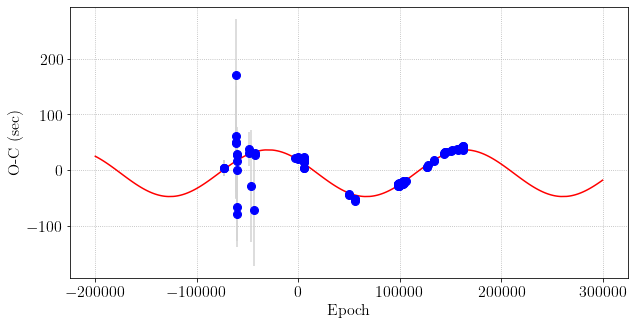

In [16]:
#Plotgraph
fig=plt.figure(figsize=(10, 5))
plt.errorbar(x, y, yerr= dy, fmt='o', markersize=8, color='blue', ecolor='lightgray')
# create a line plot for the mapping function
plt.plot(x_range, y_range, '-', color='red')
#plt.plot(BJD_time, OC_s_ecc, lw=2, color='black')
#plt.xlim(-6000,6000)
#plt.ylim(-200,200)
#plt.ylim(-40,60)
plt.xlabel('Epoch')
plt.ylabel('O-C (sec)')
plt.grid(linestyle='dotted')
#####plt.title('O-C diagram: DP Leo')
#output_filename = os.path.splitext(__file__)[0] + '.png'
#plt.savefig(output_filename, dpi=1000)
plt.show()

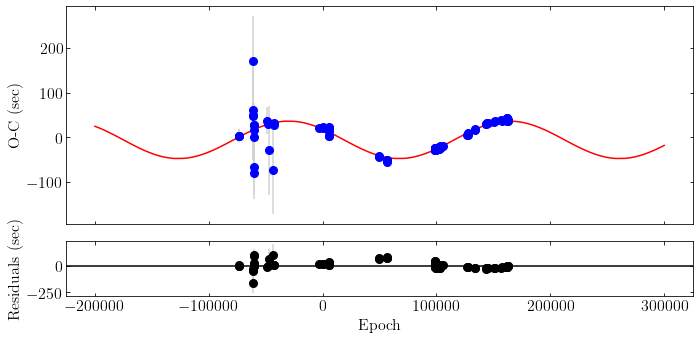

In [17]:
fig, (ax0, ax1) = plt.subplots(2, 1, gridspec_kw={'height_ratios': [4, 1]}, sharex=True, sharey=False, figsize=(10, 5), tight_layout=True)
plt.xlabel('Epoch')

ax0.tick_params(direction='in', which='both', bottom='on',top='on', right = 'on')
ax1.tick_params(direction='in', which='both', bottom='on',top='on', right = 'on')

ax0.errorbar(x, y, yerr= dy, fmt='o', markersize=8, color='blue', ecolor='lightgray')
ax0.plot(x_range, y_range, '-', color='red')

ax0.set_ylabel('O-C (sec)')
ax1.set_ylabel('Residuals (sec)')


Residual = y_line - y

ax1.errorbar(x, Residual, yerr= dy, fmt='o', markersize=8, color='black', ecolor='lightgray')

ax1.axhline(y=0, color='black', linestyle='-')

plt.show()